# Global stuff

In [110]:
import os
import glob
import re
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import re



# Functions

In [111]:
import os                                                                                                                                                
 
def read_single_file_with_keyword(folder_path, filename_search):
    file_path = os.path.join(folder_path, f"{filename_search}")

    try:
        with open(file_path, 'r') as file:
            # Read and parse the data from the file
            # Assume the data format includes 'q_nm^-1' and 'I'
            data = {
                "q_nm^-1": [],  # List of q values
                "I": [],  # List of corresponding I values
                "sigma": []  # List of corresponding sigma values
            }

            for i, line in enumerate(file):
                if line.startswith("# Timer:"):  # Check if the line starts with '# Timer:'
                    try:
                        # Remove '#' and split the line into key-value pairs
                        metadata_str = line[1:].strip().split(",")  # Remove '#' and split by commas

                        # Initialize metadata variables
                        timer, bstop, ctemp, I0 = None, None, None, None

                        # Parse key-value pairs
                        for pair in metadata_str:
                            pair = pair.strip()  # Clean up whitespace
                            if ":" not in pair:
                                print(f"Warning: Malformed metadata pair on line {i + 1}: {pair}")
                                continue  # Skip malformed pairs
                            
                            key, value = pair.split(":", 1)  # Split into key and value
                            key = key.strip().lower()  # Standardize the key
                            try:
                                value = float(value.strip())  # Convert value to float
                            except ValueError:
                                print(f"Error: Non-numeric value for key '{key}' on line {i + 1}: {pair}")
                                continue  # Skip invalid values

                            # Assign values to variables based on keys
                            if key == "timer":
                                timer = value
                            elif key == "bstop":
                                bstop = value
                            elif key == "ctemp":
                                ctemp = value
                            elif key == "i0":
                                I0 = value

                        # Verify all metadata were extracted
                        if None in (timer, bstop, ctemp, I0):
                            print(f"Error: Missing metadata values on line {i + 1}: {line.strip()}")
                        else:
                            print(f"Metadata parsed successfully: Timer={timer}, bstop={bstop}, ctemp={ctemp}, I0={I0}")

                    except Exception as e:
                        print(f"Error parsing metadata on line {i + 1}: {line.strip()}")
                        print(f"Exception: {e}")
                    continue





                if line.startswith("#"):  # Skip other comments if any
                    continue

                parts = line.strip().split()  #  data is whitespace-separated
                if len(parts) >= 3:
                    q_value = float(parts[0])
                    I_value = float(parts[1])
                    I_sigma = float(parts[2])
                    # Append values to the data dictionary
                    data["q_nm^-1"].append(q_value)
                    data["I"].append(I_value)
                    data["sigma"].append(I_sigma)

            return data, timer, bstop, ctemp, I0

    except FileNotFoundError:
        print(f"File not found: {file_path}")
        return None, None, None, None, None

import os
import re

def search_dat_files_with_keywords(folder_path, keyword, samp_bkg_keyword):
    # Create a regular expression pattern to match the keyword and bkg_keyword in the filename
    
    #pattern = re.compile(f"{samp_bkg_keyword}{keyword}_", re.IGNORECASE) # exact match
    pattern = re.compile(f".*{re.escape(samp_bkg_keyword)}.*{re.escape(keyword)}.*", re.IGNORECASE)

    #print(f"Pattern: {pattern.pattern}")

    matching_dat_files = []

    # List files in the folder (not including subfolders)
    for file in os.listdir(folder_path):
        if pattern.match(file) and file.endswith('.dat'):
            matching_dat_files.append(file)

    #print(f"Found {len(matching_dat_files)} files matching the pattern '{pattern.pattern}'")
    return matching_dat_files


# Porod function

In [112]:
import numpy as np
import scipy.optimize as opt

    # Define the generalized Porod function
def porod_model(q, A, alpha):
    return A * q**-alpha

def fit_and_subtract_porod(q, Iq, q_range):
    """
    Fit the Porod region (I(q) ~ A * q^(-alpha)) in the given q_range and subtract it from I(q).

    Parameters:
    q : array-like
        Scattering vector values.
    Iq : array-like
        Intensity values corresponding to q.
    q_range : tuple
        (q_min, q_max) range for fitting the Porod region.

    Returns:
    Iq_subtracted : array-like
        Intensity data after subtracting the fitted Porod contribution.
    A_fit : float
        Fitted Porod constant.
    alpha_fit : float
        Fitted Porod exponent.
    """
    # Select q values within the specified Porod region
    mask = (q >= q_range[0]) & (q <= q_range[1])
    q_fit = q[mask]
    Iq_fit = Iq[mask]



    # Initial guess for A and alpha
    A_guess = np.mean(Iq_fit / q_fit**-3.6)  # Assuming initial alpha ~ 4
    alpha_guess = 3.6  # Typical Porod exponent

    # Fit the data
    popt, _ = opt.curve_fit(porod_model, q_fit, Iq_fit, p0=[A_guess, alpha_guess])

    # Extract fitted parameters
    A_fit, alpha_fit = popt

    # Compute the fitted Porod intensity for all q values
    Iq_porod = porod_model(q, A_fit, alpha_fit)

    # Subtract the fitted Porod contribution
    Iq_subtracted = Iq - Iq_porod

    # plot
    plt.figure()
    plt.loglog(q, Iq, label='Data', marker='o', linestyle='None', color='k', markersize=4)

    plt.loglog(q_fit, Iq_fit, label='Data', marker='o', linestyle='None', color='m', markersize=4)
    plt.loglog(q, Iq_porod, label='Porod fit', color='red', linewidth=2)
    plt.loglog(q, Iq_subtracted, label='Data - Porod', marker='o', linestyle='None', color='g', markersize=4)
    plt.xlabel('q (nm^-1)')
    plt.ylabel('I(q)')
    plt.legend()
    plt.show

    return A_fit, alpha_fit


# fitting functions

In [113]:
from bumps.names import Parameter
from bumps.fitters import fit

import numpy as np
import os
import shutil
import glob
import matplotlib.pyplot as plt
import pandas as pd

import sasmodels
from sasmodels.core import load_model
from sasmodels.bumps_model import Model, Experiment
import bumps
#import sas

#from pptx import Presentation
#from pptx.util import Inches, Pt


kernel = sasmodels.core.load_model("broad_peak")


scale = Parameter(1, name='scale', fixed=True)
background = Parameter(0.0, name='background').range(0, 10)
porod_scale = Parameter(0.9, name='porod_scale').range(0, 10)
porod_exp = Parameter(4, name='porod_exp').range(0, 4)
peak_scale = Parameter(0.1, name='peak_scale').range(0, 10)
correlation_length = Parameter(7.6, name='correlation_length').range(0, 10)
peak_pos = Parameter(0.31, name='peak_pos').range(0, 0.311)
width_exp = Parameter(2.0, name='width_exp').range(0, 2)
shape_exp = Parameter(1, name='shape_exp').range(0.999, 2)



# Set up the model with the specified parameters
model = Model(model=kernel,
              scale=scale,
              background=background,
              porod_scale=porod_scale,
              porod_exp=porod_exp,
              peak_scale=peak_scale,
              correlation_length=correlation_length,
              peak_pos=peak_pos,
              width_exp=width_exp,
              shape_exp=shape_exp)

In [114]:
import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sasmodels.data import Data1D

# Add custom Python libraries to sys.path (if necessary)
sys.path.append('/Users/akmaurya/Desktop/Python_library')
from SWAXS_functions.set_plot_style import set_plot_style

def process_saxs_data(base_dir, sample_keyword, search_keywords, model, display=False):
    """Processes SAXS data files, performs Porod fitting and peak extraction."""

    # Setup paths
    folder_path_saxs = os.path.join(base_dir, "Correction/Subtracted")
    save_SAXS_sub_files = os.path.join(base_dir, "Analysis/Fitting")
    os.makedirs(save_SAXS_sub_files, exist_ok=True)

    # Initialize lists for storing results
    timer_values, CTEMP_values, I0_values, bstop_values = [], [], [], []
    porod_exp_values, porod_scale_values = [], []
    peak_pos_values, peak_pos_errors = [], []
    peak_scale_values, peak_scale_errors = [], []
    peak_area_list, peak_area_errors = [], []
    file_name_list = []

    # Process files for each keyword
    for keyword in search_keywords:
        print(f"\nProcessing keyword: {keyword}")
        matching_sample_files = search_dat_files_with_keywords(folder_path_saxs, keyword, sample_keyword)
        matching_sample_files.sort()
        print(f"Found {len(matching_sample_files)} files for keyword '{keyword}'")

        for filename_search_sample in matching_sample_files:
            print(f"\nProcessing file: {filename_search_sample}")
            sample_data, timer, bstop, CTEMP, I0 = read_single_file_with_keyword(folder_path_saxs, filename_search_sample)

            q_sample = np.array(sample_data["q_nm^-1"])
            I_sample_avg = np.array(sample_data["I"])
            I_sample_sigma = np.array(sample_data["sigma"])

            # Define q-value range and mask data
            min_q_value, max_q_value = 0.05, 1.6
            mask = (q_sample >= min_q_value) & (q_sample <= max_q_value)
            truncated_q_sample = q_sample[mask]
            truncated_I_sample_avg = I_sample_avg[mask]
            truncated_I_sample_sigma = I_sample_sigma[mask]

            print(f"Data size after truncation: {len(truncated_q_sample)} points")

            # Prepare data for fitting
            data_np = np.column_stack((truncated_q_sample, truncated_I_sample_avg, truncated_I_sample_sigma))
            data_np[:, 1] = np.where(data_np[:, 1] > 0, data_np[:, 1], 0)  # Ensure non-negative intensities
            sas_data_np = Data1D(x=data_np[:, 0], y=data_np[:, 1], dy=data_np[:, 2])

            # Fit and subtract Porod contribution
            q_range = (0.08, 0.1)  # Define q-range for fitting
            A_fitted, porod_fitted = fit_and_subtract_porod(truncated_q_sample, sas_data_np.y, q_range)
            Iq_porod = porod_model(truncated_q_sample, A_fitted, porod_fitted)  # Porod intensity

            # Extract peak signal after subtraction
            y_peak = sas_data_np.y #- Iq_porod
            y_peak_sigma = sas_data_np.dy

            y_peak = y_peak*truncated_q_sample*truncated_q_sample

            # Estimate peak parameters (placeholder values)
            peak_pos = max(y_peak)
            peak_pos_error = 0.01
            peak_scale = 0.1
            peak_scale_error = 0.01

            # Compute peak area and error
            # relace the <=0 values from y_peak to 0
            y_peak[y_peak <= 0] = 0
            peak_area = np.trapz(y_peak, truncated_q_sample)
            dqs = np.diff(truncated_q_sample)
            segment_variances = (0.5 * dqs)**2 * (y_peak_sigma[:-1]**2 + y_peak_sigma[1:]**2)

            peak_area = max(y_peak)
            peak_area_sigma = np.sqrt(np.sum(segment_variances))

            # Append extracted parameters to lists
            timer_values.append(timer)
            CTEMP_values.append(CTEMP)
            I0_values.append(I0)
            bstop_values.append(bstop)
            porod_exp_values.append(porod_fitted)
            porod_scale_values.append(A_fitted)
            peak_pos_values.append(peak_pos)
            peak_pos_errors.append(peak_pos_error)
            peak_scale_values.append(peak_scale)
            peak_scale_errors.append(peak_scale_error)
            peak_area_list.append(peak_area)
            peak_area_errors.append(peak_area_sigma)

            print(f"Peak area: {peak_area} ± {peak_area_sigma}")

            # Plot results if display is enabled
            if display:
                plt.figure(figsize=(8, 6))
                #plt.plot(sas_data_np.x, sas_data_np.y, 'o', markersize=3, color='k', label='Subtracted Data')
                #plt.plot(sas_data_np.x, Iq_porod, '-', color='m', label='Porod Fit')
                plt.plot(sas_data_np.x, y_peak, '-', color='g', label='Peak')
                plt.title(filename_search_sample)
                plt.xlabel("q [nm^-1]")
                plt.ylabel("Intensity [a.u.]")
                set_plot_style(plt.gca(), 20, 'q [nm^-1]', 'Intensity [a.u.]')
                plt.legend()
                plt.tight_layout()
                plt.show()

            # Save fitted data
            data = {
                "q_nm^-1": truncated_q_sample,
                "I_avg_sub": truncated_I_sample_avg,
                "I_avg_sub_sigma": truncated_I_sample_sigma,
                "I_fit": truncated_I_sample_avg,
                "I_porod": Iq_porod,
                "I_peak": y_peak
            }
            df = pd.DataFrame(data)

            filename_base = filename_search_sample.split(".dat")[0]
            out_filename = f"{filename_base}_fitted.dat"
            dat_filename = os.path.join(save_SAXS_sub_files, out_filename)

            inst_parameters = f'Timer: {timer}, bstop: {bstop}, ctemp: {CTEMP}, I0: {I0}'
            fit_parameters = (
                f'Porod_exponent: {porod_fitted} ± {porod_fitted}',
                f'Porod_scale: {A_fitted} ± {A_fitted}',
                f'Peak_pos: {peak_pos} ± {peak_pos_error}',
                f'Peak area: {peak_area} ± {peak_area_sigma}'
            )
            headers = [
                f"filename: {filename_search_sample}",
                "background: subtracted",
                "Empty: subtracted",
                inst_parameters,
                *fit_parameters,
                "q_nm^-1 ------ I_avg_subtracted ------ I_avg_subtracted_sigma ------ I_fit ------ I_porod ------ I_peak",
            ]
            with open(dat_filename, 'w') as f:
                f.write('\n'.join(['# ' + header for header in headers]) + '\n')
                df.to_csv(f, sep='\t', index=False, header=False)

            file_name_list.append(out_filename)
            plt.savefig(os.path.join(save_SAXS_sub_files, f"{filename_base}.png"))

    # Save summary results to an Excel file
    print(f"Lengths: filename={len(file_name_list)}, timer={len(timer_values)}, CTEMP={len(CTEMP_values)}, I0={len(I0_values)}, bstop={len(bstop_values)}, peak_pos={len(peak_pos_values)}, porod_exp={len(porod_exp_values)}, porod_scale={len(porod_scale_values)}, peak_area={len(peak_area_list)}, peak_area_error={len(peak_area_errors)}")

    summary_filename = filename_base.split('_ctr')[0] + "fitting_results.xlsx"
    df_summary = pd.DataFrame({
        "filename": file_name_list,
        "timer": timer_values,
        "CTEMP": CTEMP_values,
        "I0": I0_values,
        "bstop": bstop_values,
        "peak_pos": peak_pos_values,
        "porod_exp": porod_exp_values,
        "porod_scale": porod_scale_values,
        "peak_area": peak_area_list,
        "peak_area_error": peak_area_errors
    })
    df_summary.to_excel(os.path.join(save_SAXS_sub_files, summary_filename), index=False)

# Ensure required functions are defined elsewhere:
# - search_dat_files_with_keywords
# - read_single_file_with_keyword
# - fit_and_subtract_porod
# - porod_model


# base 

In [115]:


base_dir = '/Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_SAXS_01'



# inputs


Processing keyword: _ctr0_
Found 1 files for keyword '_ctr0_'

Processing file: Run7_PE_RampT20_ctr0_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169619.49, bstop=6.112303333333333, ctemp=23.338906666666663, I0=20.976656666666667
Data size after truncation: 704 points
Peak area: 0.02760434849020731 ± 0.00015536947132477677


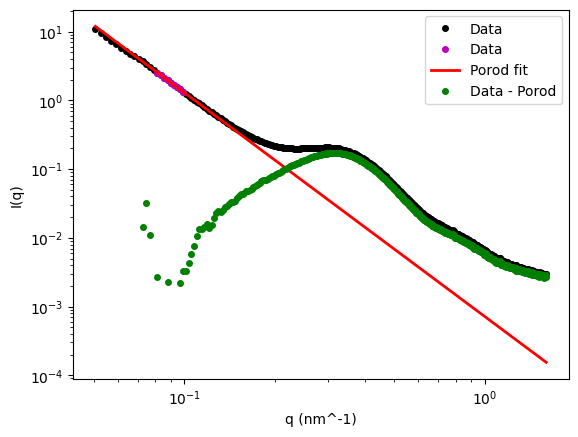

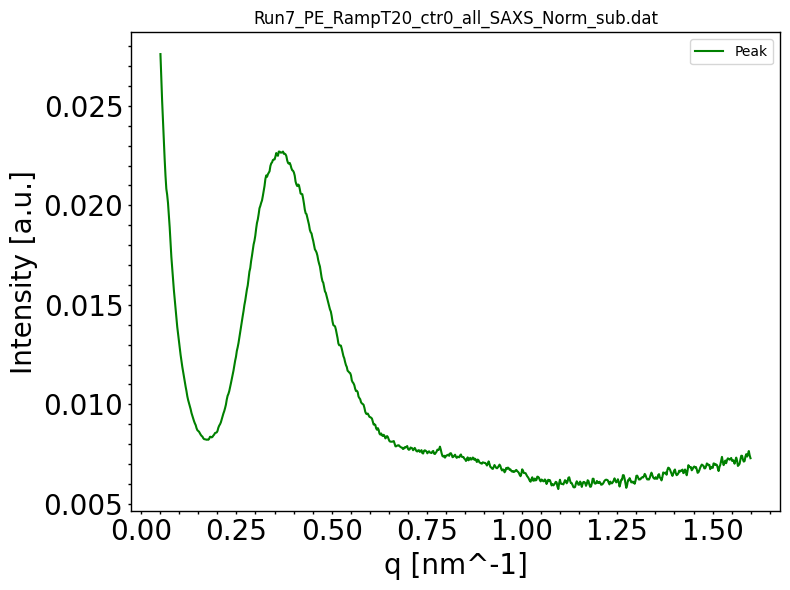


Processing keyword: _ctr1_
Found 1 files for keyword '_ctr1_'

Processing file: Run7_PE_RampT22_ctr1_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169664.5, bstop=6.105003333333333, ctemp=23.33892, I0=20.9714
Data size after truncation: 704 points
Peak area: 0.027588066950902938 ± 0.0001553421857839705


<Figure size 640x480 with 0 Axes>

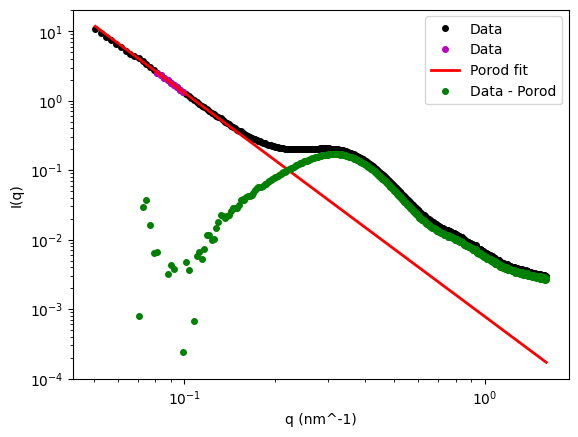

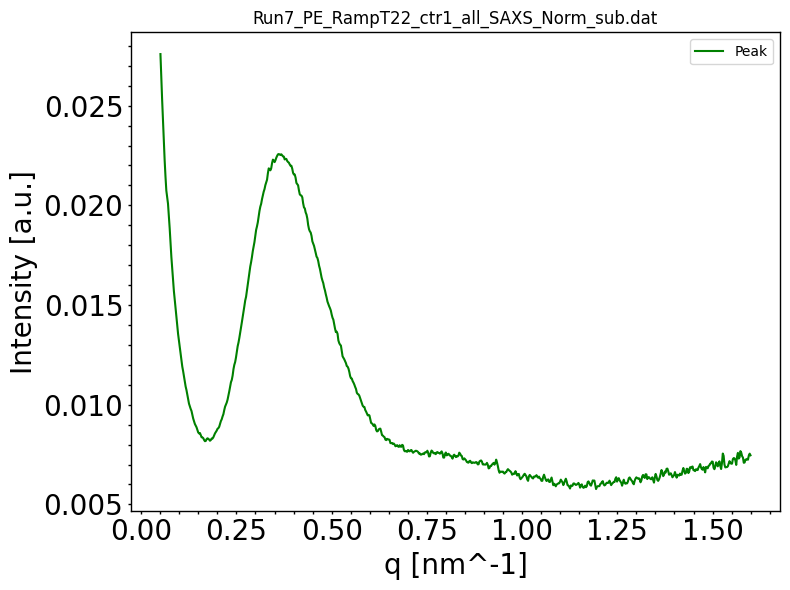


Processing keyword: _ctr2_
Found 1 files for keyword '_ctr2_'

Processing file: Run7_PE_RampT25_ctr2_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169740.65333333335, bstop=6.082703333333334, ctemp=28.724680000000003, I0=20.85784
Data size after truncation: 704 points
Peak area: 0.02787891486190035 ± 0.0001566065092555275


<Figure size 640x480 with 0 Axes>

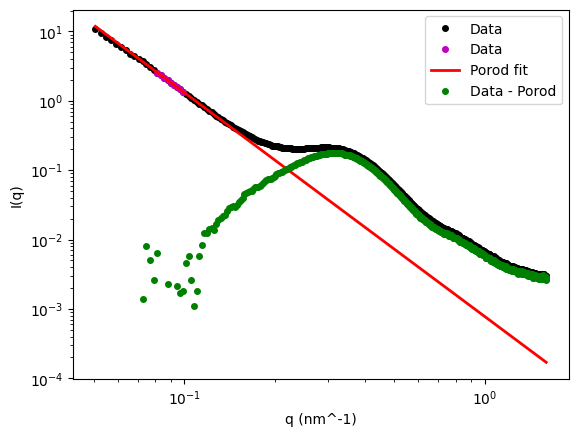

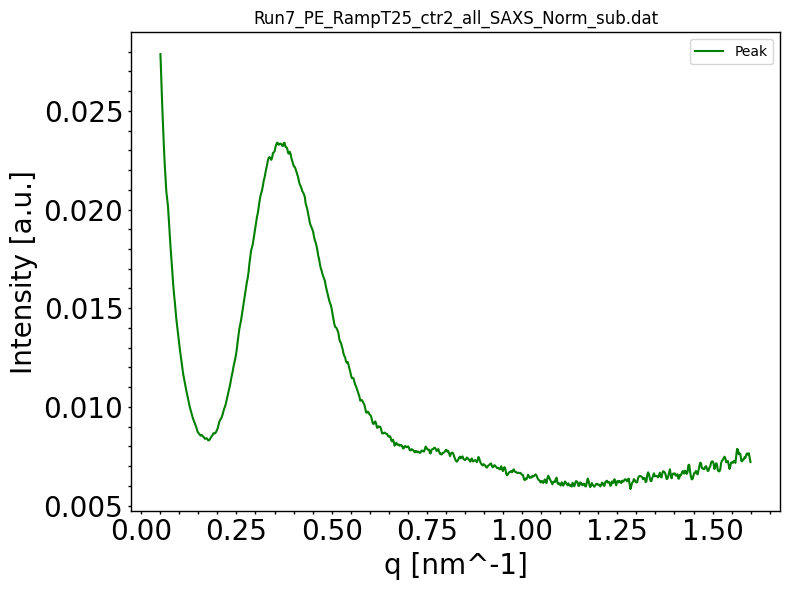


Processing keyword: _ctr3_
Found 1 files for keyword '_ctr3_'

Processing file: Run7_PE_RampT27_ctr3_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169785.9233333333, bstop=6.117249999999999, ctemp=29.292980333333333, I0=20.971663333333336
Data size after truncation: 704 points
Peak area: 0.027601559615511414 ± 0.0001553018952536442


<Figure size 640x480 with 0 Axes>

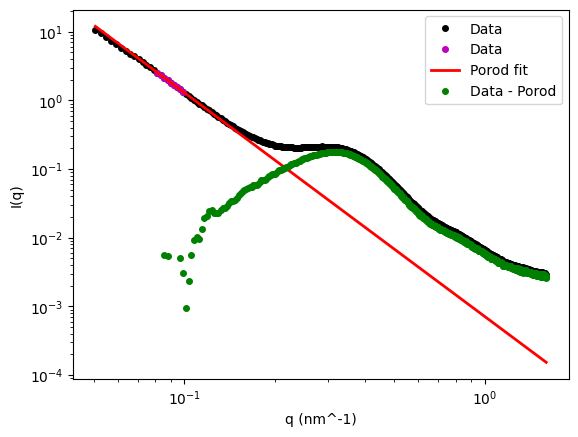

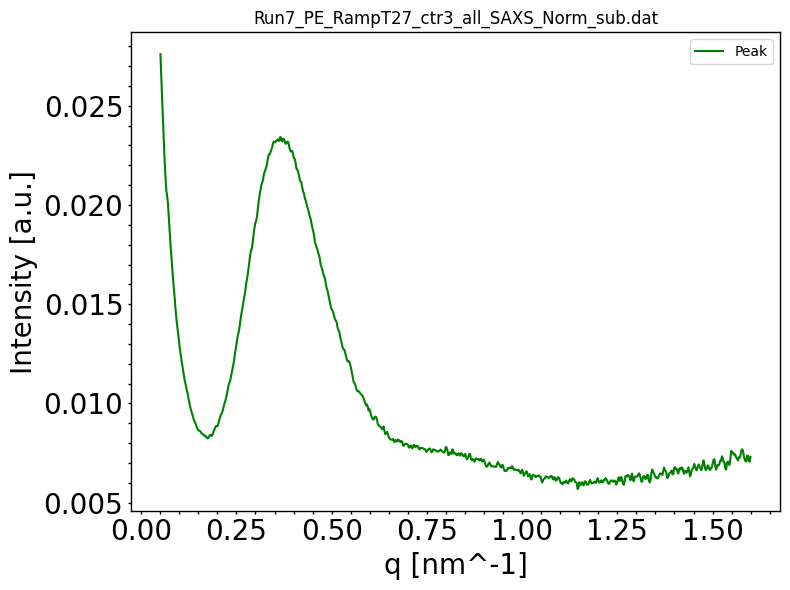


Processing keyword: _ctr4_
Found 1 files for keyword '_ctr4_'

Processing file: Run7_PE_RampT30_ctr4_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169857.6433333333, bstop=6.135423333333333, ctemp=33.402396, I0=21.03764
Data size after truncation: 704 points
Peak area: 0.027320889615805796 ± 0.00015437265341524875


<Figure size 640x480 with 0 Axes>

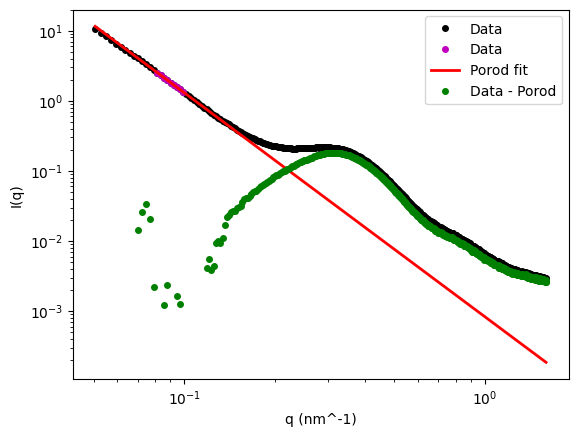

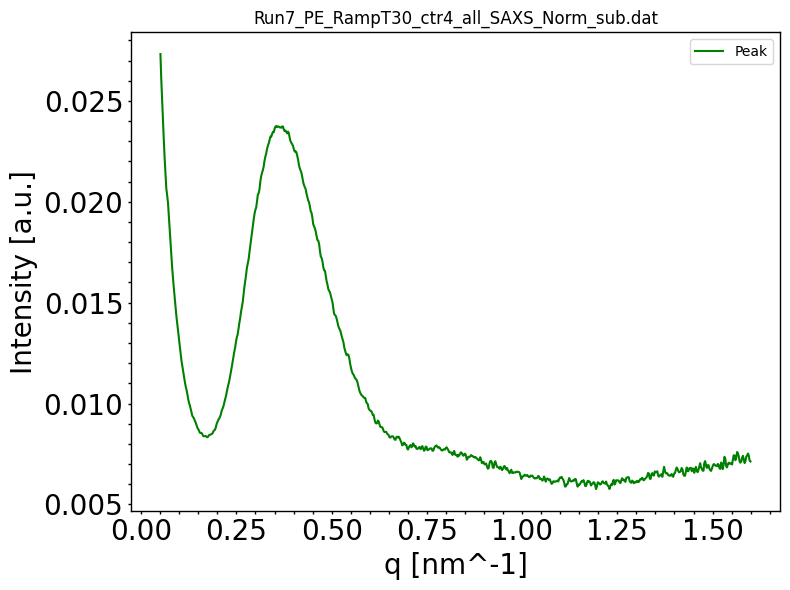


Processing keyword: _ctr5_
Found 1 files for keyword '_ctr5_'

Processing file: Run7_PE_RampT32_ctr5_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169902.64, bstop=6.122036666666666, ctemp=33.710713999999996, I0=21.00874333333333
Data size after truncation: 704 points
Peak area: 0.027335125922341424 ± 0.0001546552789709637


<Figure size 640x480 with 0 Axes>

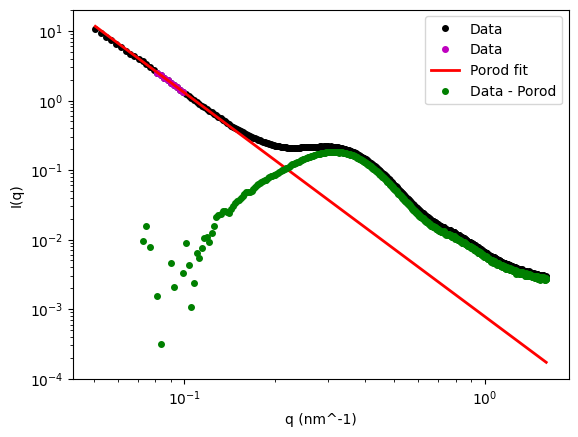

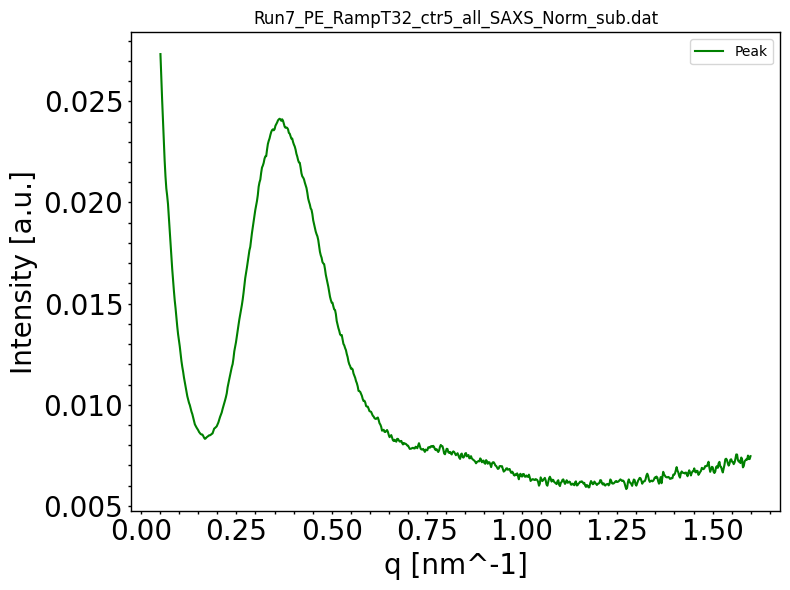


Processing keyword: _ctr6_
Found 1 files for keyword '_ctr6_'

Processing file: Run7_PE_RampT35_ctr6_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169977.01, bstop=6.105323333333334, ctemp=38.40748333333334, I0=20.935386666666666
Data size after truncation: 704 points
Peak area: 0.027412409663086935 ± 0.00015524050299371237


<Figure size 640x480 with 0 Axes>

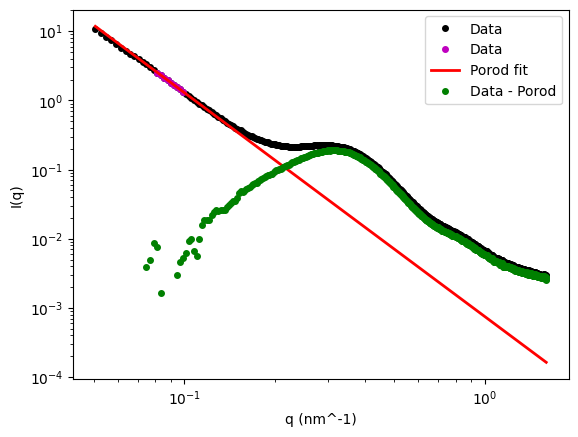

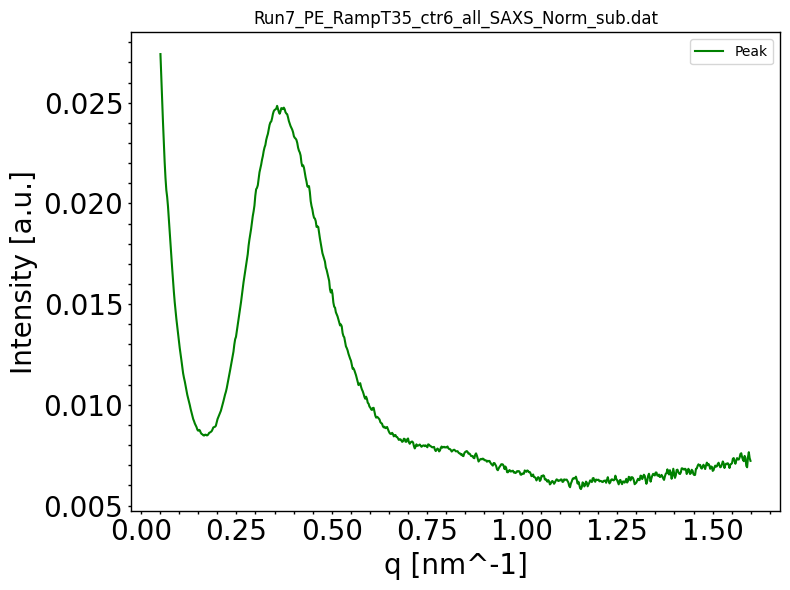


Processing keyword: _ctr7_
Found 1 files for keyword '_ctr7_'

Processing file: Run7_PE_RampT37_ctr7_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170022.05999999997, bstop=6.097713333333334, ctemp=38.28417833333333, I0=20.892516666666666
Data size after truncation: 704 points
Peak area: 0.02736153208021984 ± 0.00015560165654074292


<Figure size 640x480 with 0 Axes>

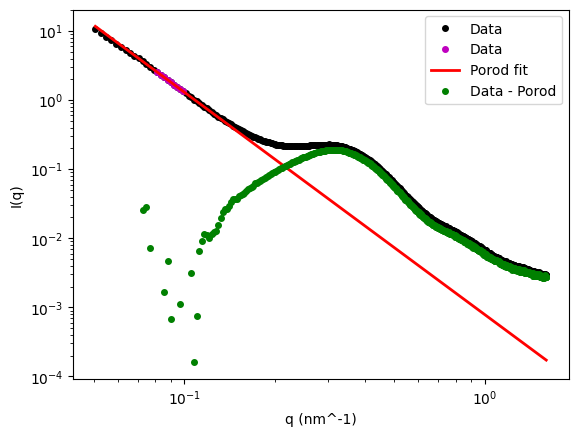

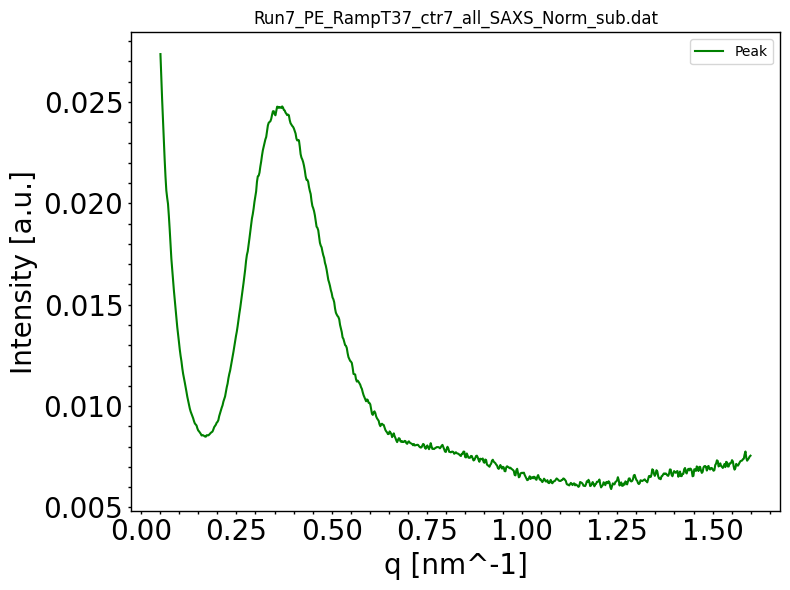


Processing keyword: _ctr8_
Found 1 files for keyword '_ctr8_'

Processing file: Run7_PE_RampT40_ctr8_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170104.51333333334, bstop=6.149440000000001, ctemp=43.30892933333334, I0=21.076883333333335
Data size after truncation: 704 points
Peak area: 0.027041294002918728 ± 0.00015331928889506495


<Figure size 640x480 with 0 Axes>

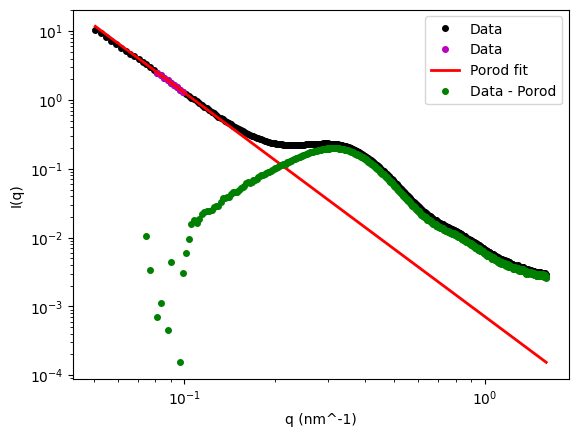

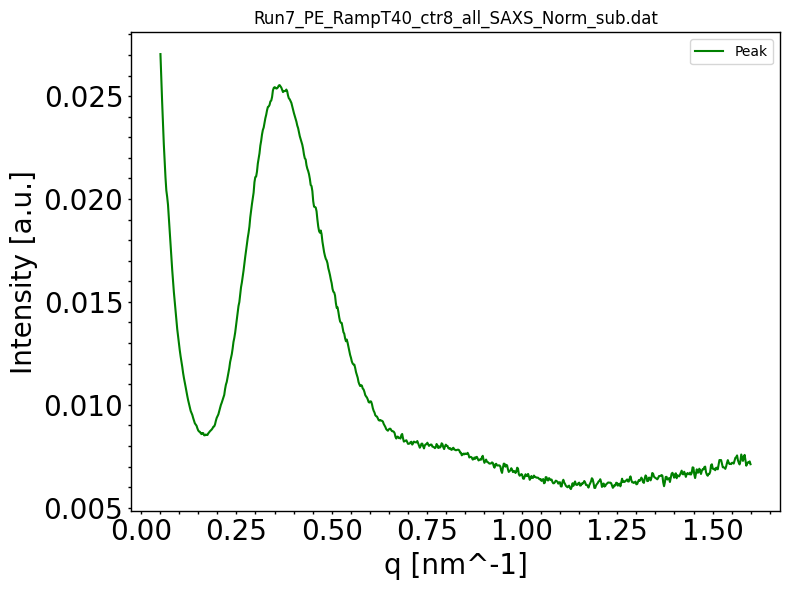


Processing keyword: _ctr9_
Found 1 files for keyword '_ctr9_'

Processing file: Run7_PE_RampT42_ctr9_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170148.93666666668, bstop=6.14104, ctemp=42.773029333333334, I0=21.052503333333334
Data size after truncation: 704 points
Peak area: 0.027144392833366022 ± 0.0001537000372765045


<Figure size 640x480 with 0 Axes>

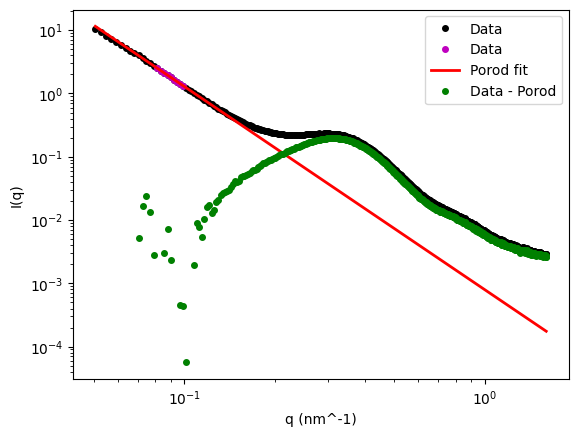

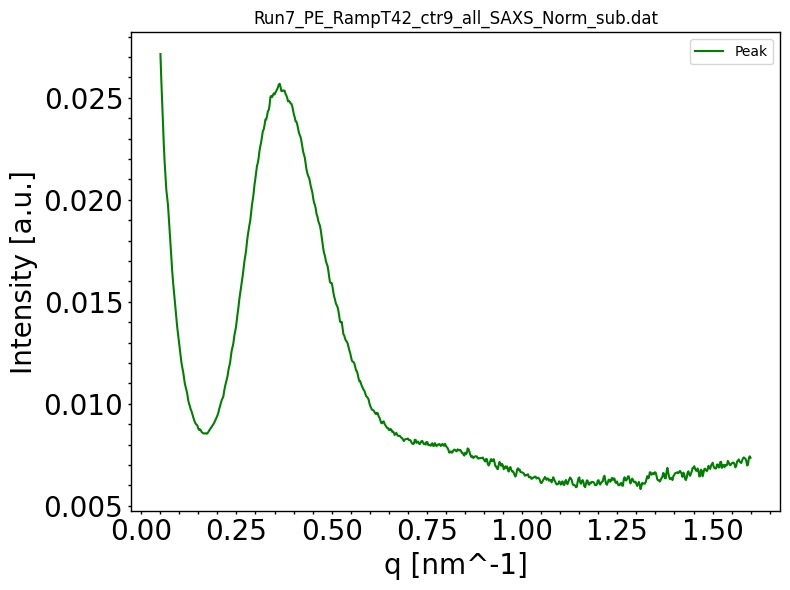


Processing keyword: _ctr10_
Found 1 files for keyword '_ctr10_'

Processing file: Run7_PE_RampT45_ctr10_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170222.68, bstop=6.1225, ctemp=48.113457000000004, I0=20.974663333333332
Data size after truncation: 704 points
Peak area: 0.027025333166551008 ± 0.000154203961093828


<Figure size 640x480 with 0 Axes>

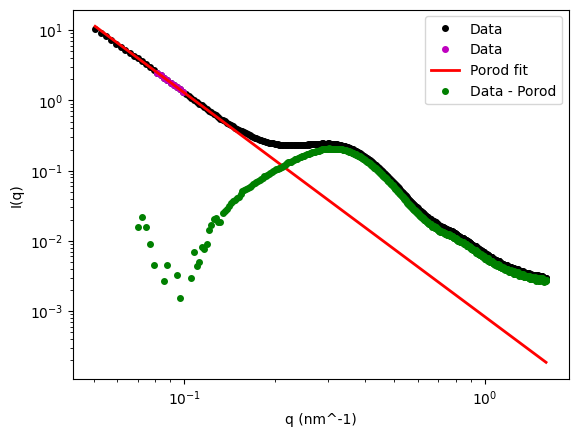

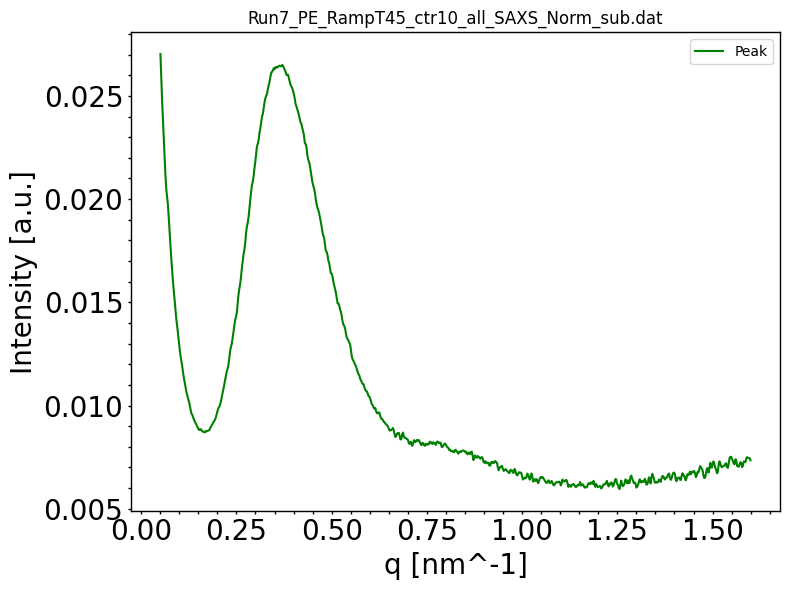


Processing keyword: _ctr11_
Found 1 files for keyword '_ctr11_'

Processing file: Run7_PE_RampT47_ctr11_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170266.80999999997, bstop=6.114033333333334, ctemp=47.45837366666666, I0=20.95266666666667
Data size after truncation: 704 points
Peak area: 0.02707022850753102 ± 0.00015425468312621281


<Figure size 640x480 with 0 Axes>

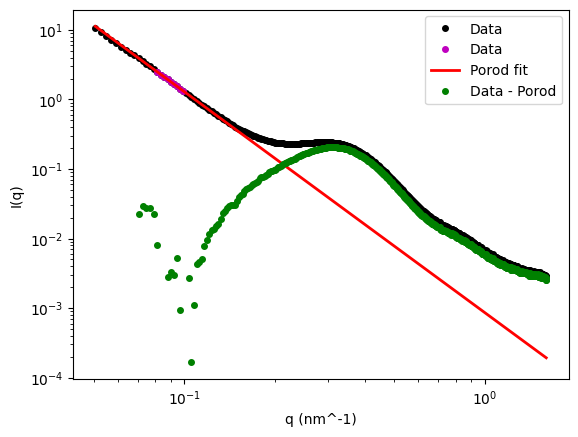

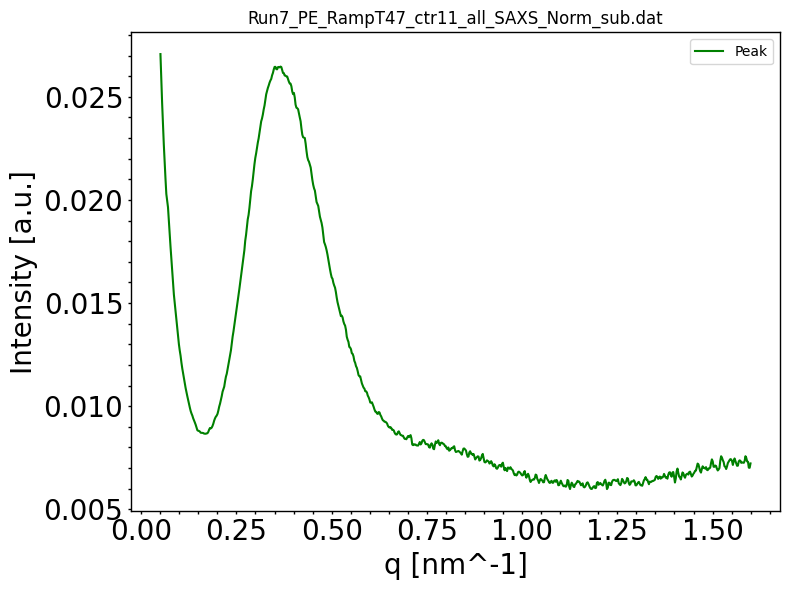


Processing keyword: _ctr12_
Found 1 files for keyword '_ctr12_'

Processing file: Run7_PE_RampT50_ctr12_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170326.75666666668, bstop=6.098033333333333, ctemp=50.734487, I0=20.872153333333333
Data size after truncation: 704 points
Peak area: 0.02725228873535186 ± 0.00015503359789931437


<Figure size 640x480 with 0 Axes>

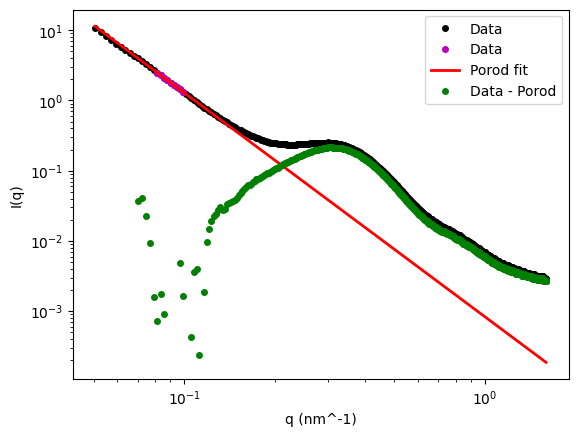

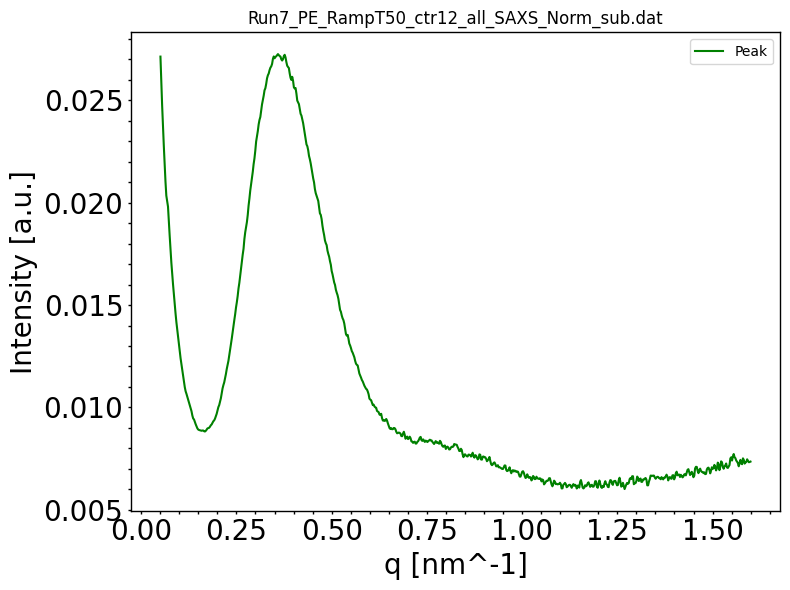


Processing keyword: _ctr13_
Found 1 files for keyword '_ctr13_'

Processing file: Run7_PE_RampT52_ctr13_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170407.21, bstop=6.158873333333333, ctemp=55.34498966666666, I0=21.115859999999998
Data size after truncation: 704 points
Peak area: 0.027868298692850645 ± 0.00015169453810532187


<Figure size 640x480 with 0 Axes>

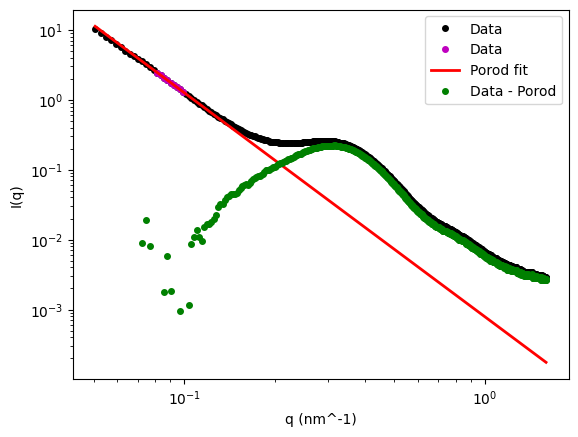

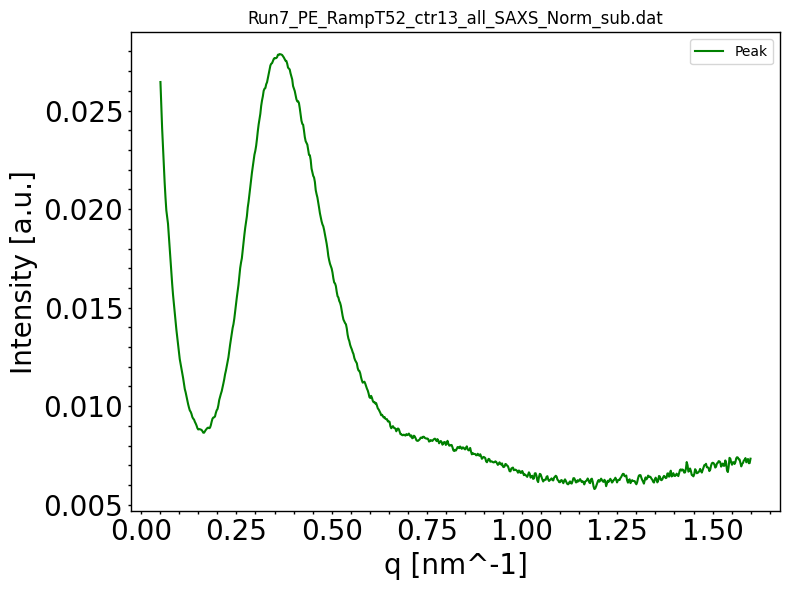


Processing keyword: _ctr14_
Found 1 files for keyword '_ctr14_'

Processing file: Run7_PE_RampT55_ctr14_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170452.27666666667, bstop=6.149746666666668, ctemp=55.148865, I0=21.046533333333333
Data size after truncation: 704 points
Peak area: 0.028110830651431346 ± 0.0001523559235436807


<Figure size 640x480 with 0 Axes>

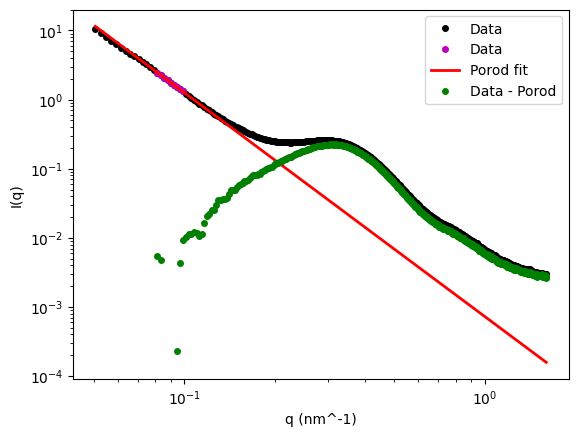

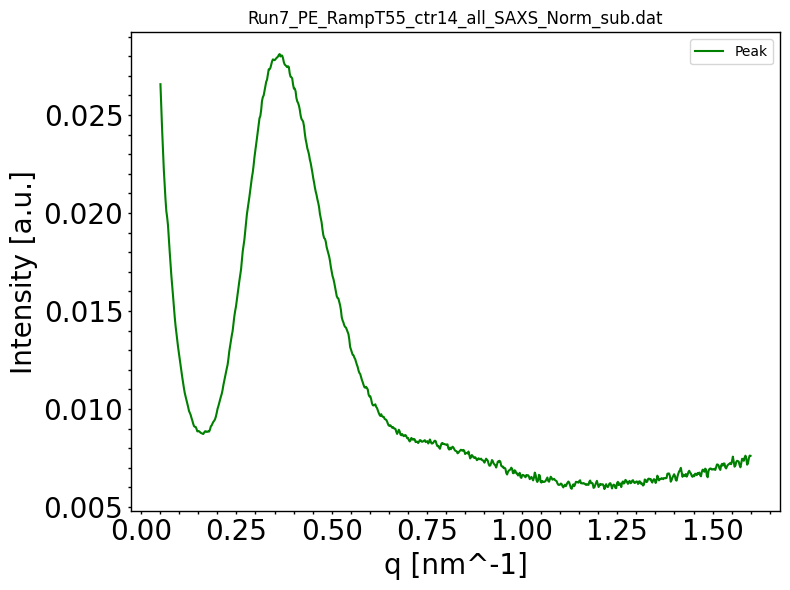


Processing keyword: _ctr15_
Found 1 files for keyword '_ctr15_'

Processing file: Run7_PE_RampT57_ctr15_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170503.70333333334, bstop=6.132446666666667, ctemp=57.56532666666667, I0=20.97945
Data size after truncation: 704 points
Peak area: 0.02891125606586177 ± 0.00015278368892515524


<Figure size 640x480 with 0 Axes>

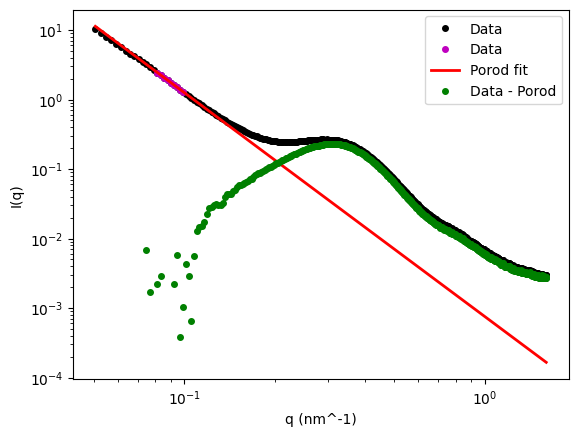

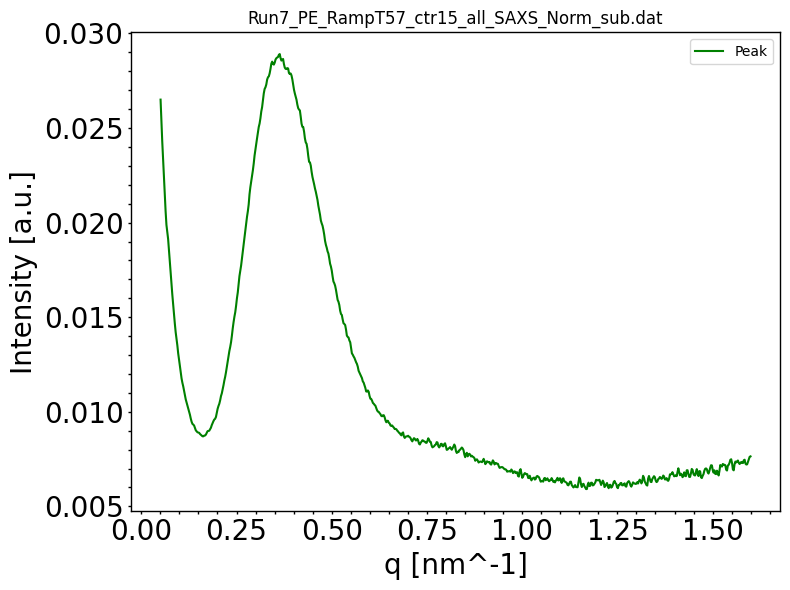


Processing keyword: _ctr16_
Found 1 files for keyword '_ctr16_'

Processing file: Run7_PE_RampT60_ctr16_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170576.15333333332, bstop=6.115553333333334, ctemp=62.55229566666667, I0=20.88702333333333
Data size after truncation: 704 points
Peak area: 0.02994253435725709 ± 0.00015291884817904088


<Figure size 640x480 with 0 Axes>

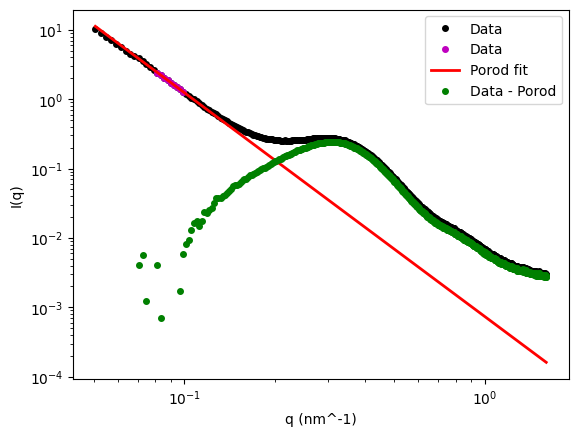

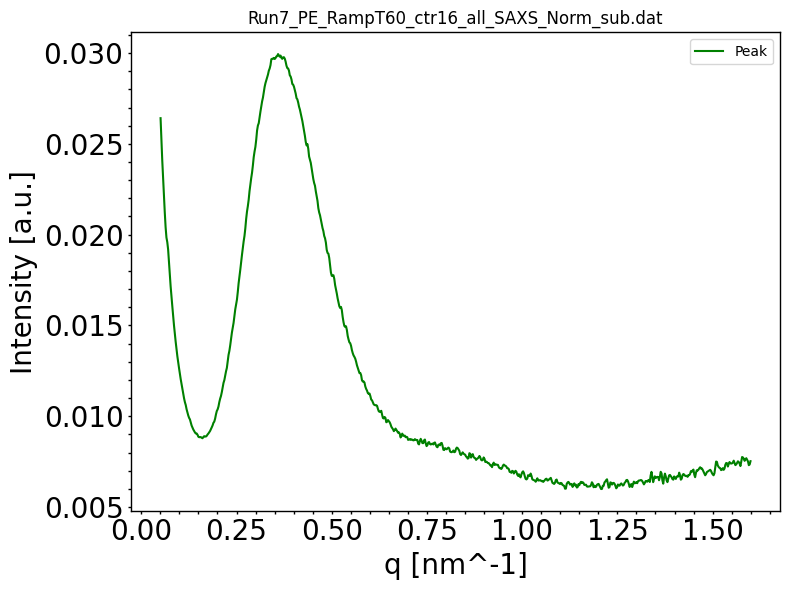


Processing keyword: _ctr17_
Found 1 files for keyword '_ctr17_'

Processing file: Run7_PE_RampT62_ctr17_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170621.05666666667, bstop=6.108123333333334, ctemp=62.43059433333334, I0=20.857853333333335
Data size after truncation: 704 points
Peak area: 0.0302127998688761 ± 0.00015305891054899406


<Figure size 640x480 with 0 Axes>

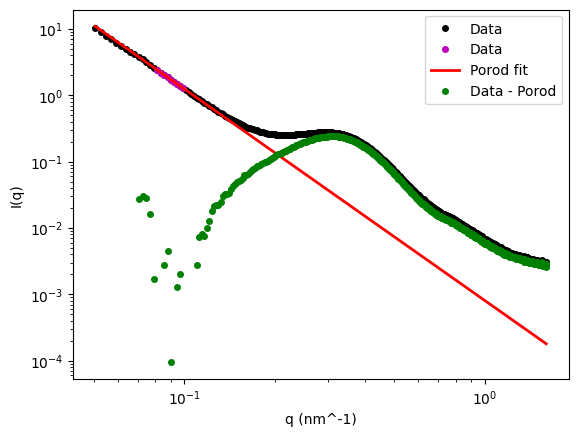

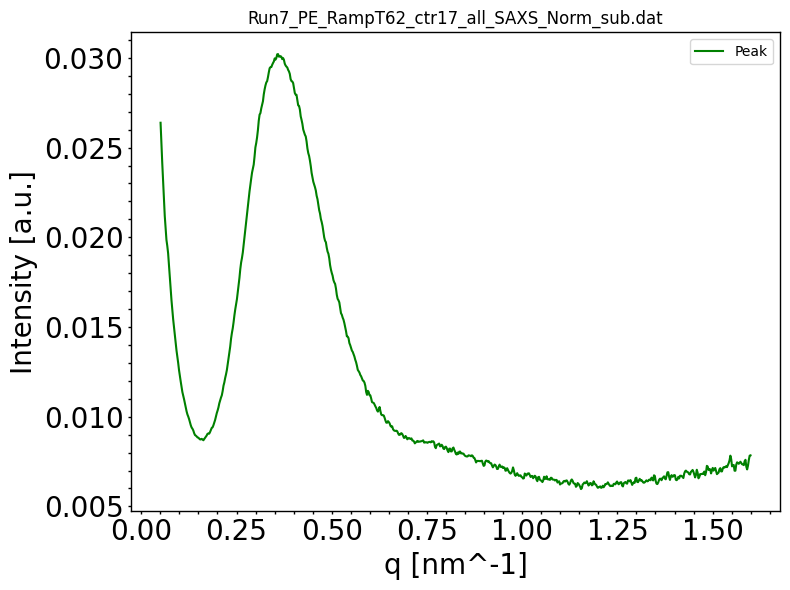


Processing keyword: _ctr18_
Found 1 files for keyword '_ctr18_'

Processing file: Run7_PE_RampT65_ctr18_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170670.41666666666, bstop=6.107896666666666, ctemp=64.80741633333332, I0=20.835113333333336
Data size after truncation: 704 points
Peak area: 0.030986807923747983 ± 0.00015284383125222818


<Figure size 640x480 with 0 Axes>

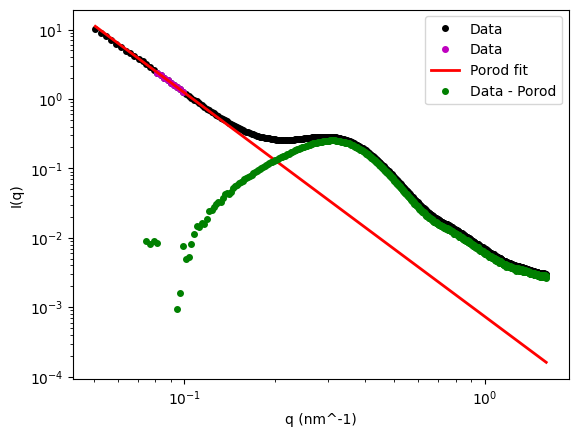

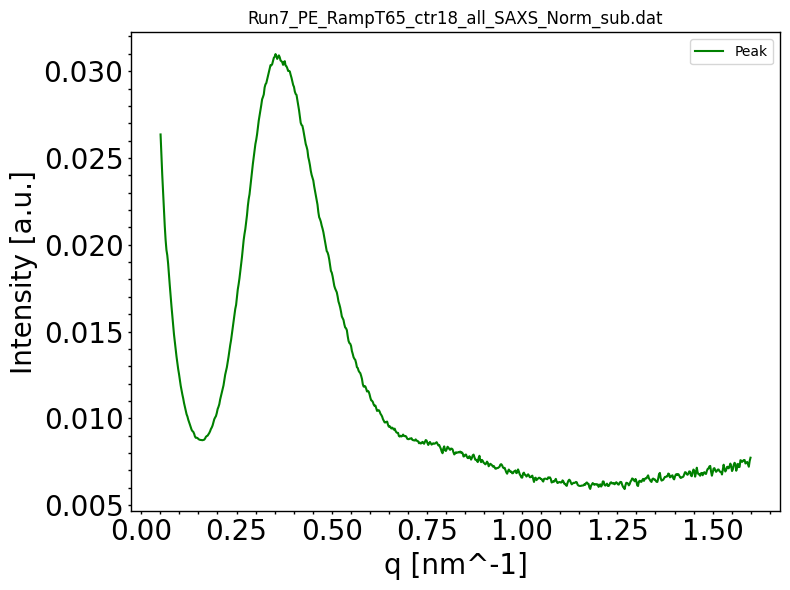


Processing keyword: _ctr19_
Found 1 files for keyword '_ctr19_'

Processing file: Run7_PE_RampT67_ctr19_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170738.87, bstop=6.141256666666666, ctemp=69.75322433333334, I0=20.99341
Data size after truncation: 704 points
Peak area: 0.031903232662391055 ± 0.0001508081149885905


<Figure size 640x480 with 0 Axes>

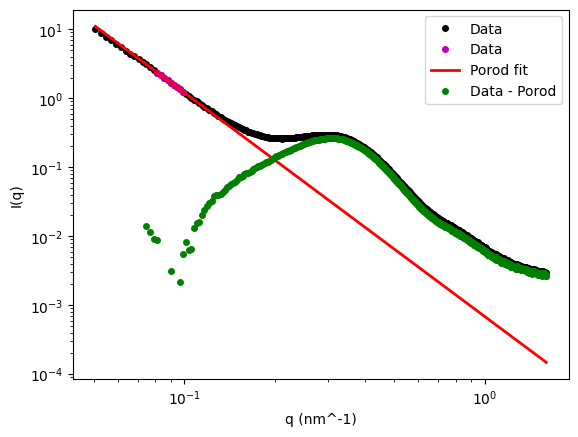

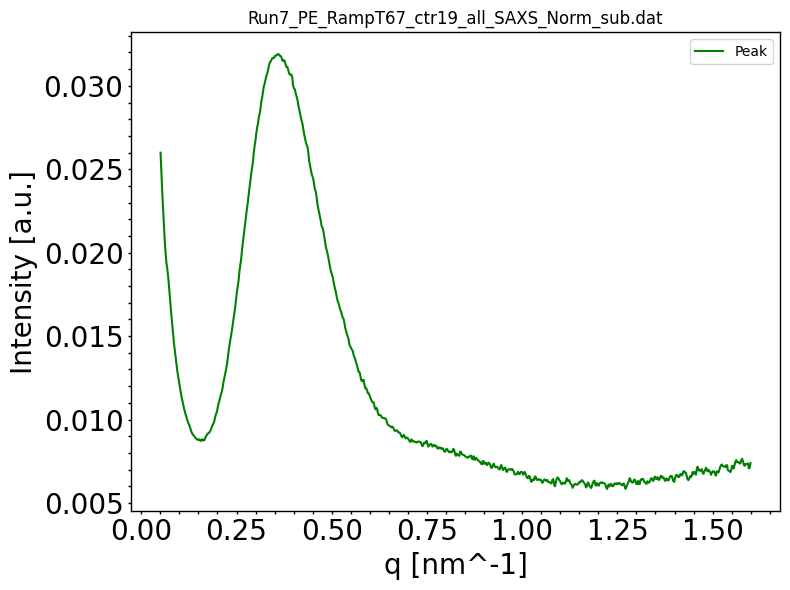


Processing keyword: _ctr20_
Found 1 files for keyword '_ctr20_'

Processing file: Run7_PE_RampT70_ctr20_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170818.94000000003, bstop=6.118473333333333, ctemp=72.22266666666667, I0=20.91987333333333
Data size after truncation: 704 points
Peak area: 0.033068289736112706 ± 0.00015128156225996275


<Figure size 640x480 with 0 Axes>

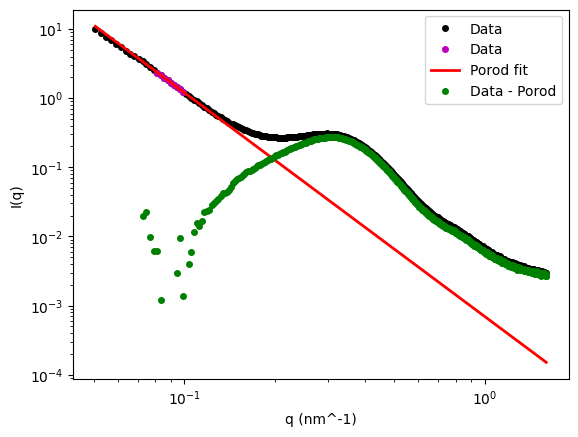

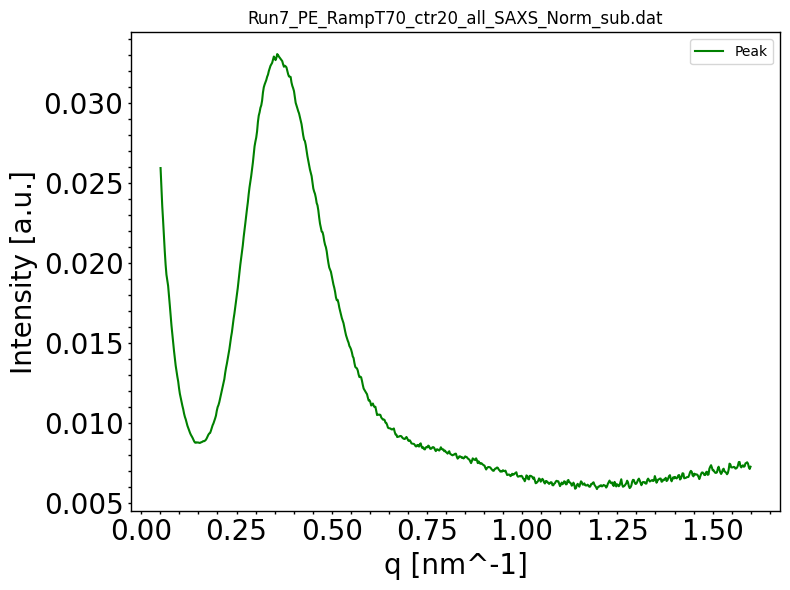


Processing keyword: _ctr21_
Found 1 files for keyword '_ctr21_'

Processing file: Run7_PE_RampT72_ctr21_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170899.0166666667, bstop=6.098956666666666, ctemp=74.645917, I0=20.815436666666667
Data size after truncation: 704 points
Peak area: 0.03412539771006721 ± 0.00015164830286008222


<Figure size 640x480 with 0 Axes>

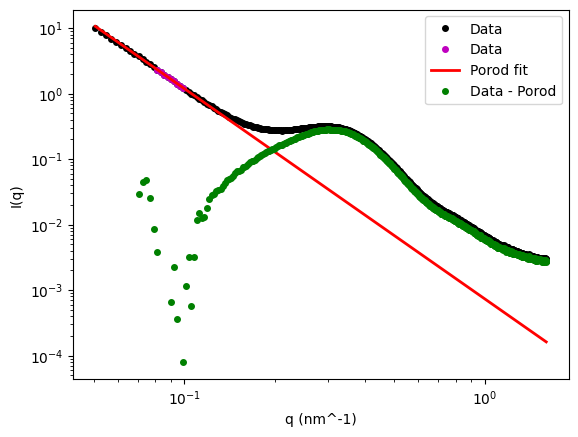

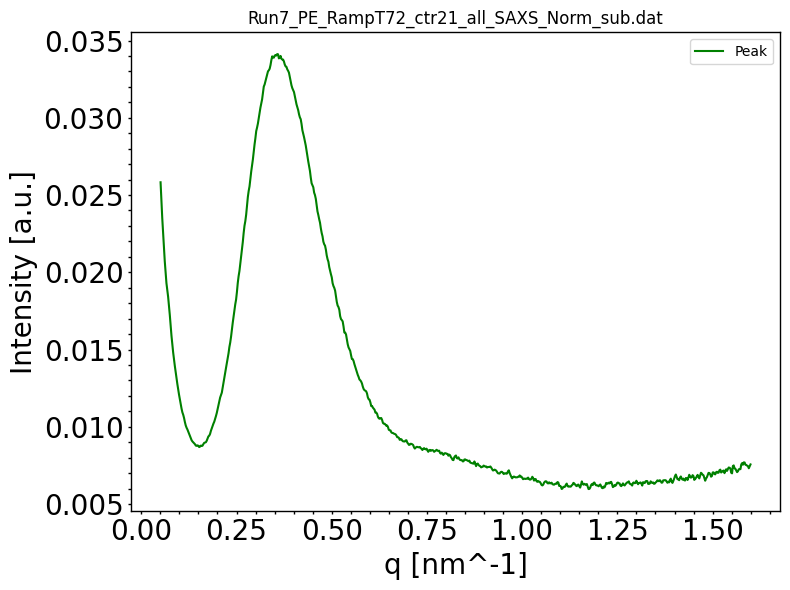


Processing keyword: _ctr22_
Found 1 files for keyword '_ctr22_'

Processing file: Run7_PE_RampT75_ctr22_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170979.46, bstop=6.111483333333333, ctemp=77.09877266666666, I0=20.8267
Data size after truncation: 704 points
Peak area: 0.03514727708922361 ± 0.00015121107743606166


<Figure size 640x480 with 0 Axes>

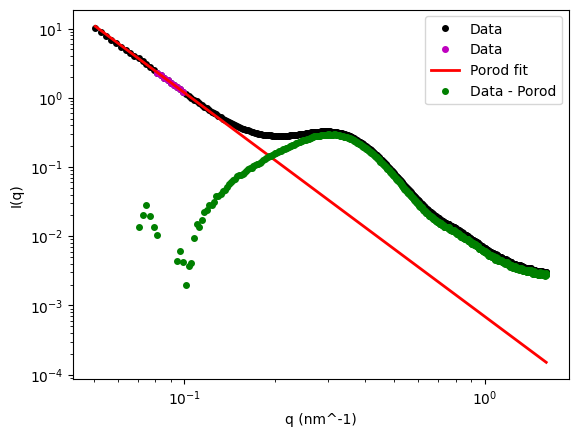

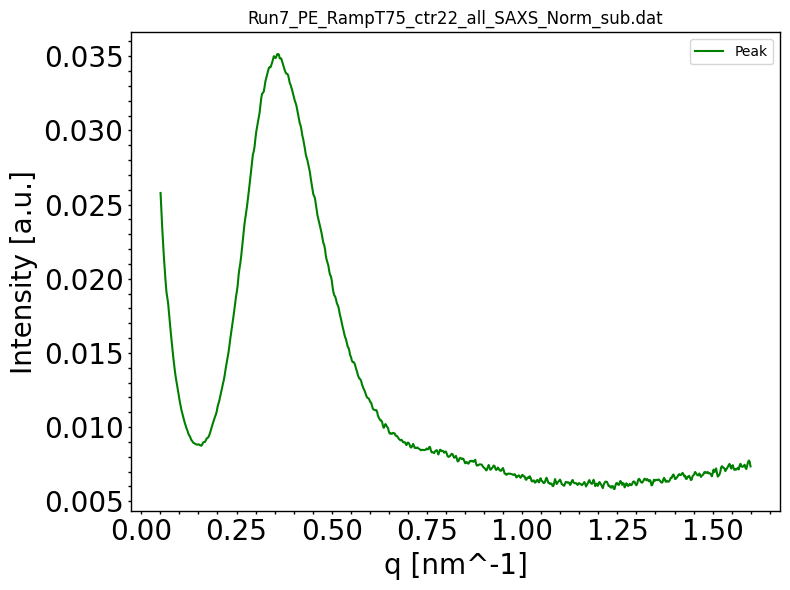


Processing keyword: _ctr23_
Found 1 files for keyword '_ctr23_'

Processing file: Run7_PE_RampT77_ctr23_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171061.97, bstop=6.153363333333334, ctemp=79.50071233333334, I0=20.986966666666664
Data size after truncation: 704 points
Peak area: 0.03592593094480493 ± 0.0001491838455617511


<Figure size 640x480 with 0 Axes>

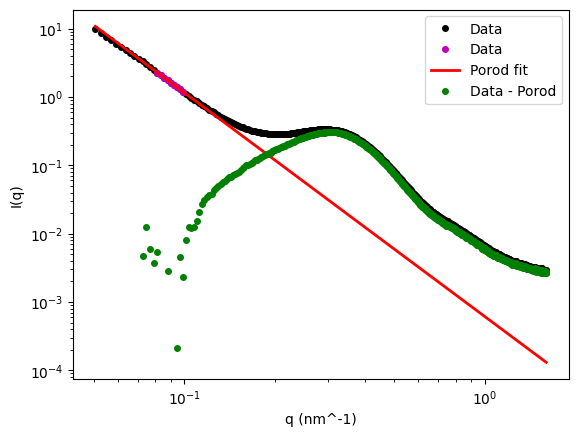

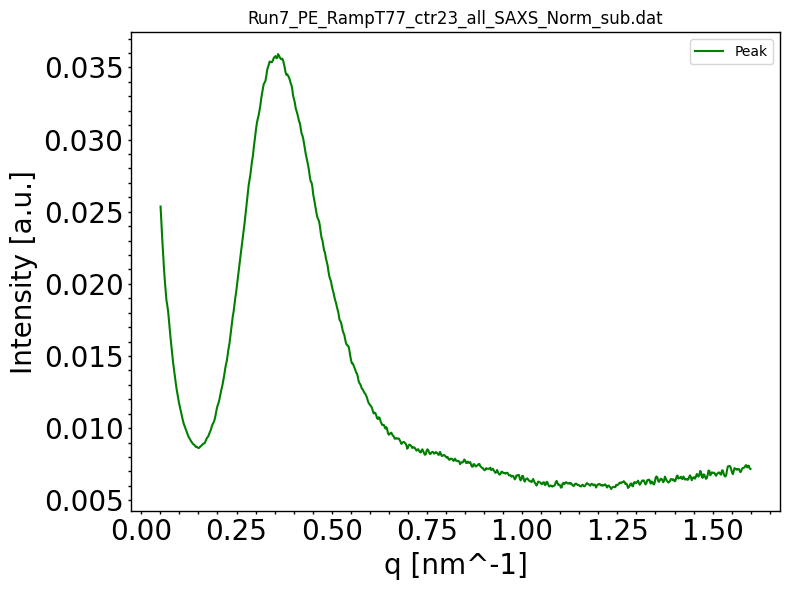


Processing keyword: _ctr24_
Found 1 files for keyword '_ctr24_'

Processing file: Run7_PE_RampT80_ctr24_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171145.66333333336, bstop=6.132556666666667, ctemp=81.918274, I0=20.86742333333333
Data size after truncation: 704 points
Peak area: 0.037262308760990445 ± 0.00014995007385076915


<Figure size 640x480 with 0 Axes>

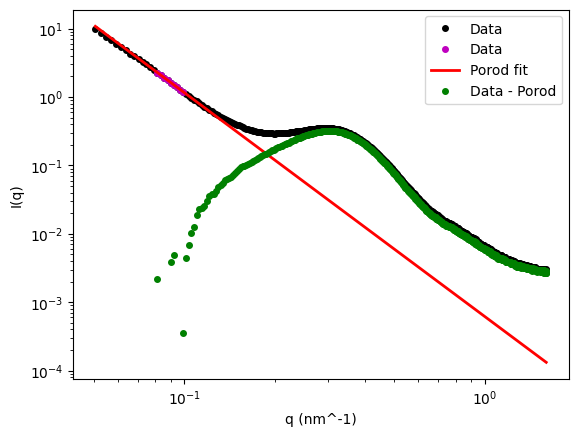

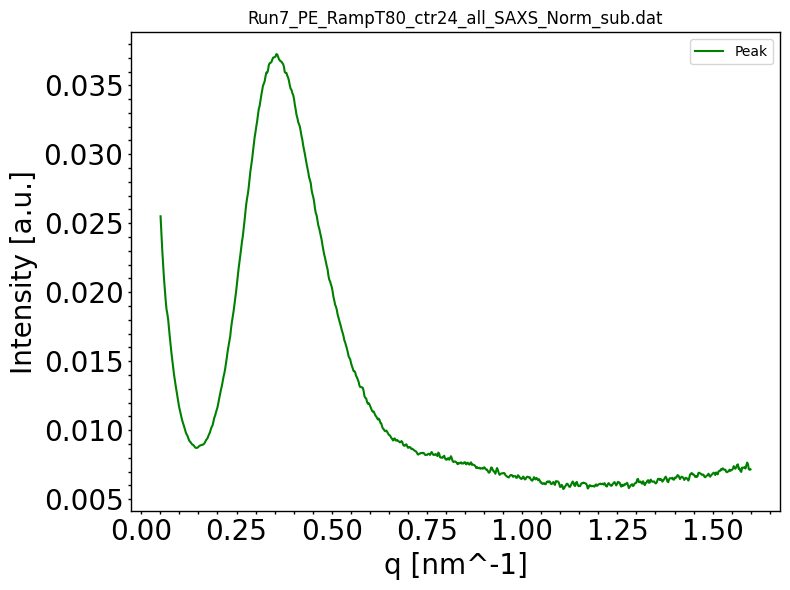


Processing keyword: _ctr25_
Found 1 files for keyword '_ctr25_'

Processing file: Run7_PE_RampT82_ctr25_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171232.22, bstop=6.108846666666667, ctemp=84.335126, I0=20.794539999999998
Data size after truncation: 704 points
Peak area: 0.038671162925328524 ± 0.00015021787442097604


<Figure size 640x480 with 0 Axes>

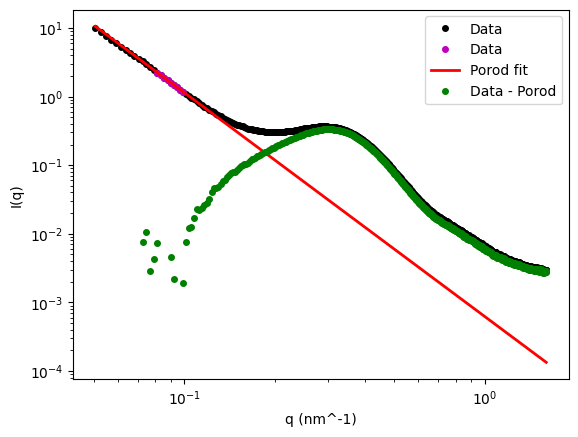

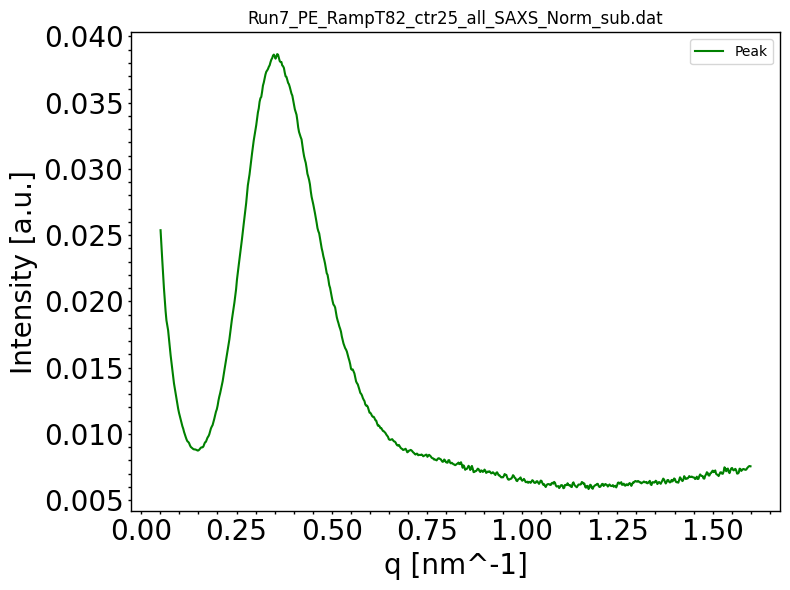


Processing keyword: _ctr26_
Found 1 files for keyword '_ctr26_'

Processing file: Run7_PE_RampT85_ctr26_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171319.19666666666, bstop=6.167433333333332, ctemp=86.746602, I0=20.979803333333333
Data size after truncation: 704 points
Peak area: 0.03969770442549787 ± 0.00014783116277584826


<Figure size 640x480 with 0 Axes>

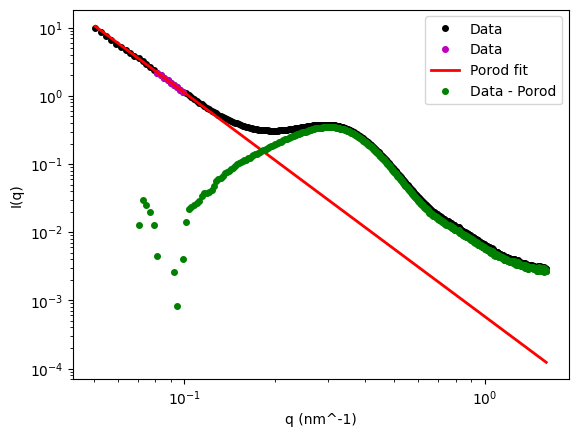

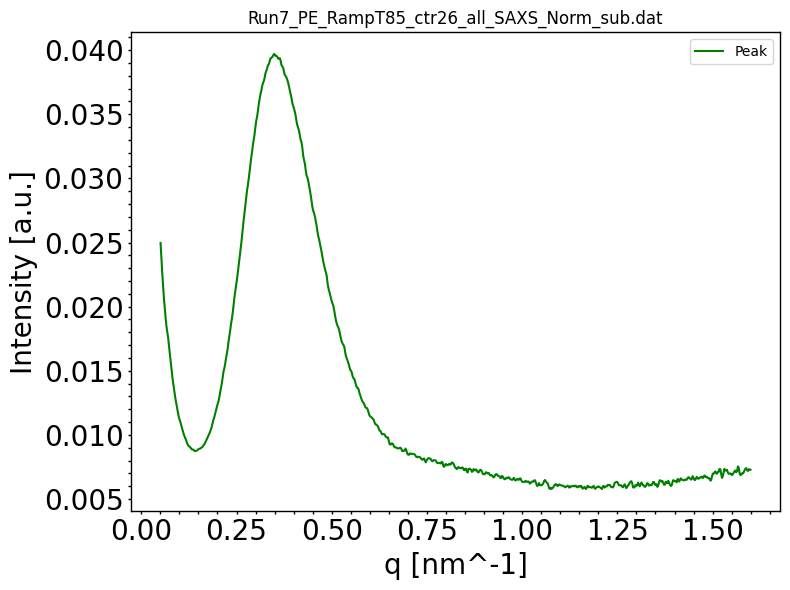


Processing keyword: _ctr27_
Found 1 files for keyword '_ctr27_'

Processing file: Run7_PE_RampT87_ctr27_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171407.45333333334, bstop=6.1397466666666665, ctemp=89.124326, I0=20.914023333333333
Data size after truncation: 704 points
Peak area: 0.04111881111620925 ± 0.0001483757161515179


<Figure size 640x480 with 0 Axes>

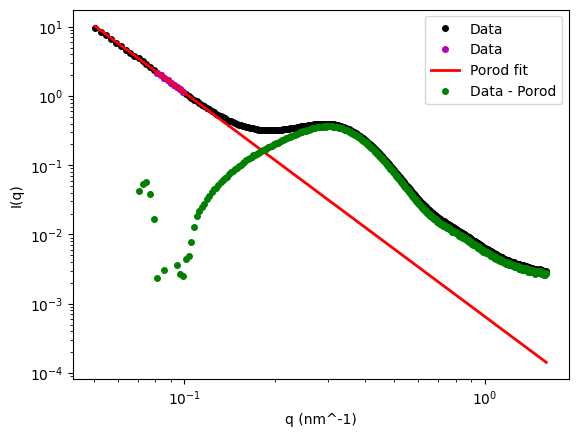

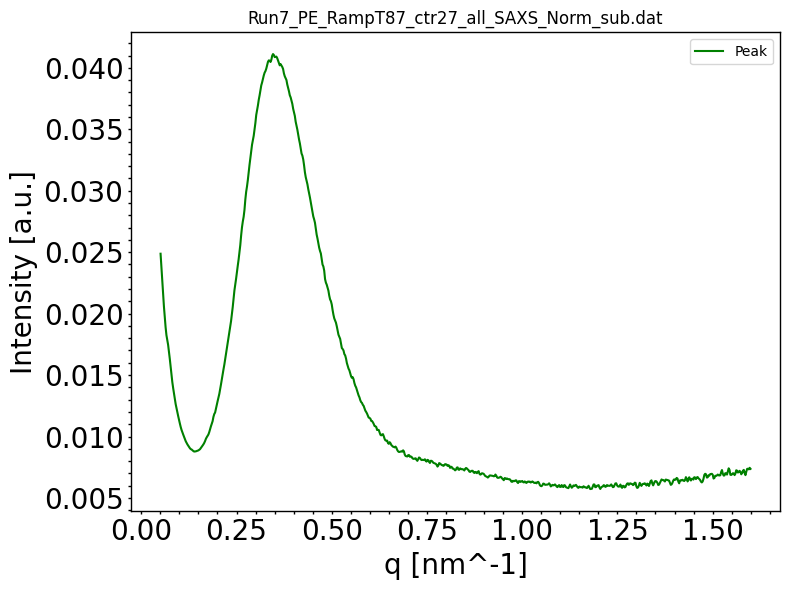


Processing keyword: _ctr28_
Found 1 files for keyword '_ctr28_'

Processing file: Run7_PE_RampT90_ctr28_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171496.07333333333, bstop=6.117173333333334, ctemp=91.56876866666666, I0=20.818369999999998
Data size after truncation: 704 points
Peak area: 0.0427995972258769 ± 0.00014869752362215813


<Figure size 640x480 with 0 Axes>

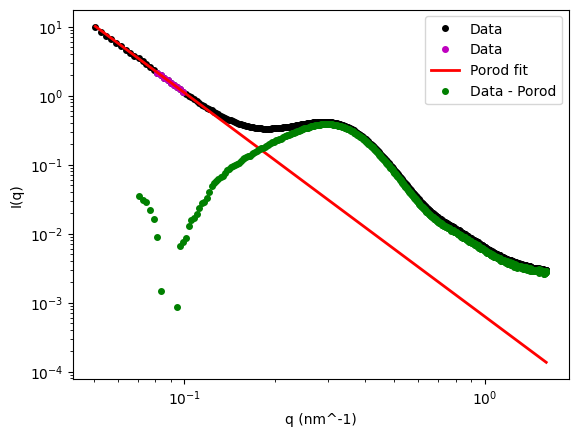

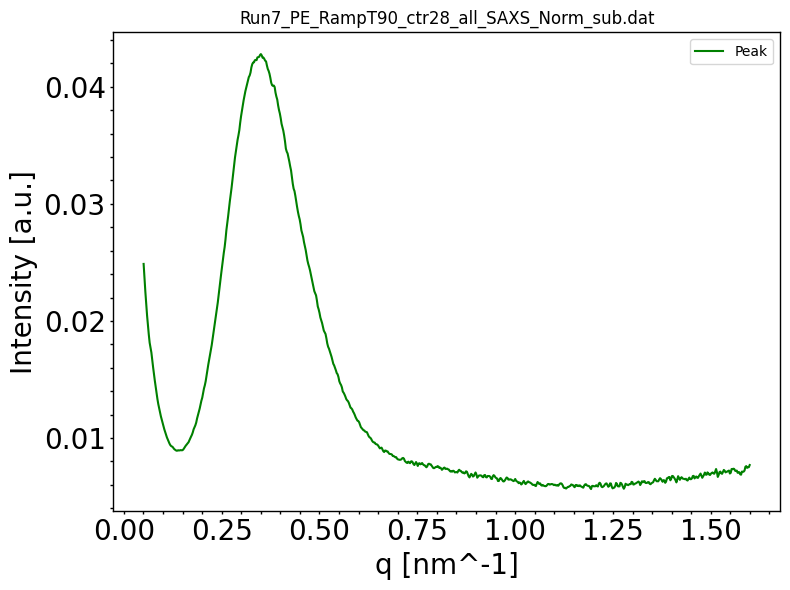


Processing keyword: _ctr29_
Found 1 files for keyword '_ctr29_'

Processing file: Run7_PE_RampT92_ctr29_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171586.22333333336, bstop=6.144593333333333, ctemp=94.01152533333334, I0=20.888923333333334
Data size after truncation: 704 points
Peak area: 0.04414777431472296 ± 0.00014721092239717827


<Figure size 640x480 with 0 Axes>

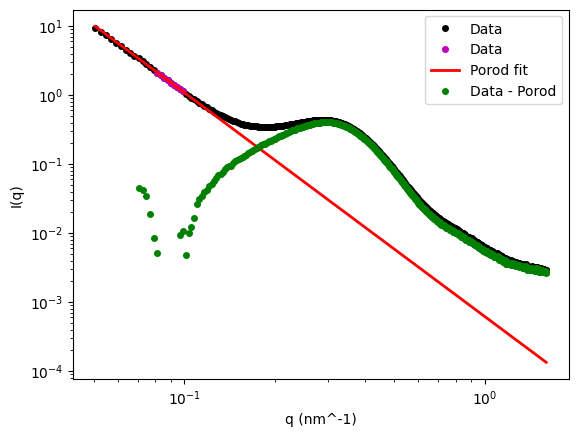

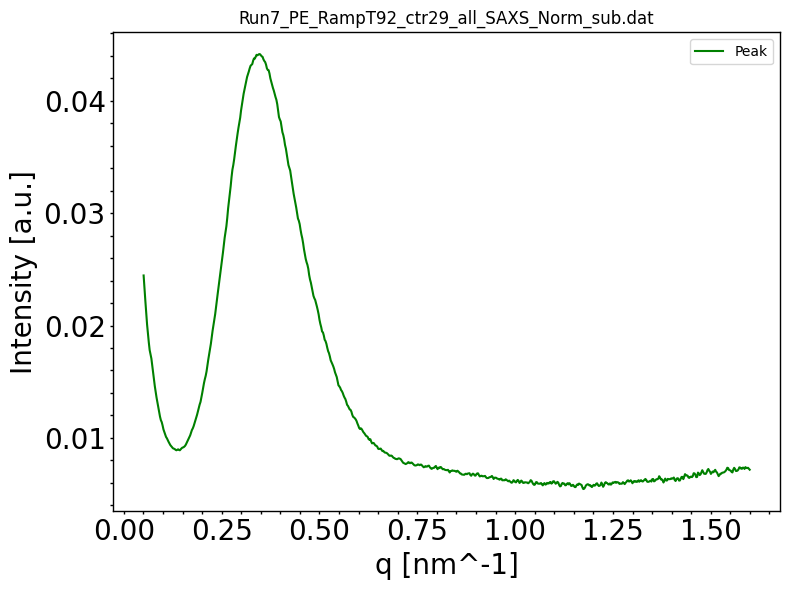


Processing keyword: _ctr30_
Found 1 files for keyword '_ctr30_'

Processing file: Run7_PE_RampT95_ctr30_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171678.09, bstop=6.14671, ctemp=96.33691433333333, I0=20.86594
Data size after truncation: 704 points
Peak area: 0.0459902850632923 ± 0.00014675123438658255


<Figure size 640x480 with 0 Axes>

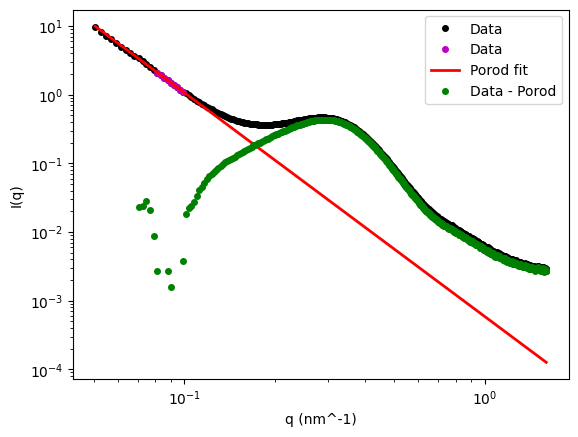

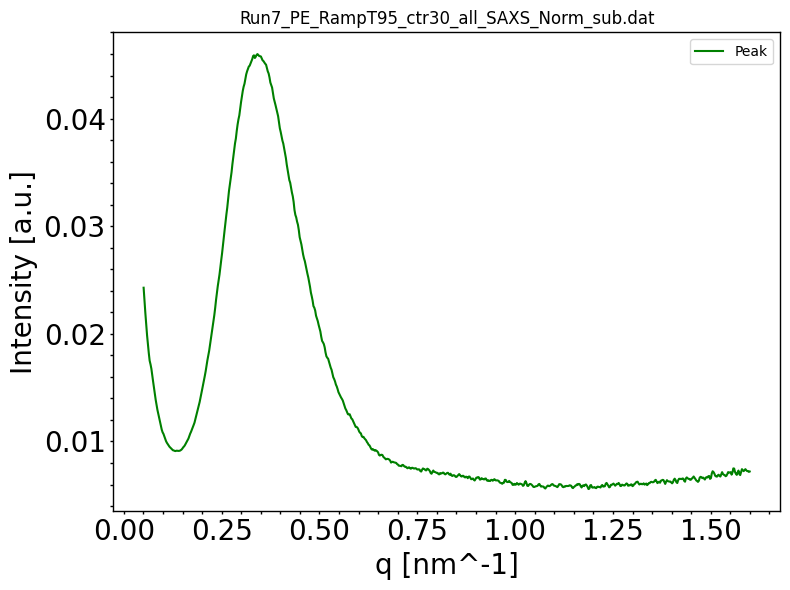


Processing keyword: _ctr31_
Found 1 files for keyword '_ctr31_'

Processing file: Run7_PE_RampT97_ctr31_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171770.02, bstop=6.1228066666666665, ctemp=98.75475333333334, I0=20.769343333333335
Data size after truncation: 704 points
Peak area: 0.04808371958259657 ± 0.00014728581050313467


<Figure size 640x480 with 0 Axes>

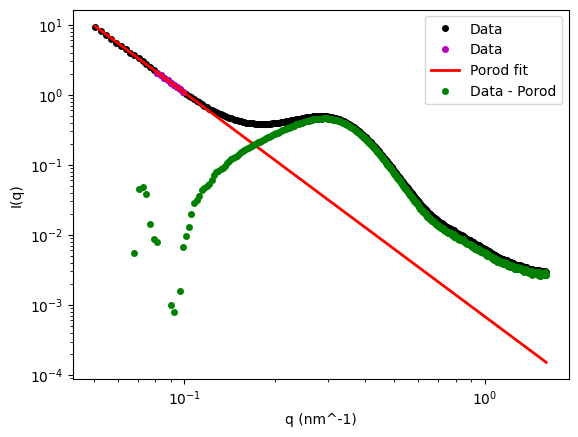

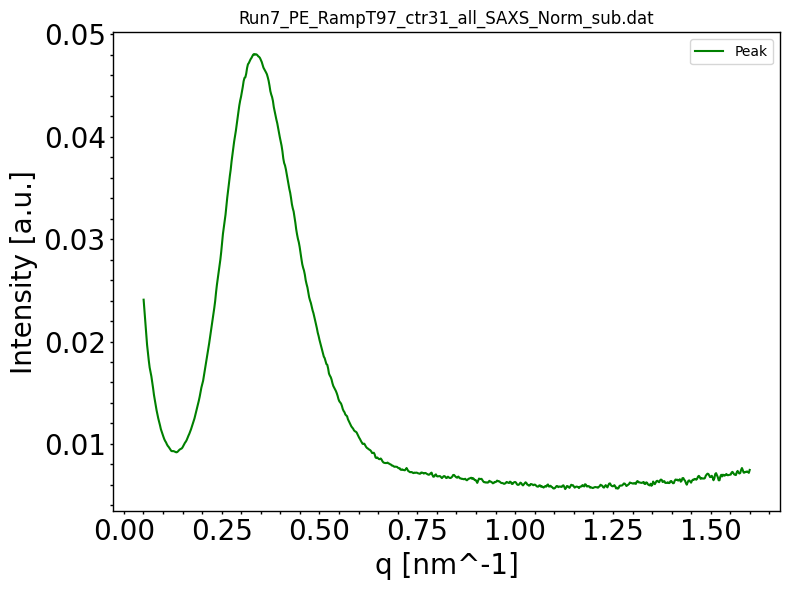


Processing keyword: _ctr32_
Found 1 files for keyword '_ctr32_'

Processing file: Run7_PE_RampT100_ctr32_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171863.18, bstop=6.10043, ctemp=101.17446666666666, I0=20.687223333333336
Data size after truncation: 704 points
Peak area: 0.05036789514538275 ± 0.00014761090565921822


<Figure size 640x480 with 0 Axes>

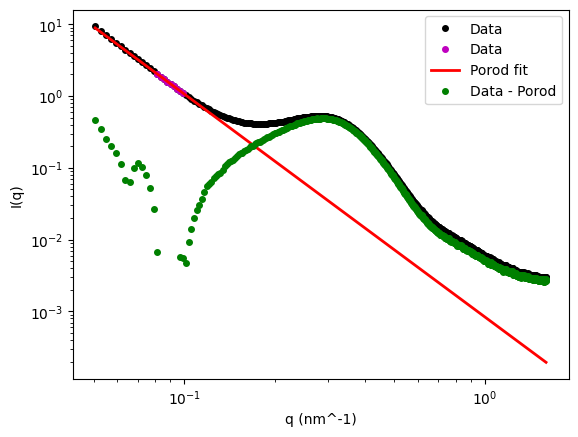

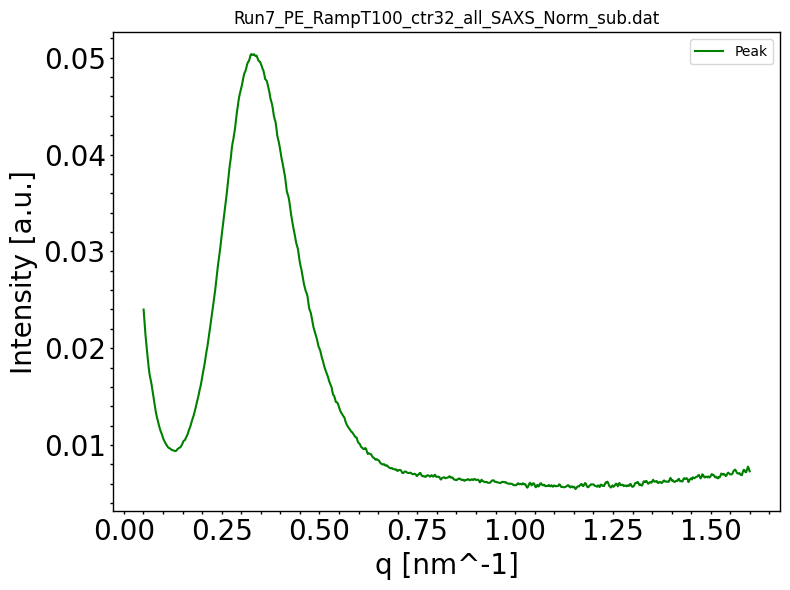


Processing keyword: _ctr33_
Found 1 files for keyword '_ctr33_'

Processing file: Run7_PE_RampT102_ctr33_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171955.87666666668, bstop=6.15647, ctemp=103.5872, I0=20.91862666666667
Data size after truncation: 704 points
Peak area: 0.05168020283374378 ± 0.00014494800624186894


<Figure size 640x480 with 0 Axes>

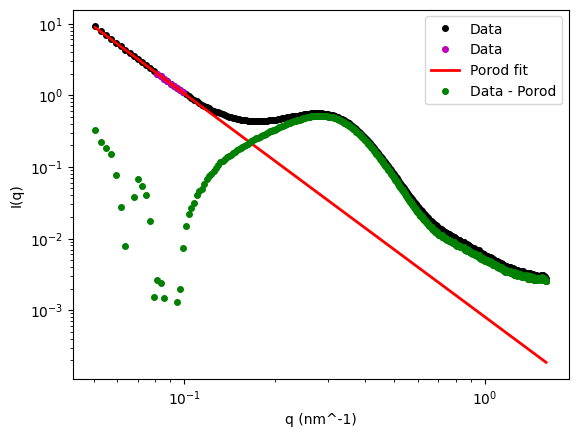

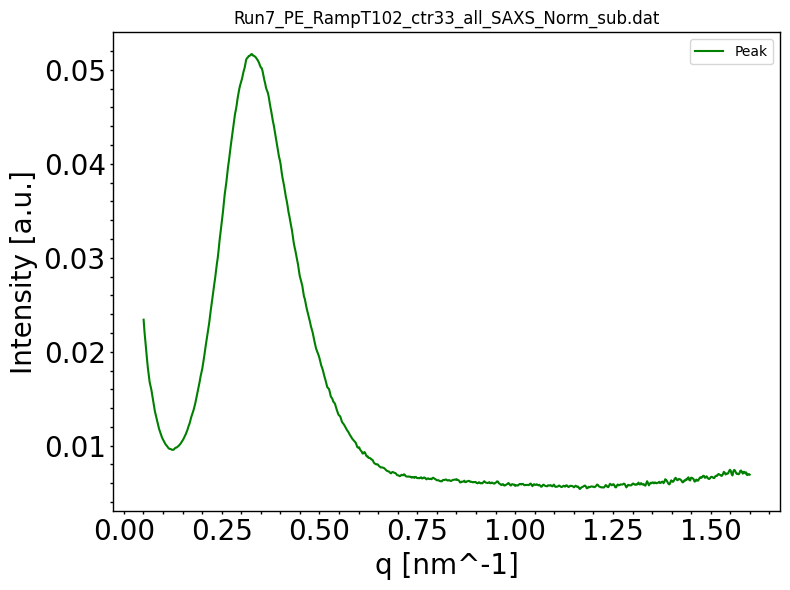


Processing keyword: _ctr34_
Found 1 files for keyword '_ctr34_'

Processing file: Run7_PE_RampT105_ctr34_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172048.84, bstop=6.1324700000000005, ctemp=106.00106666666666, I0=20.803906666666666
Data size after truncation: 704 points
Peak area: 0.054248029082655344 ± 0.00014592409011665467


<Figure size 640x480 with 0 Axes>

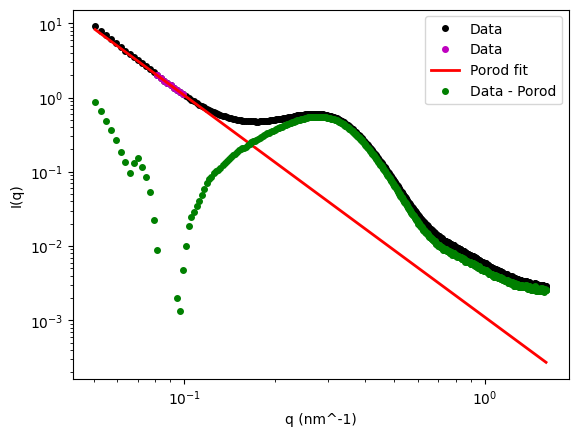

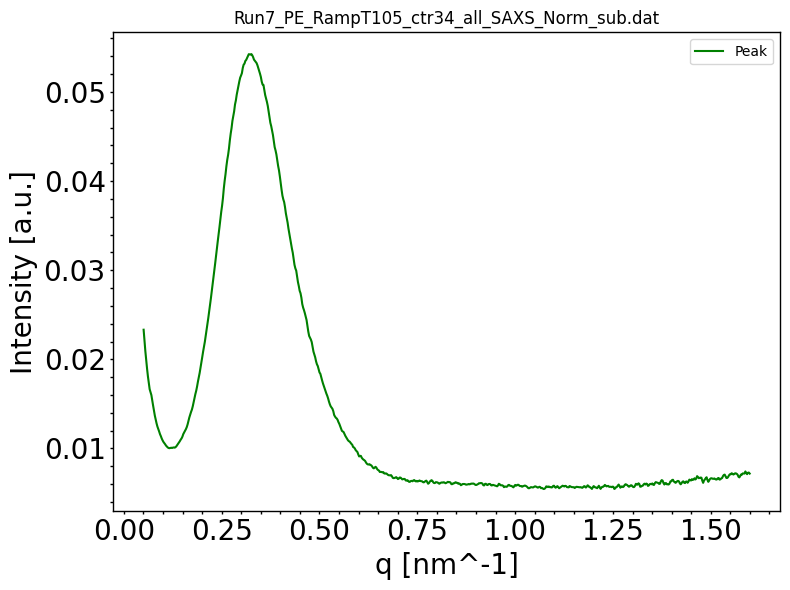


Processing keyword: _ctr35_
Found 1 files for keyword '_ctr35_'

Processing file: Run7_PE_RampT107_ctr35_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172142.6, bstop=6.110936666666667, ctemp=108.354, I0=20.685306666666666
Data size after truncation: 704 points
Peak area: 0.05670952835170517 ± 0.00014712245111000796


<Figure size 640x480 with 0 Axes>

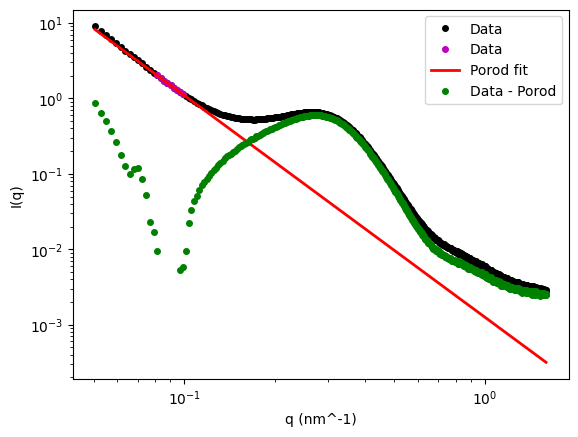

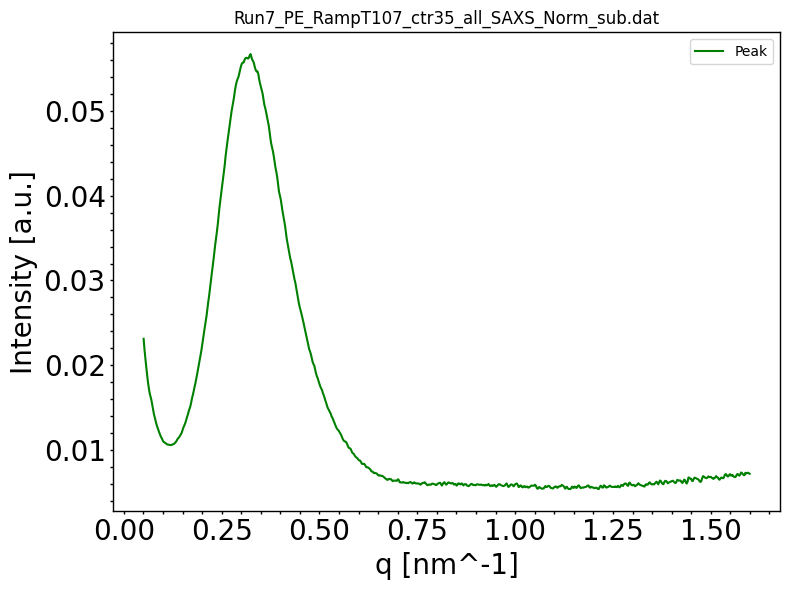


Processing keyword: _ctr36_
Found 1 files for keyword '_ctr36_'

Processing file: Run7_PE_RampT110_ctr36_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172235.05666666667, bstop=6.169316666666667, ctemp=110.74663333333332, I0=20.900183333333334
Data size after truncation: 704 points
Peak area: 0.05802833178722671 ± 0.0001458814016409792


<Figure size 640x480 with 0 Axes>

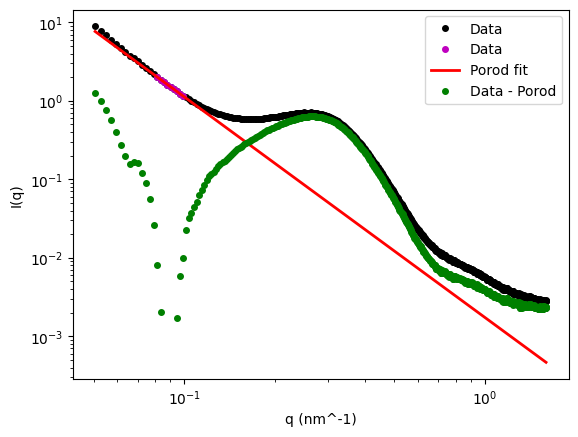

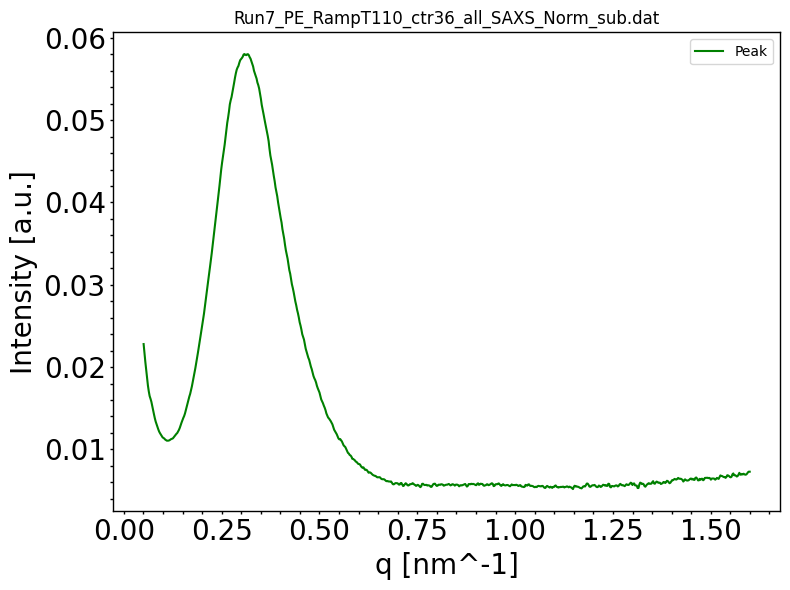


Processing keyword: _ctr37_
Found 1 files for keyword '_ctr37_'

Processing file: Run7_PE_RampT112_ctr37_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172326.90333333332, bstop=6.1406133333333335, ctemp=113.21303333333333, I0=20.786133333333332
Data size after truncation: 704 points
Peak area: 0.06059210408599668 ± 0.00014815393449115627


<Figure size 640x480 with 0 Axes>

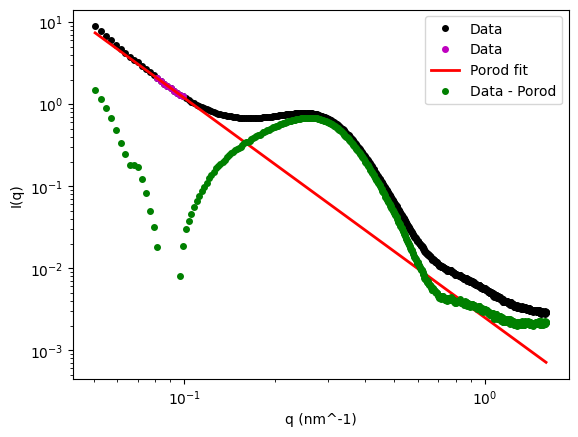

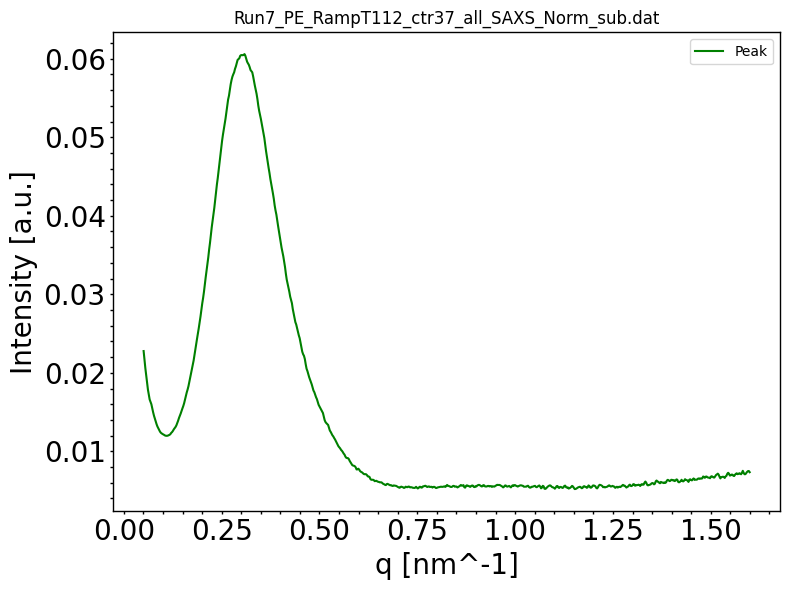


Processing keyword: _ctr38_
Found 1 files for keyword '_ctr38_'

Processing file: Run7_PE_RampT115_ctr38_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172419.05666666667, bstop=6.122013333333334, ctemp=115.62270000000001, I0=20.671086666666664
Data size after truncation: 704 points
Peak area: 0.062192163456514564 ± 0.0001508925032188632


<Figure size 640x480 with 0 Axes>

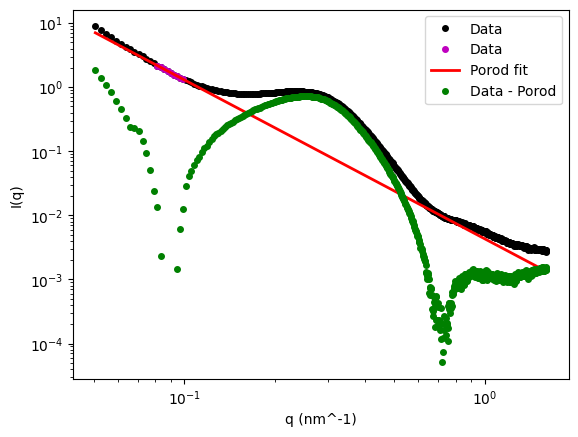

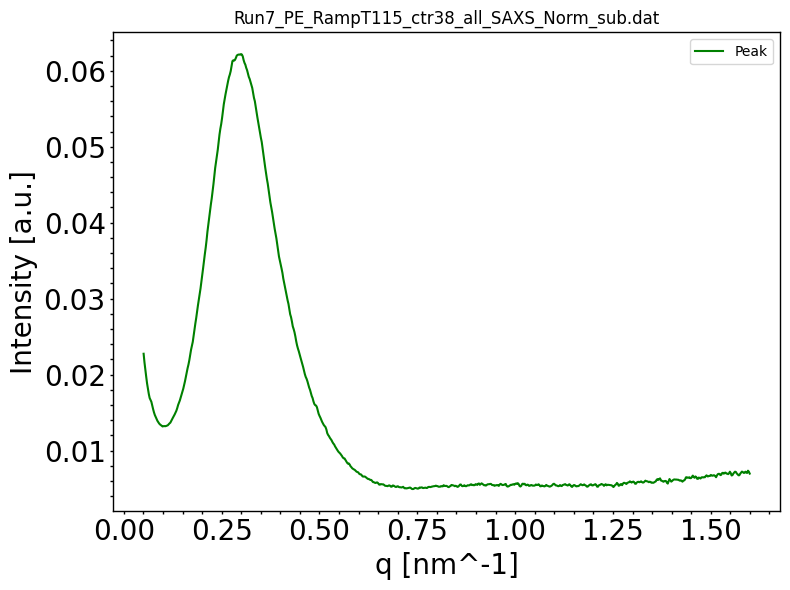


Processing keyword: _ctr39_
Found 1 files for keyword '_ctr39_'

Processing file: Run7_PE_RampT117_ctr39_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172511.26333333334, bstop=6.17621, ctemp=118.10090000000001, I0=20.888769999999997
Data size after truncation: 704 points
Peak area: 0.06242644931452201 ± 0.00015162451260116401


<Figure size 640x480 with 0 Axes>

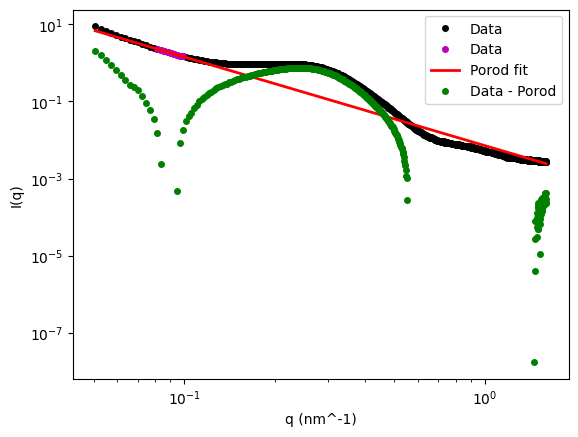

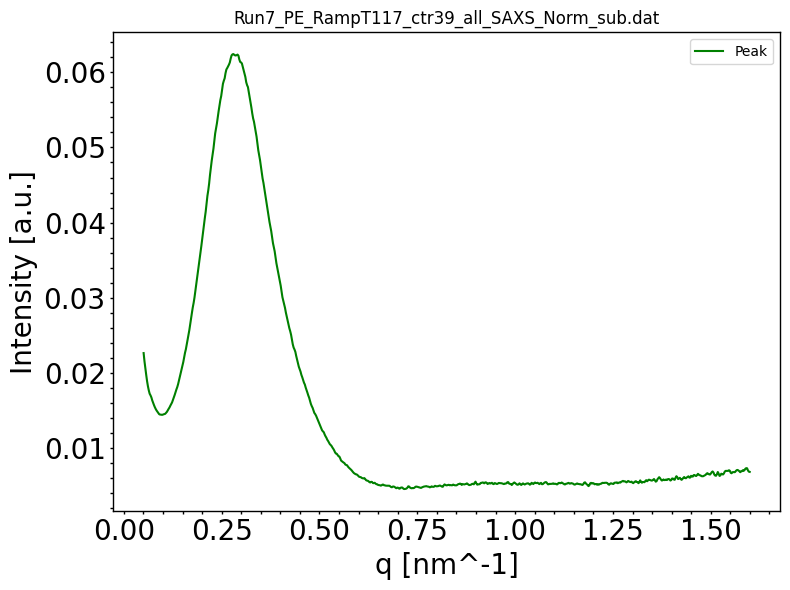


Processing keyword: _ctr40_
Found 1 files for keyword '_ctr40_'

Processing file: Run7_PE_RampT120_ctr40_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172606.18, bstop=6.14483, ctemp=120.38896666666666, I0=20.760413333333332
Data size after truncation: 704 points
Peak area: 0.06363652190765845 ± 0.00015675215733065002


<Figure size 640x480 with 0 Axes>

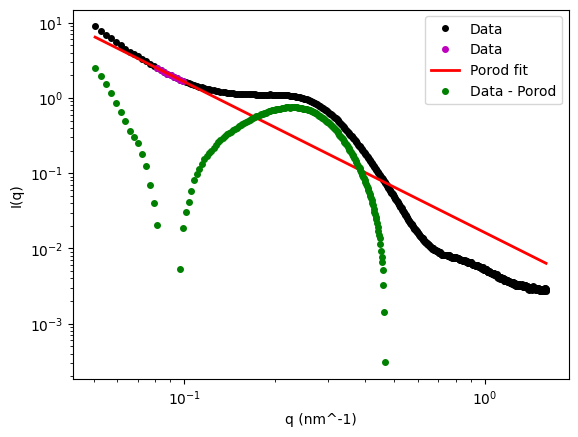

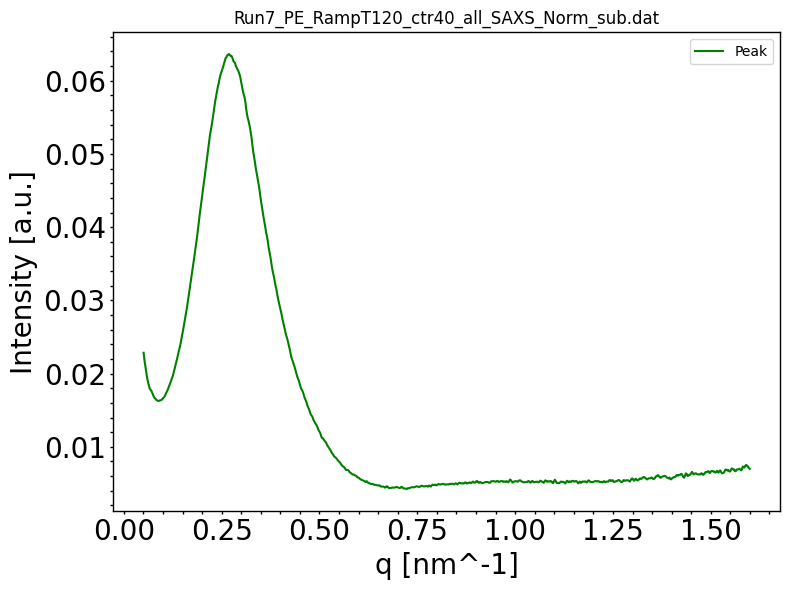


Processing keyword: _ctr41_
Found 1 files for keyword '_ctr41_'

Processing file: Run7_PE_RampT122_ctr41_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172698.70333333334, bstop=6.123916666666667, ctemp=122.89683333333335, I0=20.71171
Data size after truncation: 704 points
Peak area: 0.06258636800157251 ± 0.0001631845185123632


<Figure size 640x480 with 0 Axes>

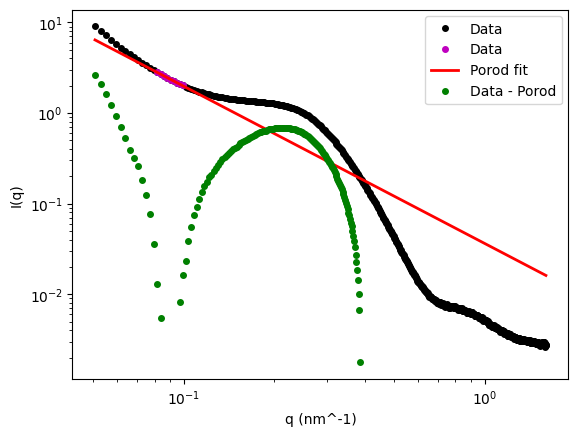

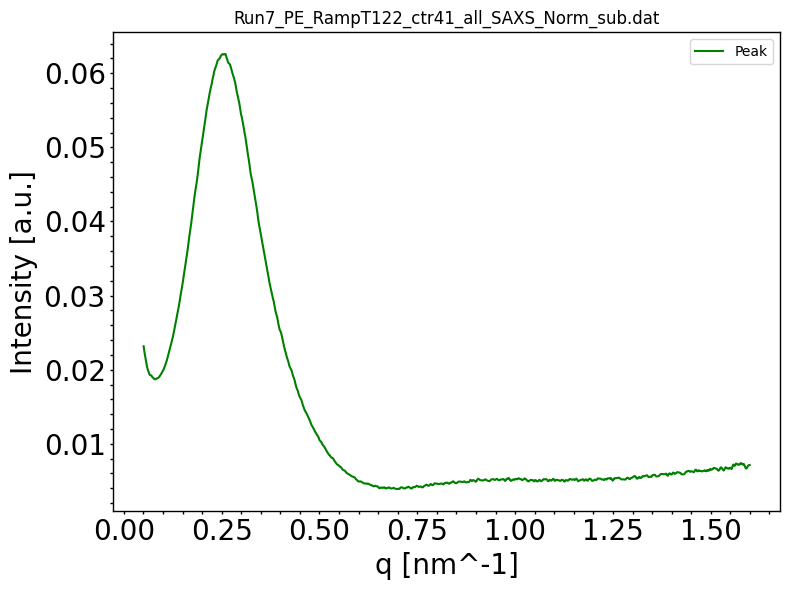


Processing keyword: _ctr42_
Found 1 files for keyword '_ctr42_'

Processing file: Run7_PE_RampT125_ctr42_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172793.25666666668, bstop=6.163243333333334, ctemp=125.28033333333333, I0=20.79493666666667
Data size after truncation: 704 points
Peak area: 0.059142447178905926 ± 0.00016982511415632049


<Figure size 640x480 with 0 Axes>

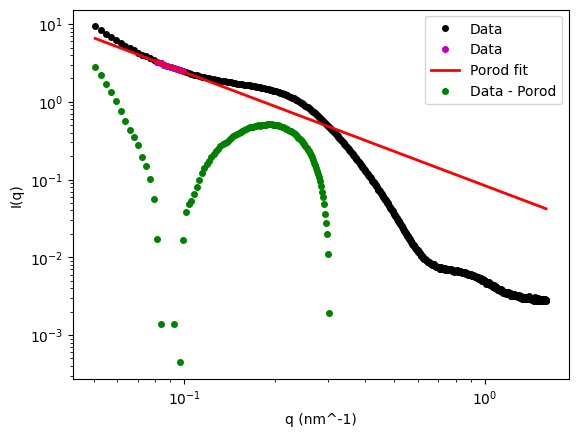

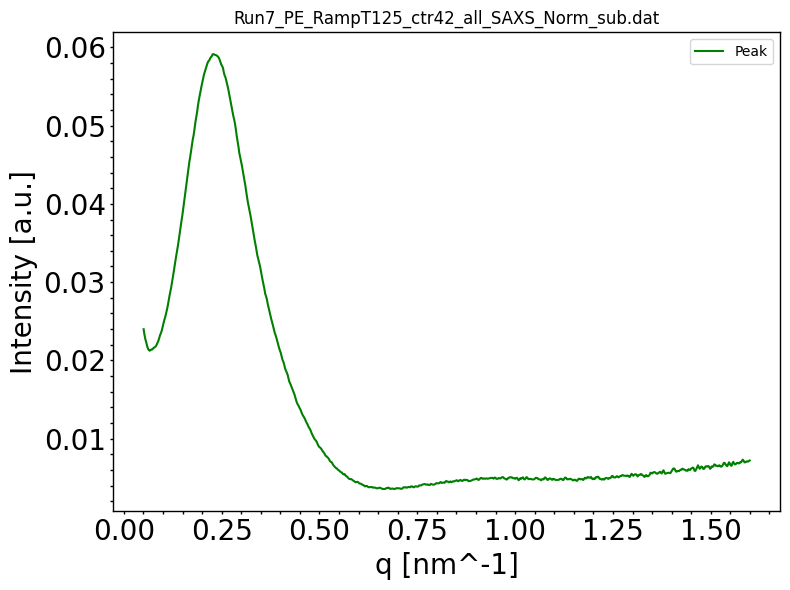


Processing keyword: _ctr43_
Found 1 files for keyword '_ctr43_'

Processing file: Run7_PE_RampT127_ctr43_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172889.00666666668, bstop=6.167856666666666, ctemp=127.67856666666665, I0=20.81347
Data size after truncation: 704 points
Peak area: 0.052504734607283464 ± 0.00017986303634984067


<Figure size 640x480 with 0 Axes>

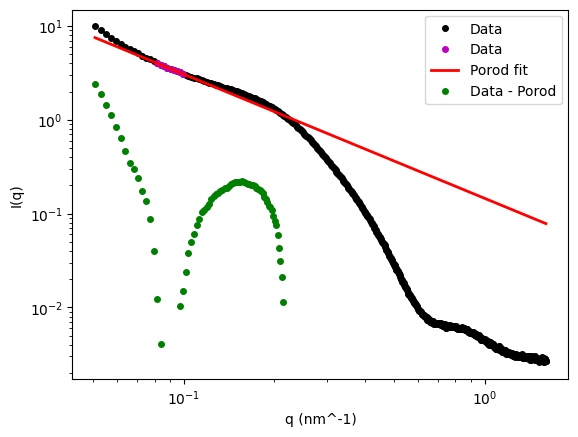

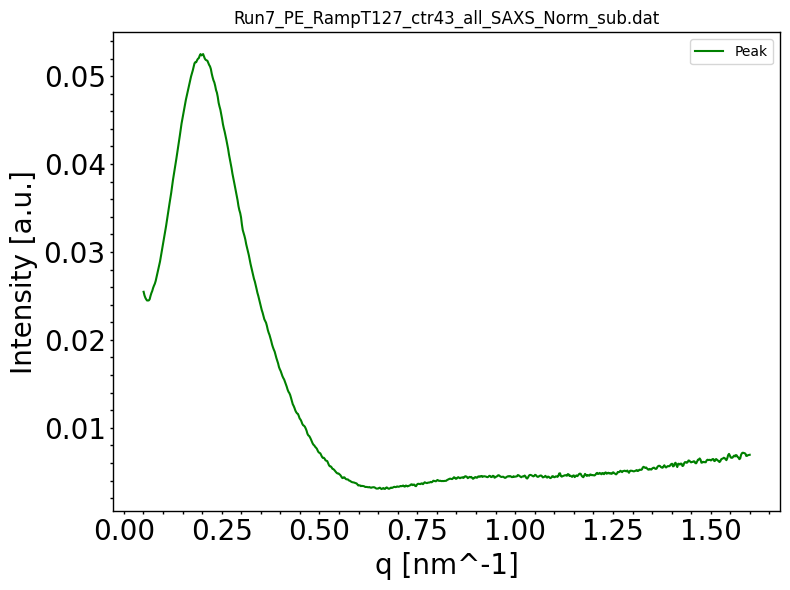


Processing keyword: _ctr44_
Found 1 files for keyword '_ctr44_'

Processing file: Run7_PE_RampT130_ctr44_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172983.83, bstop=6.14783, ctemp=130.14873666666668, I0=20.681963333333332
Data size after truncation: 704 points
Peak area: 0.03957305431290868 ± 0.00018779381595459183


<Figure size 640x480 with 0 Axes>

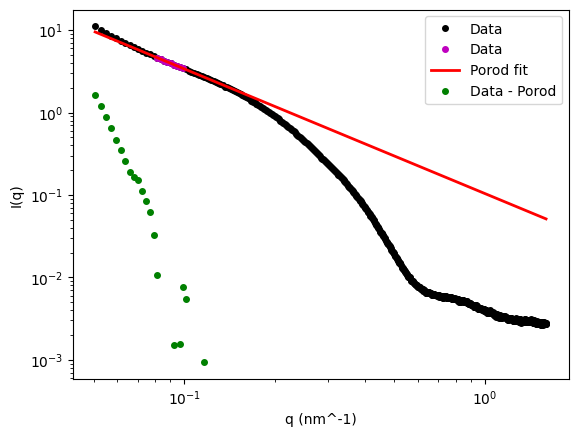

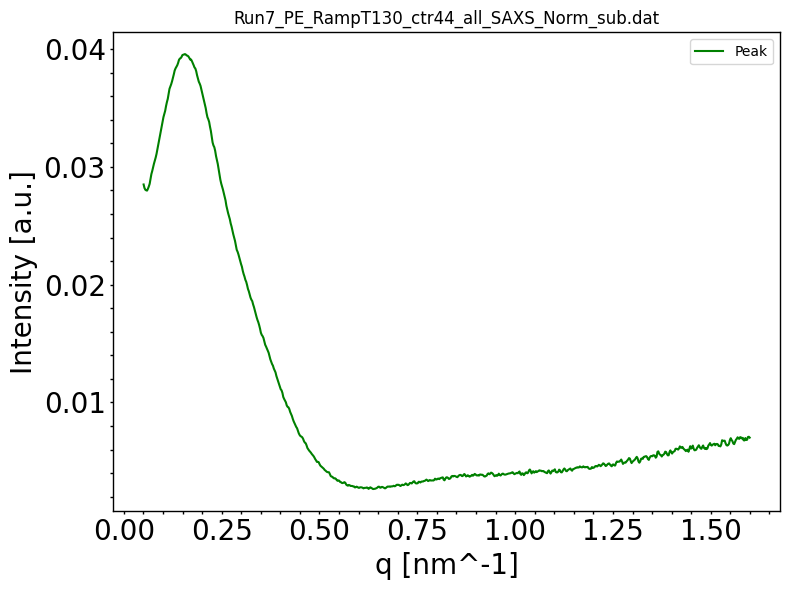


Processing keyword: _ctr45_
Found 1 files for keyword '_ctr45_'

Processing file: Run7_PE_RampT132_ctr45_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173081.13333333333, bstop=6.159216666666666, ctemp=132.571, I0=20.71077
Data size after truncation: 704 points
Peak area: 0.015760625886537 ± 0.0001256638315525751


<Figure size 640x480 with 0 Axes>

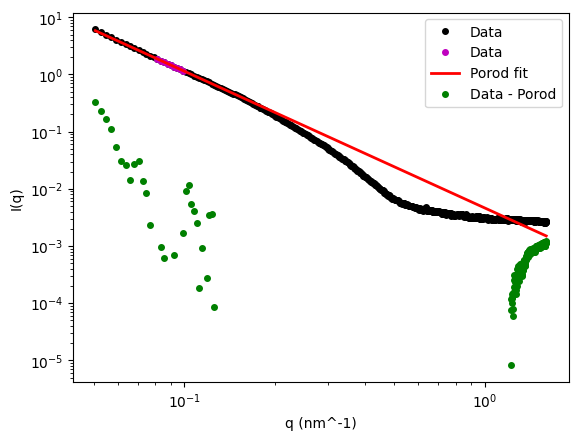

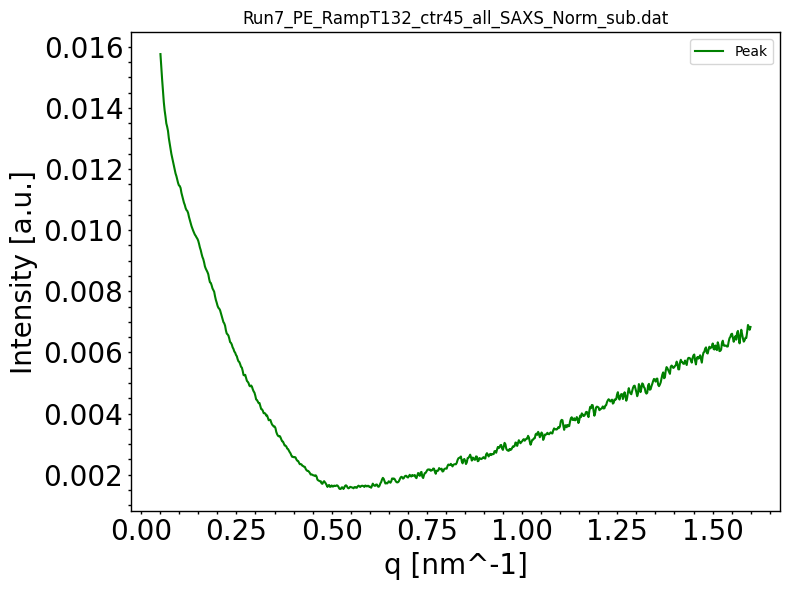


Processing keyword: _ctr46_
Found 1 files for keyword '_ctr46_'

Processing file: Run7_PE_RampT135_ctr46_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173178.71333333335, bstop=6.179289999999999, ctemp=135.00383333333332, I0=20.758926666666664
Data size after truncation: 704 points
Peak area: 0.008570615895710985 ± 8.384676871816974e-05


<Figure size 640x480 with 0 Axes>

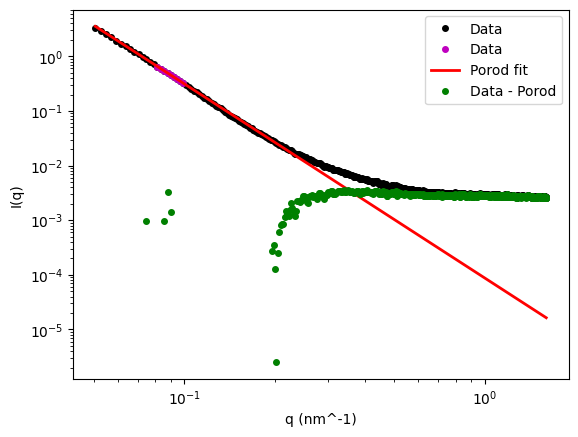

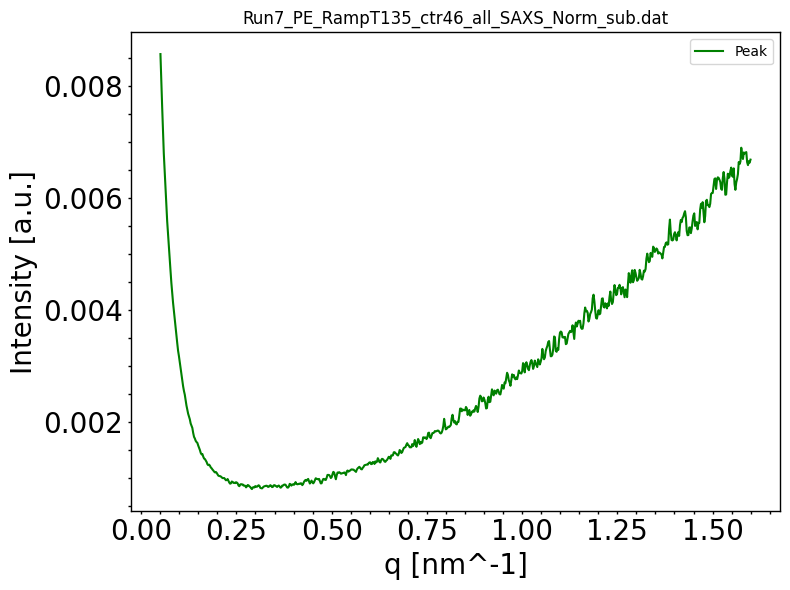


Processing keyword: _ctr47_
Found 1 files for keyword '_ctr47_'

Processing file: Run7_PE_RampT137_ctr47_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173278.29666666666, bstop=6.161026666666667, ctemp=137.44247333333334, I0=20.65442
Data size after truncation: 704 points
Peak area: 0.007111208929908085 ± 7.816274512106579e-05


<Figure size 640x480 with 0 Axes>

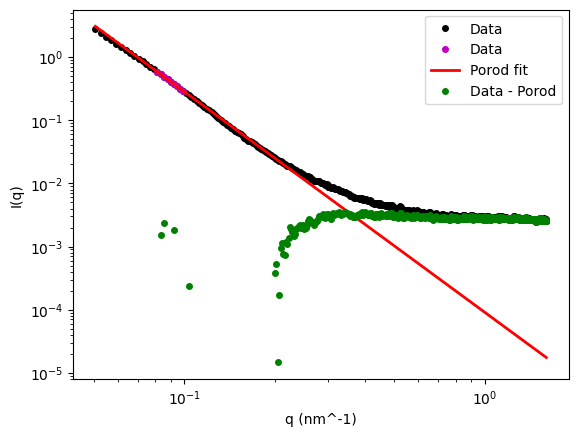

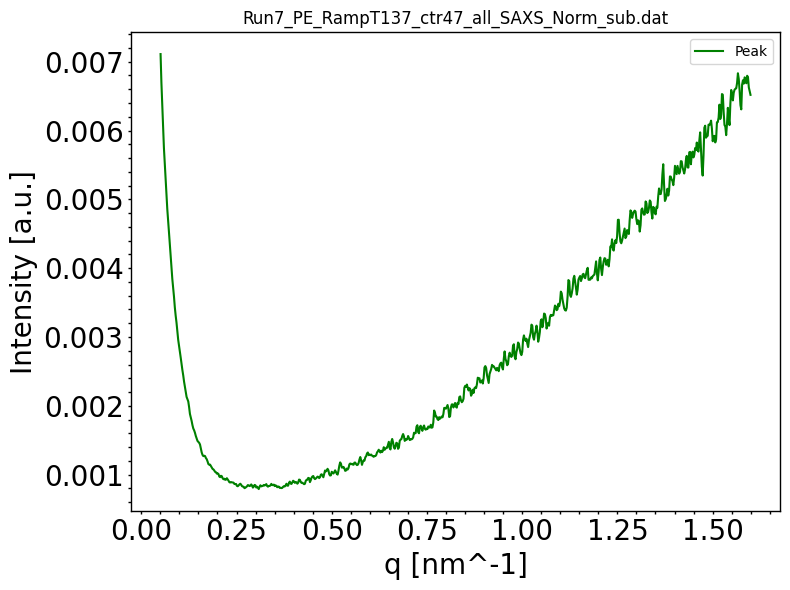


Processing keyword: _ctr48_
Found 1 files for keyword '_ctr48_'

Processing file: Run7_PE_RampT140_ctr48_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173380.41666666666, bstop=6.165726666666667, ctemp=139.82506666666666, I0=20.660513333333338
Data size after truncation: 704 points
Peak area: 0.007050345443842607 ± 7.586644032518137e-05


<Figure size 640x480 with 0 Axes>

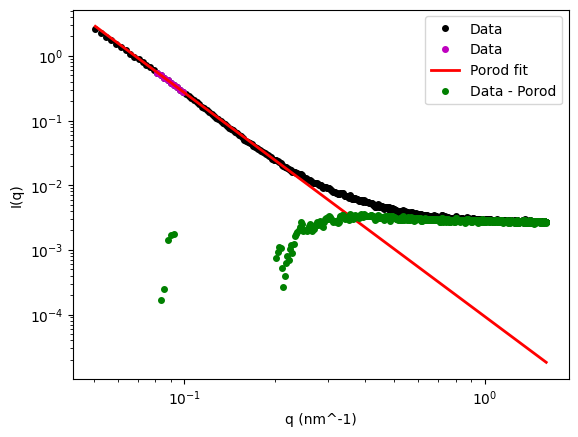

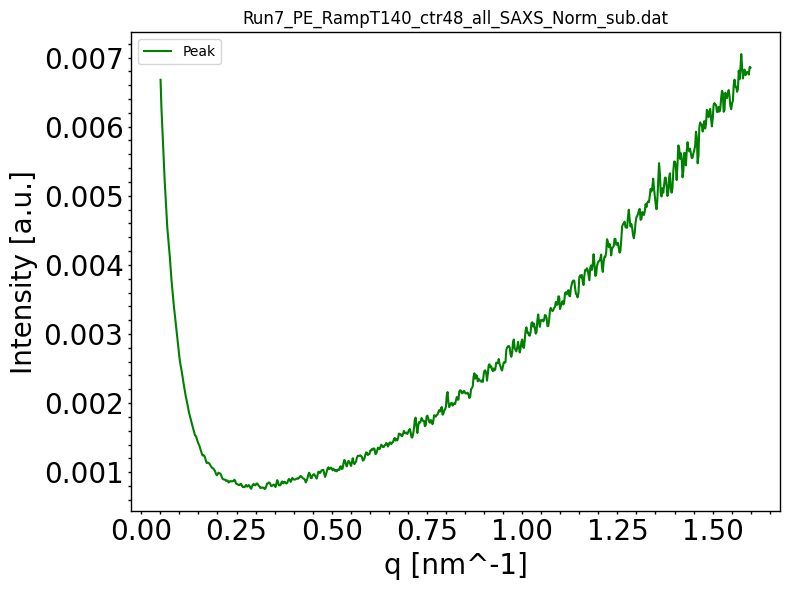


Processing keyword: _ctr49_
Found 1 files for keyword '_ctr49_'

Processing file: Run7_PE_RampT142_ctr49_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173481.61333333334, bstop=6.1889166666666675, ctemp=142.32966666666667, I0=20.74721333333333
Data size after truncation: 704 points
Peak area: 0.007087114586148443 ± 7.435355463783022e-05


<Figure size 640x480 with 0 Axes>

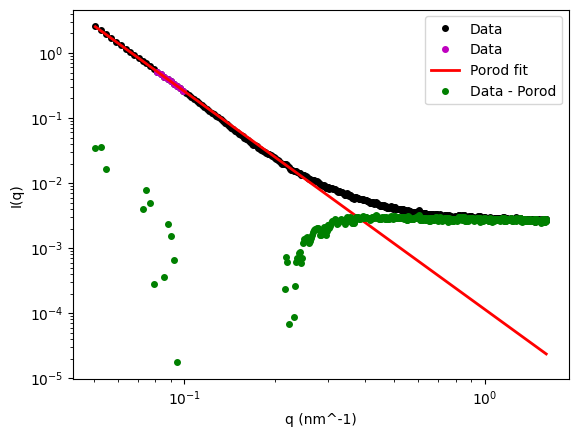

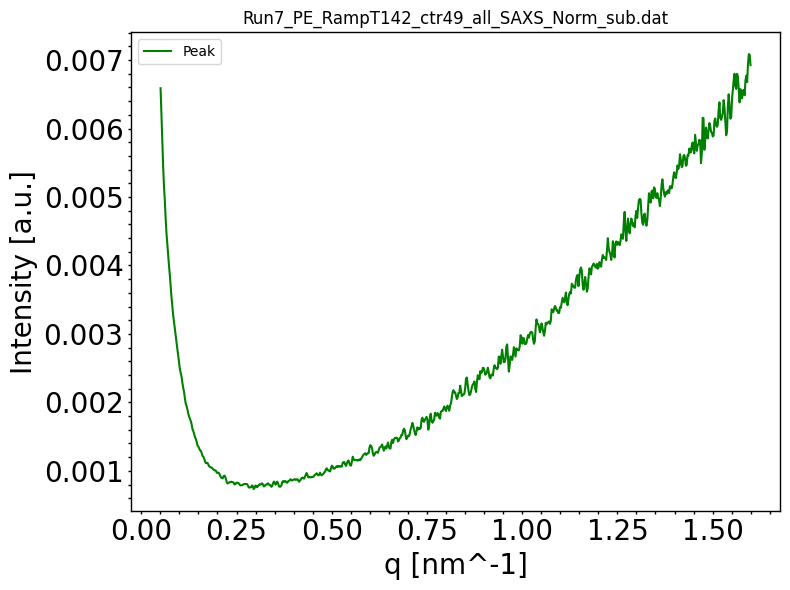


Processing keyword: _ctr50_
Found 1 files for keyword '_ctr50_'

Processing file: Run7_PE_RampT145_ctr50_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173586.27333333335, bstop=6.158243333333334, ctemp=144.79670000000002, I0=20.620563333333333
Data size after truncation: 704 points
Peak area: 0.007029935959897328 ± 7.414206687702148e-05


<Figure size 640x480 with 0 Axes>

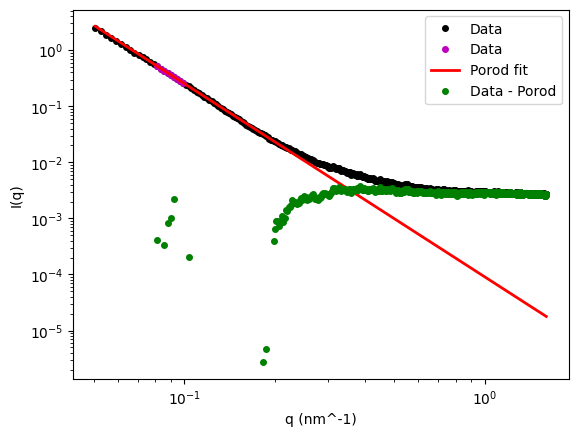

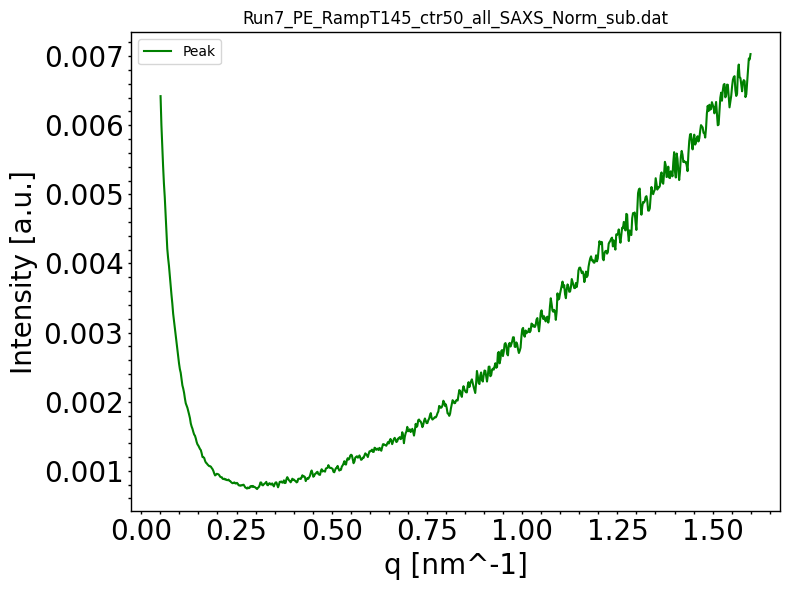


Processing keyword: _ctr51_
Found 1 files for keyword '_ctr51_'

Processing file: Run7_PE_RampT147_ctr51_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173693.47333333336, bstop=6.190086666666667, ctemp=147.22203333333331, I0=20.71992
Data size after truncation: 704 points
Peak area: 0.007055640478603546 ± 7.193575511993573e-05


<Figure size 640x480 with 0 Axes>

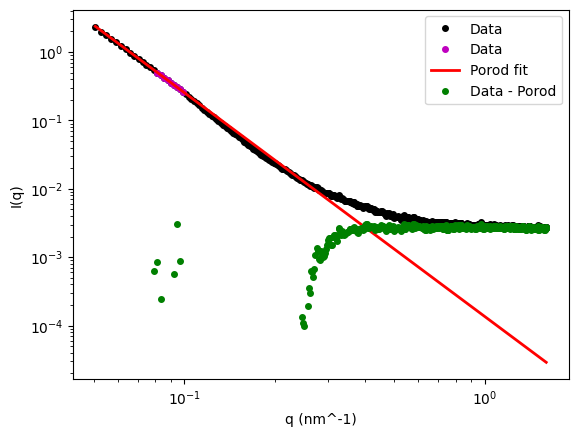

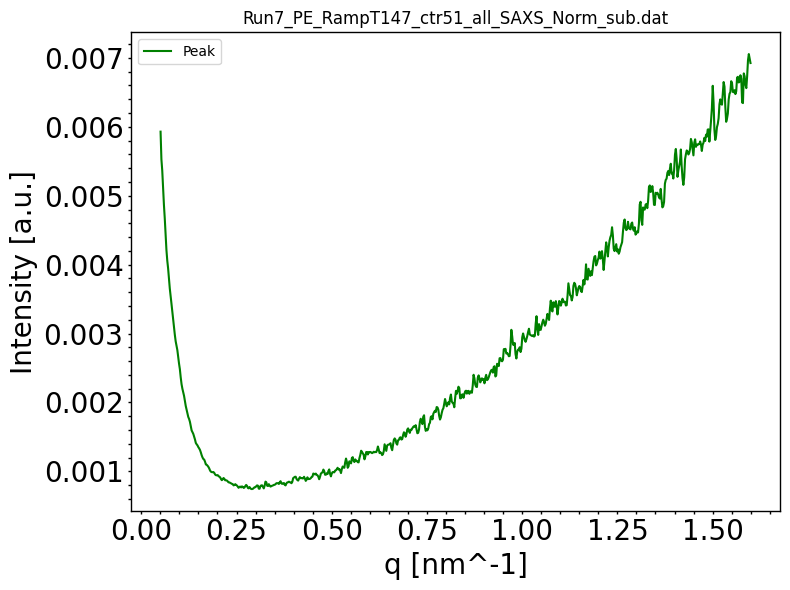


Processing keyword: _ctr52_
Found 1 files for keyword '_ctr52_'

Processing file: Run7_PE_RampT150_ctr52_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173802.50333333333, bstop=6.173729999999999, ctemp=149.68987, I0=20.67104
Data size after truncation: 704 points
Peak area: 0.00716063090750738 ± 7.118383691354784e-05


<Figure size 640x480 with 0 Axes>

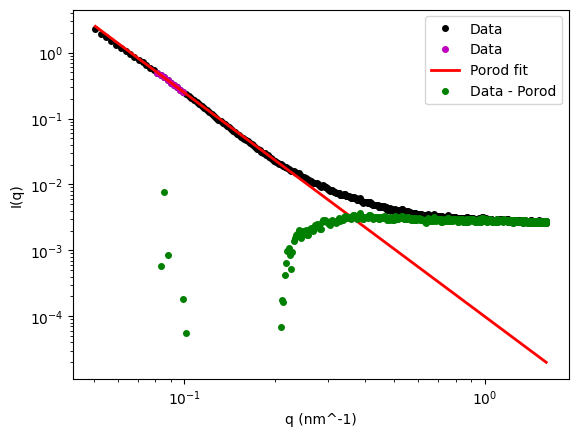

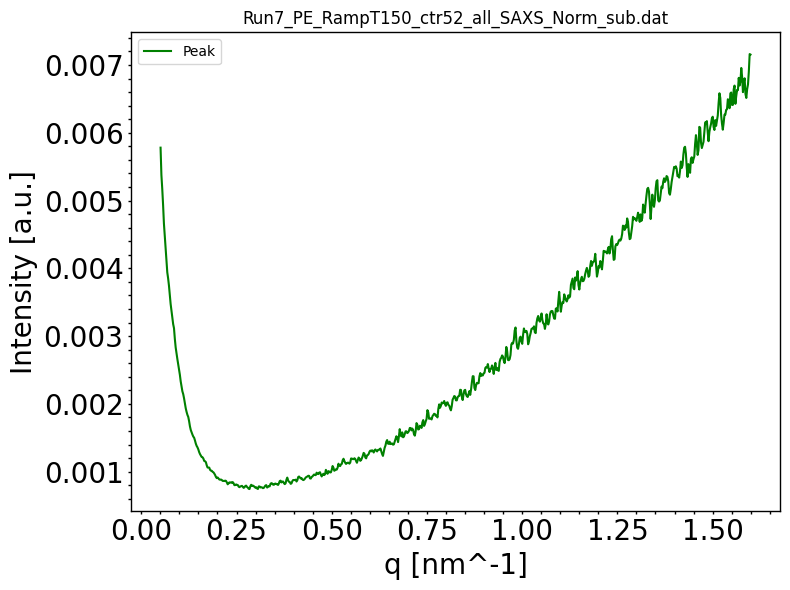


Processing keyword: _ctr53_
Found 1 files for keyword '_ctr53_'

Processing file: Run7_PE_RampT152_ctr53_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173915.08333333334, bstop=6.144783333333334, ctemp=152.09719666666666, I0=20.545576666666665
Data size after truncation: 704 points
Peak area: 0.007173335675054268 ± 6.967656664113904e-05


<Figure size 640x480 with 0 Axes>

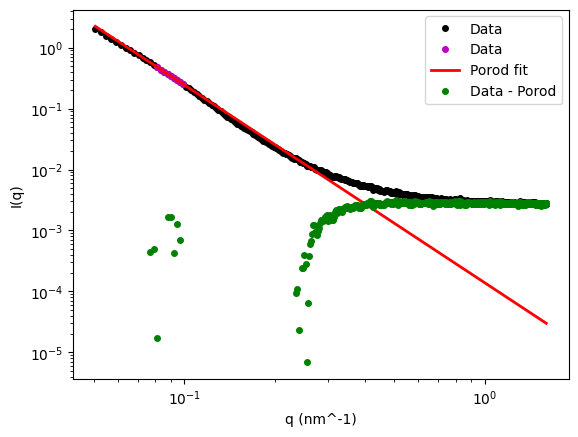

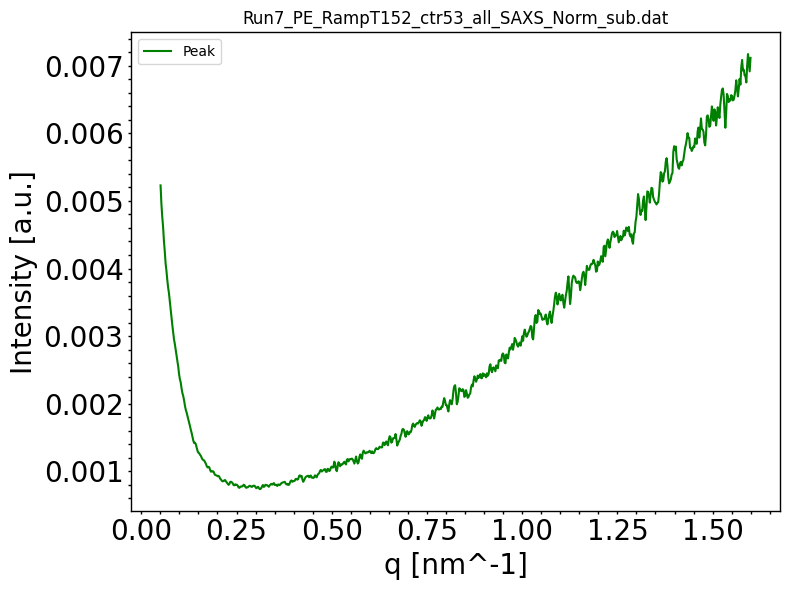


Processing keyword: _ctr54_
Found 1 files for keyword '_ctr54_'

Processing file: Run7_PE_RampT155_ctr54_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=174029.17666666664, bstop=6.192453333333333, ctemp=154.60216666666668, I0=20.714883333333333
Data size after truncation: 704 points
Peak area: 0.006996778253902449 ± 6.731400327139818e-05


<Figure size 640x480 with 0 Axes>

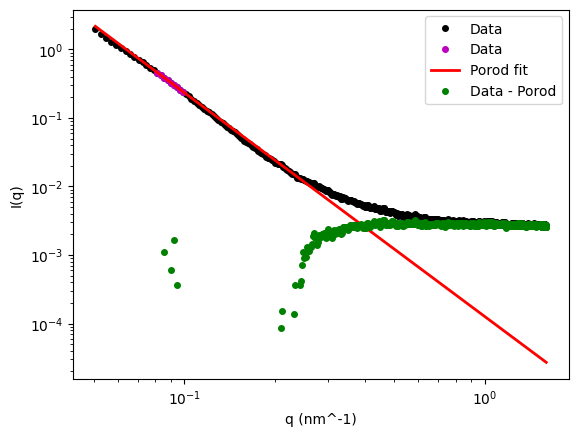

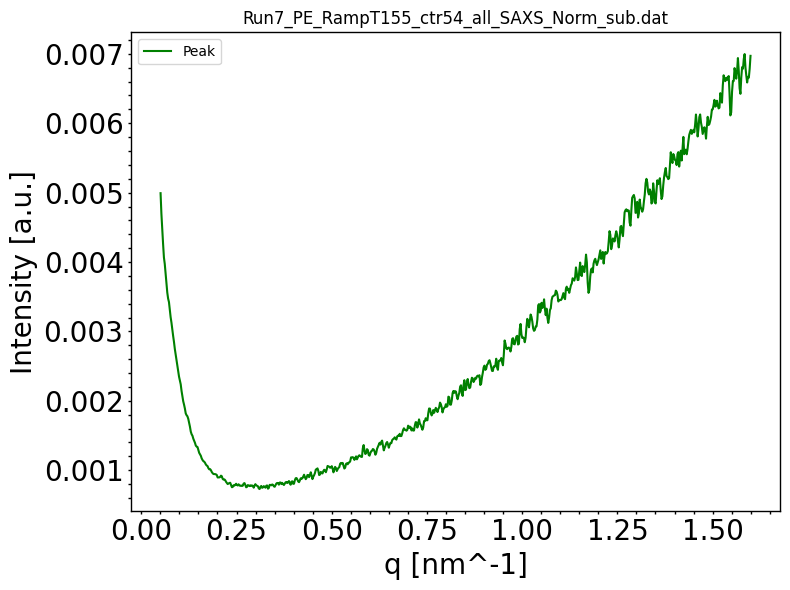


Processing keyword: _ctr55_
Found 1 files for keyword '_ctr55_'

Processing file: Run7_PE_RampT157_ctr55_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=174147.83333333334, bstop=6.160863333333334, ctemp=157.03150333333335, I0=20.582736666666666
Data size after truncation: 704 points
Peak area: 0.007189744473811764 ± 6.683761980448639e-05


<Figure size 640x480 with 0 Axes>

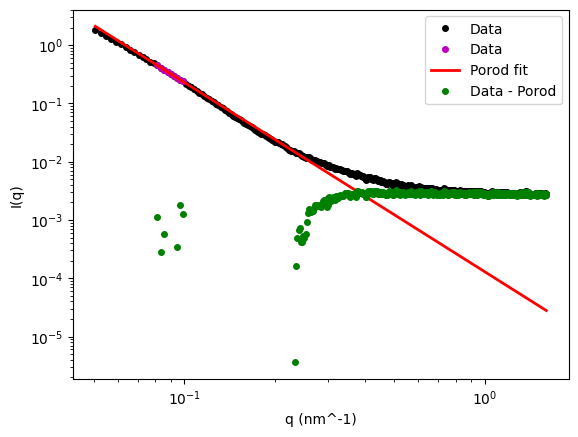

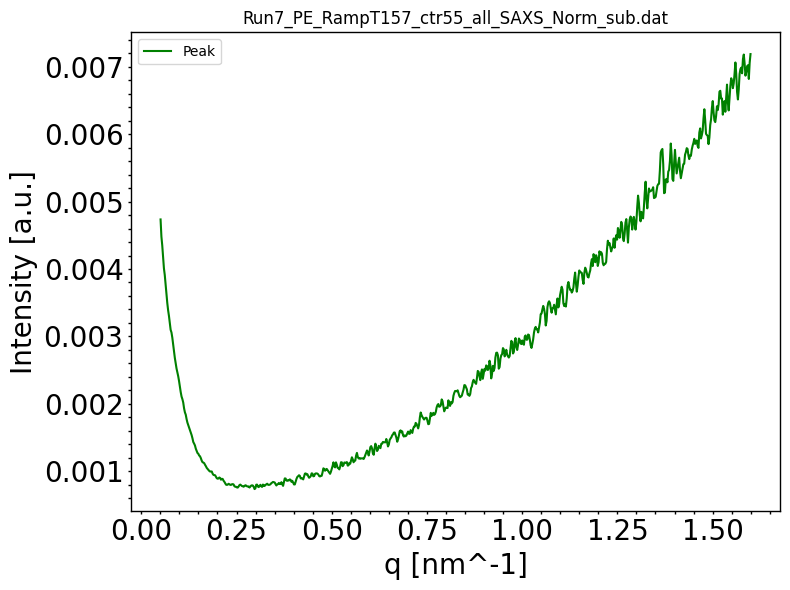


Processing keyword: _ctr56_
Found 1 files for keyword '_ctr56_'

Processing file: Run7_PE_RampT160_ctr56_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=174269.42666666667, bstop=6.145283333333334, ctemp=159.54453666666666, I0=20.51071333333333
Data size after truncation: 704 points
Peak area: 0.00724593525807246 ± 6.58198406020863e-05


<Figure size 640x480 with 0 Axes>

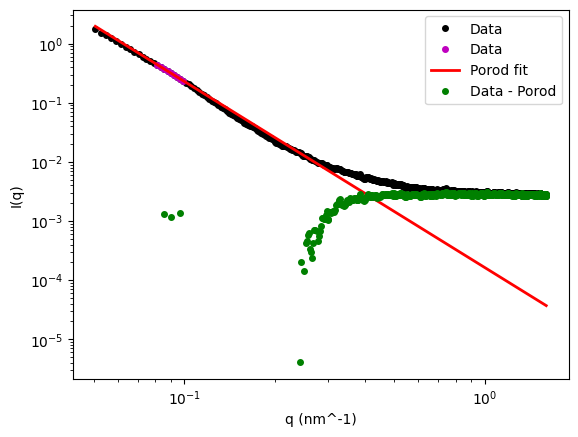

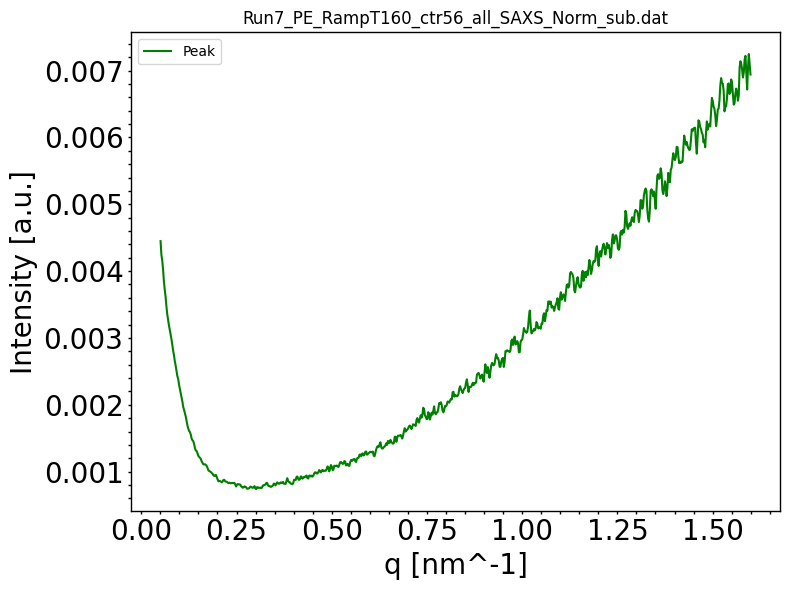

Lengths: filename=57, timer=57, CTEMP=57, I0=57, bstop=57, peak_pos=57, porod_exp=57, porod_scale=57, peak_area=57, peak_area_error=57

Processing keyword: _ctr0_
Found 1 files for keyword '_ctr0_'

Processing file: Run6_PE_AcOH_RampT20_ctr0_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129016.88666666666, bstop=4.499536666666667, ctemp=26.19971666666667, I0=21.27725333333333
Data size after truncation: 704 points
Peak area: 0.02940753923302698 ± 8.782554402638634e-05


<Figure size 640x480 with 0 Axes>

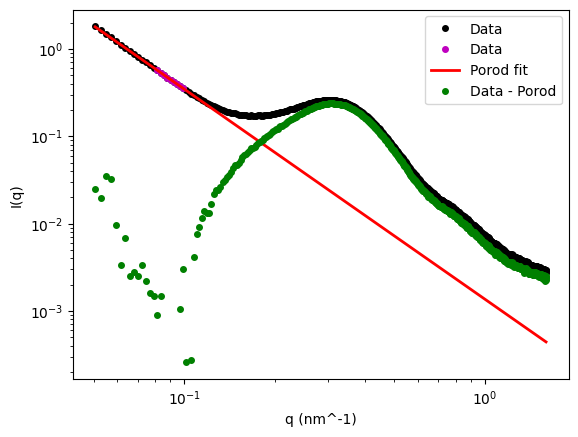

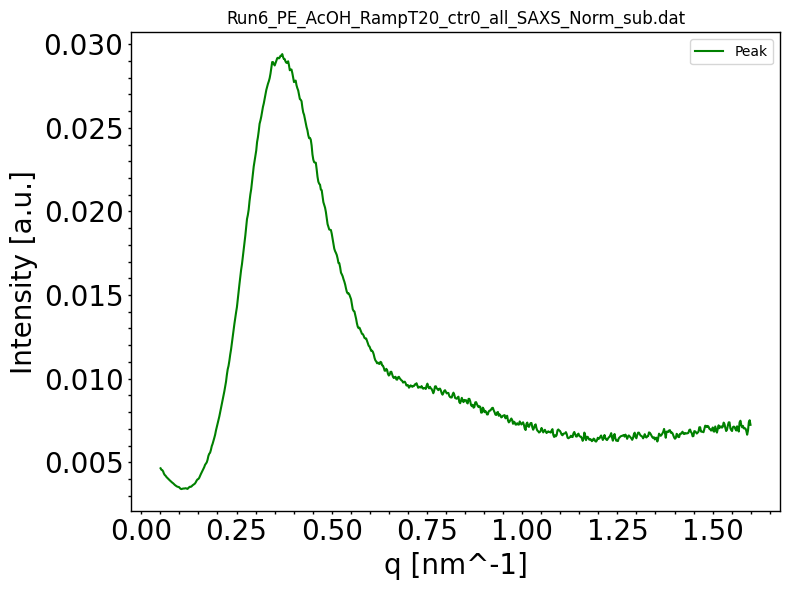


Processing keyword: _ctr1_
Found 1 files for keyword '_ctr1_'

Processing file: Run6_PE_AcOH_RampT22_ctr1_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129062.18666666666, bstop=4.48916, ctemp=26.089660666666664, I0=21.193836666666666
Data size after truncation: 704 points
Peak area: 0.029459413675084353 ± 8.828575547981786e-05


<Figure size 640x480 with 0 Axes>

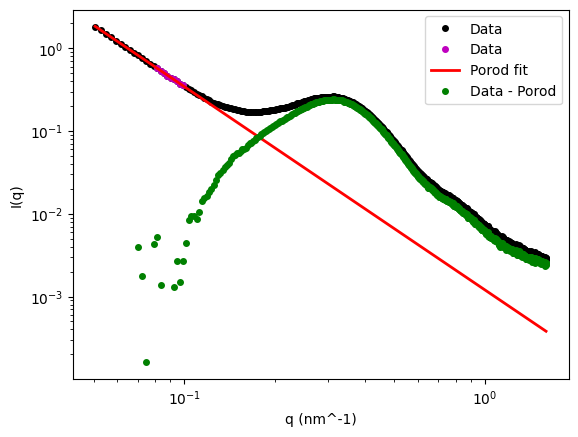

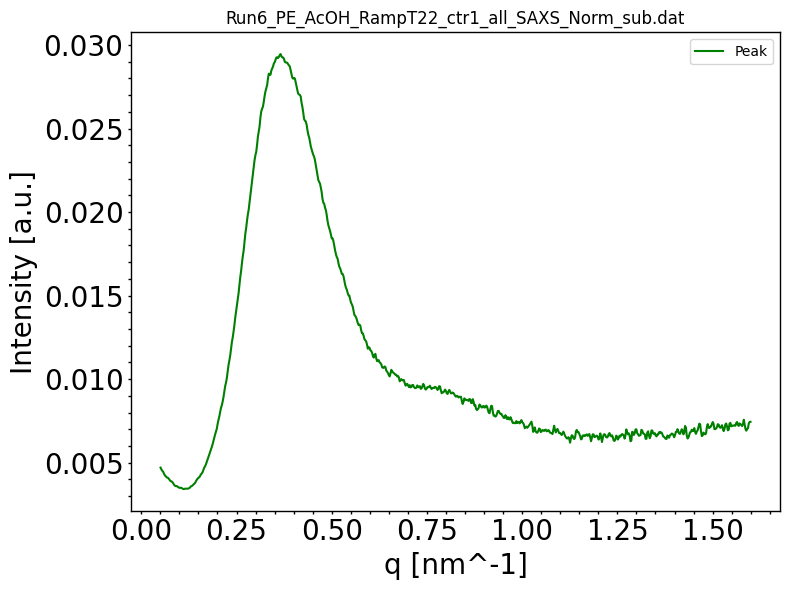


Processing keyword: _ctr2_
Found 1 files for keyword '_ctr2_'

Processing file: Run6_PE_AcOH_RampT25_ctr2_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129107.27333333333, bstop=4.476323333333333, ctemp=26.00623333333333, I0=21.192326666666663
Data size after truncation: 704 points
Peak area: 0.029386009421588994 ± 8.848588766145618e-05


<Figure size 640x480 with 0 Axes>

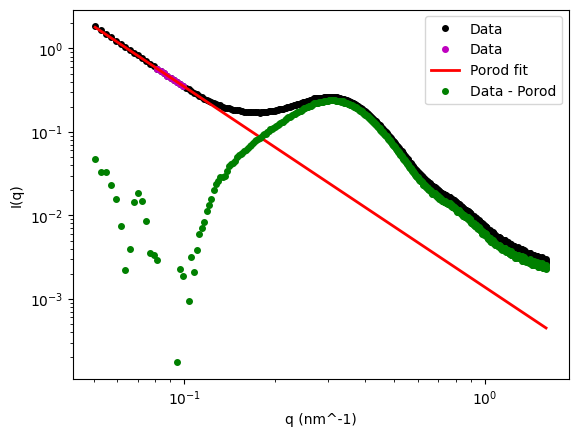

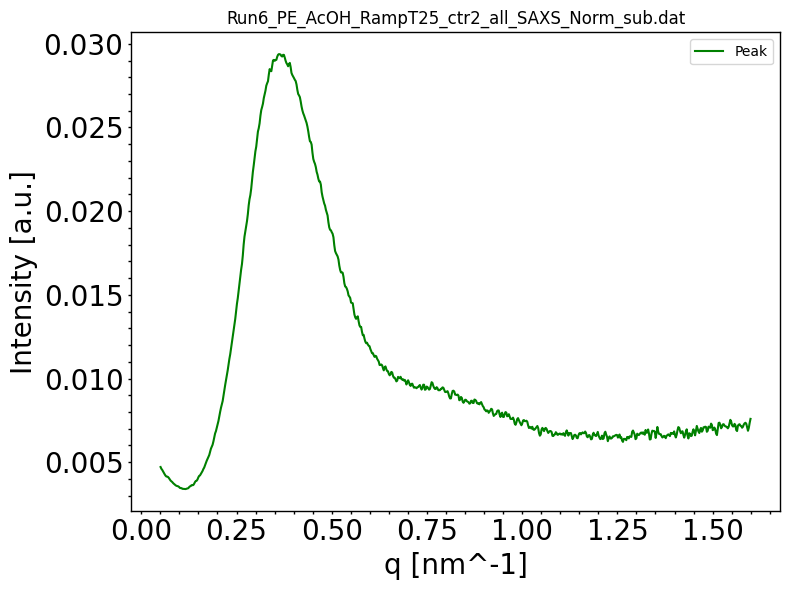


Processing keyword: _ctr3_
Found 1 files for keyword '_ctr3_'

Processing file: Run6_PE_AcOH_RampT27_ctr3_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129183.92, bstop=4.465003333333333, ctemp=29.595519, I0=21.06884333333333
Data size after truncation: 704 points
Peak area: 0.030112459535170145 ± 8.917105438022063e-05


<Figure size 640x480 with 0 Axes>

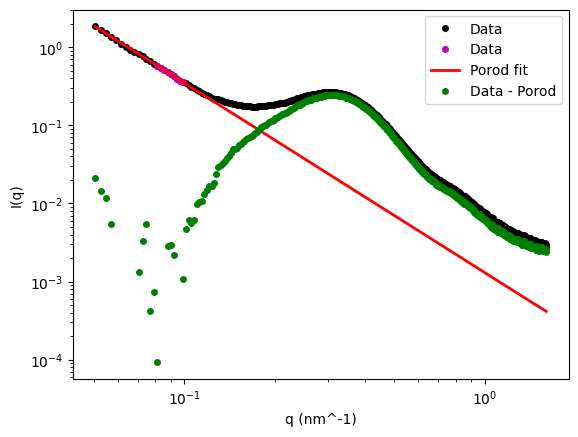

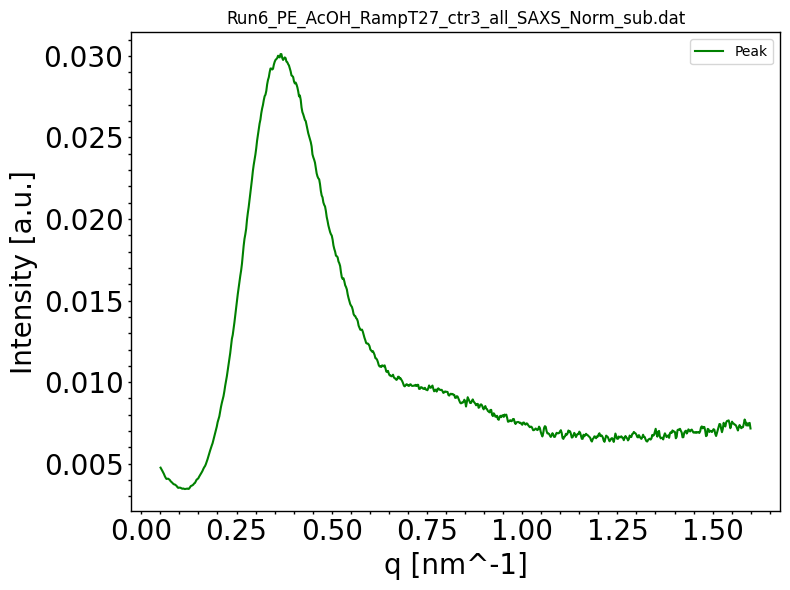


Processing keyword: _ctr4_
Found 1 files for keyword '_ctr4_'

Processing file: Run6_PE_AcOH_RampT30_ctr4_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129228.75, bstop=4.4589533333333335, ctemp=29.933646666666665, I0=21.023506666666666
Data size after truncation: 704 points
Peak area: 0.030248902077799567 ± 8.932414055921233e-05


<Figure size 640x480 with 0 Axes>

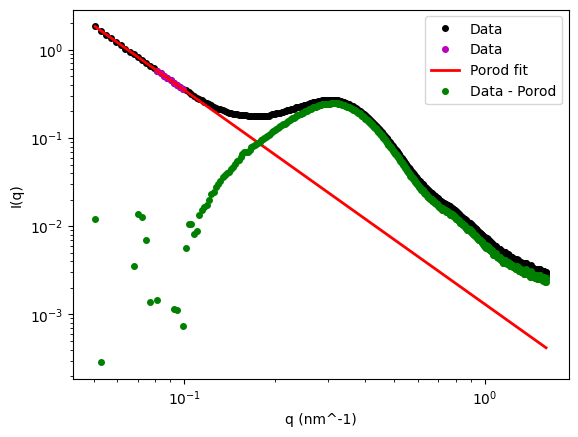

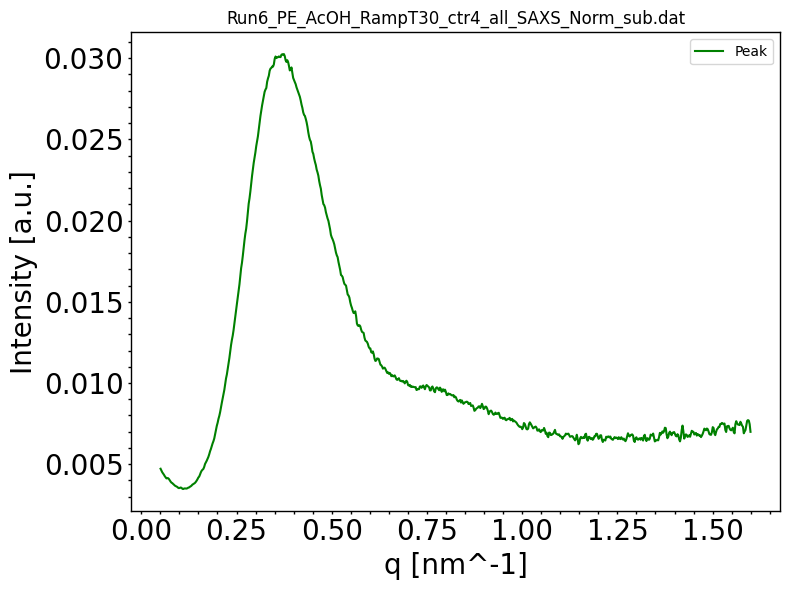


Processing keyword: _ctr5_
Found 1 files for keyword '_ctr5_'

Processing file: Run6_PE_AcOH_RampT32_ctr5_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129304.59333333334, bstop=4.502483333333333, ctemp=34.345937, I0=21.27558
Data size after truncation: 704 points
Peak area: 0.030732194097132178 ± 8.849112411131587e-05


<Figure size 640x480 with 0 Axes>

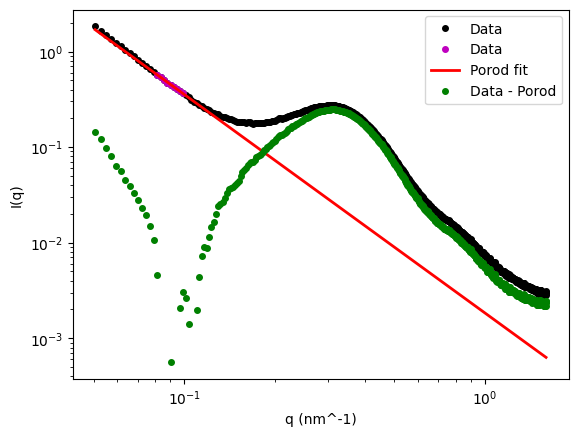

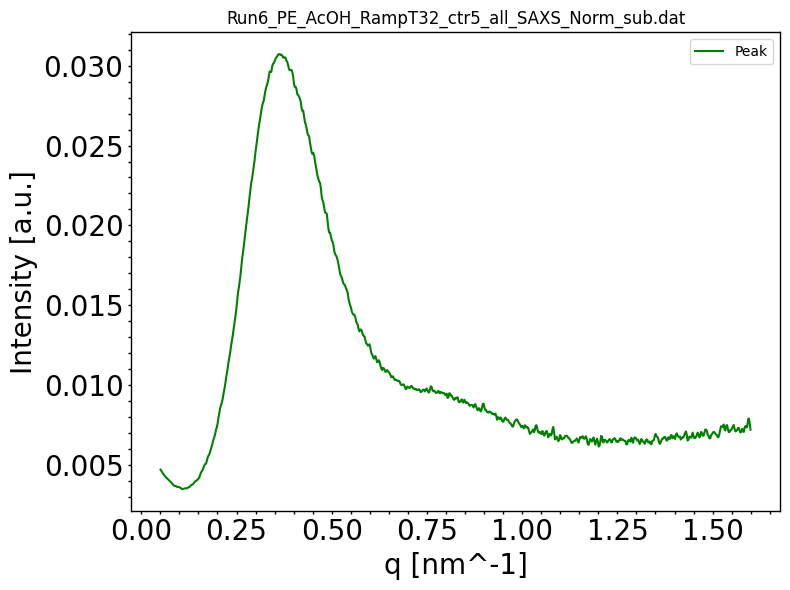


Processing keyword: _ctr6_
Found 1 files for keyword '_ctr6_'

Processing file: Run6_PE_AcOH_RampT35_ctr6_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129376.74333333333, bstop=4.49233, ctemp=36.624919999999996, I0=21.201773333333332
Data size after truncation: 704 points
Peak area: 0.03133575959969753 ± 8.856006850084954e-05


<Figure size 640x480 with 0 Axes>

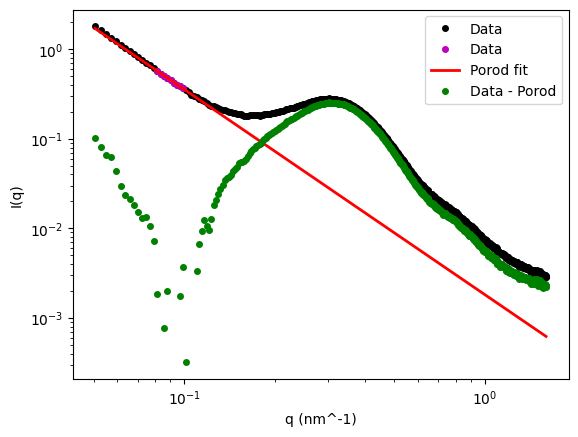

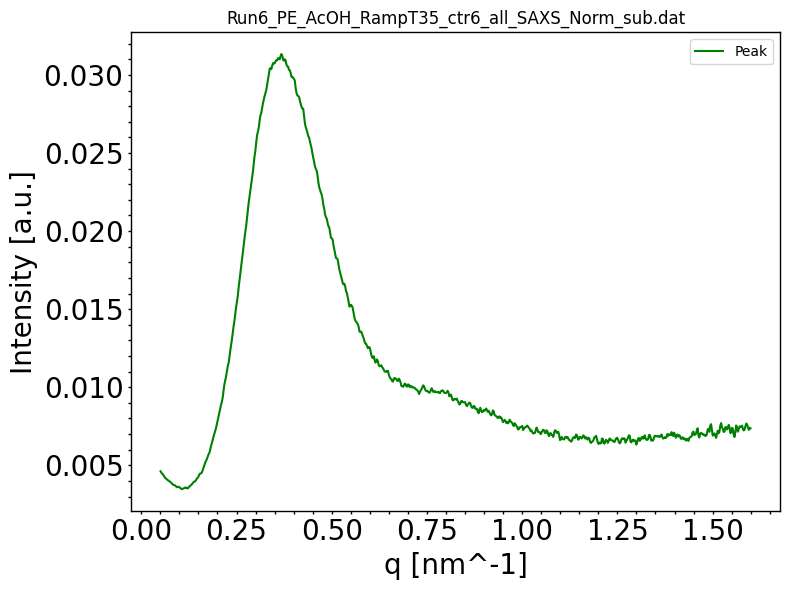


Processing keyword: _ctr7_
Found 1 files for keyword '_ctr7_'

Processing file: Run6_PE_AcOH_RampT37_ctr7_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129451.43333333333, bstop=4.48036, ctemp=39.09291566666666, I0=21.1027
Data size after truncation: 704 points
Peak area: 0.031847823645363406 ± 8.912157208499301e-05


<Figure size 640x480 with 0 Axes>

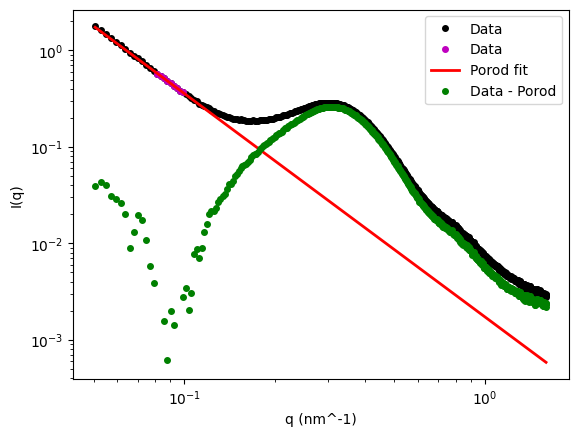

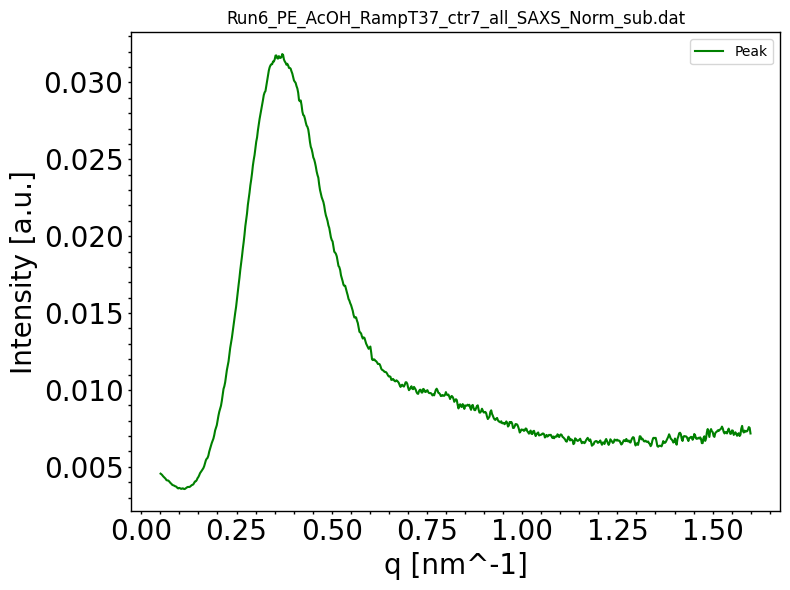


Processing keyword: _ctr8_
Found 1 files for keyword '_ctr8_'

Processing file: Run6_PE_AcOH_RampT40_ctr8_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129528.57, bstop=4.467663333333333, ctemp=41.57303, I0=21.00780333333333
Data size after truncation: 704 points
Peak area: 0.03265785037343585 ± 8.989147975556e-05


<Figure size 640x480 with 0 Axes>

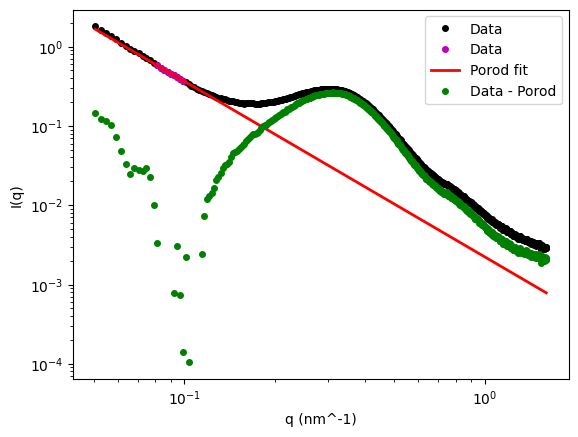

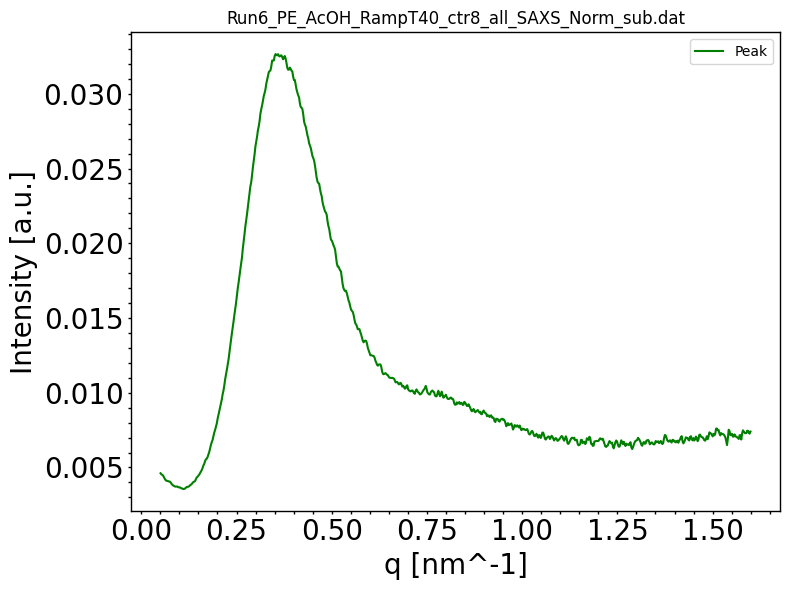


Processing keyword: _ctr9_
Found 1 files for keyword '_ctr9_'

Processing file: Run6_PE_AcOH_RampT42_ctr9_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129607.42333333334, bstop=4.510913333333334, ctemp=43.98438766666666, I0=21.23734
Data size after truncation: 704 points
Peak area: 0.033088134013538245 ± 8.903305898192981e-05


<Figure size 640x480 with 0 Axes>

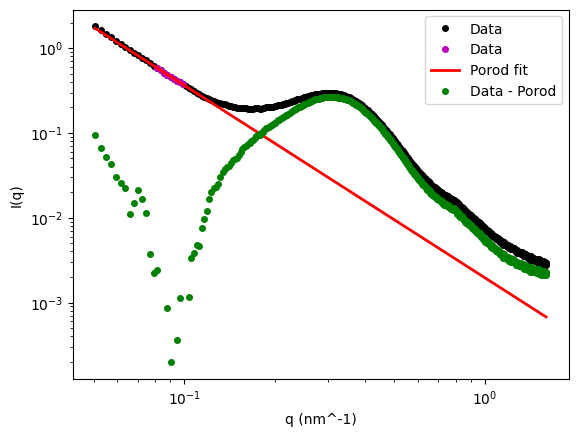

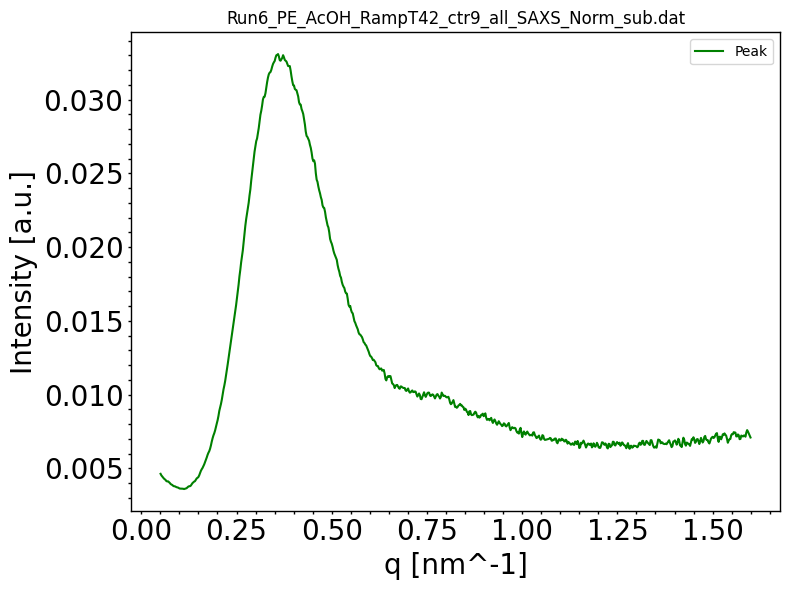


Processing keyword: _ctr10_
Found 1 files for keyword '_ctr10_'

Processing file: Run6_PE_AcOH_RampT45_ctr10_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129688.78000000001, bstop=4.49488, ctemp=46.41739666666666, I0=21.157
Data size after truncation: 704 points
Peak area: 0.03385818722067826 ± 8.988875739642305e-05


<Figure size 640x480 with 0 Axes>

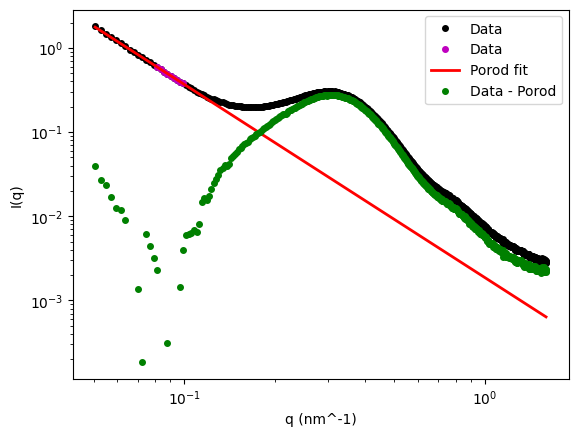

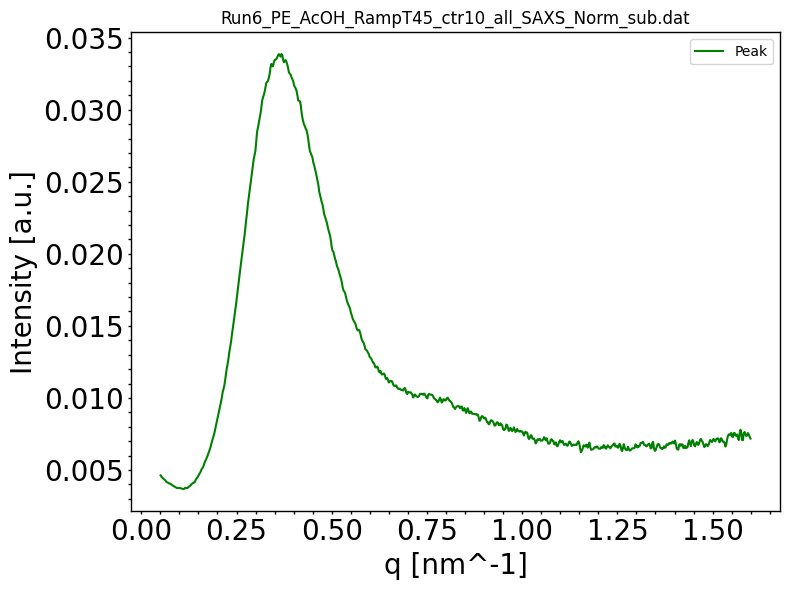


Processing keyword: _ctr11_
Found 1 files for keyword '_ctr11_'

Processing file: Run6_PE_AcOH_RampT47_ctr11_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129772.62, bstop=4.4844566666666665, ctemp=48.83392333333333, I0=21.08565666666667
Data size after truncation: 704 points
Peak area: 0.03462528944801688 ± 9.071825096979484e-05


<Figure size 640x480 with 0 Axes>

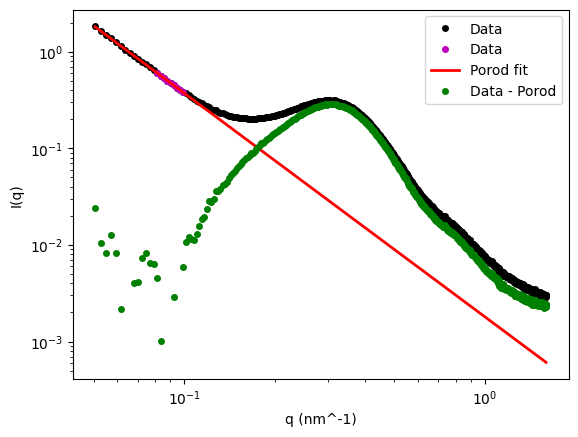

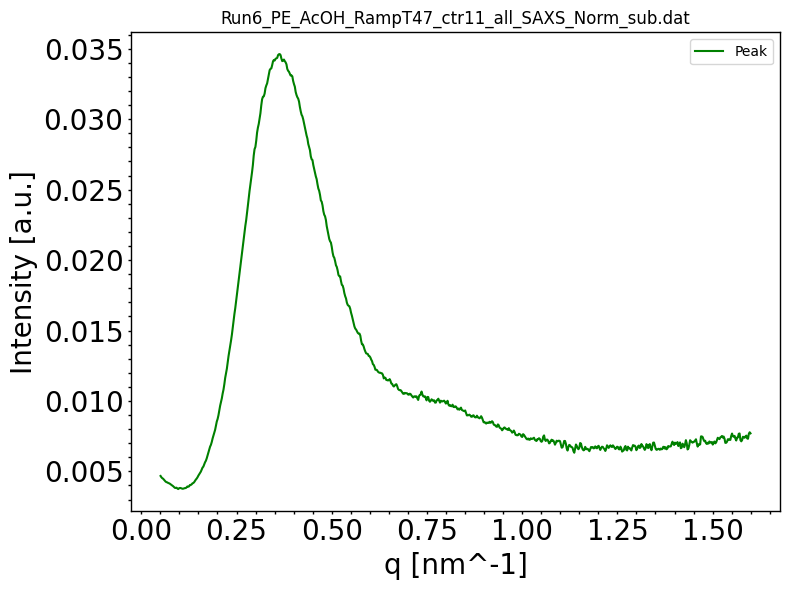


Processing keyword: _ctr12_
Found 1 files for keyword '_ctr12_'

Processing file: Run6_PE_AcOH_RampT50_ctr12_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129858.95333333332, bstop=4.460719999999999, ctemp=51.24975733333333, I0=20.97548
Data size after truncation: 704 points
Peak area: 0.035318555505371954 ± 9.225812322135109e-05


<Figure size 640x480 with 0 Axes>

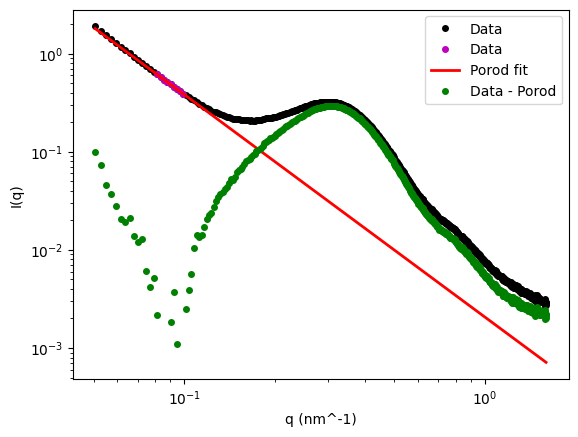

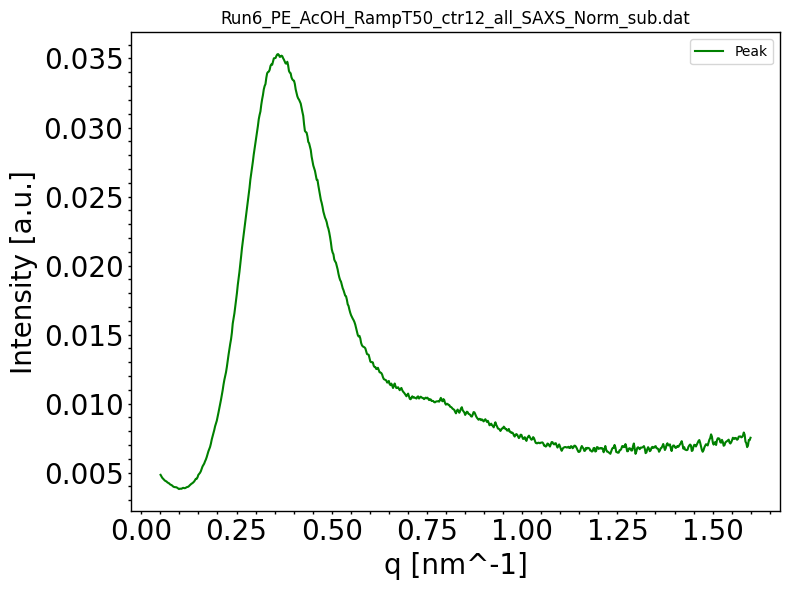


Processing keyword: _ctr13_
Found 1 files for keyword '_ctr13_'

Processing file: Run6_PE_AcOH_RampT52_ctr13_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129948.01333333335, bstop=4.50465, ctemp=53.65444933333333, I0=21.172046666666667
Data size after truncation: 704 points
Peak area: 0.03565946661793714 ± 9.136799305860889e-05


<Figure size 640x480 with 0 Axes>

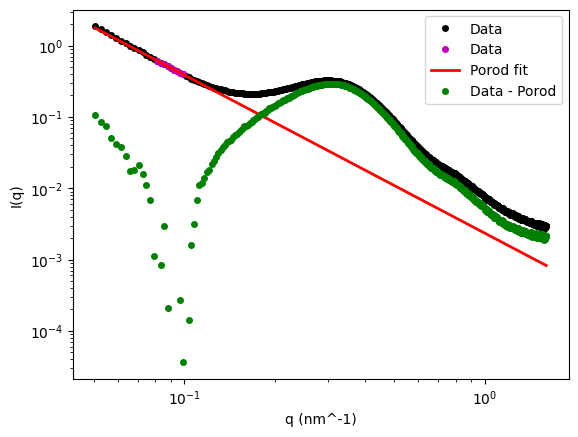

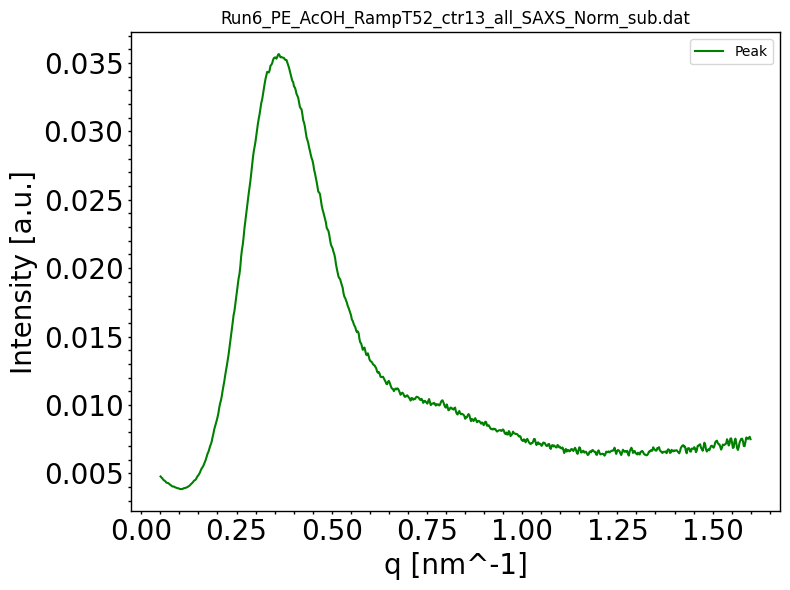


Processing keyword: _ctr14_
Found 1 files for keyword '_ctr14_'

Processing file: Run6_PE_AcOH_RampT55_ctr14_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130040.59333333334, bstop=4.491716666666666, ctemp=56.066476, I0=21.117523333333335
Data size after truncation: 704 points
Peak area: 0.036467958969985795 ± 9.242030980644923e-05


<Figure size 640x480 with 0 Axes>

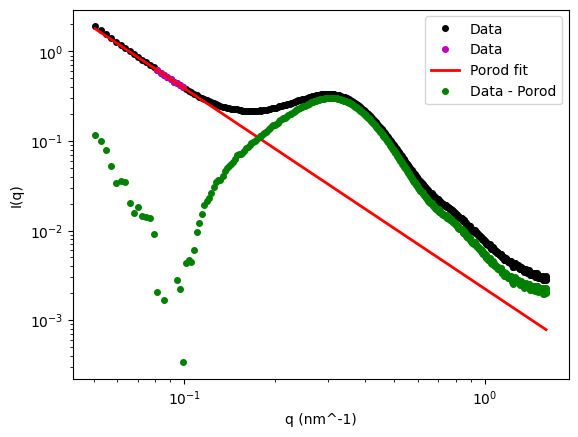

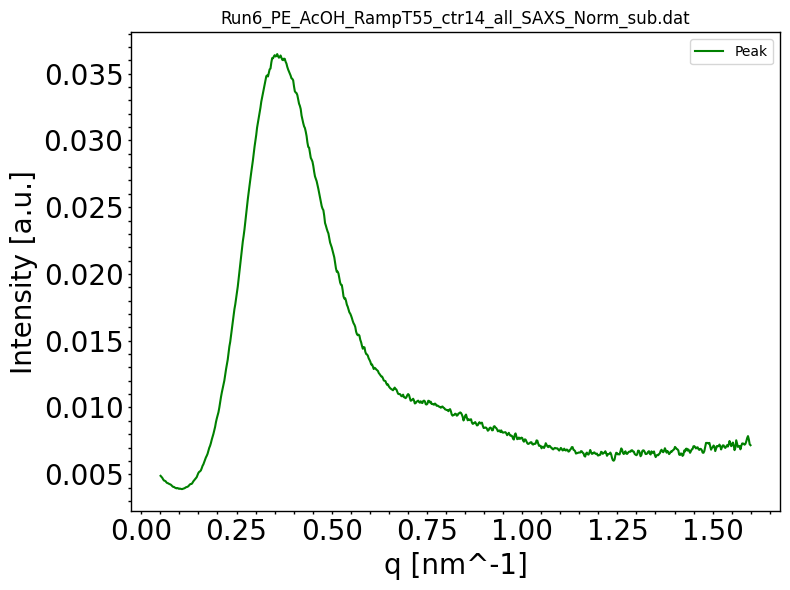


Processing keyword: _ctr15_
Found 1 files for keyword '_ctr15_'

Processing file: Run6_PE_AcOH_RampT57_ctr15_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130135.31666666665, bstop=4.47785, ctemp=58.47857666666667, I0=20.995743333333333
Data size after truncation: 704 points
Peak area: 0.037417785983029764 ± 9.373592072464623e-05


<Figure size 640x480 with 0 Axes>

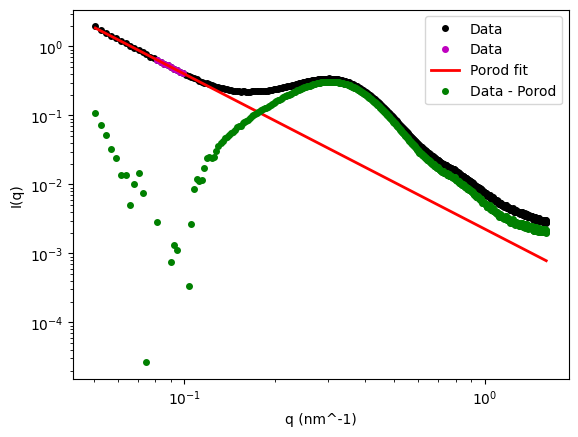

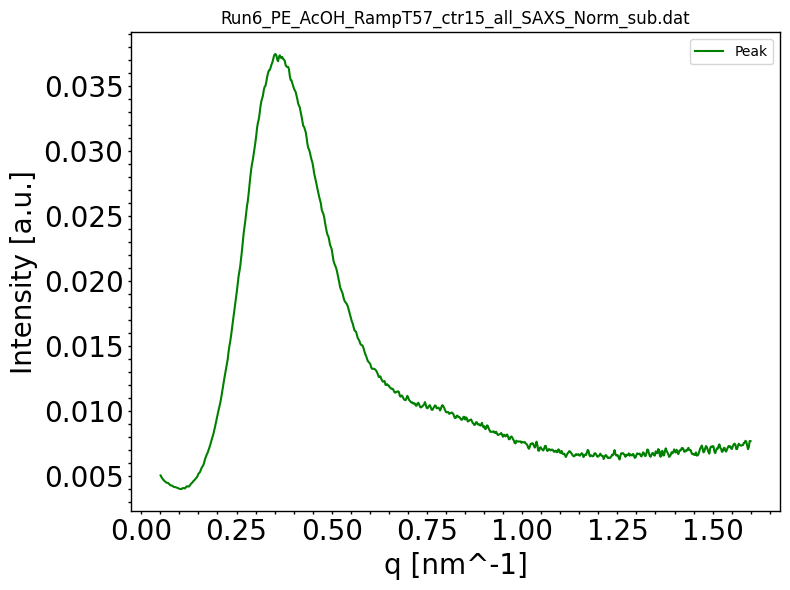


Processing keyword: _ctr16_
Found 1 files for keyword '_ctr16_'

Processing file: Run6_PE_AcOH_RampT60_ctr16_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130232.03666666667, bstop=4.518483333333333, ctemp=60.89105333333333, I0=21.152693333333332
Data size after truncation: 704 points
Peak area: 0.03792850538496762 ± 9.352965048910937e-05


<Figure size 640x480 with 0 Axes>

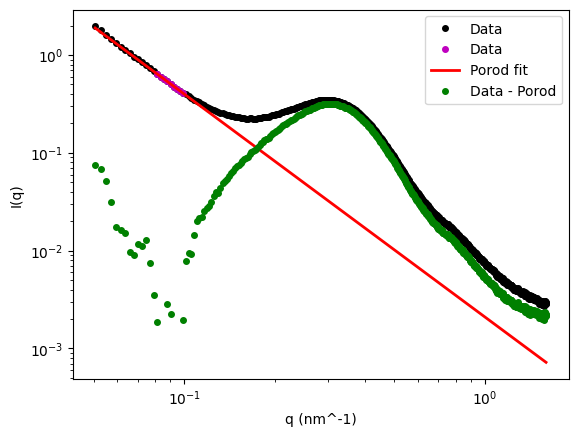

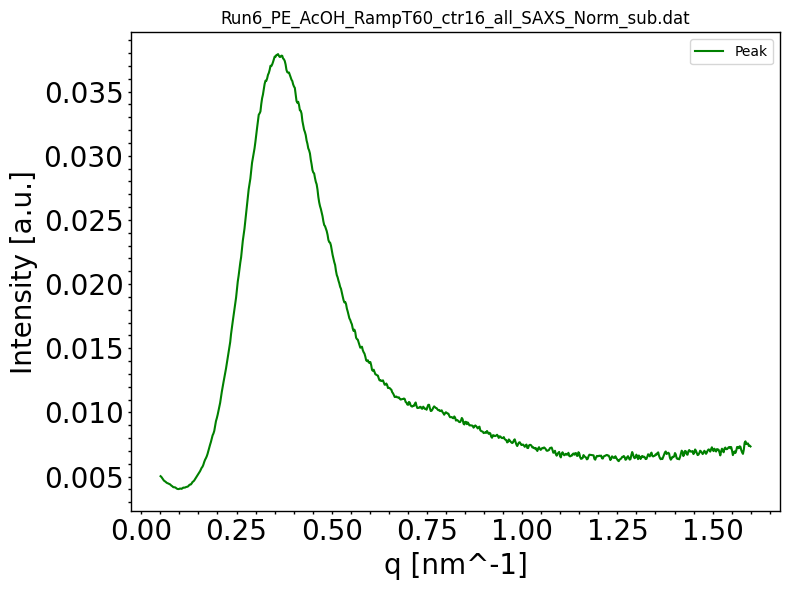


Processing keyword: _ctr17_
Found 1 files for keyword '_ctr17_'

Processing file: Run6_PE_AcOH_RampT62_ctr17_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130332.09999999999, bstop=1.85325, ctemp=63.72251666666667, I0=7.242273333333333
Data size after truncation: 704 points
Peak area: 0.09214009745277871 ± 0.0003839991831918242


<Figure size 640x480 with 0 Axes>

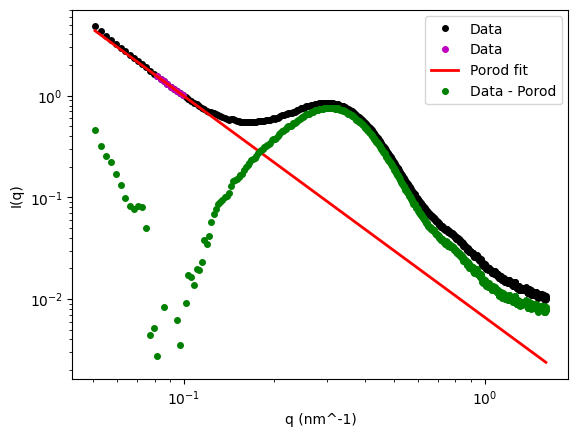

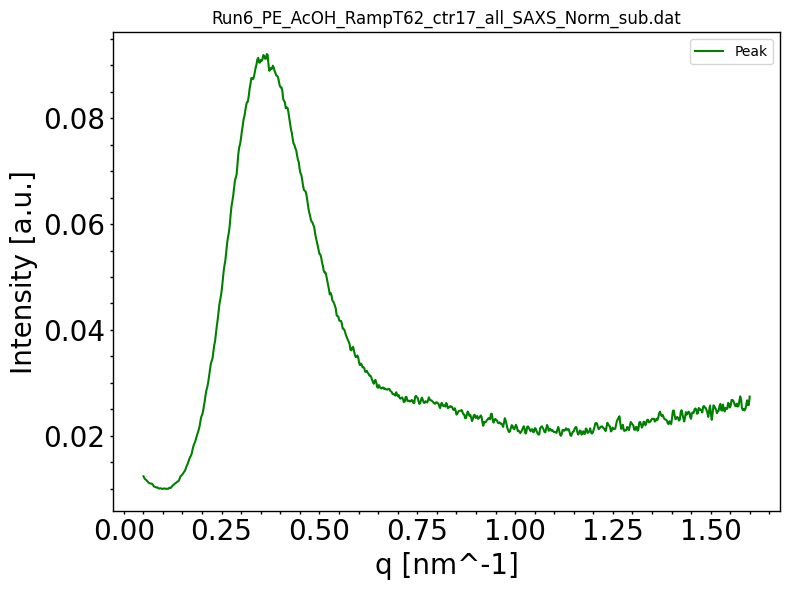


Processing keyword: _ctr18_
Found 1 files for keyword '_ctr18_'

Processing file: Run6_PE_AcOH_RampT65_ctr18_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130411.67, bstop=4.48102, ctemp=67.12642633333333, I0=20.98375
Data size after truncation: 704 points
Peak area: 0.04004453651754399 ± 9.622658238098215e-05


<Figure size 640x480 with 0 Axes>

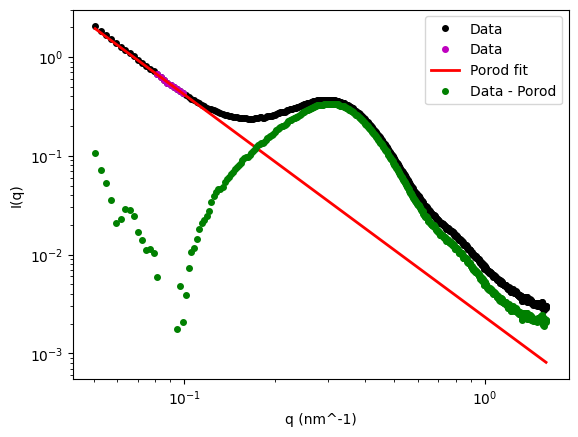

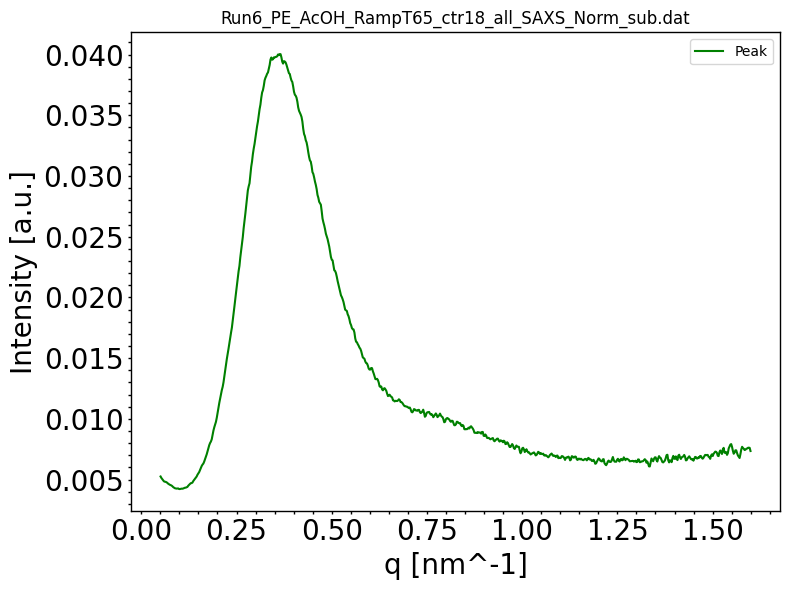


Processing keyword: _ctr19_
Found 1 files for keyword '_ctr19_'

Processing file: Run6_PE_AcOH_RampT67_ctr19_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130488.83, bstop=4.514473333333334, ctemp=69.51754766666666, I0=21.149323333333335
Data size after truncation: 704 points
Peak area: 0.04048439432378682 ± 9.59411324950462e-05


<Figure size 640x480 with 0 Axes>

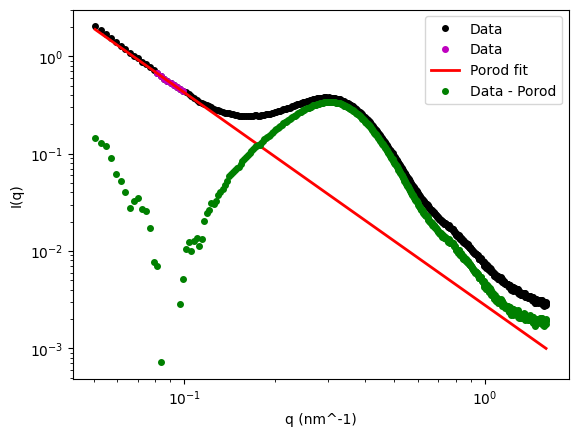

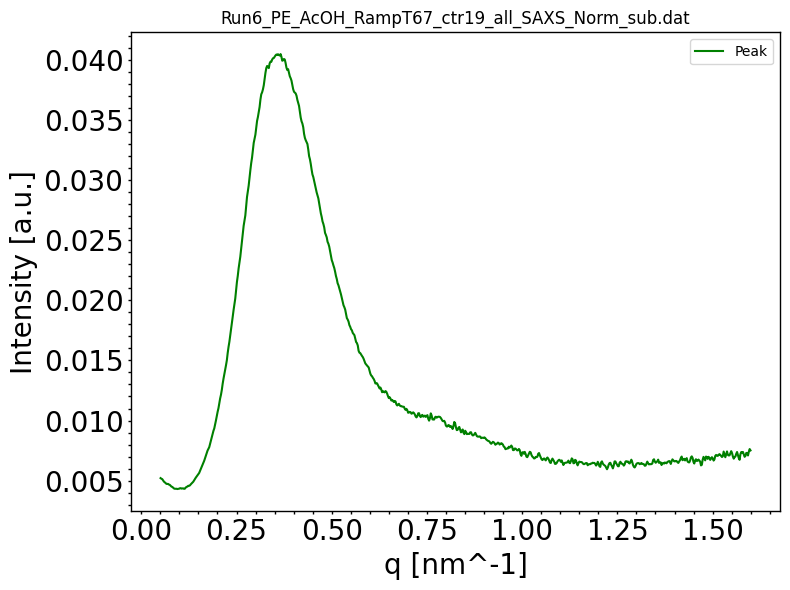


Processing keyword: _ctr20_
Found 1 files for keyword '_ctr20_'

Processing file: Run6_PE_AcOH_RampT70_ctr20_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130567.55666666666, bstop=4.522706666666667, ctemp=71.93394966666666, I0=21.156566666666667
Data size after truncation: 704 points
Peak area: 0.04161702530302381 ± 9.664158221881846e-05


<Figure size 640x480 with 0 Axes>

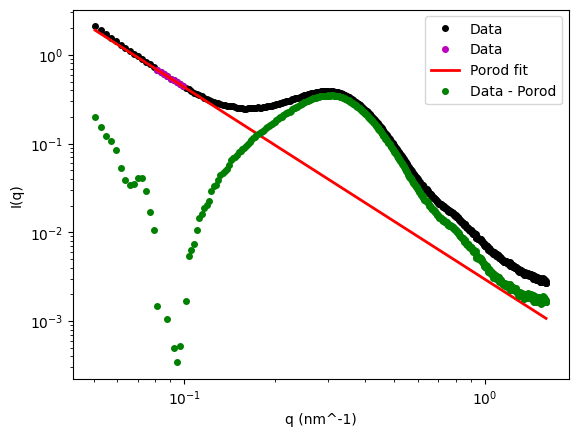

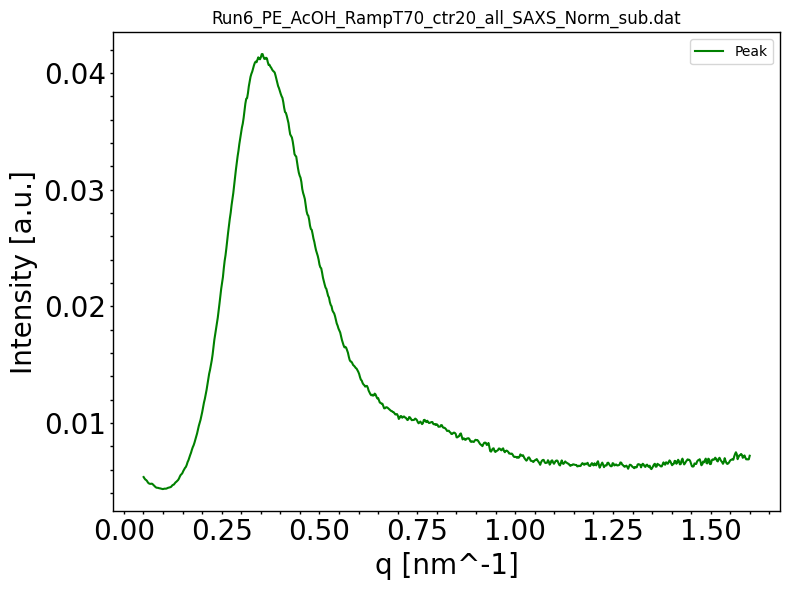


Processing keyword: _ctr21_
Found 1 files for keyword '_ctr21_'

Processing file: Run6_PE_AcOH_RampT72_ctr21_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130647.68333333333, bstop=4.50086, ctemp=74.35858133333333, I0=21.041443333333333
Data size after truncation: 704 points
Peak area: 0.042947493435424415 ± 9.795913193009803e-05


<Figure size 640x480 with 0 Axes>

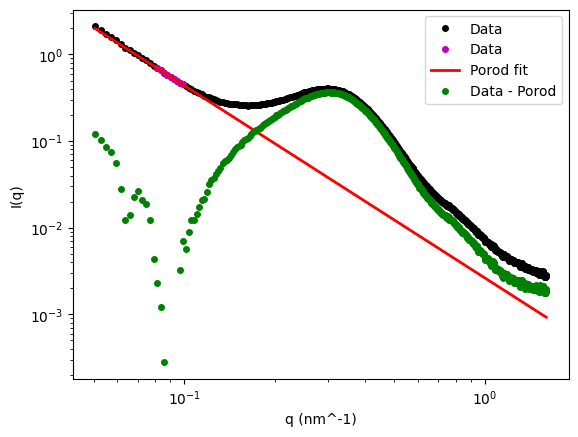

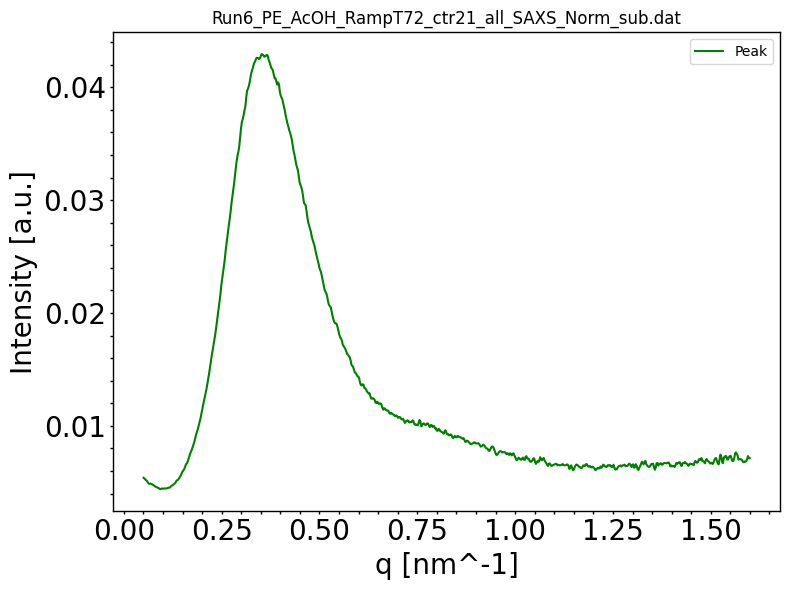


Processing keyword: _ctr22_
Found 1 files for keyword '_ctr22_'

Processing file: Run6_PE_AcOH_RampT75_ctr22_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130729.00333333334, bstop=4.4886333333333335, ctemp=76.747477, I0=20.97695
Data size after truncation: 704 points
Peak area: 0.044146541175508314 ± 9.924623463814941e-05


<Figure size 640x480 with 0 Axes>

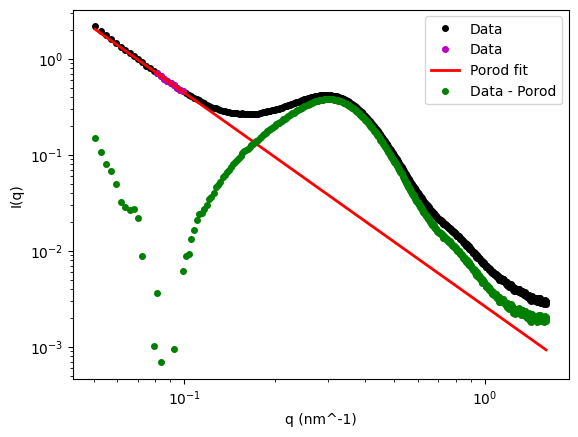

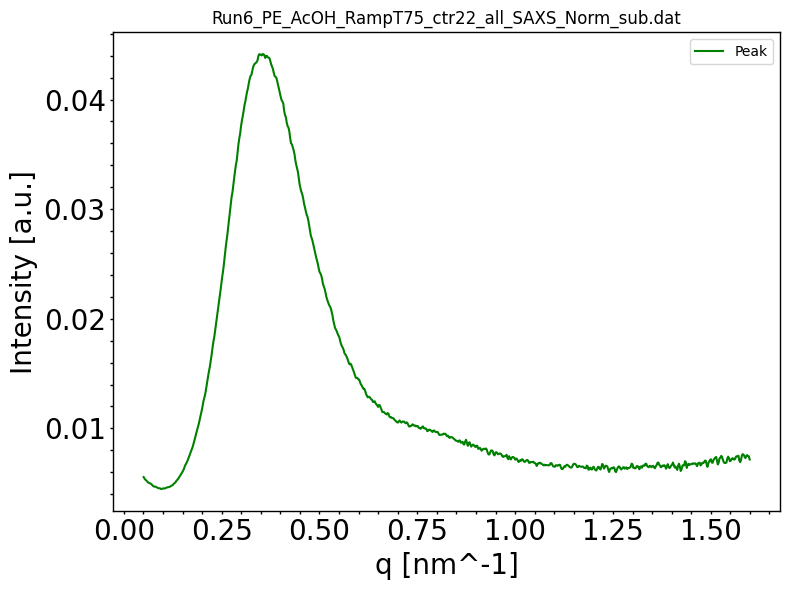


Processing keyword: _ctr23_
Found 1 files for keyword '_ctr23_'

Processing file: Run6_PE_AcOH_RampT77_ctr23_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130810.86, bstop=4.5429466666666665, ctemp=79.19364433333334, I0=21.21479666666667
Data size after truncation: 704 points
Peak area: 0.04526342147326275 ± 9.854299386971808e-05


<Figure size 640x480 with 0 Axes>

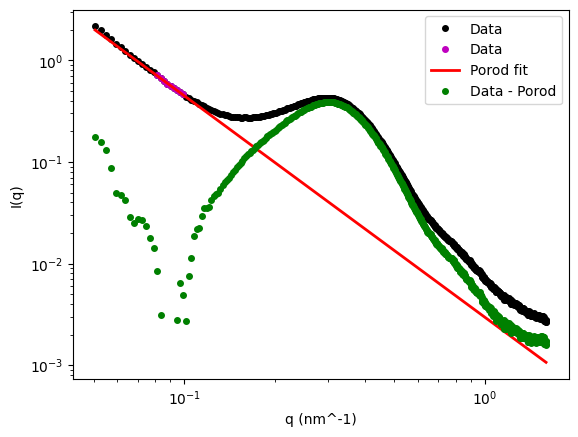

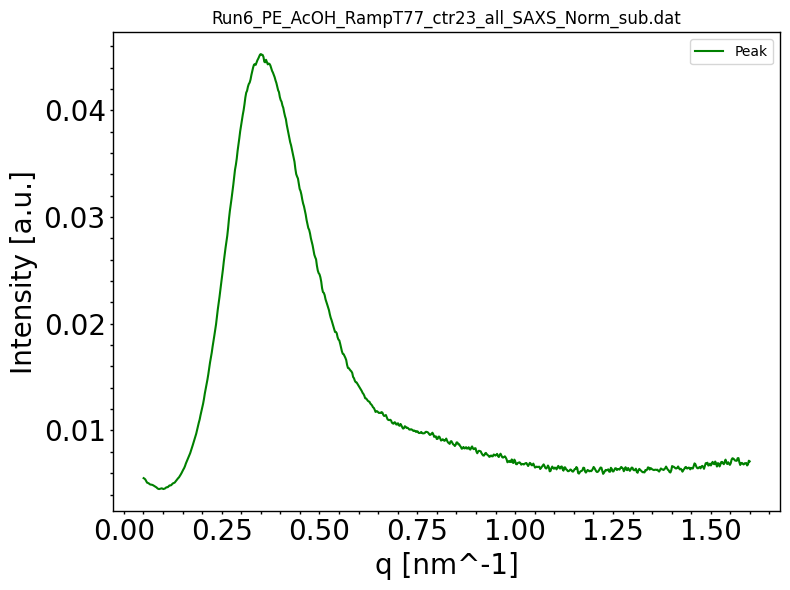


Processing keyword: _ctr24_
Found 1 files for keyword '_ctr24_'

Processing file: Run6_PE_AcOH_RampT80_ctr24_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130894.89333333333, bstop=4.5192000000000005, ctemp=81.57122033333333, I0=21.08801
Data size after truncation: 704 points
Peak area: 0.04688500853269099 ± 0.0001002272761521704


<Figure size 640x480 with 0 Axes>

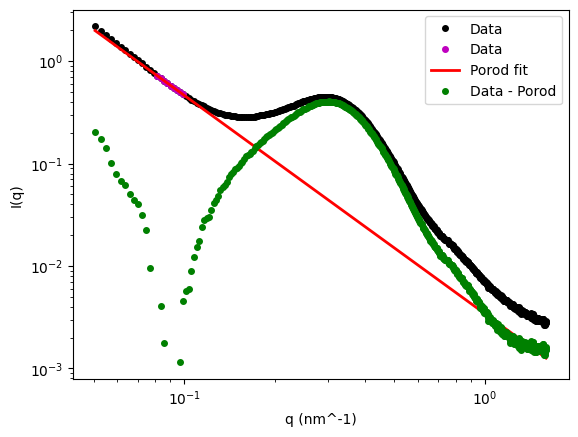

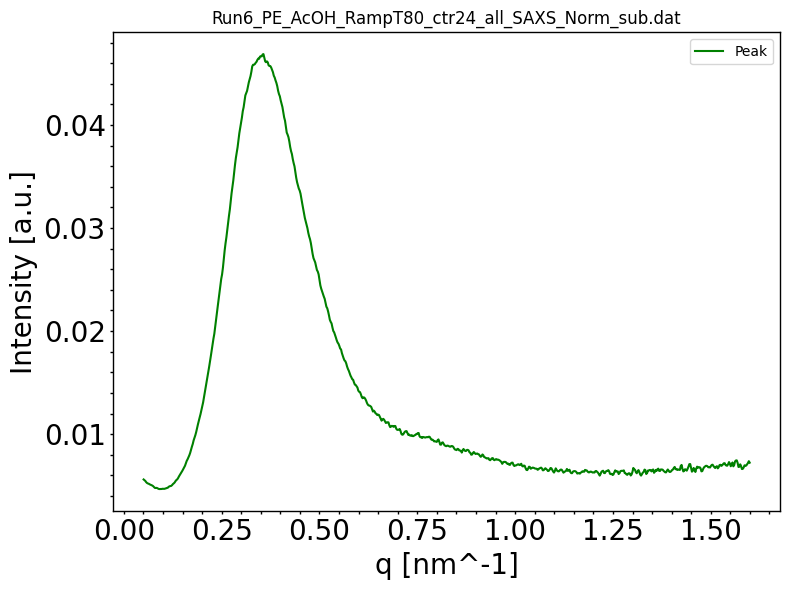


Processing keyword: _ctr25_
Found 1 files for keyword '_ctr25_'

Processing file: Run6_PE_AcOH_RampT82_ctr25_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130980.5, bstop=4.5052433333333335, ctemp=83.94775133333333, I0=21.006196666666668
Data size after truncation: 704 points
Peak area: 0.04858395912230713 ± 0.00010148904883894155


<Figure size 640x480 with 0 Axes>

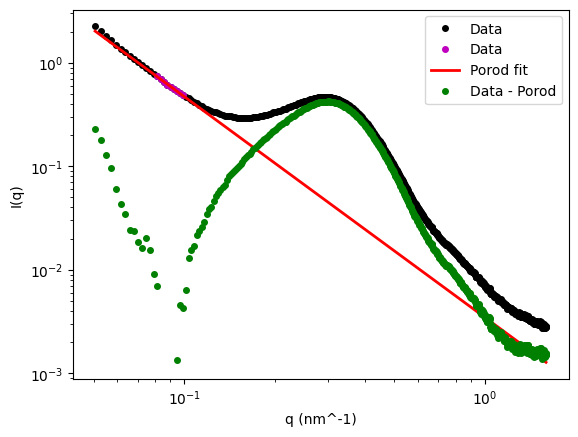

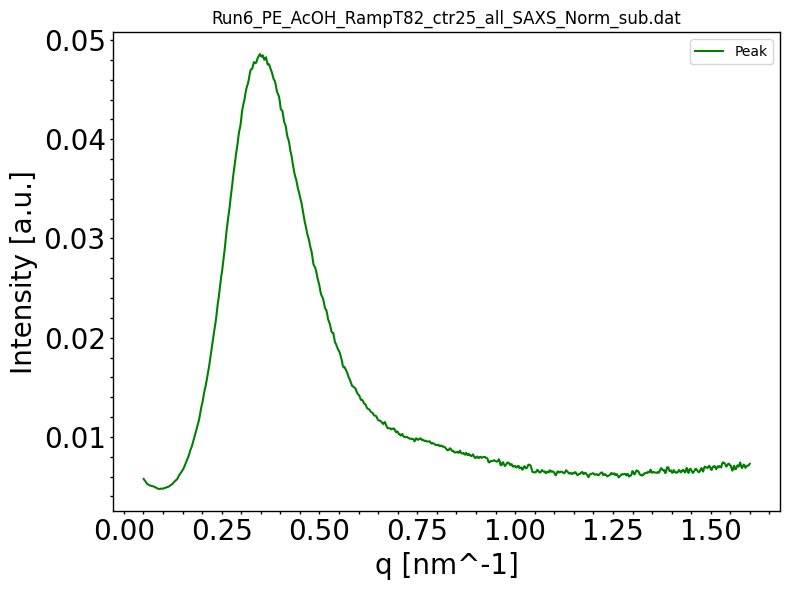


Processing keyword: _ctr26_
Found 1 files for keyword '_ctr26_'

Processing file: Run6_PE_AcOH_RampT85_ctr26_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131065.80333333334, bstop=4.4962133333333325, ctemp=86.42400100000002, I0=20.934859999999997
Data size after truncation: 704 points
Peak area: 0.05013851283222568 ± 0.000102872747297763


<Figure size 640x480 with 0 Axes>

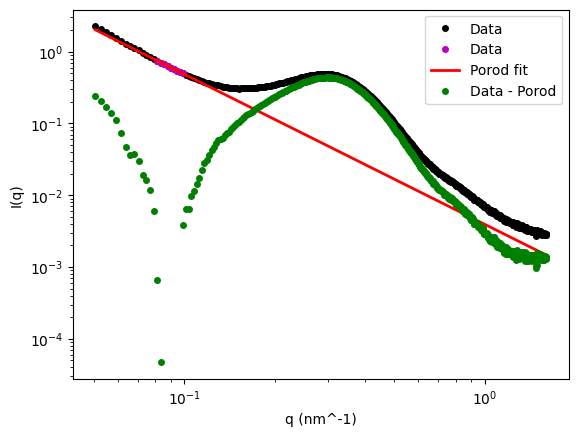

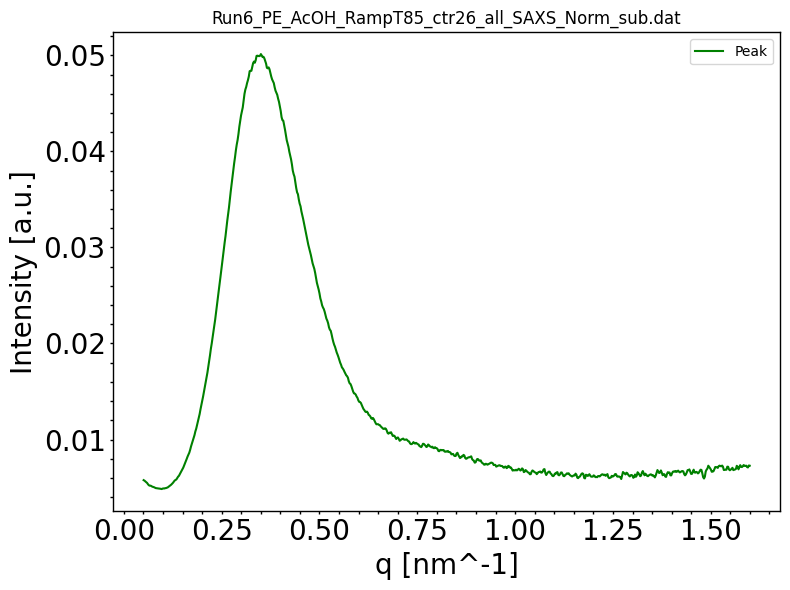


Processing keyword: _ctr27_
Found 1 files for keyword '_ctr27_'

Processing file: Run6_PE_AcOH_RampT87_ctr27_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131153.73, bstop=4.535833333333334, ctemp=88.733022, I0=21.10289333333333
Data size after truncation: 704 points
Peak area: 0.051258050995587605 ± 0.00010258049467781966


<Figure size 640x480 with 0 Axes>

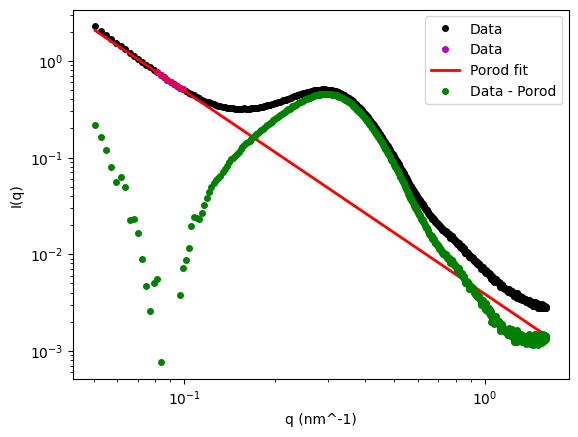

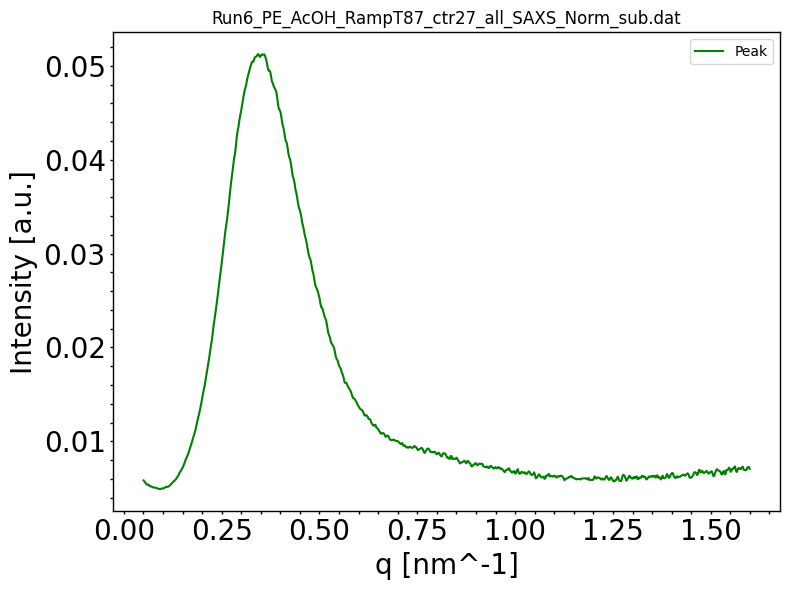


Processing keyword: _ctr28_
Found 1 files for keyword '_ctr28_'

Processing file: Run6_PE_AcOH_RampT90_ctr28_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131241.25666666665, bstop=4.5214, ctemp=91.14335899999999, I0=20.993370000000002
Data size after truncation: 704 points
Peak area: 0.05354678354779101 ± 0.00010456632817806433


<Figure size 640x480 with 0 Axes>

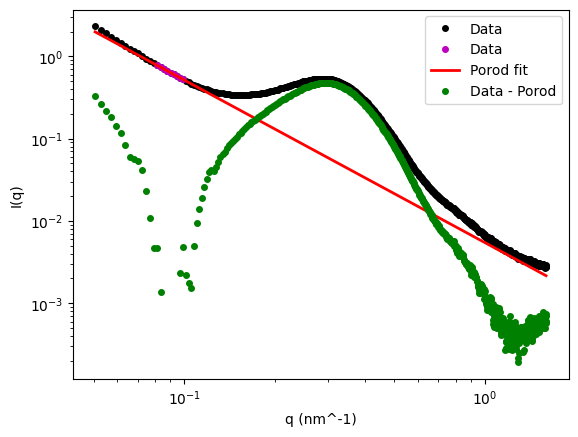

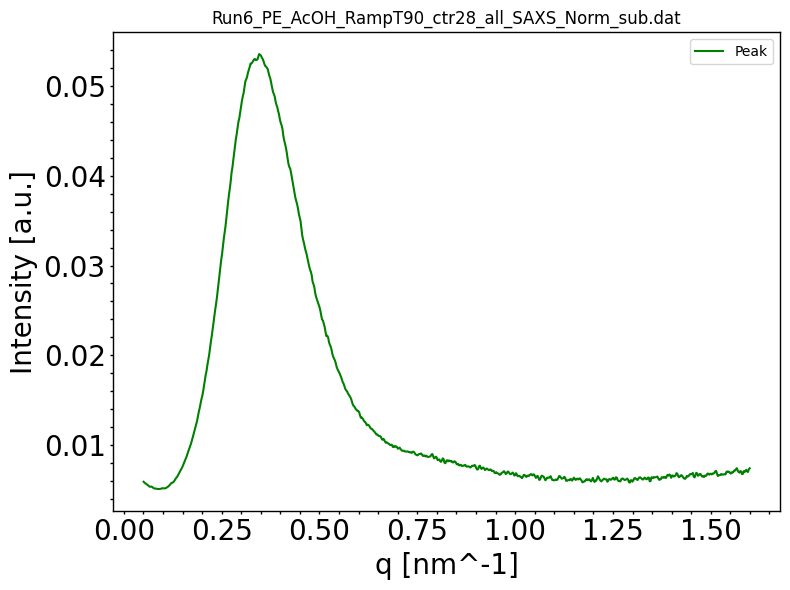


Processing keyword: _ctr29_
Found 1 files for keyword '_ctr29_'

Processing file: Run6_PE_AcOH_RampT92_ctr29_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131328.88, bstop=4.510703333333333, ctemp=93.53049700000001, I0=20.915270000000003
Data size after truncation: 704 points
Peak area: 0.05570181497404883 ± 0.00010631298508917247


<Figure size 640x480 with 0 Axes>

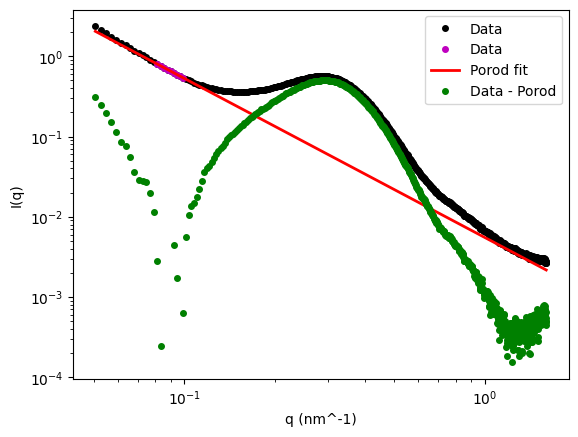

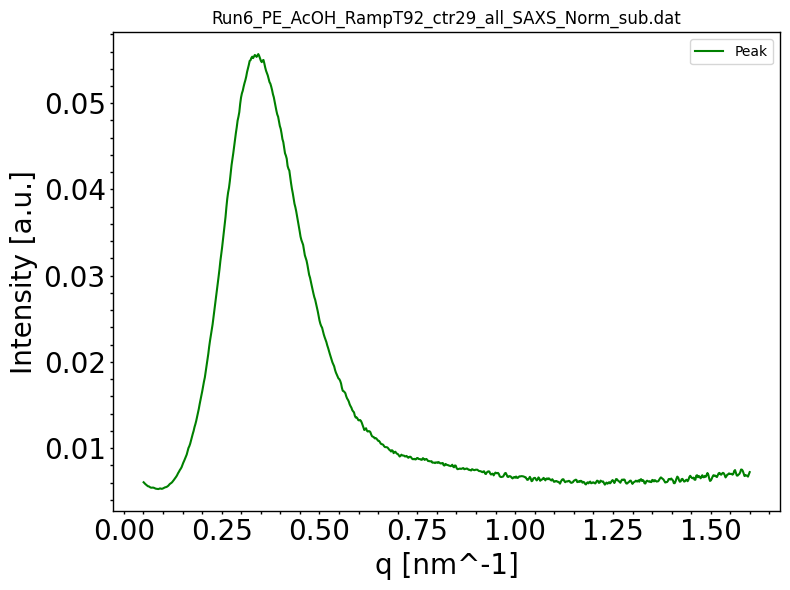


Processing keyword: _ctr30_
Found 1 files for keyword '_ctr30_'

Processing file: Run6_PE_AcOH_RampT95_ctr30_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131414.44666666666, bstop=4.551893333333333, ctemp=96.020055, I0=21.12174333333333
Data size after truncation: 704 points
Peak area: 0.05748345162873502 ± 0.00010635624562005924


<Figure size 640x480 with 0 Axes>

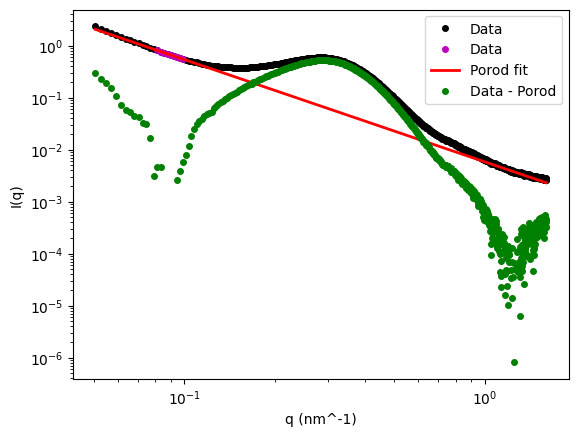

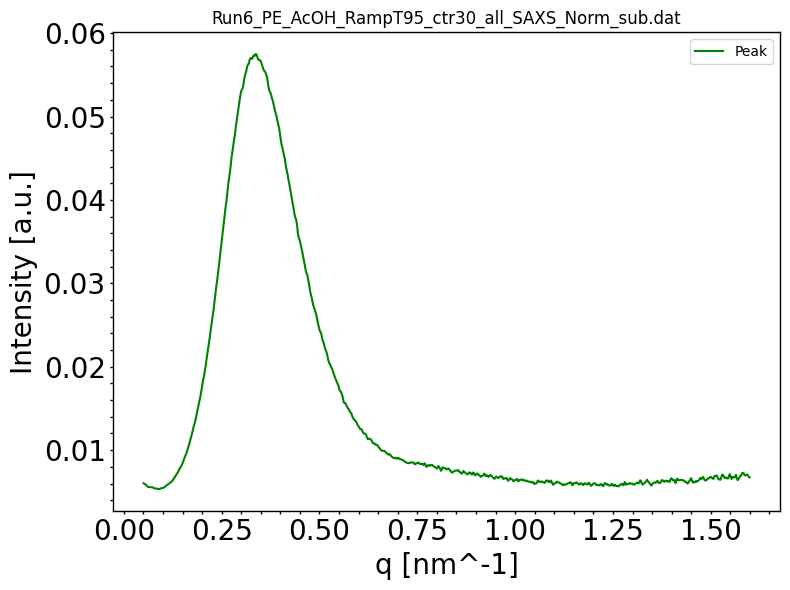


Processing keyword: _ctr31_
Found 1 files for keyword '_ctr31_'

Processing file: Run6_PE_AcOH_RampT97_ctr31_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131501.89333333334, bstop=4.538743333333334, ctemp=98.28188066666667, I0=21.00607666666667
Data size after truncation: 704 points
Peak area: 0.060187801479196223 ± 0.00010899897128464232


<Figure size 640x480 with 0 Axes>

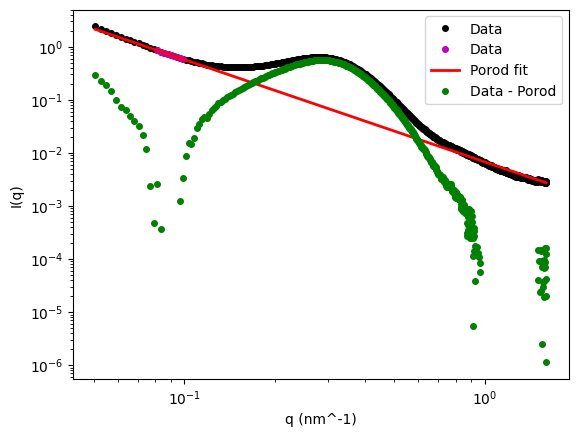

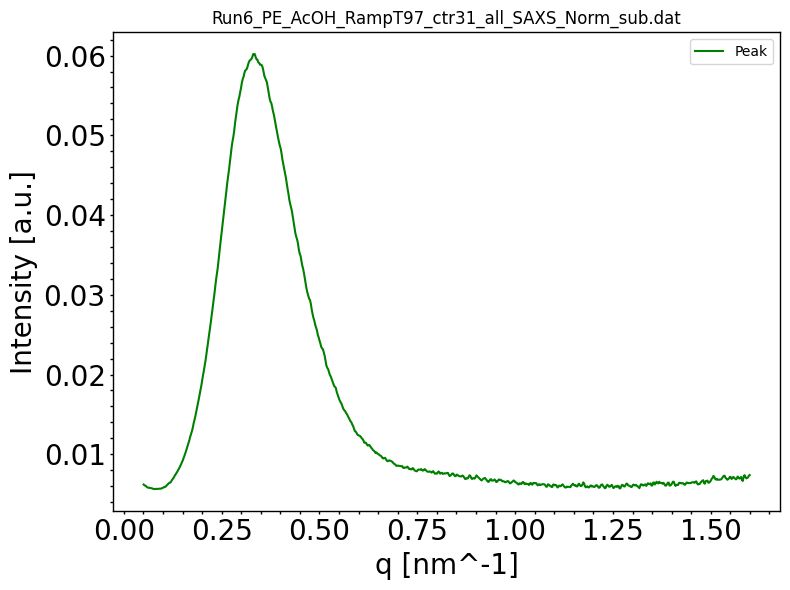


Processing keyword: _ctr32_
Found 1 files for keyword '_ctr32_'

Processing file: Run6_PE_AcOH_RampT100_ctr32_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131595.84333333335, bstop=4.52497, ctemp=102.1275, I0=20.923986666666668
Data size after truncation: 704 points
Peak area: 0.06371794643465495 ± 0.0001130628116179976


<Figure size 640x480 with 0 Axes>

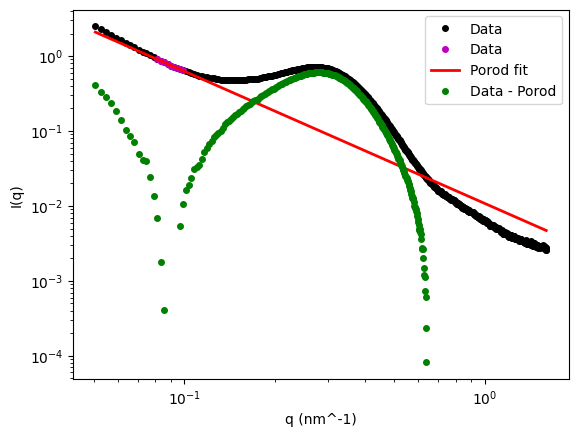

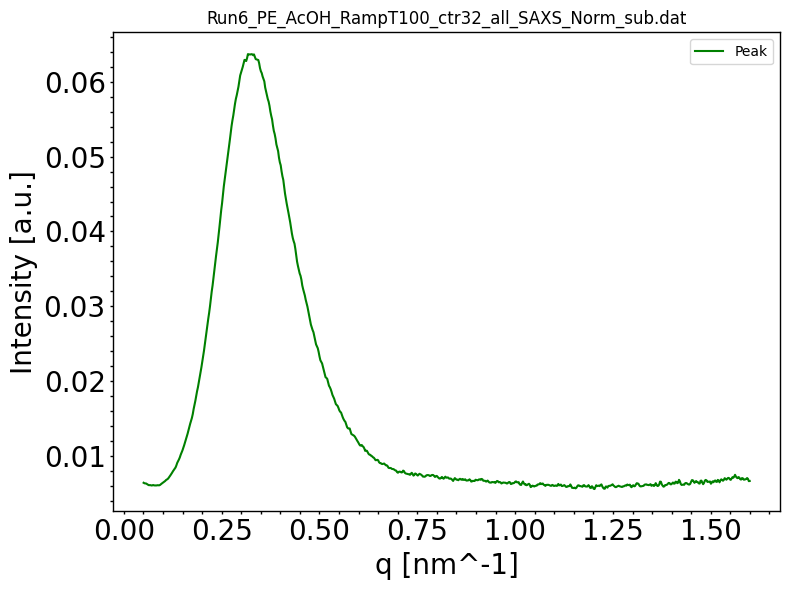


Processing keyword: _ctr33_
Found 1 files for keyword '_ctr33_'

Processing file: Run6_PE_AcOH_RampT102_ctr33_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131687.85333333336, bstop=4.552746666666667, ctemp=103.7401, I0=20.980306666666667
Data size after truncation: 704 points
Peak area: 0.06574807192327464 ± 0.00011342495562900792


<Figure size 640x480 with 0 Axes>

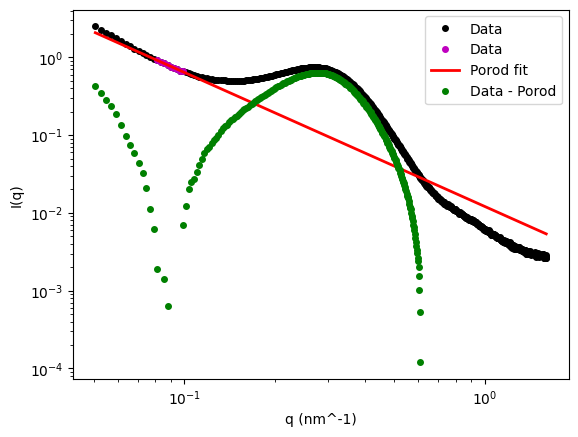

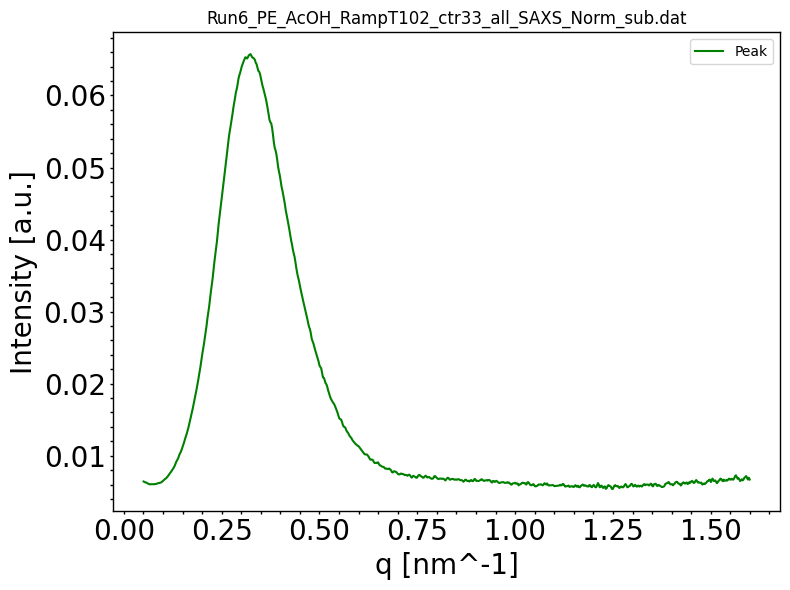


Processing keyword: _ctr34_
Found 1 files for keyword '_ctr34_'

Processing file: Run6_PE_AcOH_RampT105_ctr34_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131784.84333333332, bstop=4.558466666666667, ctemp=105.73513333333334, I0=21.00406
Data size after truncation: 704 points
Peak area: 0.06775378443981447 ± 0.000115600041964053


<Figure size 640x480 with 0 Axes>

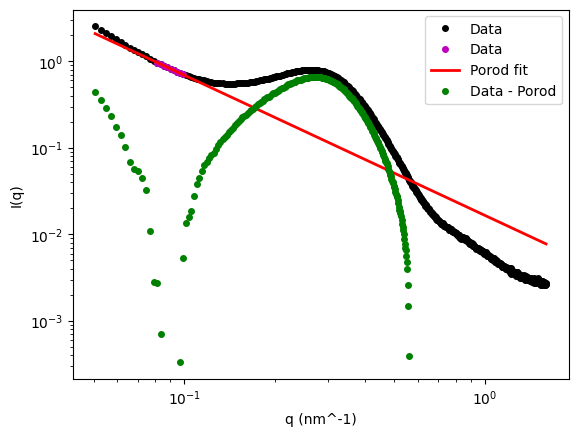

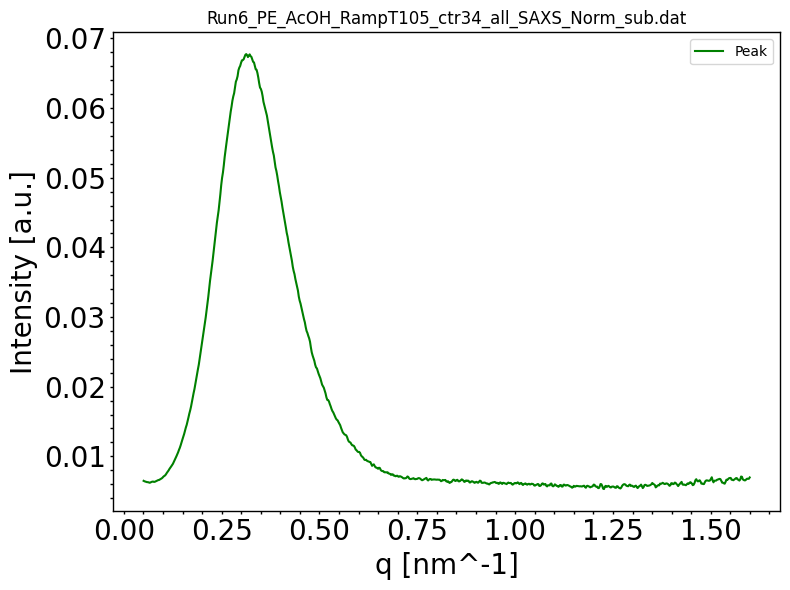


Processing keyword: _ctr35_
Found 1 files for keyword '_ctr35_'

Processing file: Run6_PE_AcOH_RampT107_ctr35_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131874.55000000002, bstop=4.53934, ctemp=108.25900000000001, I0=20.898823333333336
Data size after truncation: 704 points
Peak area: 0.07028296450001897 ± 0.00012009056641635616


<Figure size 640x480 with 0 Axes>

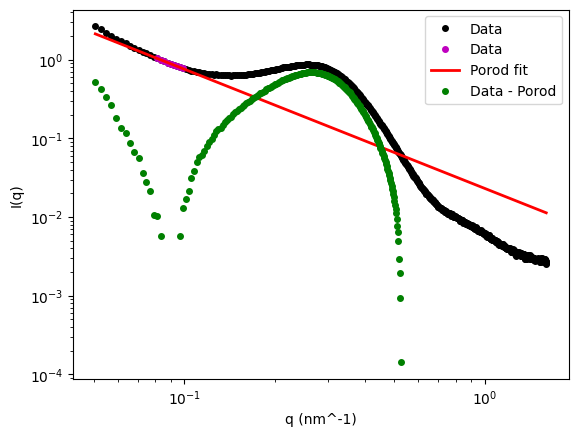

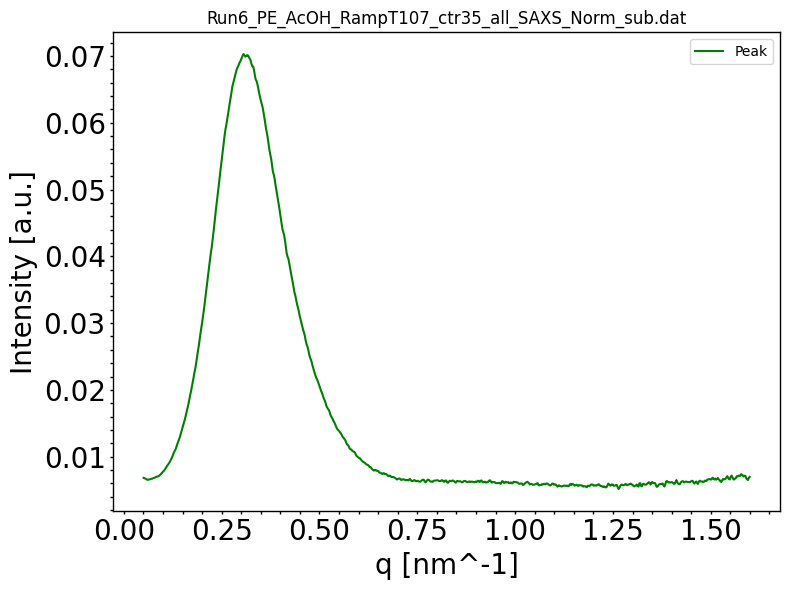


Processing keyword: _ctr36_
Found 1 files for keyword '_ctr36_'

Processing file: Run6_PE_AcOH_RampT110_ctr36_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131964.74333333332, bstop=4.5159899999999995, ctemp=110.78943333333332, I0=20.838693333333335
Data size after truncation: 704 points
Peak area: 0.07276027501395309 ± 0.0001254946748951277


<Figure size 640x480 with 0 Axes>

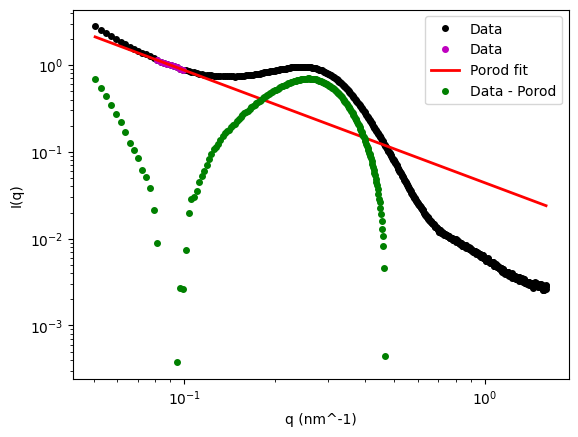

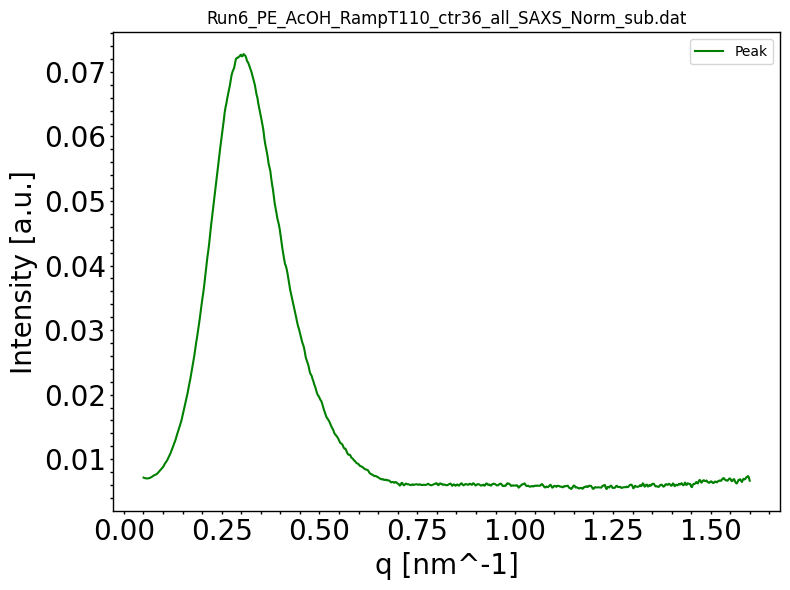


Processing keyword: _ctr37_
Found 1 files for keyword '_ctr37_'

Processing file: Run6_PE_AcOH_RampT112_ctr37_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132056.85666666666, bstop=4.552323333333334, ctemp=113.14893333333333, I0=21.00261
Data size after truncation: 704 points
Peak area: 0.07401135468148141 ± 0.00012950972817252646


<Figure size 640x480 with 0 Axes>

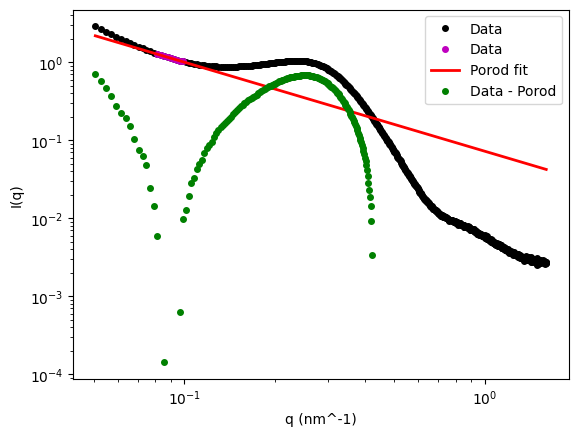

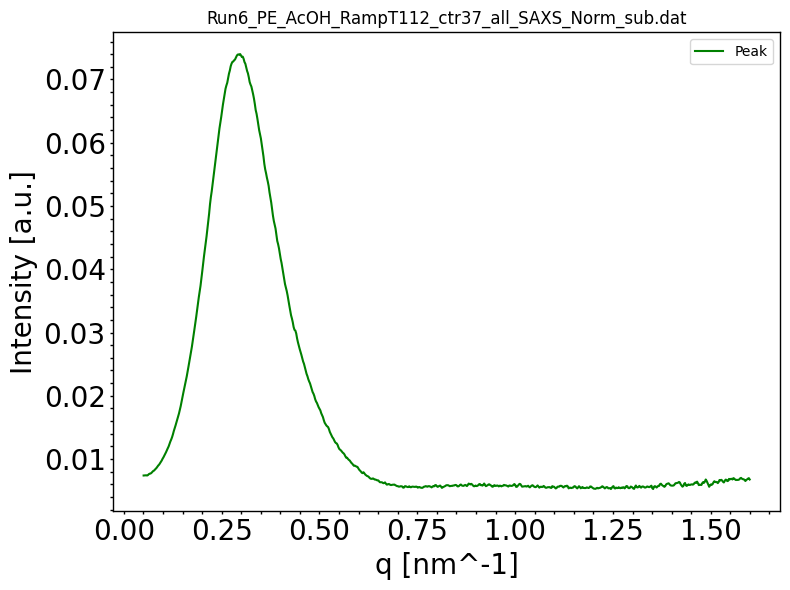


Processing keyword: _ctr38_
Found 1 files for keyword '_ctr38_'

Processing file: Run6_PE_AcOH_RampT115_ctr38_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132148.14, bstop=4.533196666666666, ctemp=115.56276666666668, I0=20.94739
Data size after truncation: 704 points
Peak area: 0.07513656022529955 ± 0.00013732482399944745


<Figure size 640x480 with 0 Axes>

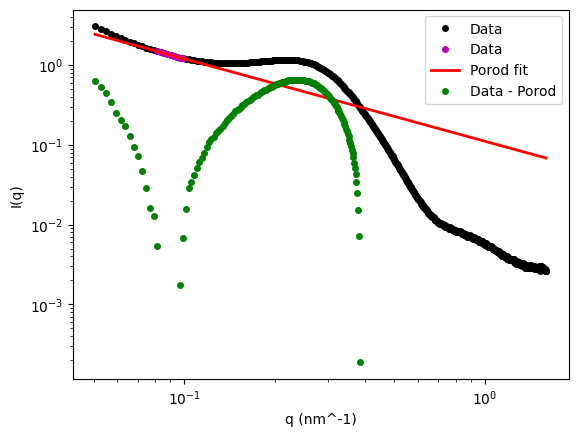

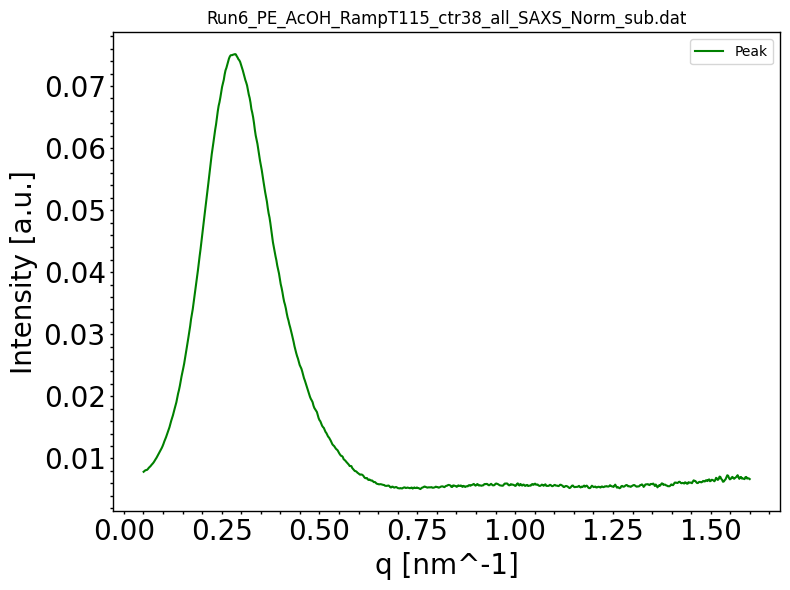


Processing keyword: _ctr39_
Found 1 files for keyword '_ctr39_'

Processing file: Run6_PE_AcOH_RampT117_ctr39_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132239.22, bstop=4.515023333333333, ctemp=118.00106666666666, I0=20.855416666666667
Data size after truncation: 704 points
Peak area: 0.07543319458900184 ± 0.0001483503828184373


<Figure size 640x480 with 0 Axes>

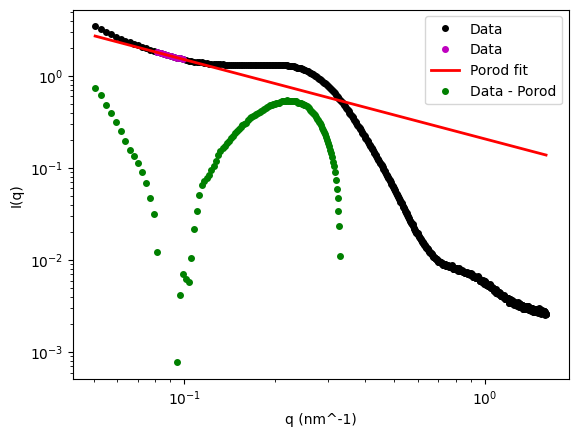

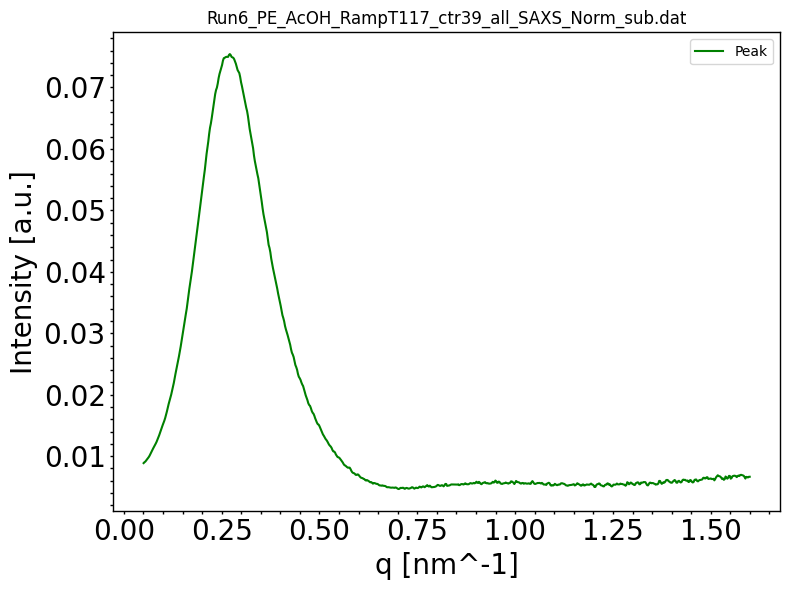


Processing keyword: _ctr40_
Found 1 files for keyword '_ctr40_'

Processing file: Run6_PE_AcOH_RampT120_ctr40_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132331.32, bstop=4.561303333333334, ctemp=120.38250000000001, I0=21.039396666666665
Data size after truncation: 704 points
Peak area: 0.07320775631878078 ± 0.0001592387483613666


<Figure size 640x480 with 0 Axes>

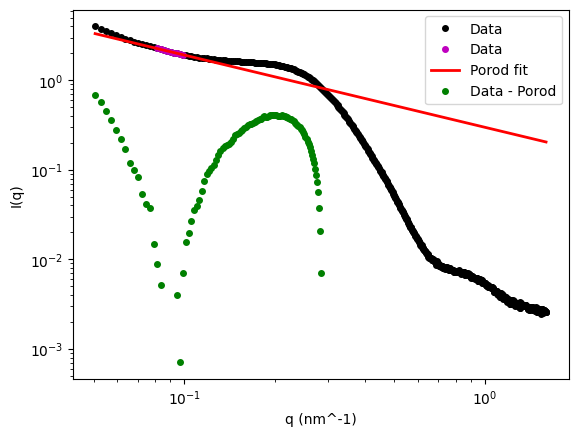

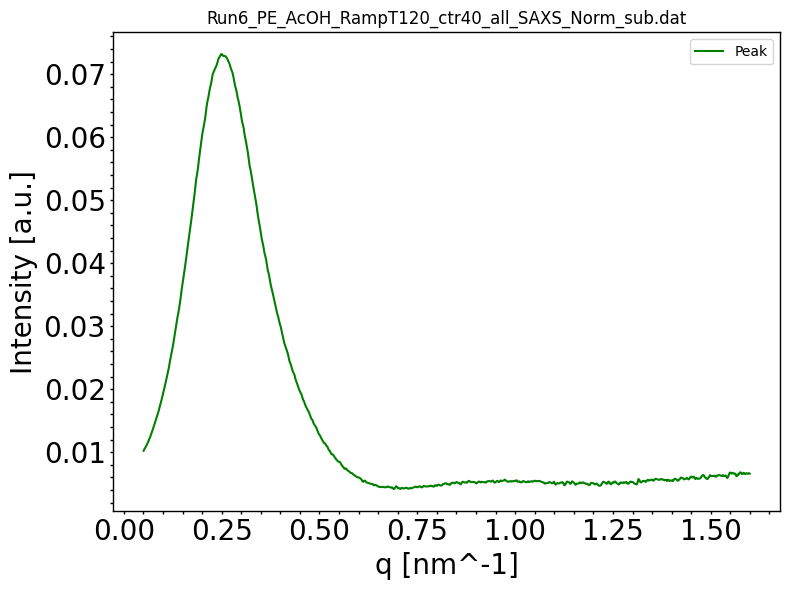


Processing keyword: _ctr41_
Found 1 files for keyword '_ctr41_'

Processing file: Run6_PE_AcOH_RampT122_ctr41_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132424.12333333335, bstop=4.54076, ctemp=122.77926666666667, I0=20.909573333333334
Data size after truncation: 704 points
Peak area: 0.06742182153145572 ± 0.00017495527296214274


<Figure size 640x480 with 0 Axes>

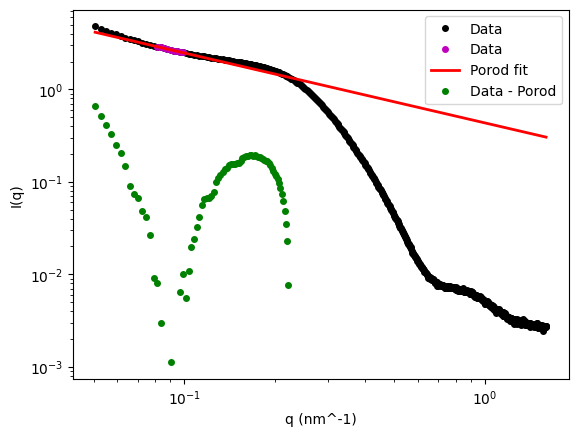

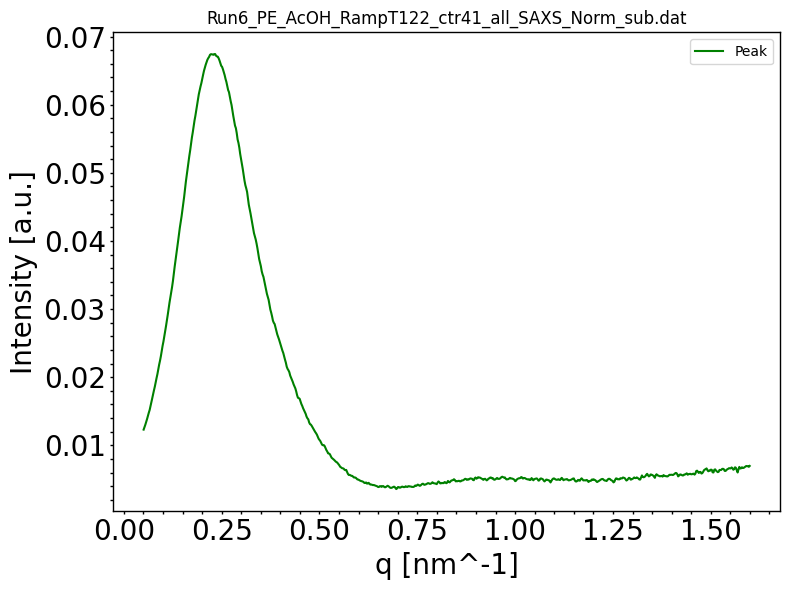


Processing keyword: _ctr42_
Found 1 files for keyword '_ctr42_'

Processing file: Run6_PE_AcOH_RampT125_ctr42_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132517.49666666667, bstop=4.509603333333334, ctemp=125.18666666666667, I0=20.832516666666667
Data size after truncation: 704 points
Peak area: 0.05744622026101548 ± 0.00019360849391393482


<Figure size 640x480 with 0 Axes>

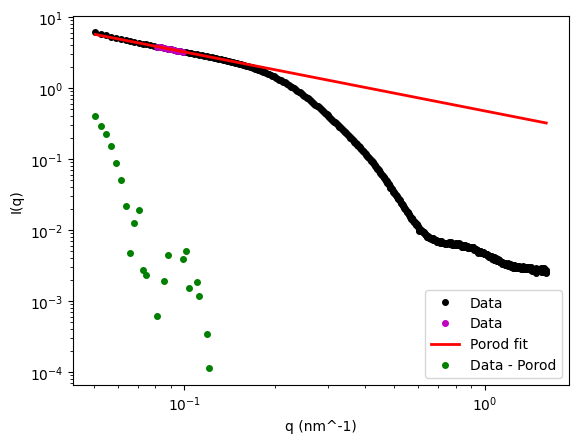

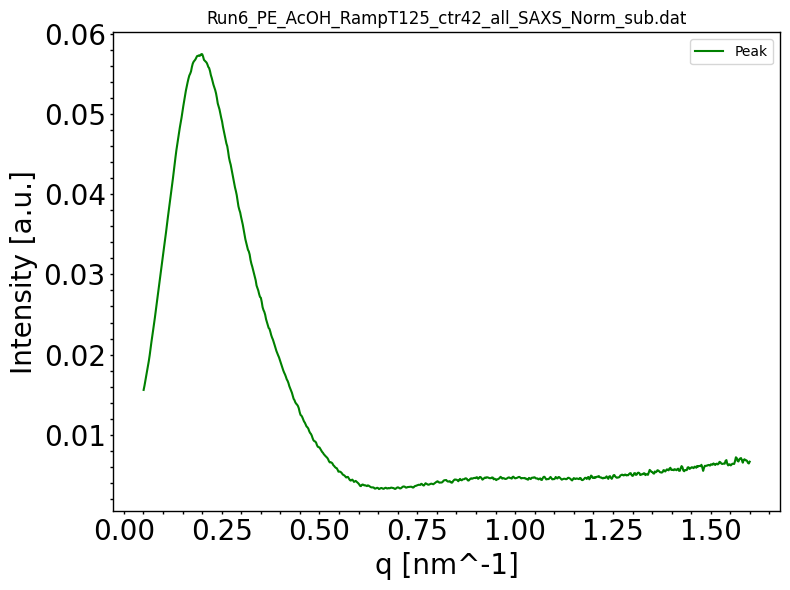


Processing keyword: _ctr43_
Found 1 files for keyword '_ctr43_'

Processing file: Run6_PE_AcOH_RampT127_ctr43_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132611.82666666666, bstop=4.534120000000001, ctemp=127.60303333333333, I0=21.046563333333335
Data size after truncation: 704 points
Peak area: 0.03928030702719393 ± 0.0001986431219249116


<Figure size 640x480 with 0 Axes>

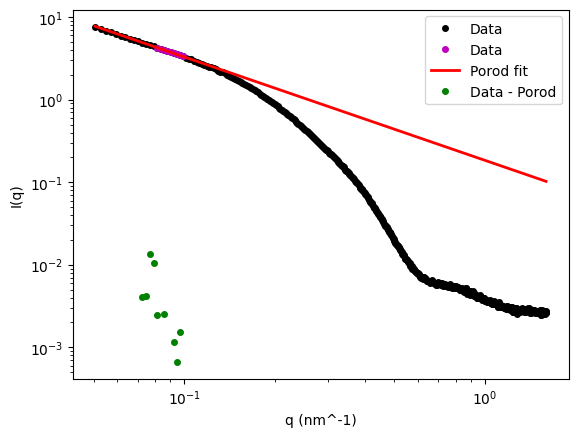

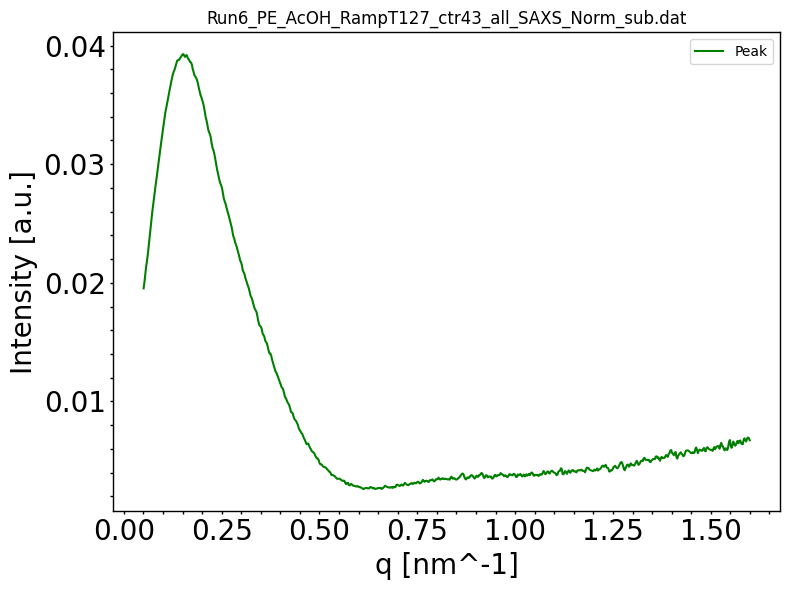


Processing keyword: _ctr44_
Found 1 files for keyword '_ctr44_'

Processing file: Run6_PE_AcOH_RampT130_ctr44_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132706.73, bstop=4.538726666666666, ctemp=130.00276, I0=20.922963333333332
Data size after truncation: 704 points
Peak area: 0.006759929839180196 ± 9.803541193032453e-05


<Figure size 640x480 with 0 Axes>

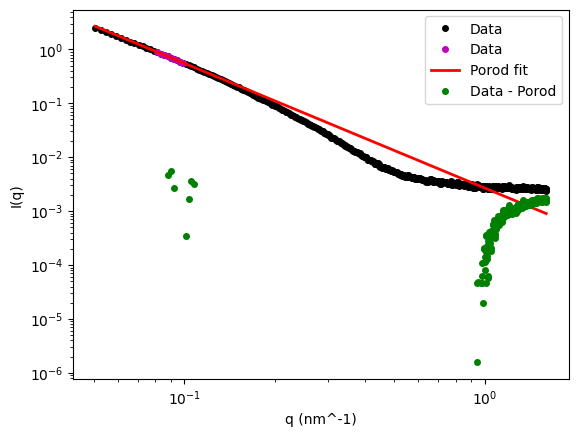

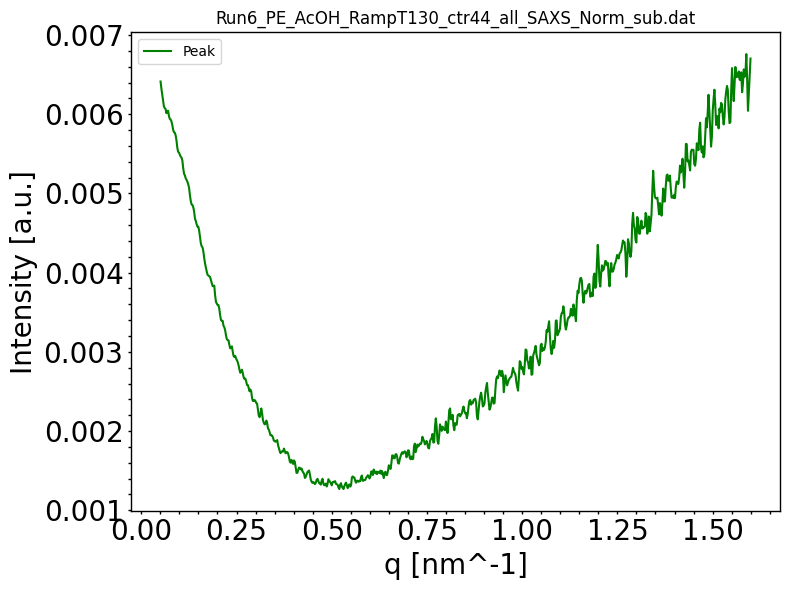


Processing keyword: _ctr45_
Found 1 files for keyword '_ctr45_'

Processing file: Run6_PE_AcOH_RampT132_ctr45_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132800.91333333336, bstop=4.53848, ctemp=132.56222666666667, I0=20.84808
Data size after truncation: 704 points
Peak area: 0.0067546327702272 ± 7.586722066138334e-05


<Figure size 640x480 with 0 Axes>

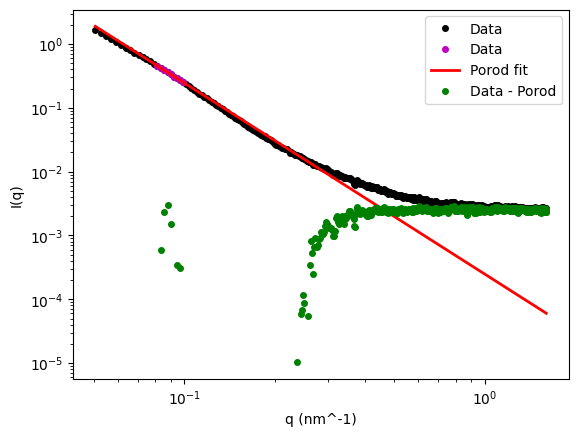

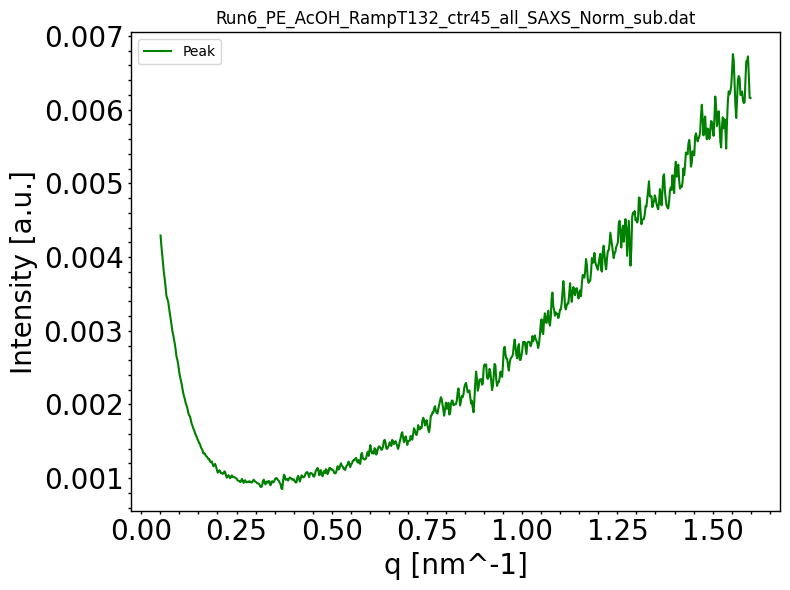


Processing keyword: _ctr46_
Found 1 files for keyword '_ctr46_'

Processing file: Run6_PE_AcOH_RampT135_ctr46_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132899.04333333333, bstop=4.58231, ctemp=134.93776666666665, I0=21.010256666666667
Data size after truncation: 704 points
Peak area: 0.006683081611385202 ± 7.484484620293774e-05


<Figure size 640x480 with 0 Axes>

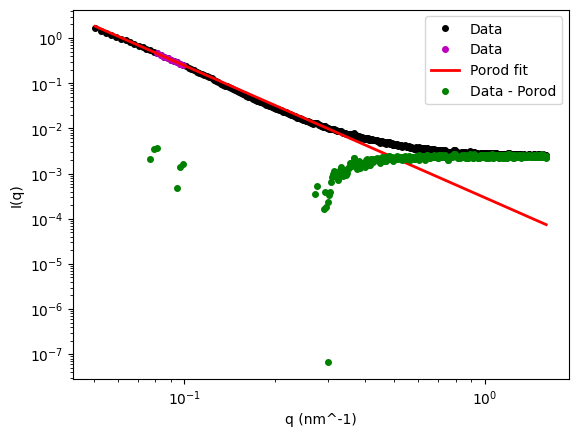

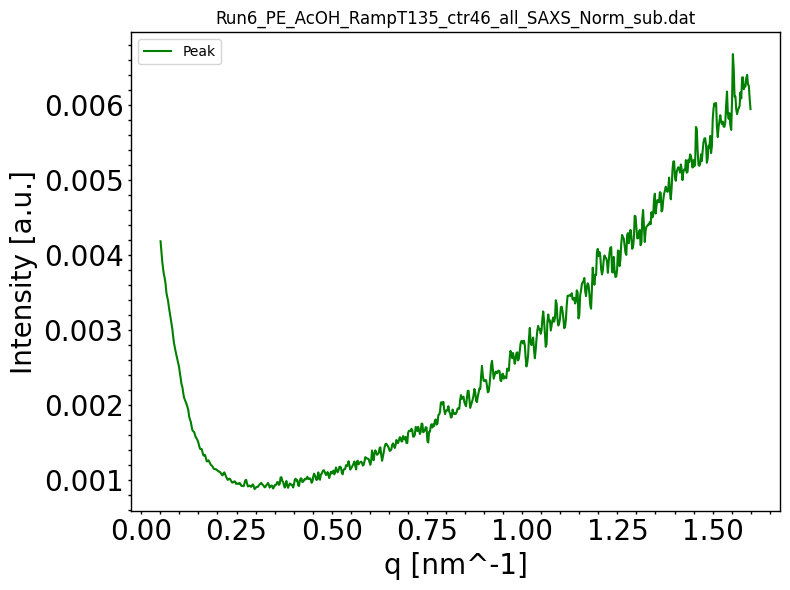


Processing keyword: _ctr47_
Found 1 files for keyword '_ctr47_'

Processing file: Run6_PE_AcOH_RampT137_ctr47_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132998.07666666666, bstop=4.57566, ctemp=137.31610333333333, I0=20.937473333333333
Data size after truncation: 704 points
Peak area: 0.0067554189245006505 ± 7.508840909731589e-05


<Figure size 640x480 with 0 Axes>

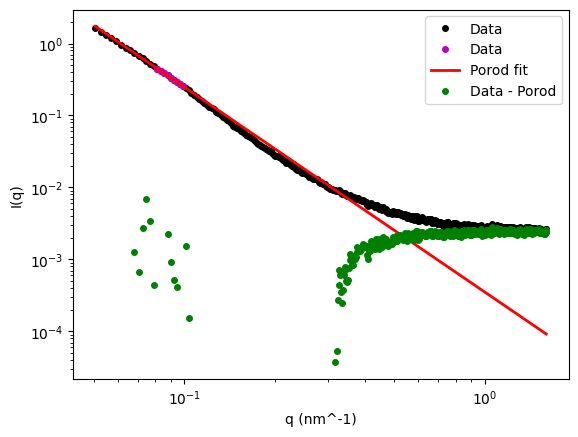

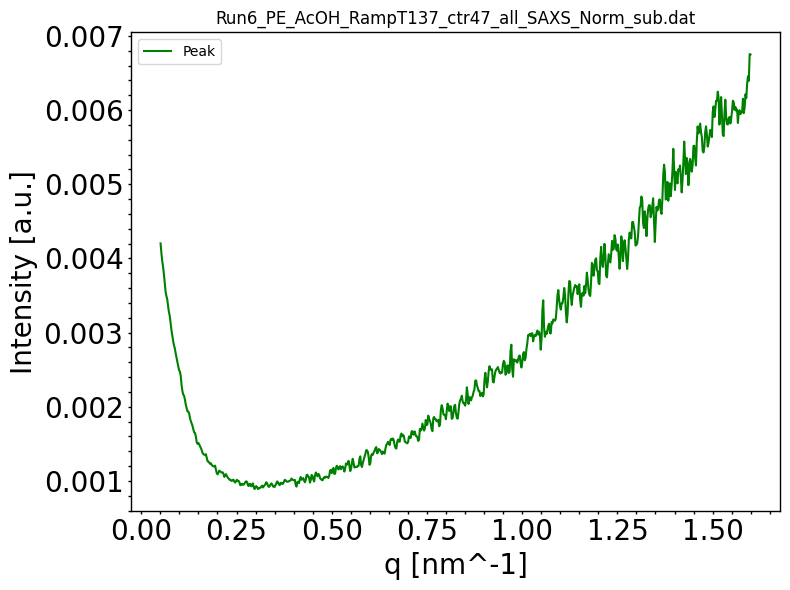


Processing keyword: _ctr48_
Found 1 files for keyword '_ctr48_'

Processing file: Run6_PE_AcOH_RampT140_ctr48_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133096.78, bstop=4.55837, ctemp=139.81126666666668, I0=20.838913333333334
Data size after truncation: 704 points
Peak area: 0.006596018407725042 ± 7.587358523195075e-05


<Figure size 640x480 with 0 Axes>

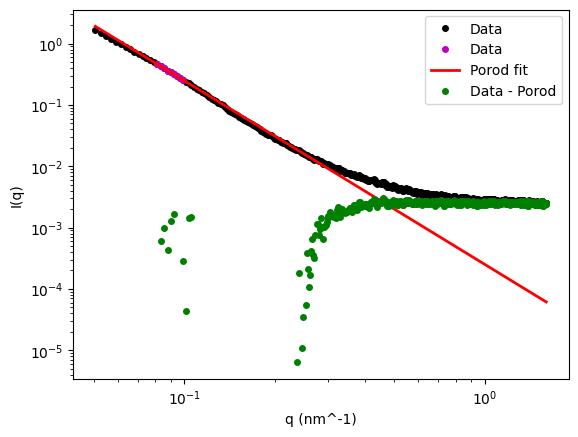

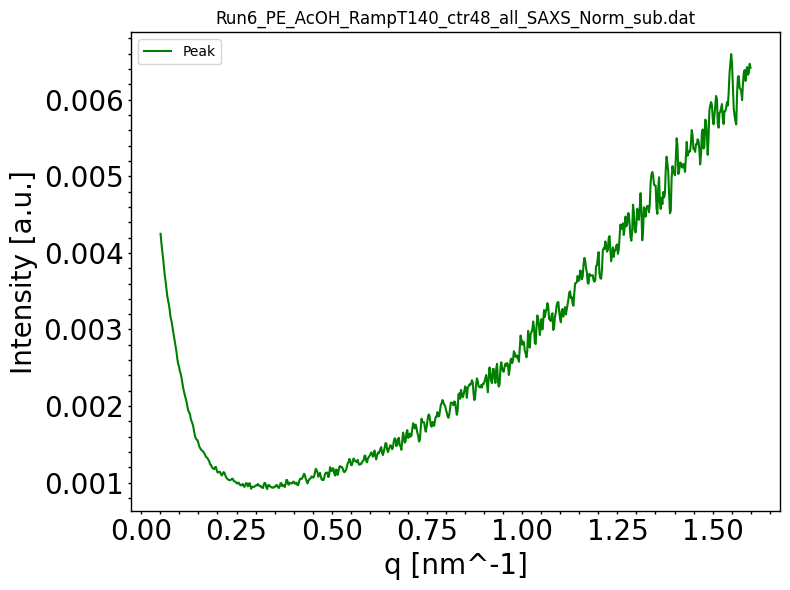


Processing keyword: _ctr49_
Found 1 files for keyword '_ctr49_'

Processing file: Run6_PE_AcOH_RampT142_ctr49_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133199.83666666667, bstop=4.598496666666667, ctemp=142.22546333333332, I0=20.95727666666667
Data size after truncation: 704 points
Peak area: 0.006527593815825709 ± 7.528719596051774e-05


<Figure size 640x480 with 0 Axes>

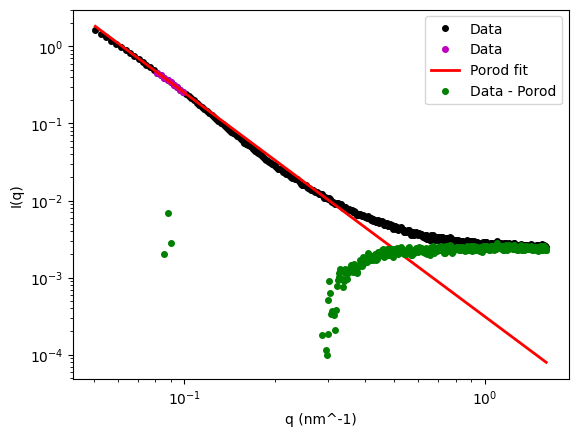

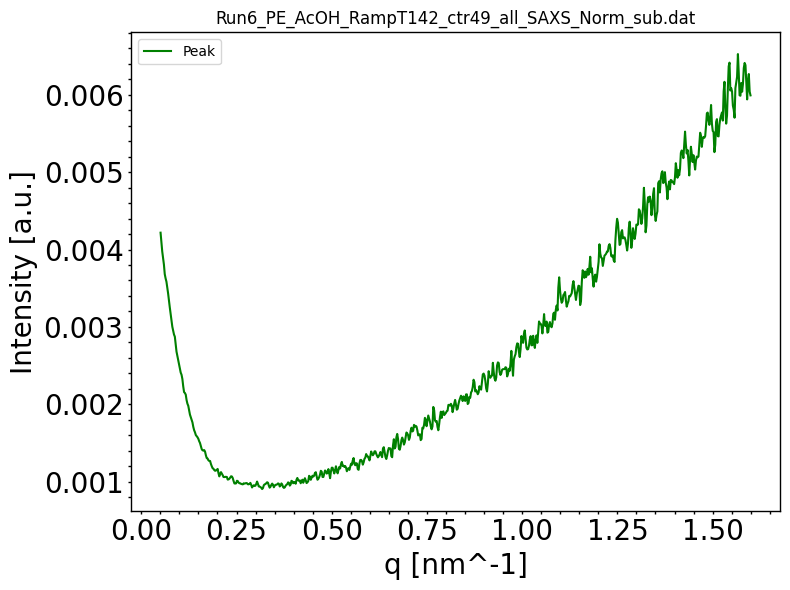


Processing keyword: _ctr50_
Found 1 files for keyword '_ctr50_'

Processing file: Run6_PE_AcOH_RampT145_ctr50_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133303.72, bstop=4.591516666666666, ctemp=144.67409666666666, I0=20.85127
Data size after truncation: 704 points
Peak area: 0.0067629134756691765 ± 7.521385877786458e-05


<Figure size 640x480 with 0 Axes>

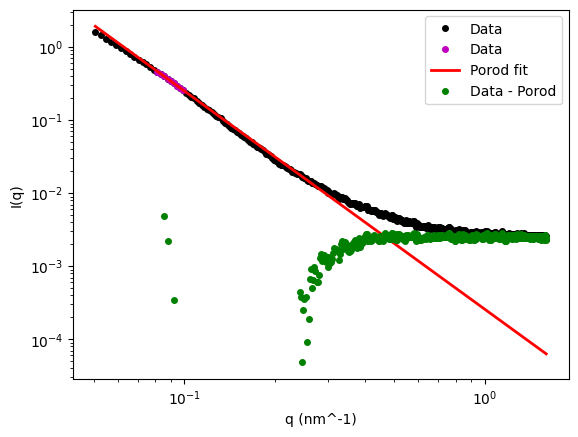

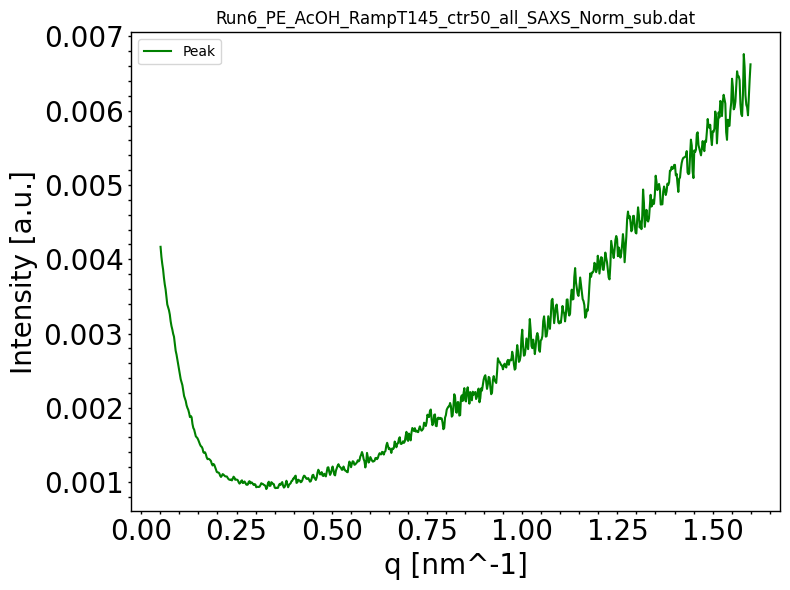


Processing keyword: _ctr51_
Found 1 files for keyword '_ctr51_'

Processing file: Run6_PE_AcOH_RampT147_ctr51_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133410.34, bstop=4.573286666666667, ctemp=147.1027333333333, I0=20.775503333333333
Data size after truncation: 704 points
Peak area: 0.006667166994155995 ± 7.569873956991986e-05


<Figure size 640x480 with 0 Axes>

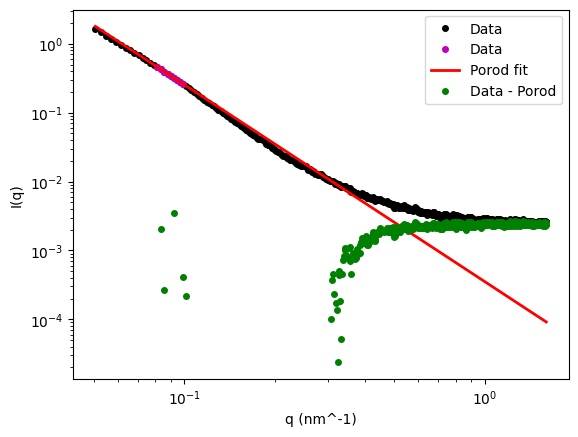

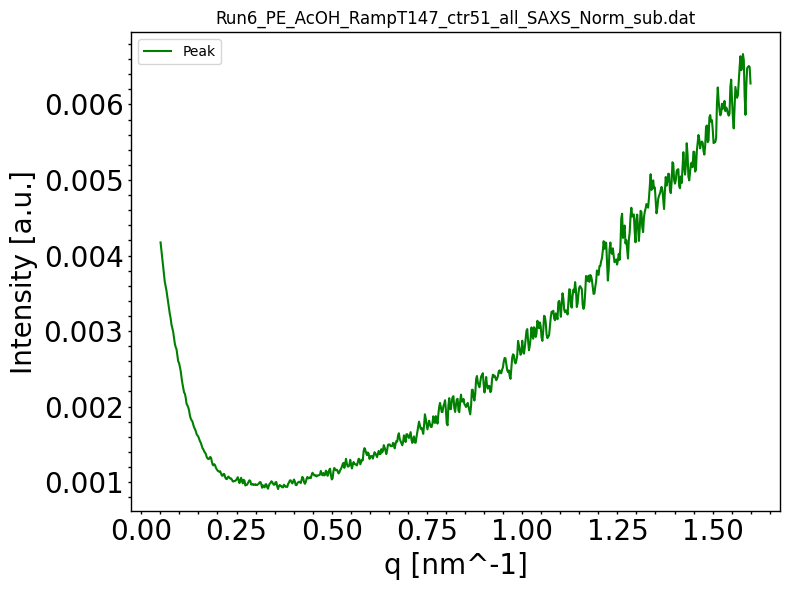


Processing keyword: _ctr52_
Found 1 files for keyword '_ctr52_'

Processing file: Run6_PE_AcOH_RampT150_ctr52_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133518.79666666666, bstop=4.621903333333333, ctemp=149.53719666666666, I0=20.92663333333333
Data size after truncation: 704 points
Peak area: 0.006433222549259362 ± 7.495066960618337e-05


<Figure size 640x480 with 0 Axes>

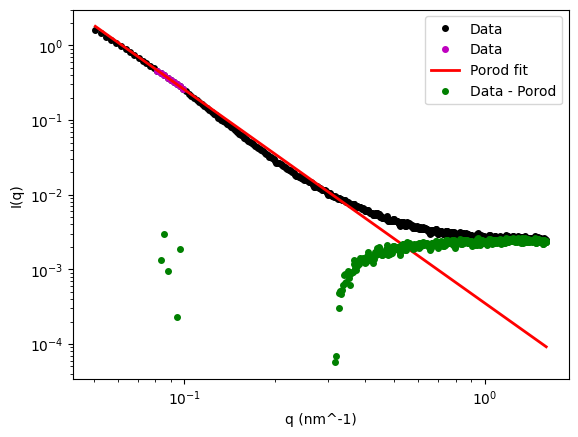

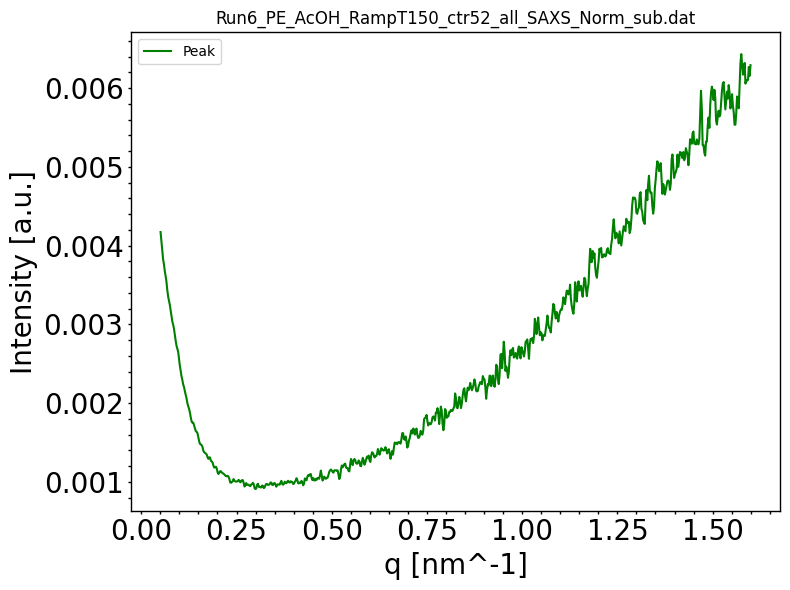


Processing keyword: _ctr53_
Found 1 files for keyword '_ctr53_'

Processing file: Run6_PE_AcOH_RampT152_ctr53_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133629.31333333332, bstop=4.60995, ctemp=152.0456, I0=20.84051666666667
Data size after truncation: 704 points
Peak area: 0.006879289316220539 ± 7.549399490124515e-05


<Figure size 640x480 with 0 Axes>

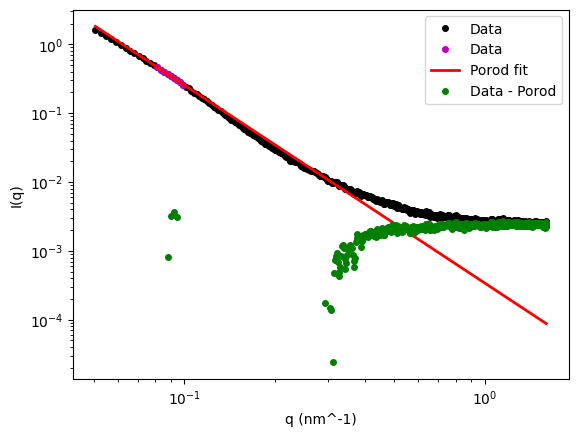

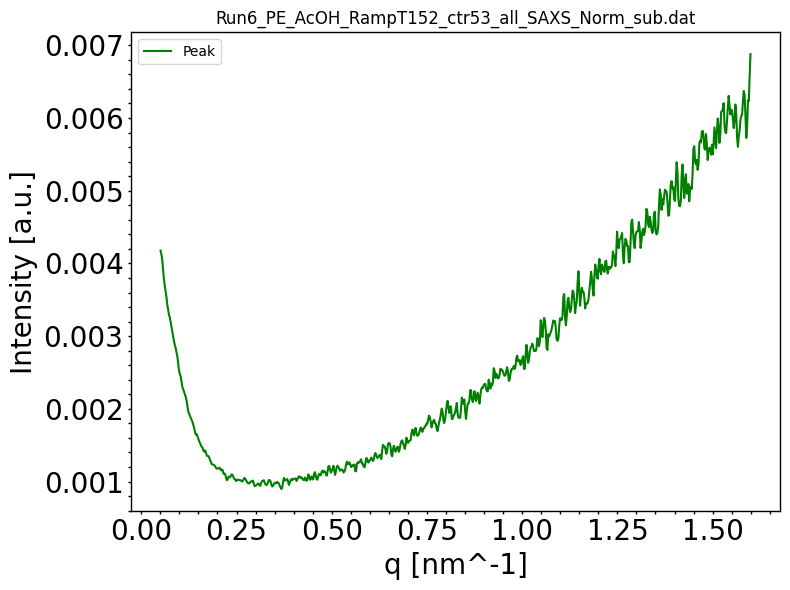


Processing keyword: _ctr54_
Found 1 files for keyword '_ctr54_'

Processing file: Run6_PE_AcOH_RampT155_ctr54_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133743.61666666667, bstop=4.60219, ctemp=154.522, I0=20.718186666666668
Data size after truncation: 704 points
Peak area: 0.006755651727675213 ± 7.651330600982423e-05


<Figure size 640x480 with 0 Axes>

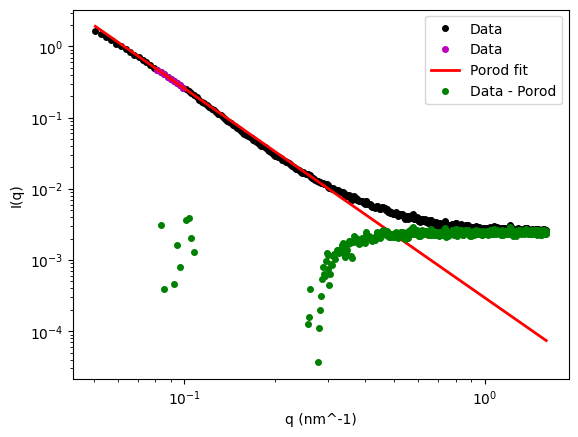

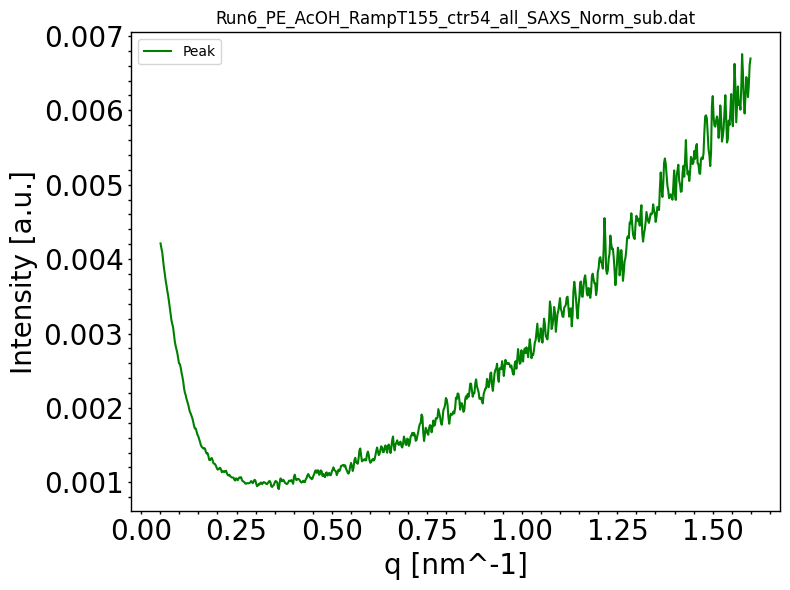


Processing keyword: _ctr55_
Found 1 files for keyword '_ctr55_'

Processing file: Run6_PE_AcOH_RampT157_ctr55_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133861.96333333335, bstop=4.656586666666667, ctemp=156.9715666666667, I0=20.88226
Data size after truncation: 704 points
Peak area: 0.00628148053355066 ± 7.620248363545375e-05


<Figure size 640x480 with 0 Axes>

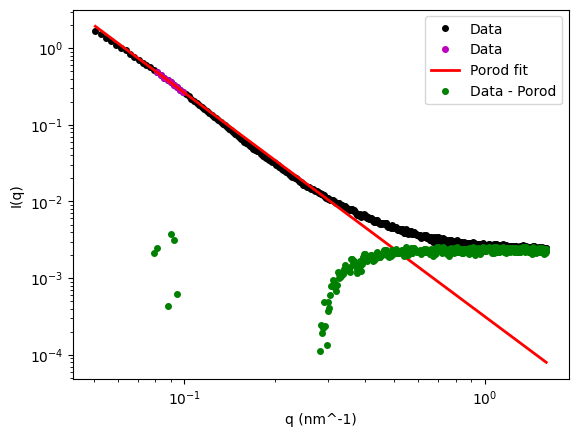

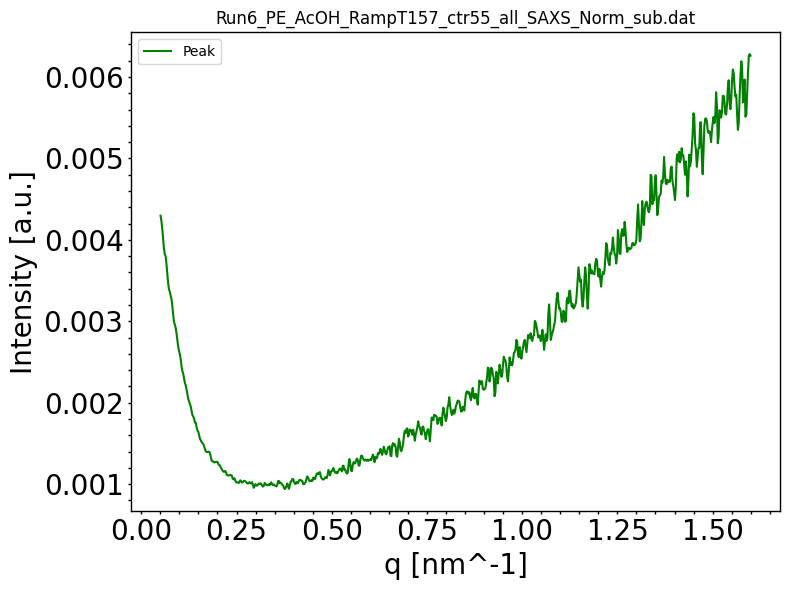


Processing keyword: _ctr56_
Found 1 files for keyword '_ctr56_'

Processing file: Run6_PE_AcOH_RampT160_ctr56_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133984.41666666666, bstop=4.651223333333333, ctemp=159.39366666666666, I0=20.735780000000002
Data size after truncation: 704 points
Peak area: 0.006490896565107514 ± 7.719976821814993e-05


<Figure size 640x480 with 0 Axes>

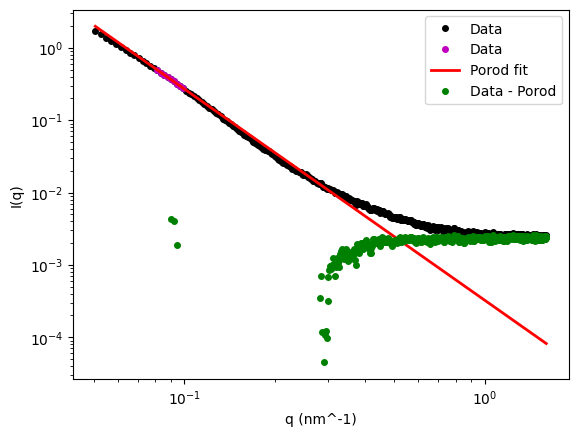

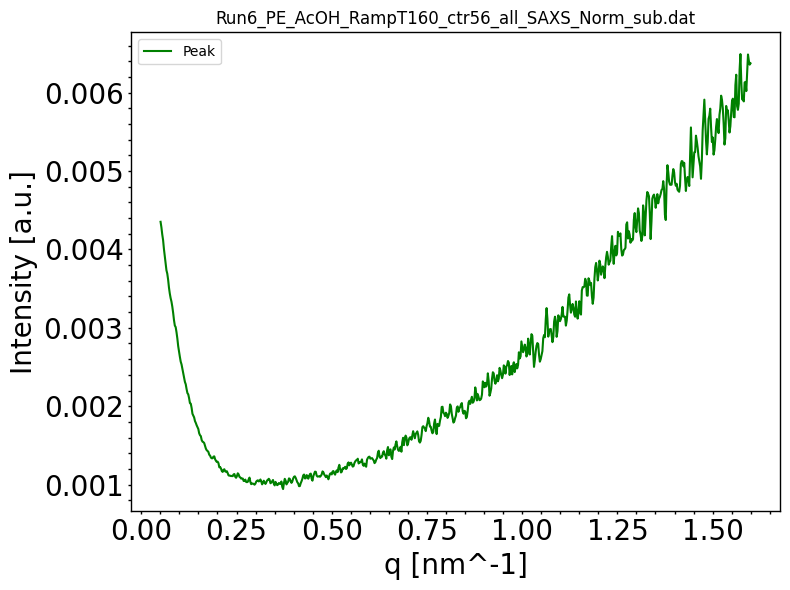

Lengths: filename=57, timer=57, CTEMP=57, I0=57, bstop=57, peak_pos=57, porod_exp=57, porod_scale=57, peak_area=57, peak_area_error=57

Processing keyword: _ctr0_
Found 1 files for keyword '_ctr0_'

Processing file: Run8_PE_Salt_RampT20_ctr0_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=180927.71, bstop=4.74753, ctemp=25.489786666666664, I0=20.770956666666667
Data size after truncation: 704 points
Peak area: 0.030856212439354325 ± 8.175469075952907e-05


<Figure size 640x480 with 0 Axes>

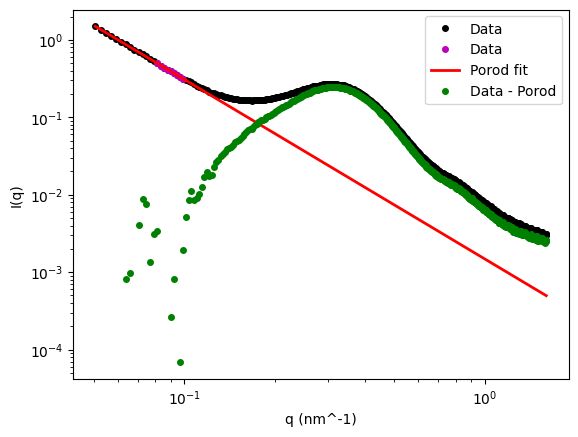

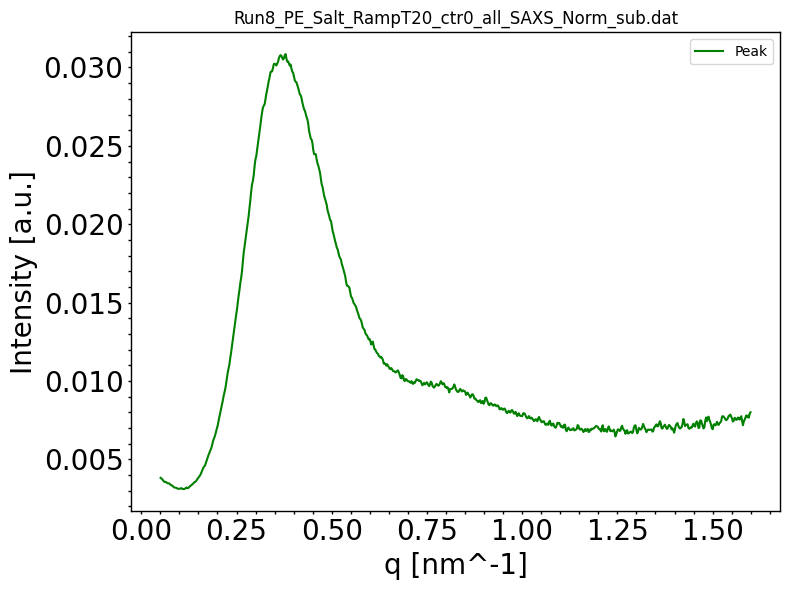


Processing keyword: _ctr1_
Found 1 files for keyword '_ctr1_'

Processing file: Run8_PE_Salt_RampT22_ctr1_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=180974.04333333333, bstop=4.737283333333333, ctemp=25.447500333333334, I0=20.72266
Data size after truncation: 704 points
Peak area: 0.030721453945493832 ± 8.199769232492743e-05


<Figure size 640x480 with 0 Axes>

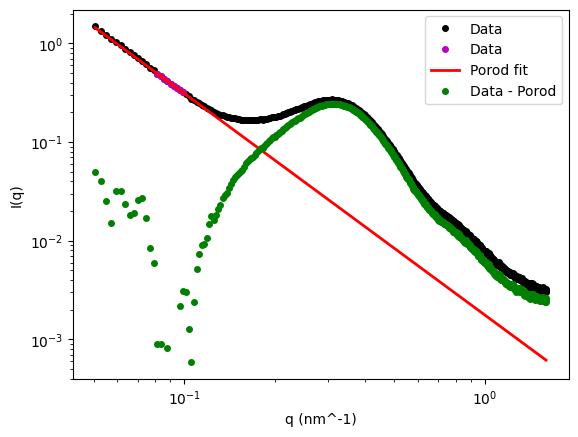

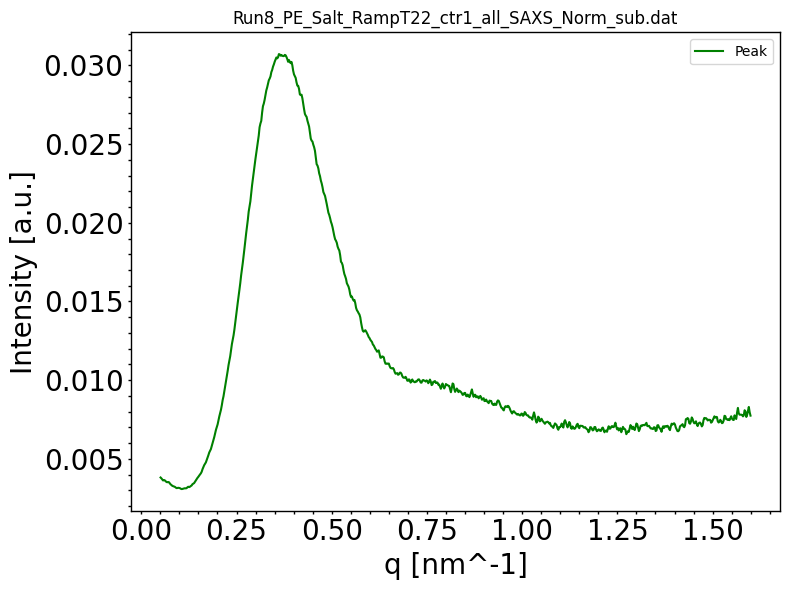


Processing keyword: _ctr2_
Found 1 files for keyword '_ctr2_'

Processing file: Run8_PE_Salt_RampT25_ctr2_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181019.1, bstop=4.723153333333333, ctemp=25.405586, I0=20.68992
Data size after truncation: 704 points
Peak area: 0.03078212096907433 ± 8.215063236225116e-05


<Figure size 640x480 with 0 Axes>

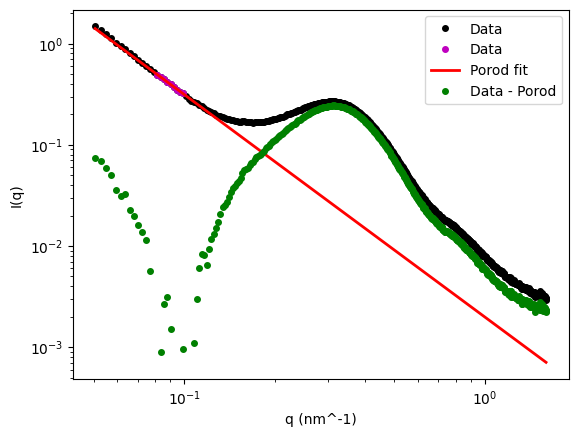

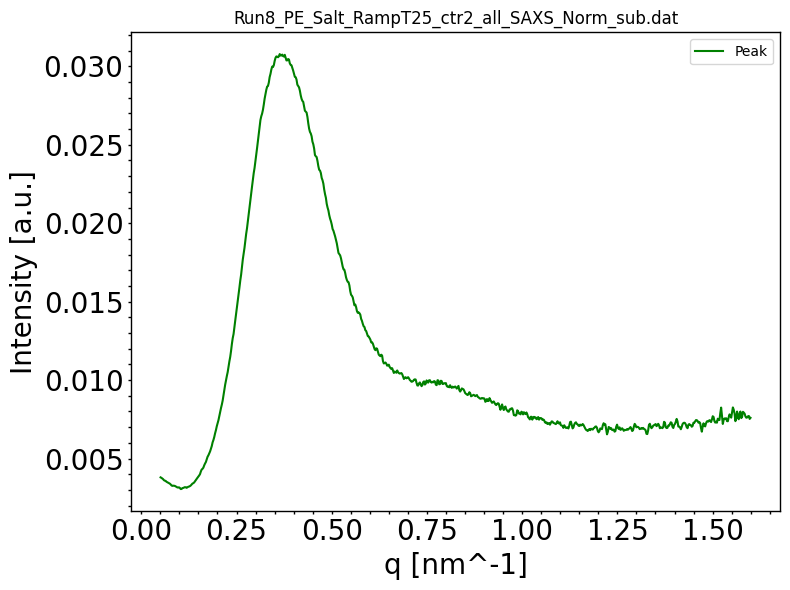


Processing keyword: _ctr3_
Found 1 files for keyword '_ctr3_'

Processing file: Run8_PE_Salt_RampT27_ctr3_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181094.79, bstop=4.7158066666666665, ctemp=31.668273, I0=20.617606666666667
Data size after truncation: 704 points
Peak area: 0.031787364578508635 ± 8.309303468548787e-05


<Figure size 640x480 with 0 Axes>

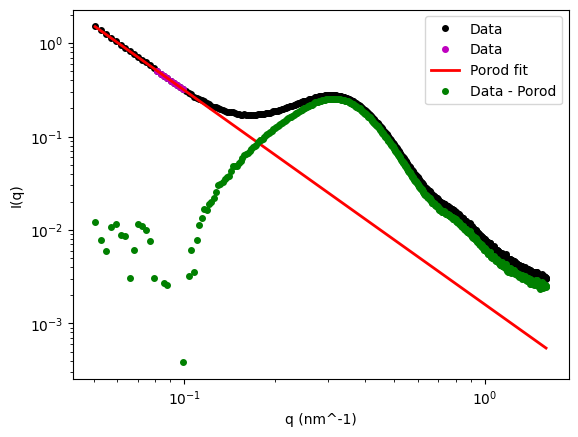

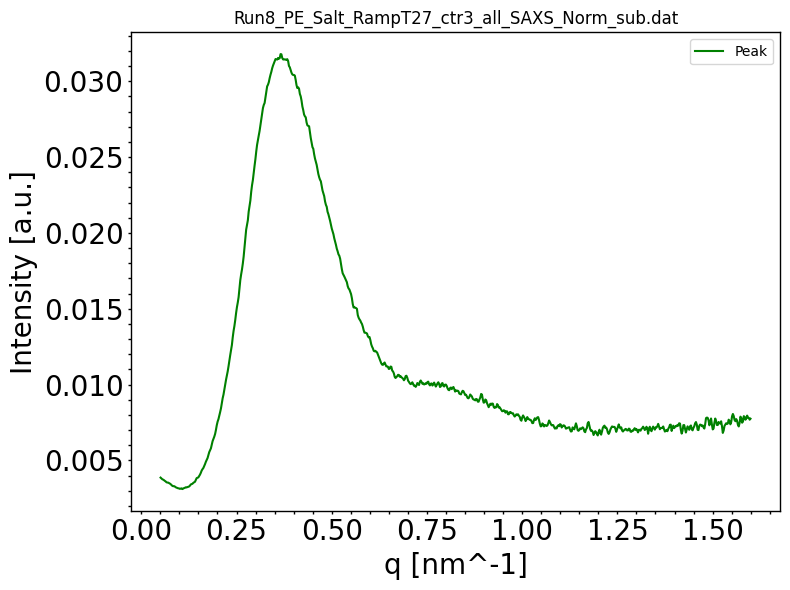


Processing keyword: _ctr4_
Found 1 files for keyword '_ctr4_'

Processing file: Run8_PE_Salt_RampT30_ctr4_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181139.93000000002, bstop=4.7029, ctemp=32.05538, I0=20.57220666666667
Data size after truncation: 704 points
Peak area: 0.03218432074605872 ± 8.356480698570289e-05


<Figure size 640x480 with 0 Axes>

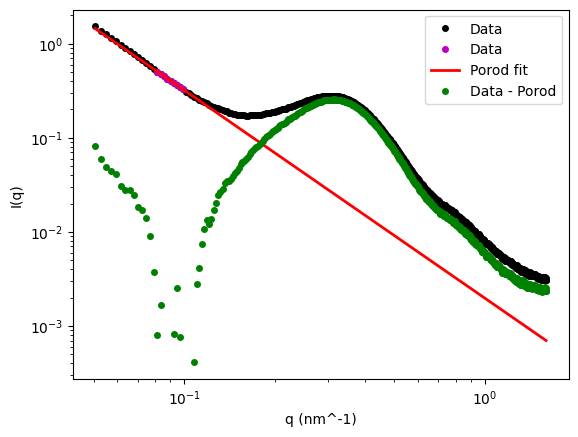

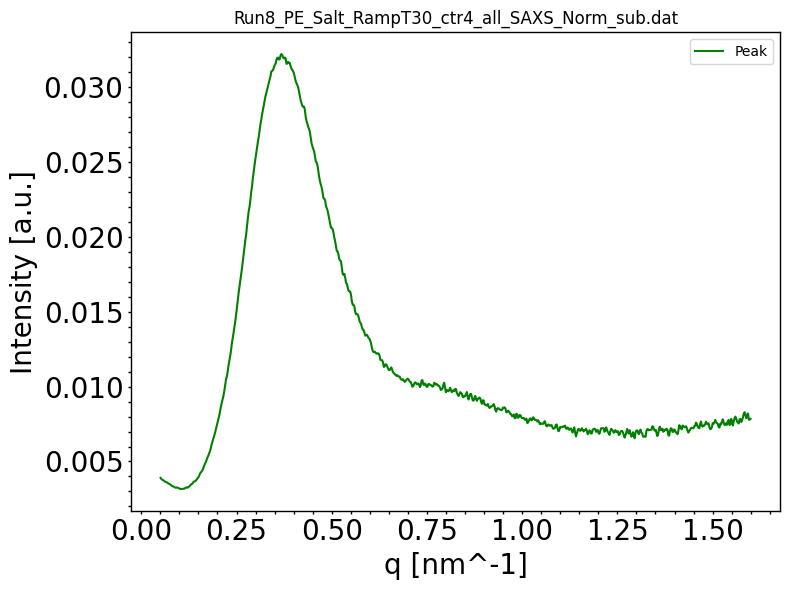


Processing keyword: _ctr5_
Found 1 files for keyword '_ctr5_'

Processing file: Run8_PE_Salt_RampT32_ctr5_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181211.29666666663, bstop=4.756923333333333, ctemp=36.05521666666667, I0=20.86673
Data size after truncation: 704 points
Peak area: 0.03211840964497846 ± 8.21384562819404e-05


<Figure size 640x480 with 0 Axes>

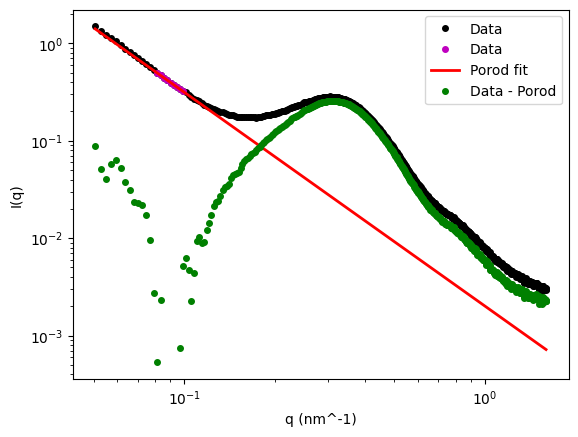

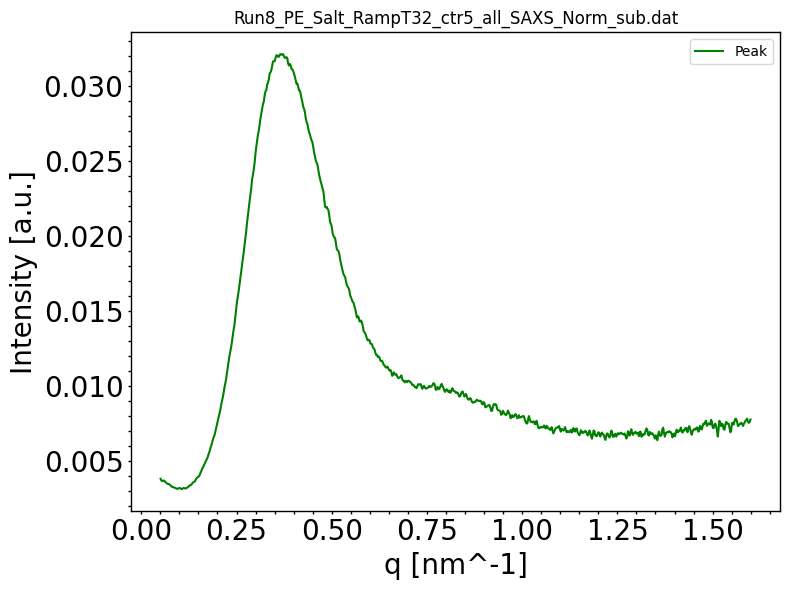


Processing keyword: _ctr6_
Found 1 files for keyword '_ctr6_'

Processing file: Run8_PE_Salt_RampT35_ctr6_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181256.31999999998, bstop=4.747656666666667, ctemp=36.286282666666665, I0=20.762676666666668
Data size after truncation: 704 points
Peak area: 0.032590957653747 ± 8.297399092385925e-05


<Figure size 640x480 with 0 Axes>

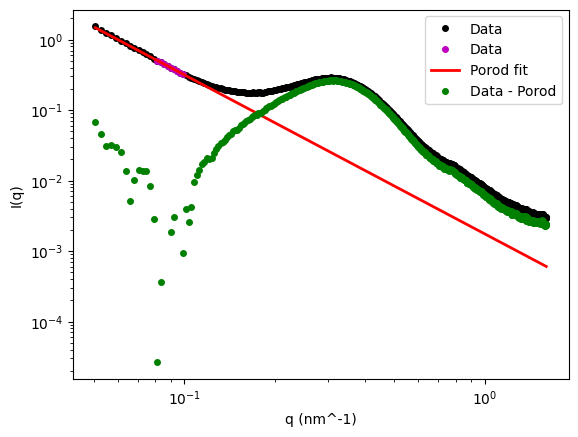

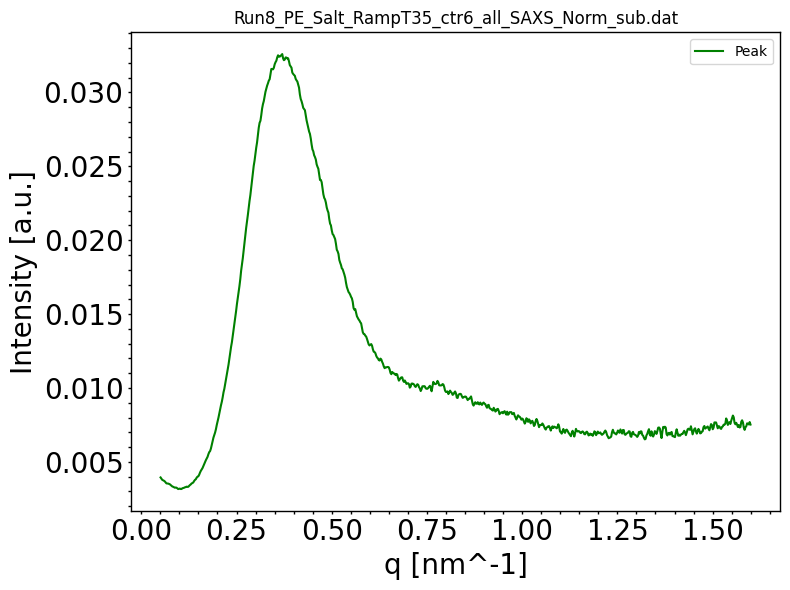


Processing keyword: _ctr7_
Found 1 files for keyword '_ctr7_'

Processing file: Run8_PE_Salt_RampT37_ctr7_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181331.87333333332, bstop=4.733536666666667, ctemp=41.179870666666666, I0=20.676893333333336
Data size after truncation: 704 points
Peak area: 0.0336295359396353 ± 8.378633795429733e-05


<Figure size 640x480 with 0 Axes>

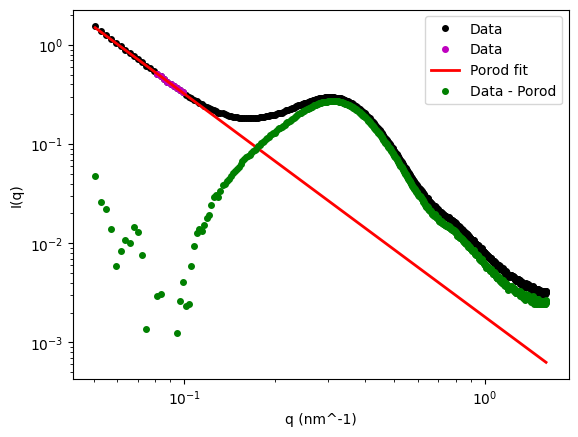

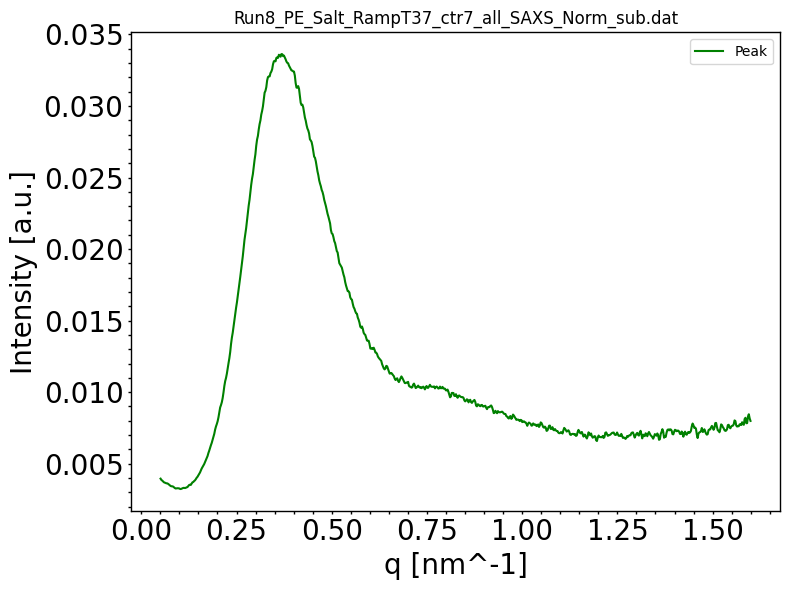


Processing keyword: _ctr8_
Found 1 files for keyword '_ctr8_'

Processing file: Run8_PE_Salt_RampT40_ctr8_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181376.86666666667, bstop=4.72463, ctemp=40.83014933333333, I0=20.68601
Data size after truncation: 704 points
Peak area: 0.033930717165478345 ± 8.41878374922084e-05


<Figure size 640x480 with 0 Axes>

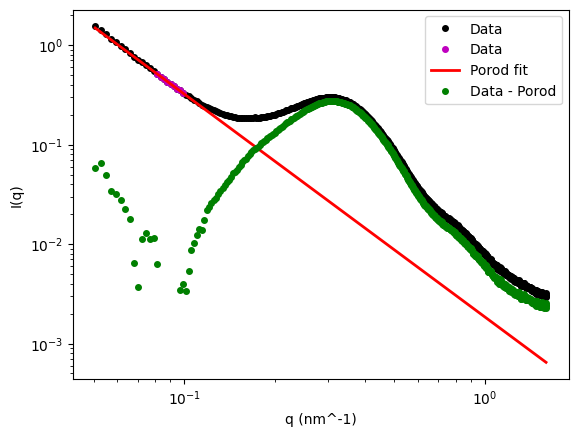

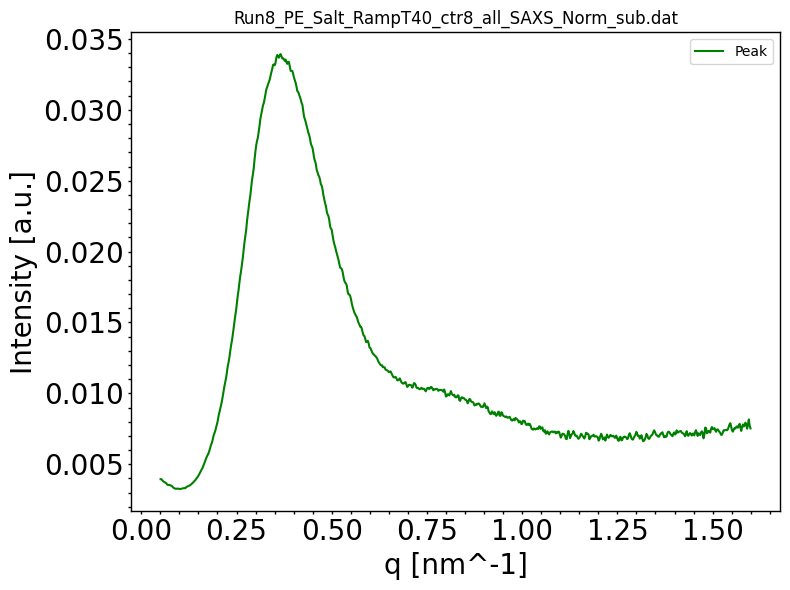


Processing keyword: _ctr9_
Found 1 files for keyword '_ctr9_'

Processing file: Run8_PE_Salt_RampT42_ctr9_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181455.61666666667, bstop=4.714276666666667, ctemp=46.019339, I0=20.54928666666667
Data size after truncation: 704 points
Peak area: 0.0350307277889129 ± 8.529782681261624e-05


<Figure size 640x480 with 0 Axes>

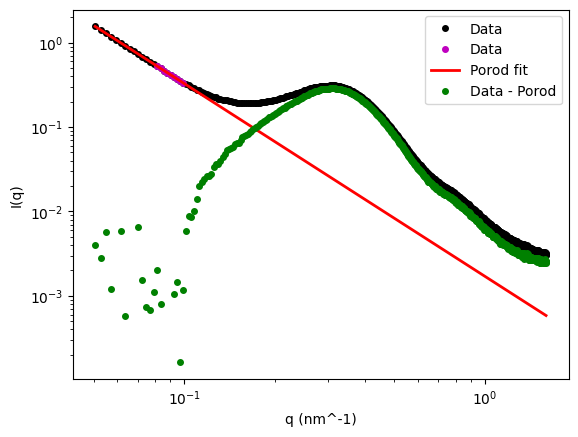

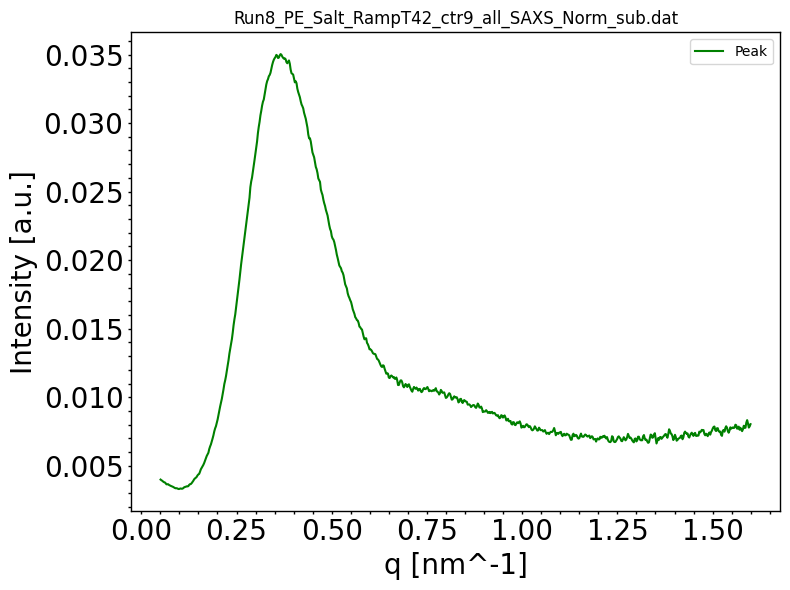


Processing keyword: _ctr10_
Found 1 files for keyword '_ctr10_'

Processing file: Run8_PE_Salt_RampT45_ctr10_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181500.53333333333, bstop=4.76238, ctemp=45.26894000000001, I0=20.818753333333333
Data size after truncation: 704 points
Peak area: 0.0348009914228121 ± 8.395632846570939e-05


<Figure size 640x480 with 0 Axes>

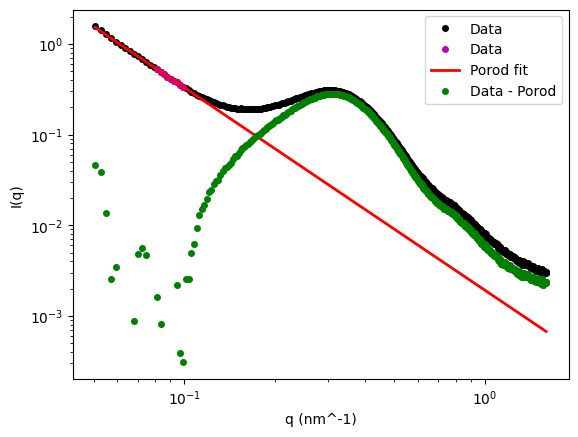

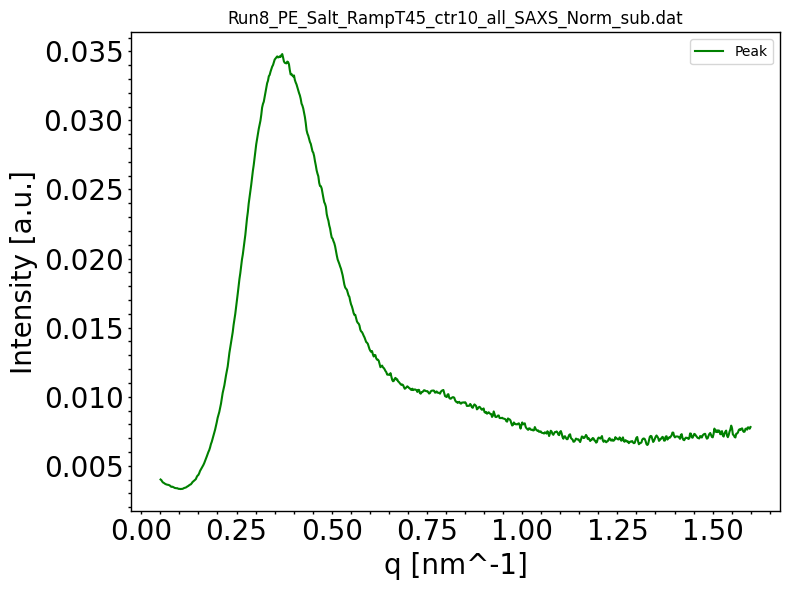


Processing keyword: _ctr11_
Found 1 files for keyword '_ctr11_'

Processing file: Run8_PE_Salt_RampT47_ctr11_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181570.44666666666, bstop=4.753076666666666, ctemp=50.83456433333333, I0=20.744533333333333
Data size after truncation: 704 points
Peak area: 0.035928435044932684 ± 8.508998523561805e-05


<Figure size 640x480 with 0 Axes>

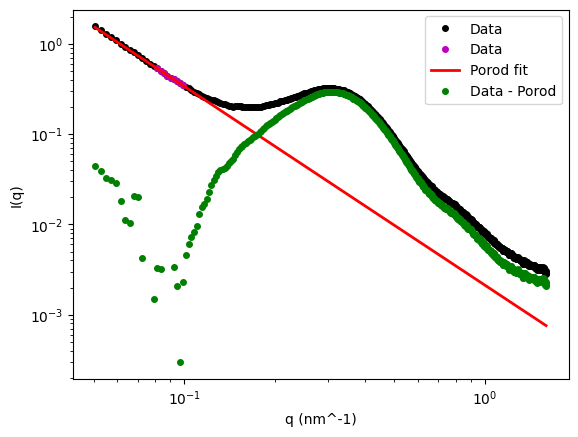

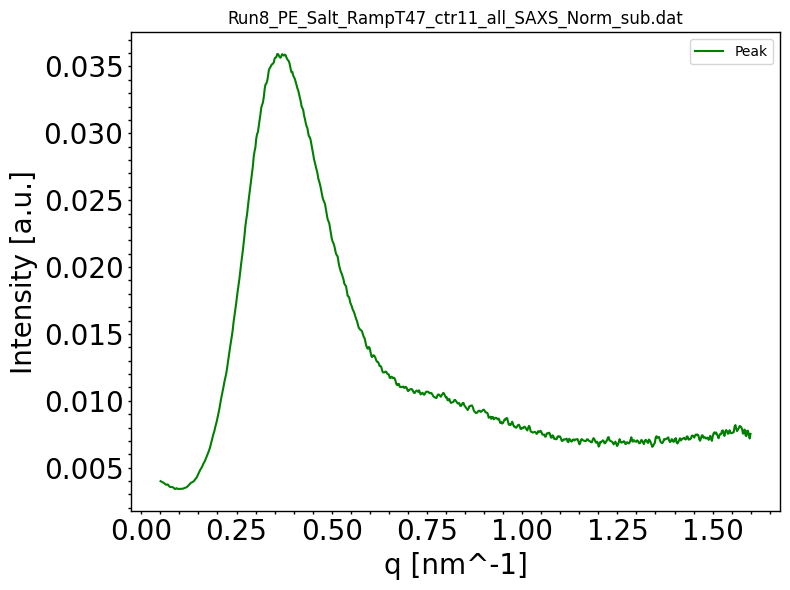


Processing keyword: _ctr12_
Found 1 files for keyword '_ctr12_'

Processing file: Run8_PE_Salt_RampT50_ctr12_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181614.9833333333, bstop=4.747753333333333, ctemp=49.96953566666667, I0=20.728189999999998
Data size after truncation: 704 points
Peak area: 0.03641621871841941 ± 8.553571308109203e-05


<Figure size 640x480 with 0 Axes>

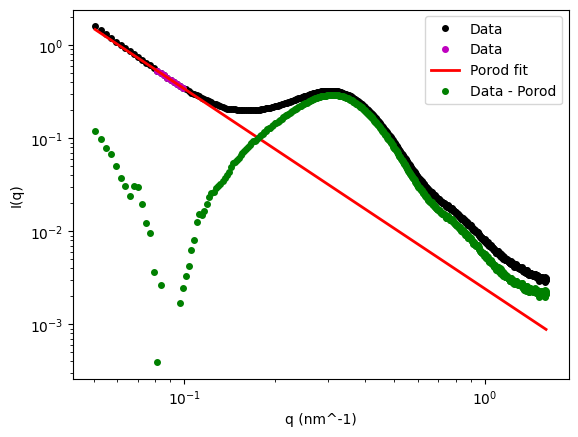

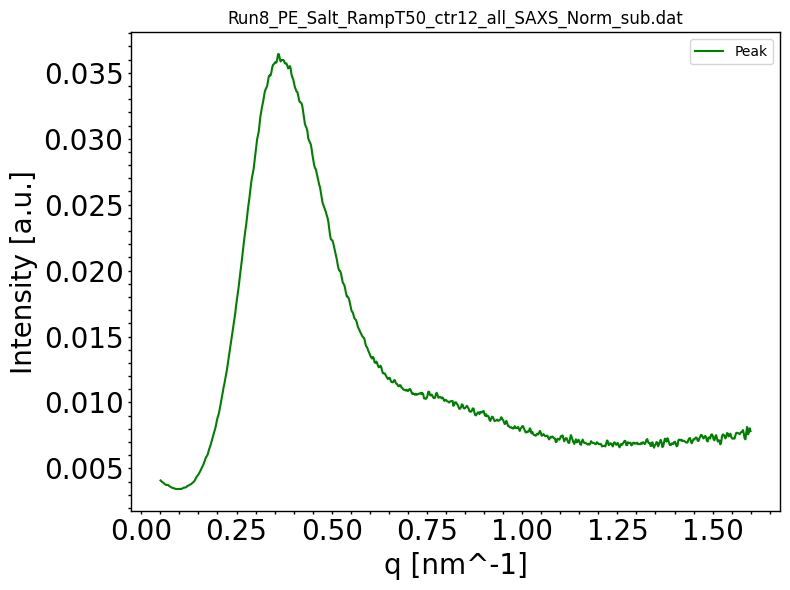


Processing keyword: _ctr13_
Found 1 files for keyword '_ctr13_'

Processing file: Run8_PE_Salt_RampT52_ctr13_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181674.92333333334, bstop=4.74007, ctemp=53.592823, I0=20.64191
Data size after truncation: 704 points
Peak area: 0.03731539888308691 ± 8.645432873586692e-05


<Figure size 640x480 with 0 Axes>

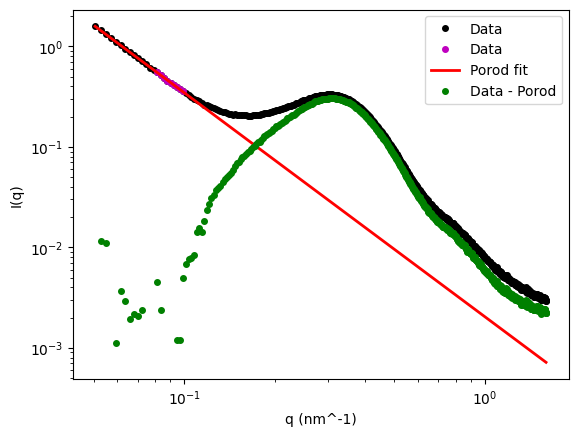

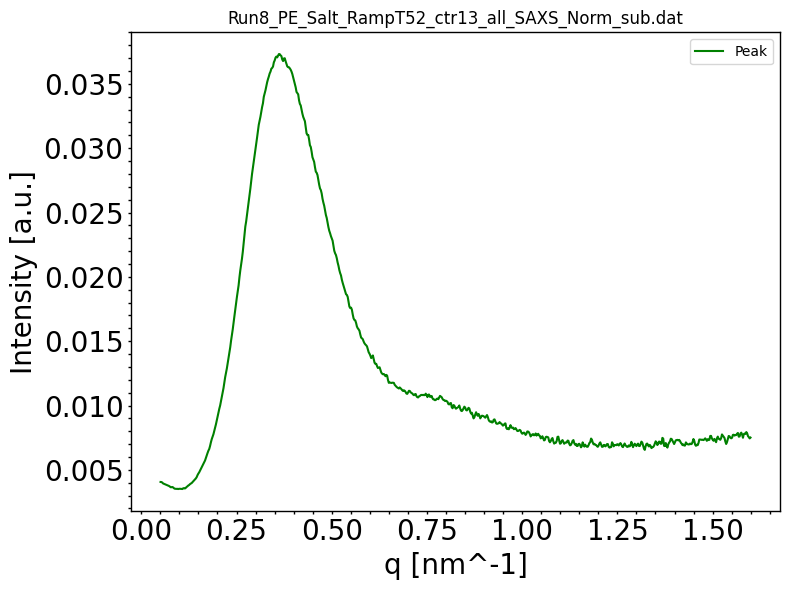


Processing keyword: _ctr14_
Found 1 files for keyword '_ctr14_'

Processing file: Run8_PE_Salt_RampT55_ctr14_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181756.22333333336, bstop=4.723019999999999, ctemp=57.997149, I0=20.57406333333333
Data size after truncation: 704 points
Peak area: 0.038445162978570674 ± 8.772137969146823e-05


<Figure size 640x480 with 0 Axes>

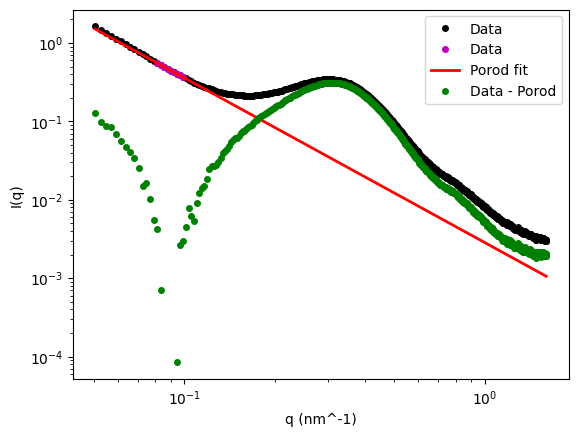

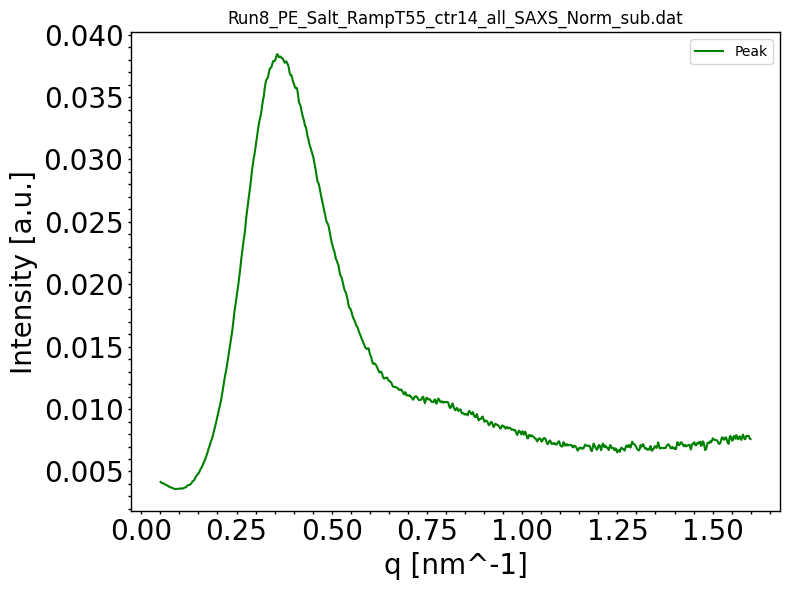


Processing keyword: _ctr15_
Found 1 files for keyword '_ctr15_'

Processing file: Run8_PE_Salt_RampT57_ctr15_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181801.55999999997, bstop=4.769909999999999, ctemp=57.61213066666667, I0=20.781859999999998
Data size after truncation: 704 points
Peak area: 0.03806551093537925 ± 8.667453586036123e-05


<Figure size 640x480 with 0 Axes>

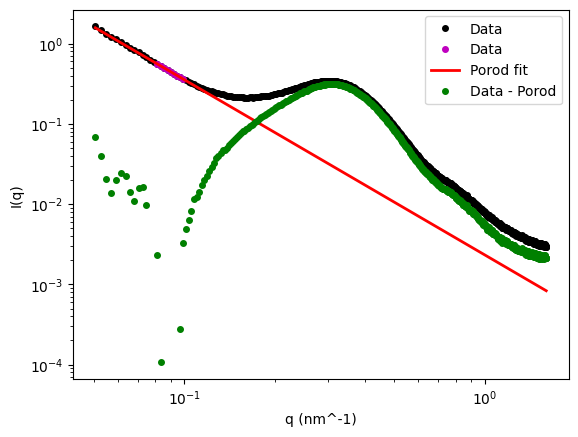

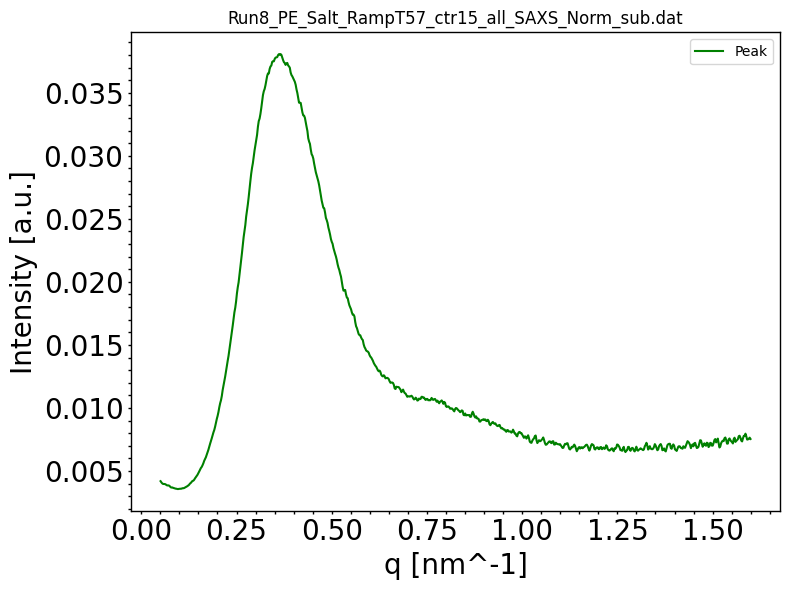


Processing keyword: _ctr16_
Found 1 files for keyword '_ctr16_'

Processing file: Run8_PE_Salt_RampT60_ctr16_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181851.64666666664, bstop=4.762383333333333, ctemp=60.186577, I0=20.777676666666668
Data size after truncation: 704 points
Peak area: 0.03885636938703261 ± 8.745764452441703e-05


<Figure size 640x480 with 0 Axes>

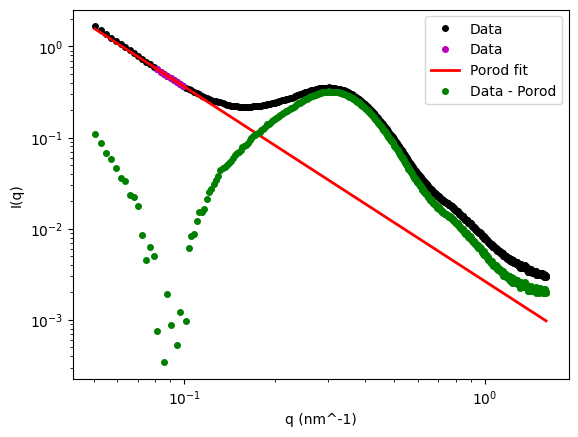

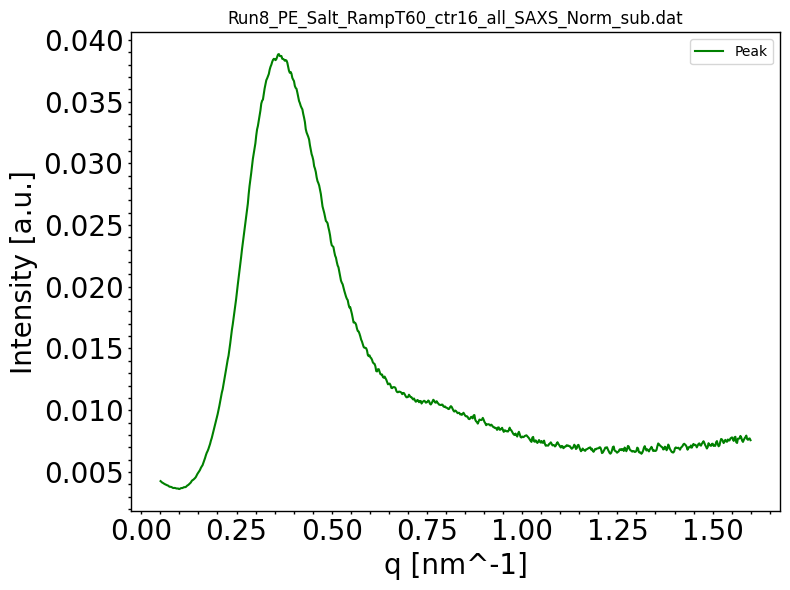


Processing keyword: _ctr17_
Found 1 files for keyword '_ctr17_'

Processing file: Run8_PE_Salt_RampT62_ctr17_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181927.50333333333, bstop=4.75411, ctemp=65.19823466666666, I0=20.67854
Data size after truncation: 704 points
Peak area: 0.040480445583573874 ± 8.895330001197264e-05


<Figure size 640x480 with 0 Axes>

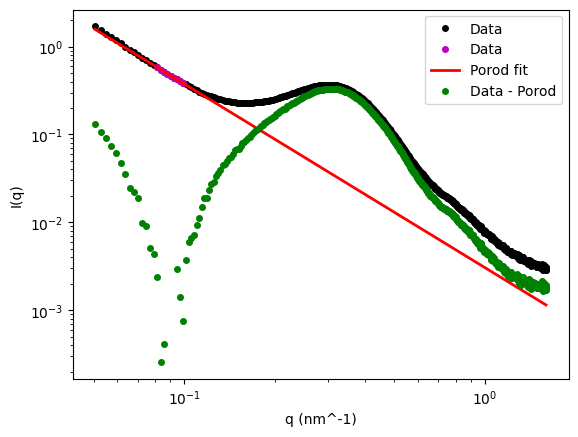

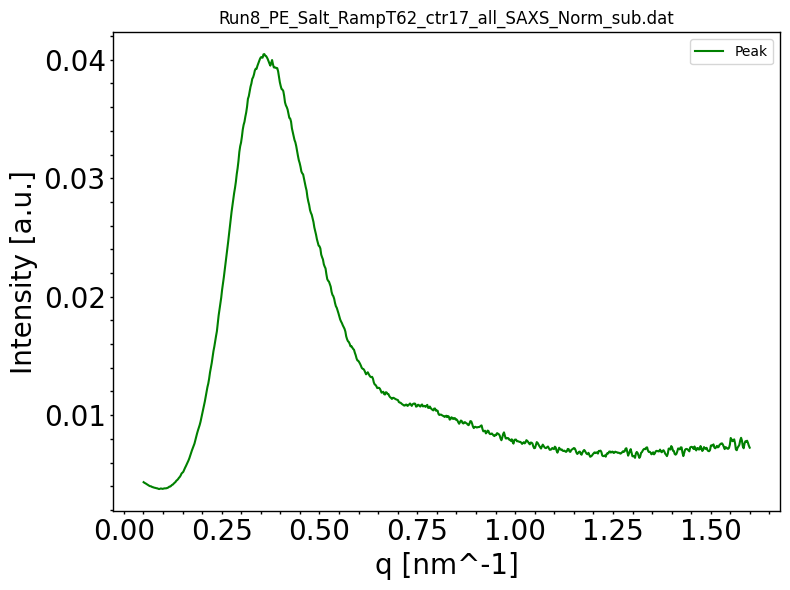


Processing keyword: _ctr18_
Found 1 files for keyword '_ctr18_'

Processing file: Run8_PE_Salt_RampT65_ctr18_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181971.77000000002, bstop=4.741376666666667, ctemp=64.80197266666666, I0=20.70311
Data size after truncation: 704 points
Peak area: 0.040431853976515116 ± 8.920425973444399e-05


<Figure size 640x480 with 0 Axes>

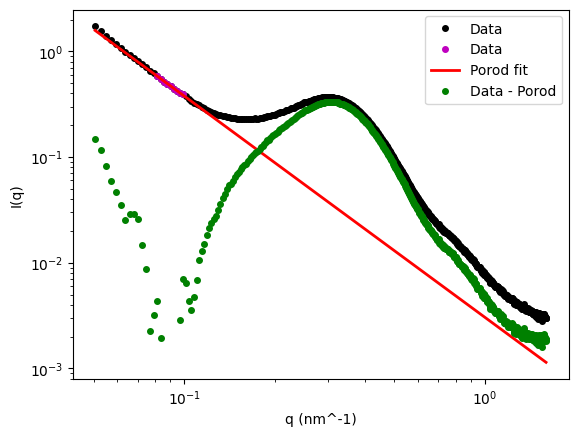

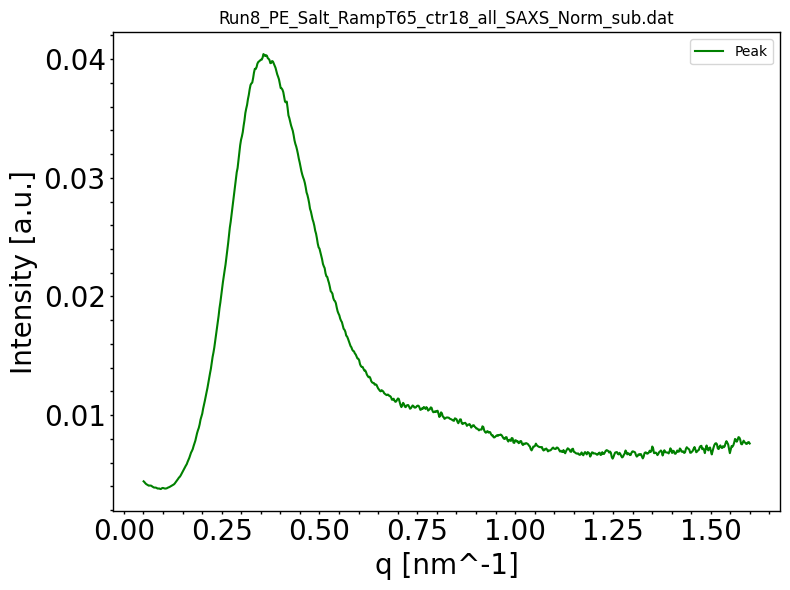


Processing keyword: _ctr19_
Found 1 files for keyword '_ctr19_'

Processing file: Run8_PE_Salt_RampT67_ctr19_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182021.67, bstop=4.736606666666667, ctemp=67.37047299999999, I0=20.59455
Data size after truncation: 704 points
Peak area: 0.04153564341282814 ± 9.020173908980371e-05


<Figure size 640x480 with 0 Axes>

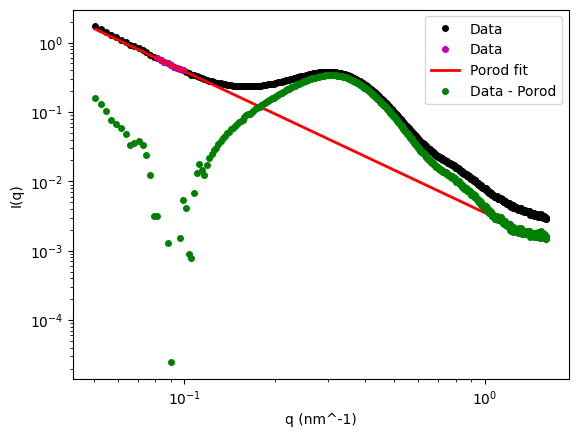

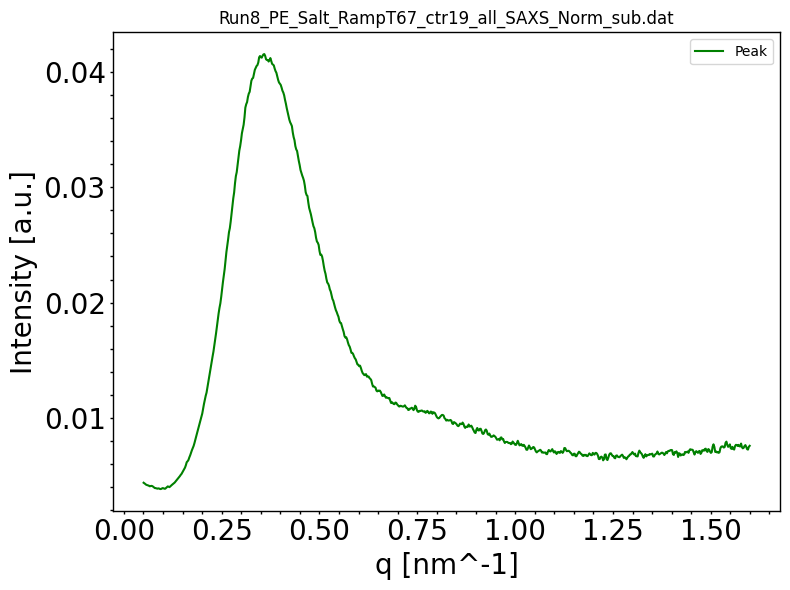


Processing keyword: _ctr20_
Found 1 files for keyword '_ctr20_'

Processing file: Run8_PE_Salt_RampT70_ctr20_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182091.6433333333, bstop=4.767446666666667, ctemp=72.37532533333335, I0=20.735463333333332
Data size after truncation: 704 points
Peak area: 0.04278073143901237 ± 9.060658228121219e-05


<Figure size 640x480 with 0 Axes>

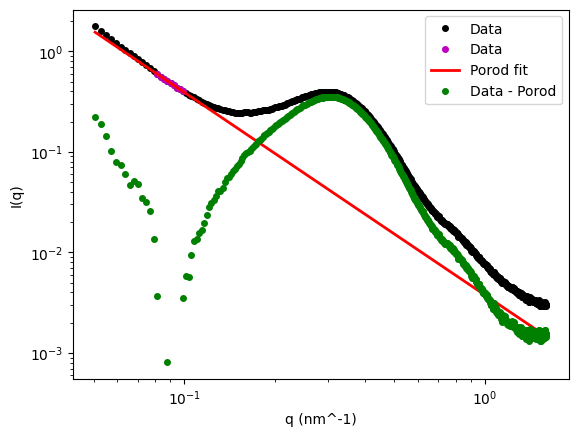

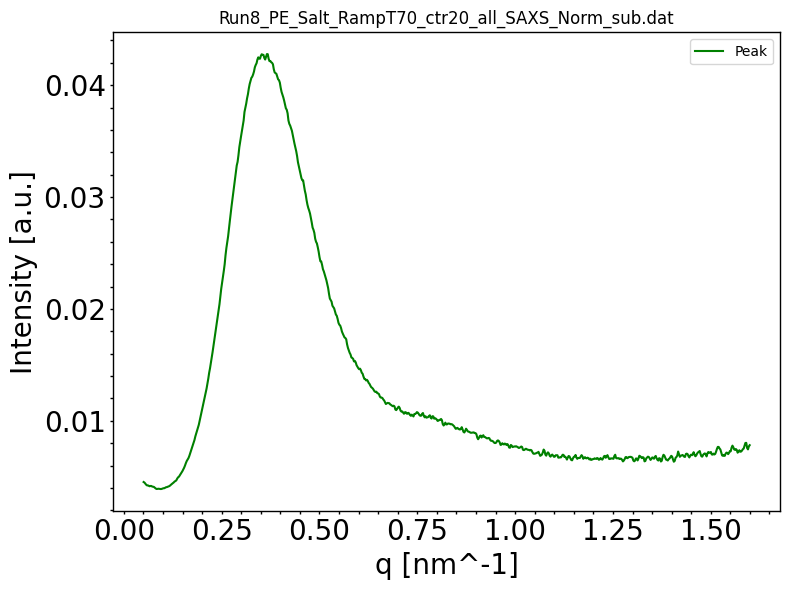


Processing keyword: _ctr21_
Found 1 files for keyword '_ctr21_'

Processing file: Run8_PE_Salt_RampT72_ctr21_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182177.93666666668, bstop=4.766303333333334, ctemp=74.770579, I0=20.74261
Data size after truncation: 704 points
Peak area: 0.04424571294020334 ± 9.114750827935949e-05


<Figure size 640x480 with 0 Axes>

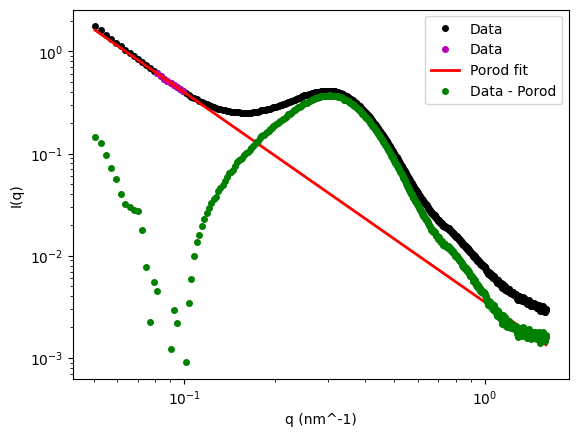

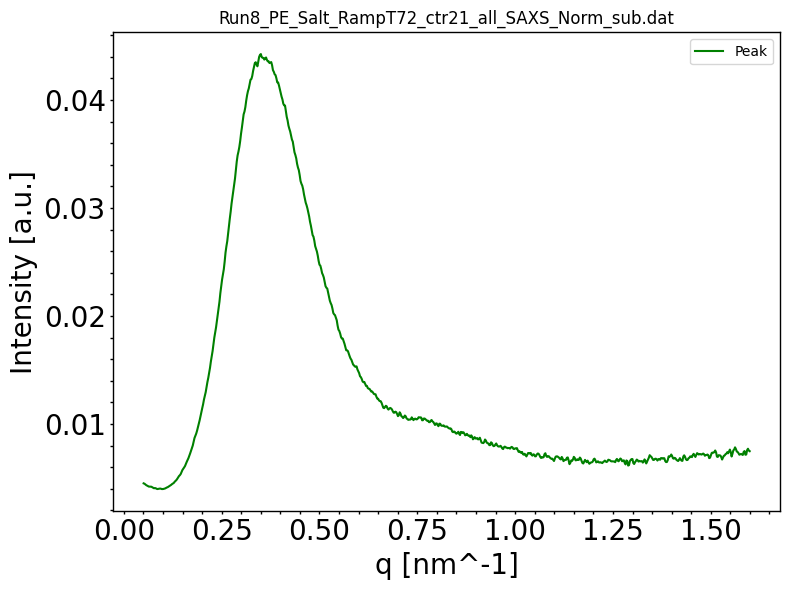


Processing keyword: _ctr22_
Found 1 files for keyword '_ctr22_'

Processing file: Run8_PE_Salt_RampT75_ctr22_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182261.70333333334, bstop=4.7461899999999995, ctemp=77.27234866666667, I0=20.64334666666667
Data size after truncation: 704 points
Peak area: 0.045462831756853735 ± 9.213588477319178e-05


<Figure size 640x480 with 0 Axes>

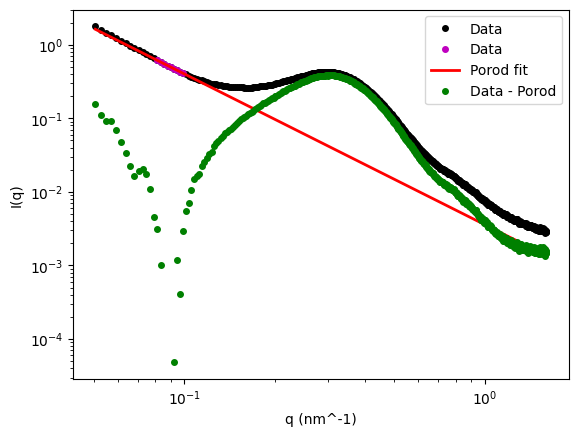

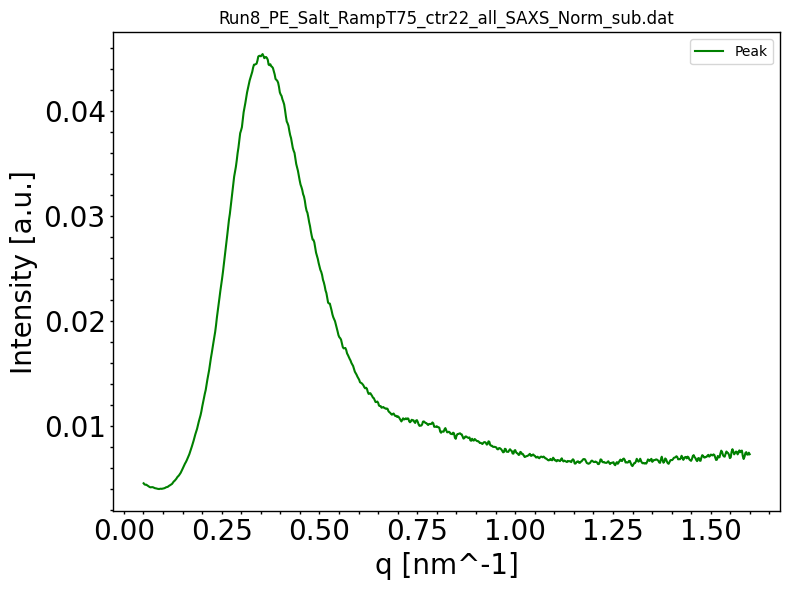


Processing keyword: _ctr23_
Found 1 files for keyword '_ctr23_'

Processing file: Run8_PE_Salt_RampT77_ctr23_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182345.92333333334, bstop=4.7237, ctemp=79.686994, I0=20.58277
Data size after truncation: 704 points
Peak area: 0.04692205512455972 ± 9.25320492868933e-05


<Figure size 640x480 with 0 Axes>

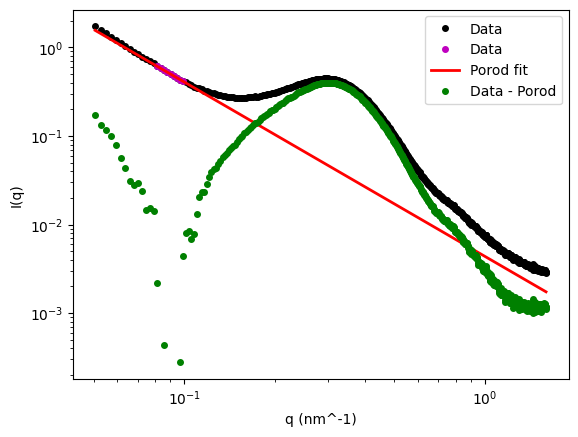

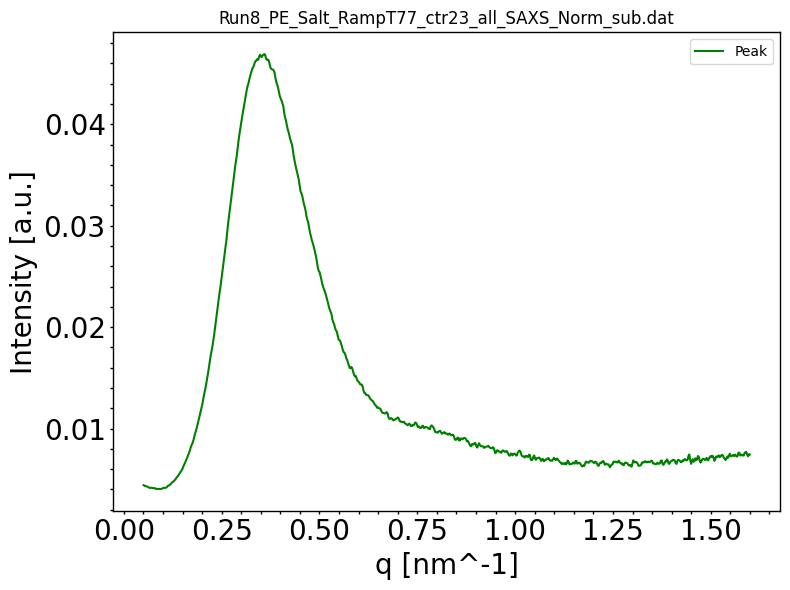


Processing keyword: _ctr24_
Found 1 files for keyword '_ctr24_'

Processing file: Run8_PE_Salt_RampT80_ctr24_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182430.94333333333, bstop=4.767316666666667, ctemp=82.09215033333334, I0=20.807506666666665
Data size after truncation: 704 points
Peak area: 0.04805582053399686 ± 9.168210065986886e-05


<Figure size 640x480 with 0 Axes>

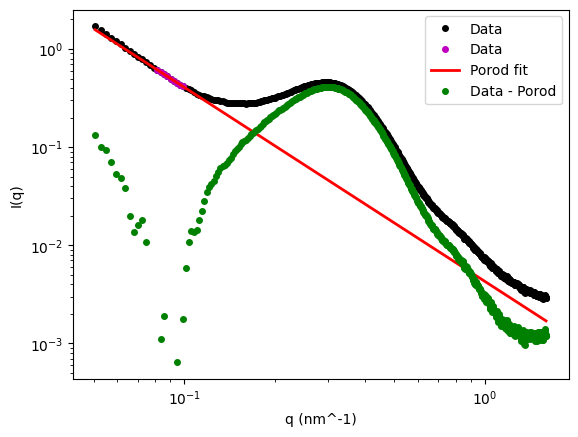

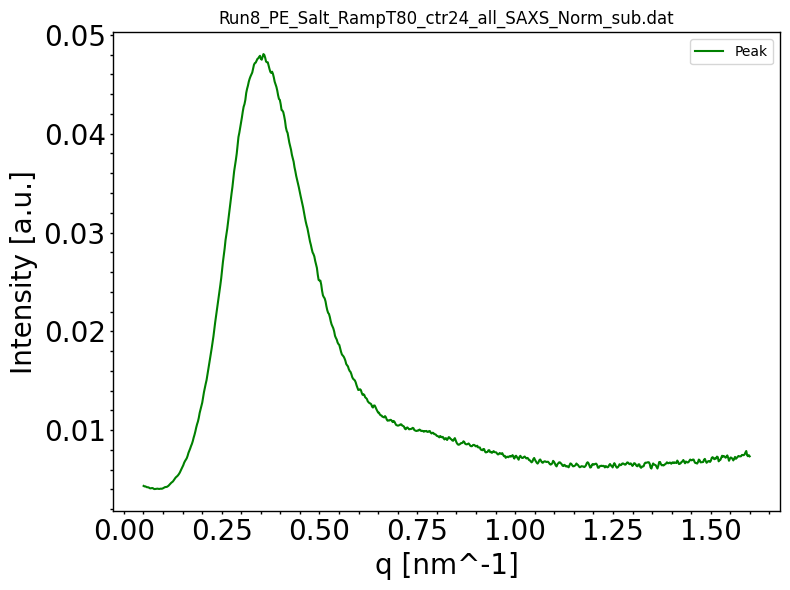


Processing keyword: _ctr25_
Found 1 files for keyword '_ctr25_'

Processing file: Run8_PE_Salt_RampT82_ctr25_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182516.55000000002, bstop=4.754133333333333, ctemp=84.52248133333335, I0=20.696056666666667
Data size after truncation: 704 points
Peak area: 0.04972960741899134 ± 9.269054138213408e-05


<Figure size 640x480 with 0 Axes>

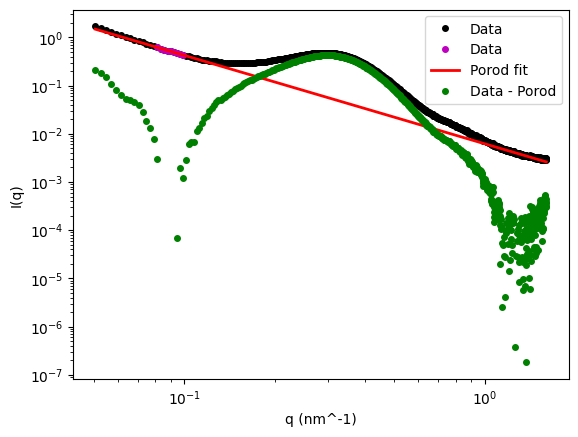

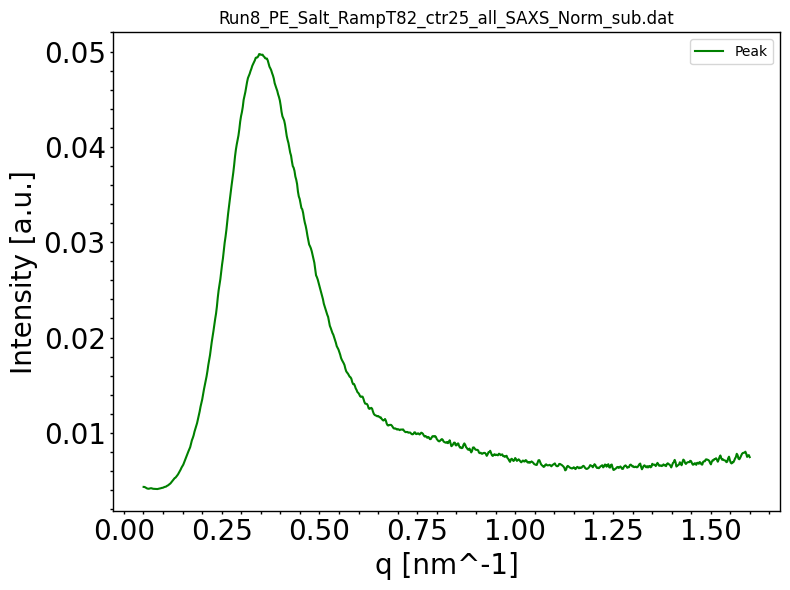


Processing keyword: _ctr26_
Found 1 files for keyword '_ctr26_'

Processing file: Run8_PE_Salt_RampT85_ctr26_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182603.82666666666, bstop=4.736093333333334, ctemp=86.91256700000001, I0=20.592646666666667
Data size after truncation: 704 points
Peak area: 0.05203182595707552 ± 9.403120487999979e-05


<Figure size 640x480 with 0 Axes>

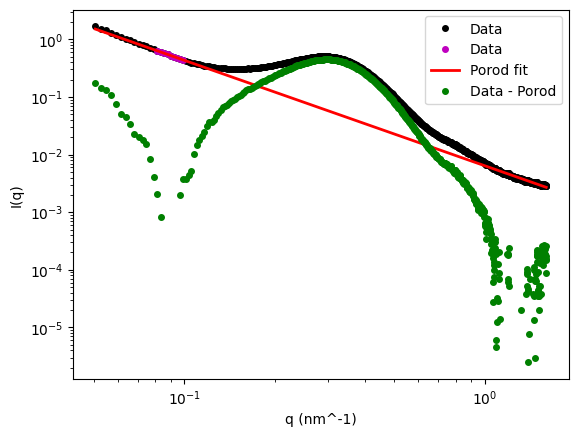

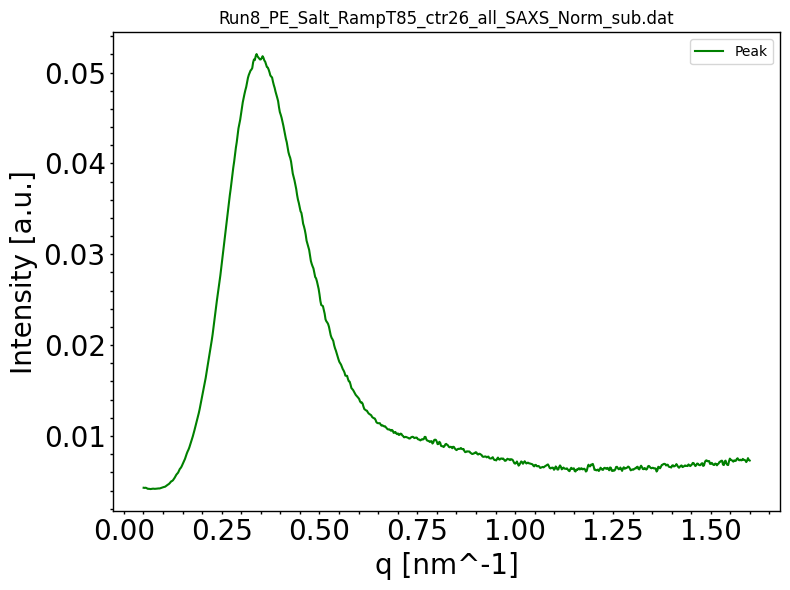


Processing keyword: _ctr27_
Found 1 files for keyword '_ctr27_'

Processing file: Run8_PE_Salt_RampT87_ctr27_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182692.61333333337, bstop=4.75943, ctemp=89.32763933333332, I0=20.72781
Data size after truncation: 704 points
Peak area: 0.053705000542016906 ± 9.450068552828928e-05


<Figure size 640x480 with 0 Axes>

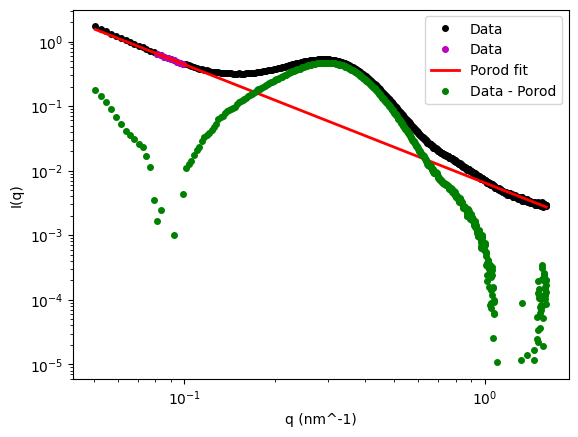

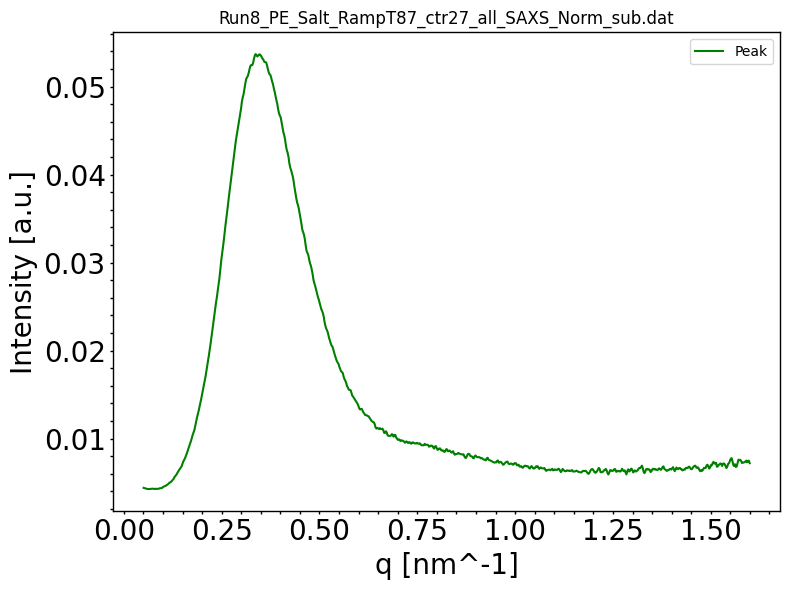


Processing keyword: _ctr28_
Found 1 files for keyword '_ctr28_'

Processing file: Run8_PE_Salt_RampT90_ctr28_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182782.92333333334, bstop=4.76652, ctemp=91.72427366666666, I0=20.742733333333334
Data size after truncation: 704 points
Peak area: 0.05567549263279089 ± 9.604040430350892e-05


<Figure size 640x480 with 0 Axes>

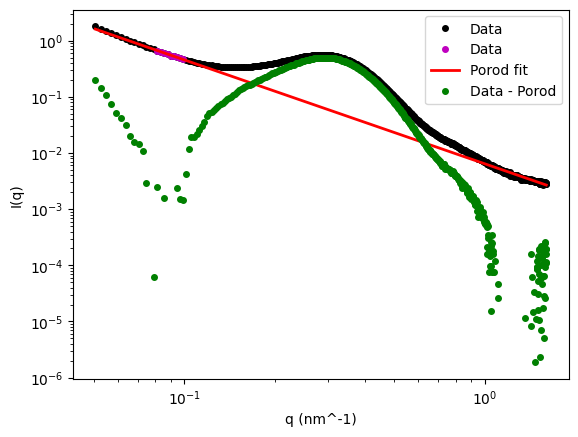

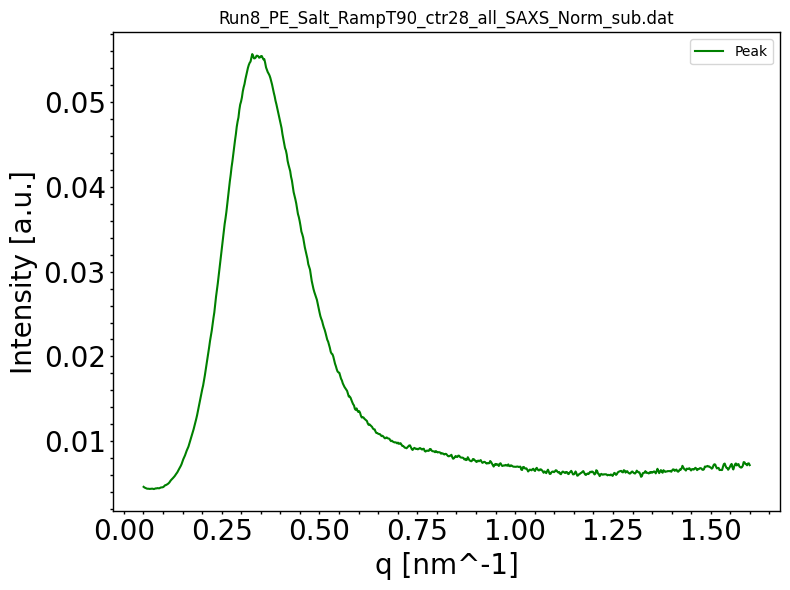


Processing keyword: _ctr29_
Found 1 files for keyword '_ctr29_'

Processing file: Run8_PE_Salt_RampT92_ctr29_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182874.03333333335, bstop=4.756443333333333, ctemp=94.11374133333334, I0=20.643243333333334
Data size after truncation: 704 points
Peak area: 0.05832891712593125 ± 9.859705137246617e-05


<Figure size 640x480 with 0 Axes>

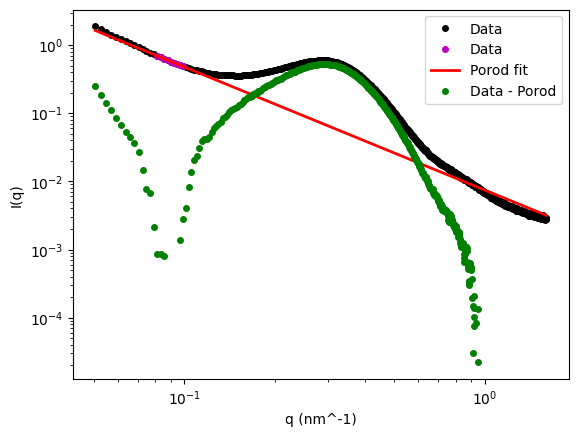

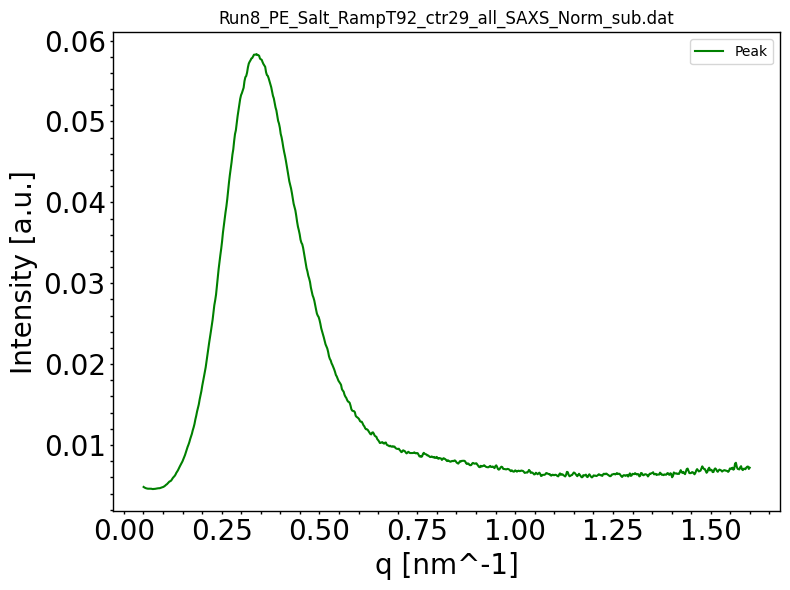


Processing keyword: _ctr30_
Found 1 files for keyword '_ctr30_'

Processing file: Run8_PE_Salt_RampT95_ctr30_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182965.88, bstop=4.74429, ctemp=96.54251833333335, I0=20.544960000000003
Data size after truncation: 704 points
Peak area: 0.060936005434770305 ± 0.00010125386135921289


<Figure size 640x480 with 0 Axes>

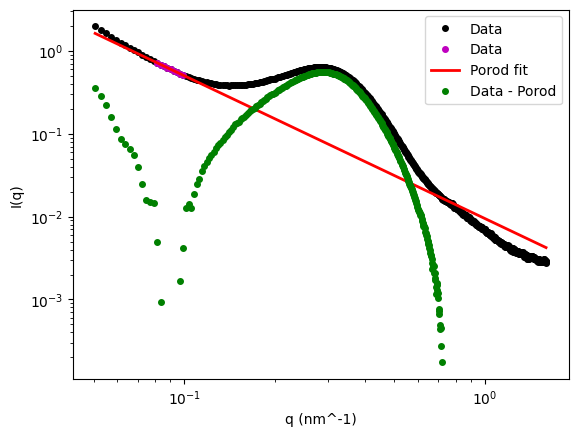

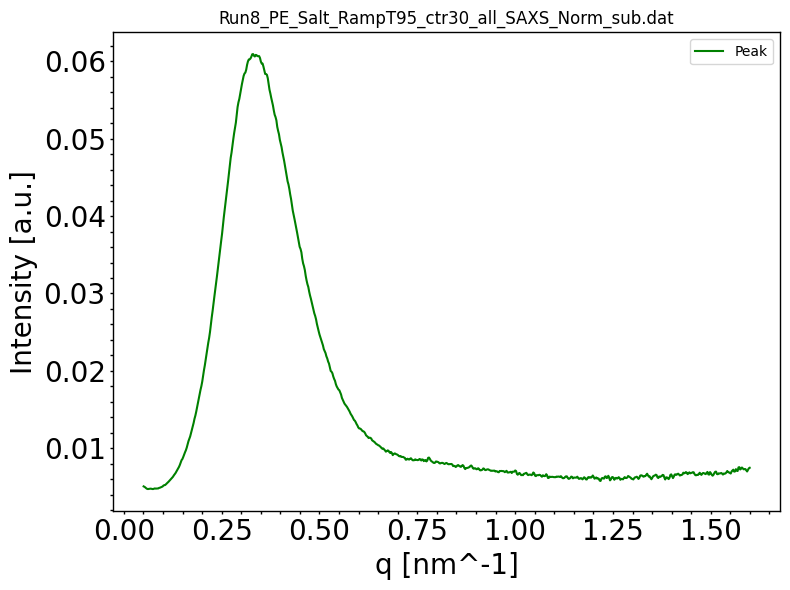


Processing keyword: _ctr31_
Found 1 files for keyword '_ctr31_'

Processing file: Run8_PE_Salt_RampT97_ctr31_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183059.17333333334, bstop=4.792723333333333, ctemp=98.90472900000002, I0=20.728256666666667
Data size after truncation: 704 points
Peak area: 0.06301403434247116 ± 0.00010227274577834747


<Figure size 640x480 with 0 Axes>

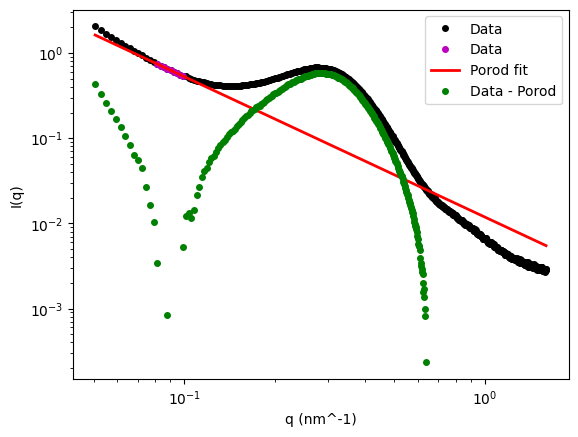

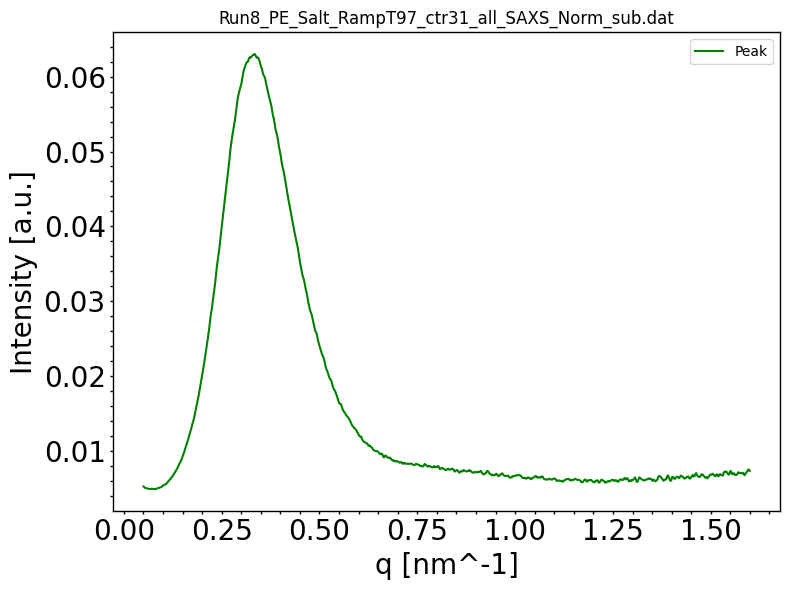


Processing keyword: _ctr32_
Found 1 files for keyword '_ctr32_'

Processing file: Run8_PE_Salt_RampT100_ctr32_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183152.29333333333, bstop=4.77618, ctemp=101.30473333333333, I0=20.617993333333335
Data size after truncation: 704 points
Peak area: 0.06570259238368095 ± 0.00010510121853060988


<Figure size 640x480 with 0 Axes>

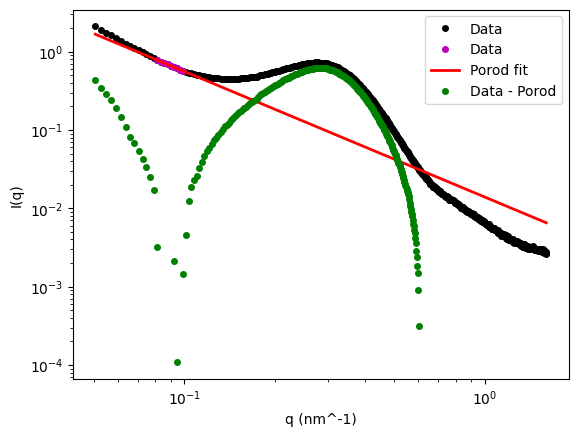

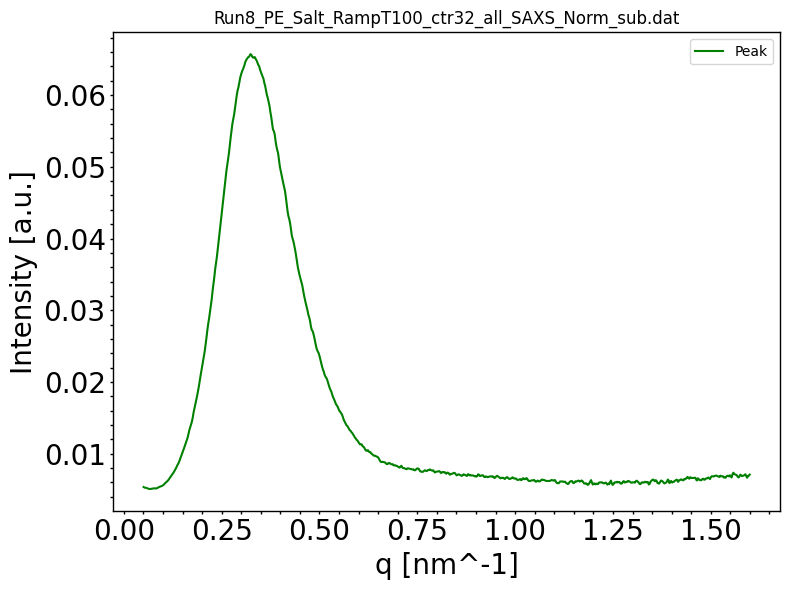


Processing keyword: _ctr33_
Found 1 files for keyword '_ctr33_'

Processing file: Run8_PE_Salt_RampT102_ctr33_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183245.11, bstop=4.756936666666667, ctemp=103.73583333333333, I0=20.57265333333333
Data size after truncation: 704 points
Peak area: 0.06802033357543086 ± 0.00010795879900310559


<Figure size 640x480 with 0 Axes>

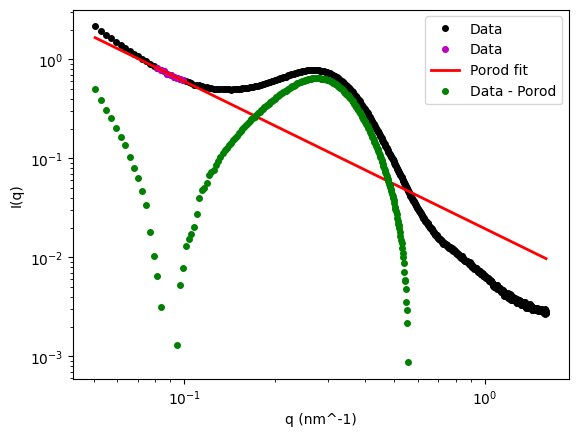

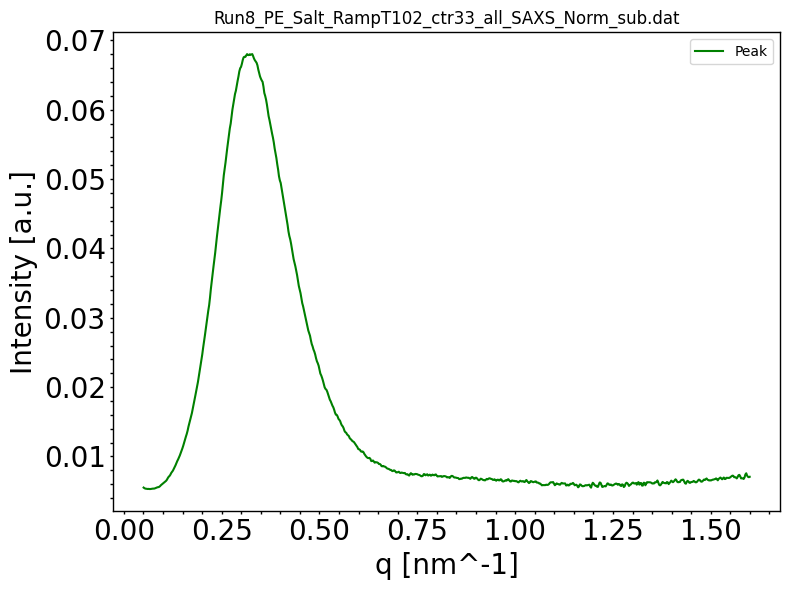


Processing keyword: _ctr34_
Found 1 files for keyword '_ctr34_'

Processing file: Run8_PE_Salt_RampT105_ctr34_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183338.8633333333, bstop=4.804939999999999, ctemp=106.10936666666667, I0=20.770476666666667
Data size after truncation: 704 points
Peak area: 0.06977940650157373 ± 0.00010975110091918805


<Figure size 640x480 with 0 Axes>

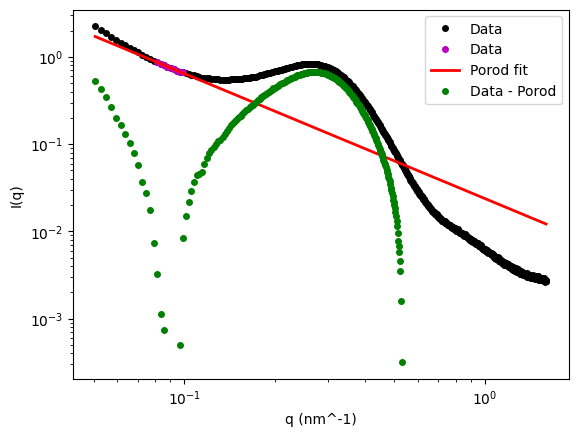

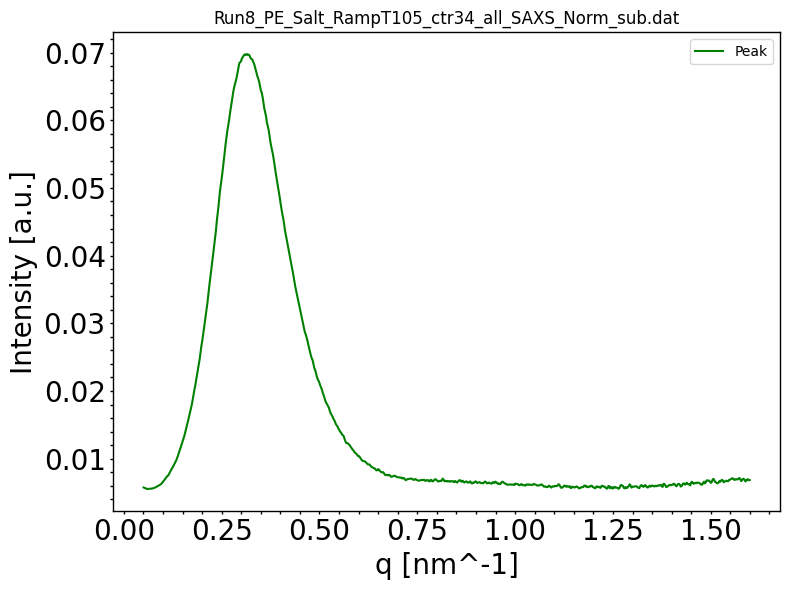


Processing keyword: _ctr35_
Found 1 files for keyword '_ctr35_'

Processing file: Run8_PE_Salt_RampT107_ctr35_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183431.8866666667, bstop=4.780333333333334, ctemp=108.51453333333335, I0=20.639993333333333
Data size after truncation: 704 points
Peak area: 0.07253473463381395 ± 0.00011344801452613899


<Figure size 640x480 with 0 Axes>

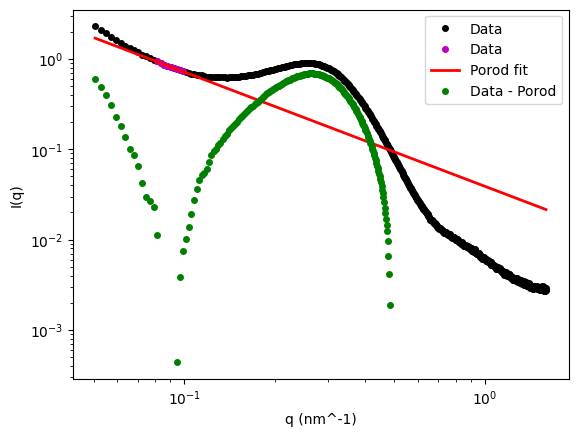

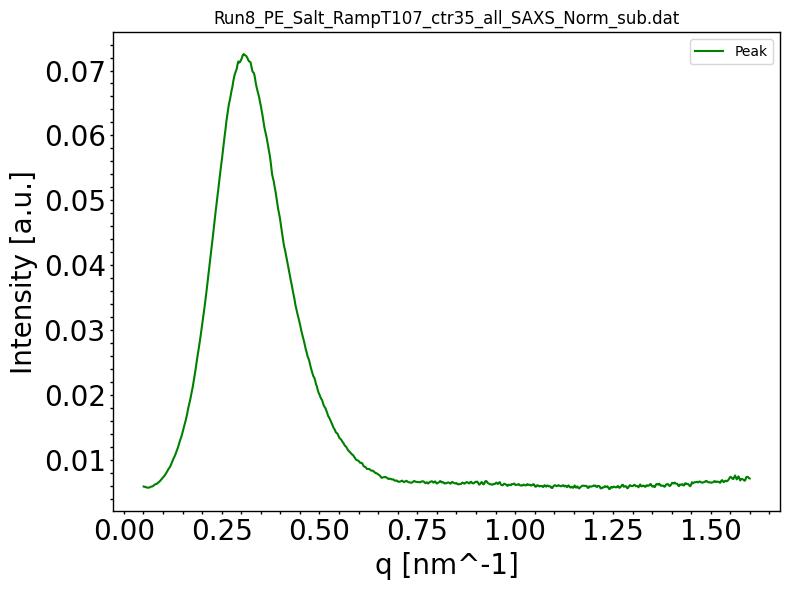


Processing keyword: _ctr36_
Found 1 files for keyword '_ctr36_'

Processing file: Run8_PE_Salt_RampT110_ctr36_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183524.34, bstop=4.758523333333334, ctemp=110.92143333333335, I0=20.551703333333336
Data size after truncation: 704 points
Peak area: 0.07603345605303029 ± 0.00011835498235908077


<Figure size 640x480 with 0 Axes>

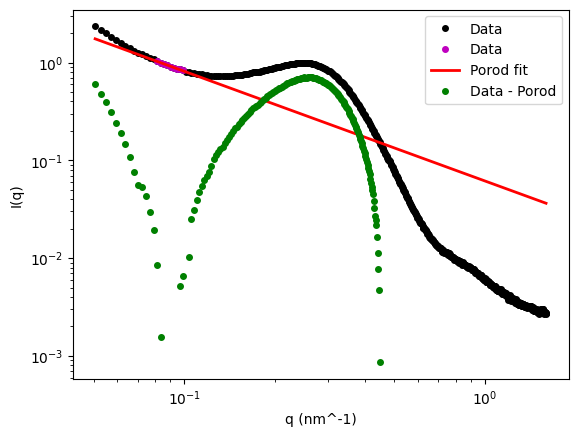

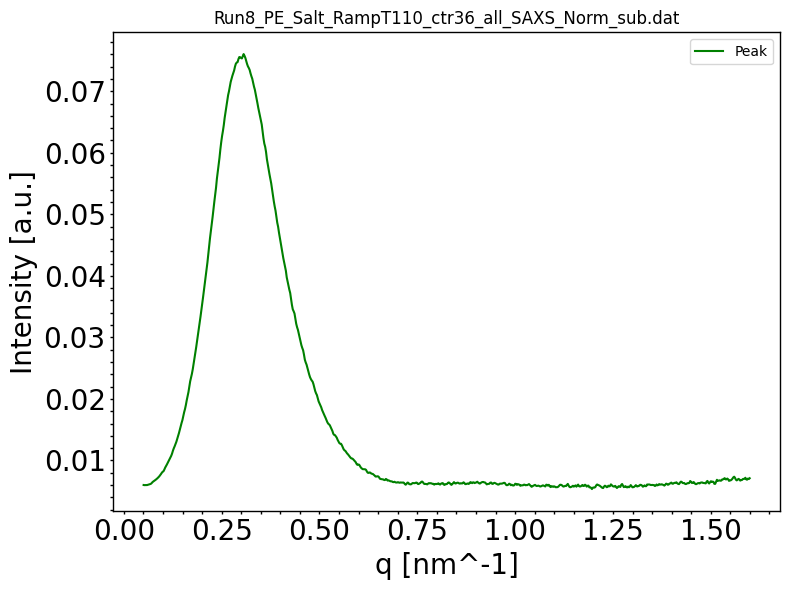


Processing keyword: _ctr37_
Found 1 files for keyword '_ctr37_'

Processing file: Run8_PE_Salt_RampT112_ctr37_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183617.80999999997, bstop=4.7871966666666665, ctemp=113.33846666666666, I0=20.783936666666666
Data size after truncation: 704 points
Peak area: 0.07616723332783824 ± 0.00012121816944898635


<Figure size 640x480 with 0 Axes>

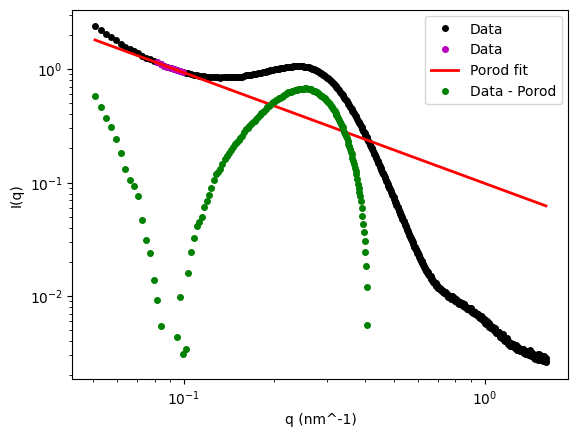

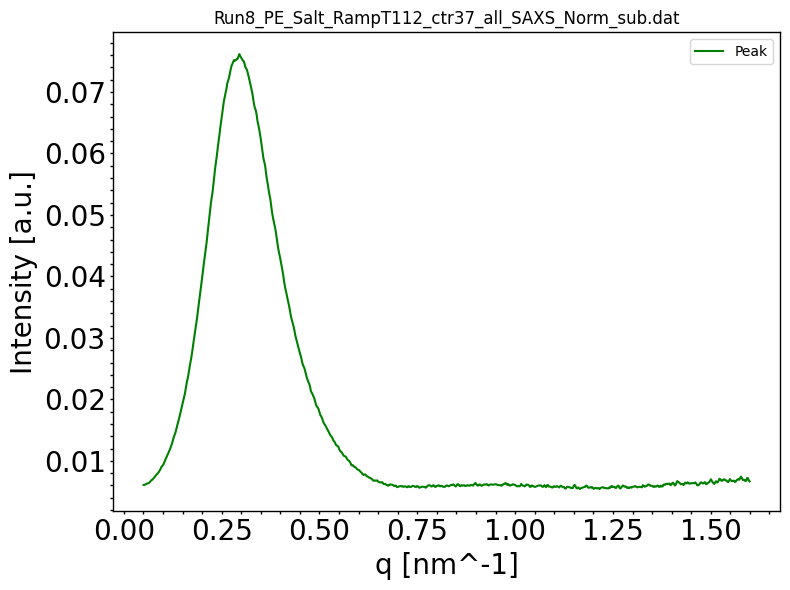


Processing keyword: _ctr38_
Found 1 files for keyword '_ctr38_'

Processing file: Run8_PE_Salt_RampT115_ctr38_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183712.02333333332, bstop=4.770983333333334, ctemp=115.66399999999999, I0=20.622429999999998
Data size after truncation: 704 points
Peak area: 0.07772038146695394 ± 0.00012938814065060835


<Figure size 640x480 with 0 Axes>

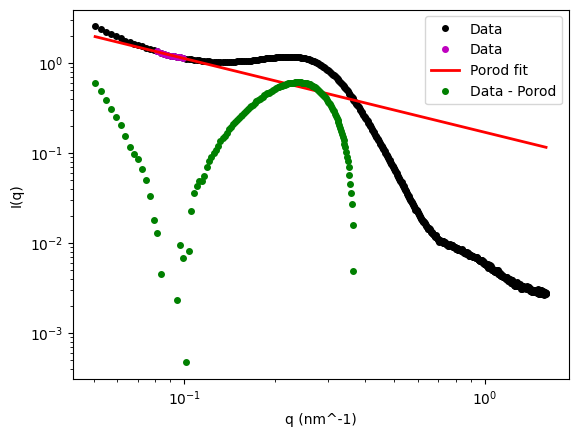

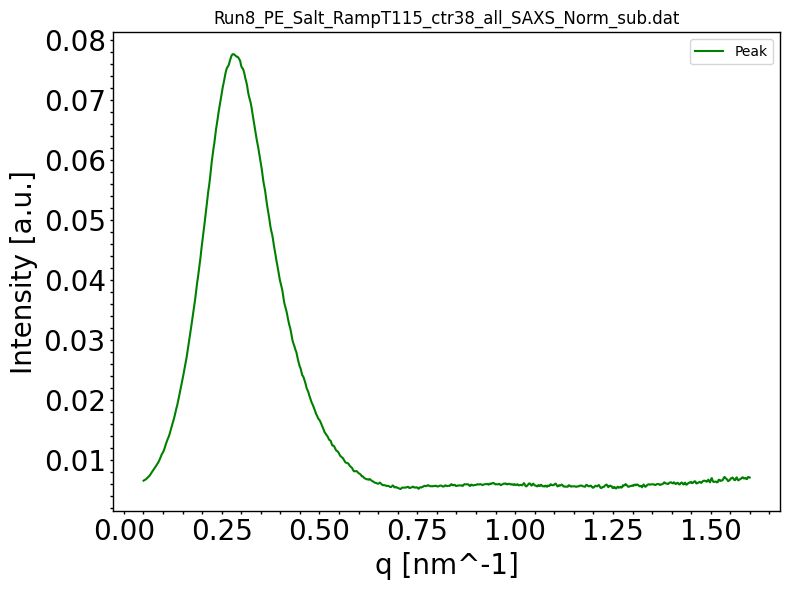


Processing keyword: _ctr39_
Found 1 files for keyword '_ctr39_'

Processing file: Run8_PE_Salt_RampT117_ctr39_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183804.63333333333, bstop=4.747326666666667, ctemp=118.10236666666667, I0=20.55863
Data size after truncation: 704 points
Peak area: 0.0764868600420399 ± 0.0001383894762800286


<Figure size 640x480 with 0 Axes>

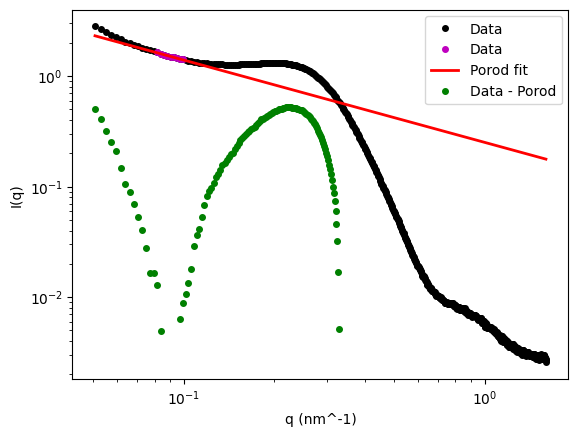

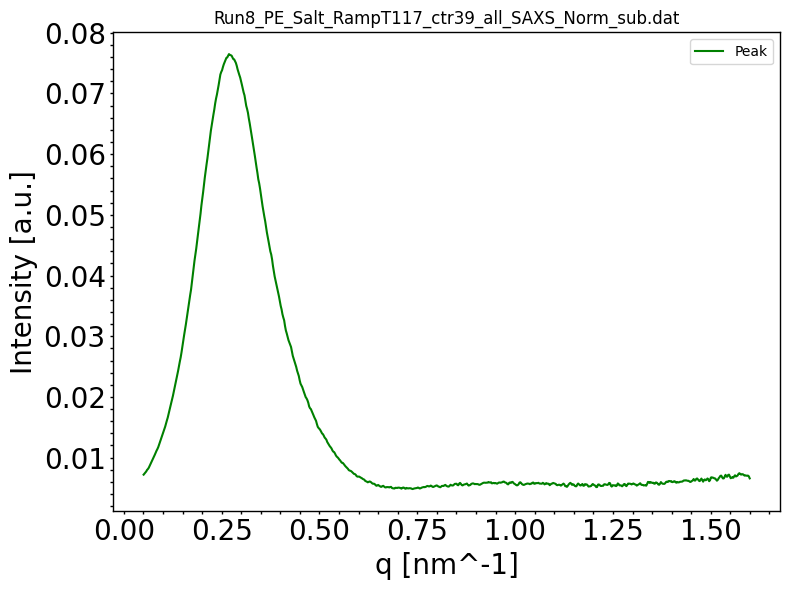


Processing keyword: _ctr40_
Found 1 files for keyword '_ctr40_'

Processing file: Run8_PE_Salt_RampT120_ctr40_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183897.93333333335, bstop=4.77681, ctemp=120.5224, I0=20.725943333333333
Data size after truncation: 704 points
Peak area: 0.07305038922326983 ± 0.0001488012533995192


<Figure size 640x480 with 0 Axes>

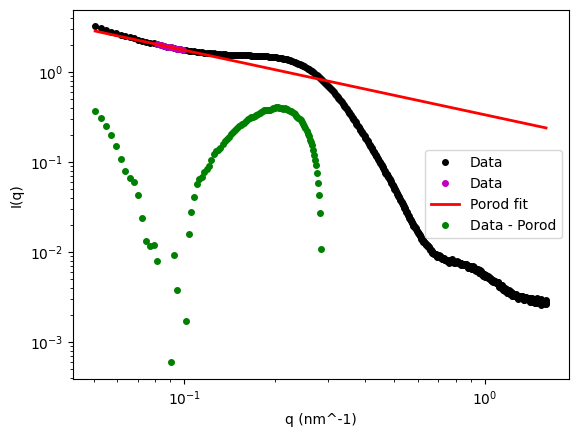

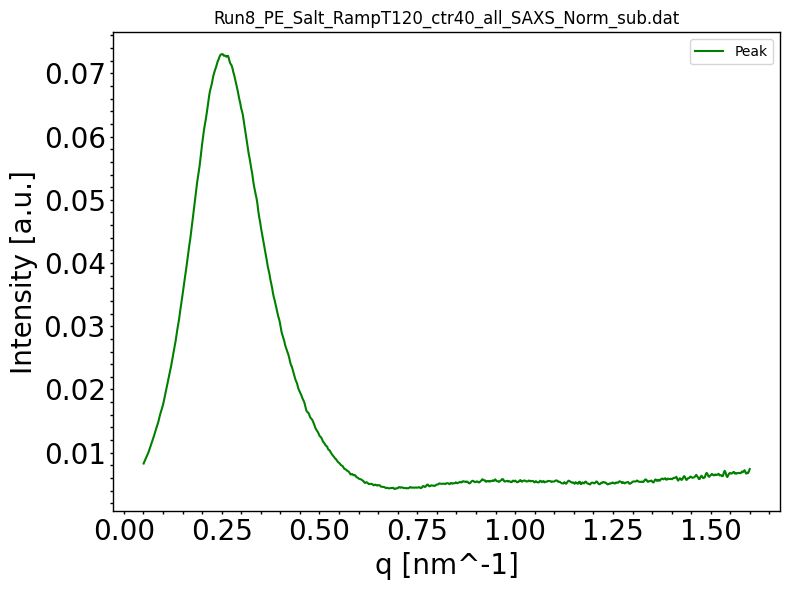


Processing keyword: _ctr41_
Found 1 files for keyword '_ctr41_'

Processing file: Run8_PE_Salt_RampT122_ctr41_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183992.59666666668, bstop=4.756029999999999, ctemp=122.89663333333333, I0=20.6503
Data size after truncation: 704 points
Peak area: 0.06838081482703674 ± 0.00016461532098671402


<Figure size 640x480 with 0 Axes>

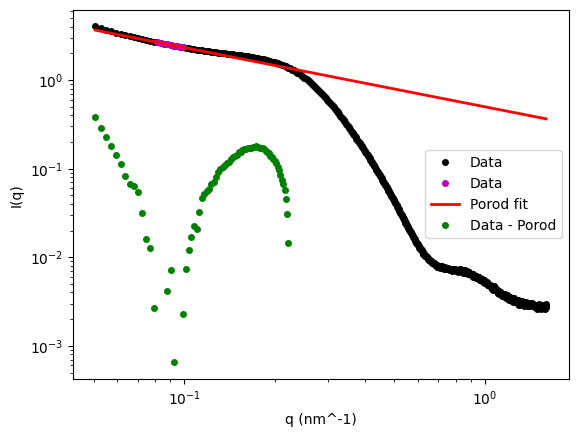

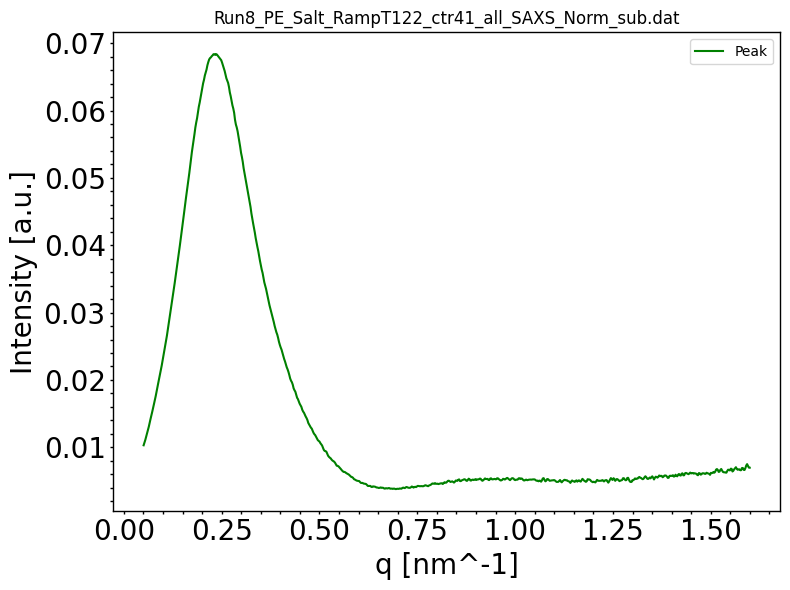


Processing keyword: _ctr42_
Found 1 files for keyword '_ctr42_'

Processing file: Run8_PE_Salt_RampT125_ctr42_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184087.65, bstop=4.733086666666666, ctemp=125.2728, I0=20.572893333333333
Data size after truncation: 704 points
Peak area: 0.06017161336502502 ± 0.000183371344262476


<Figure size 640x480 with 0 Axes>

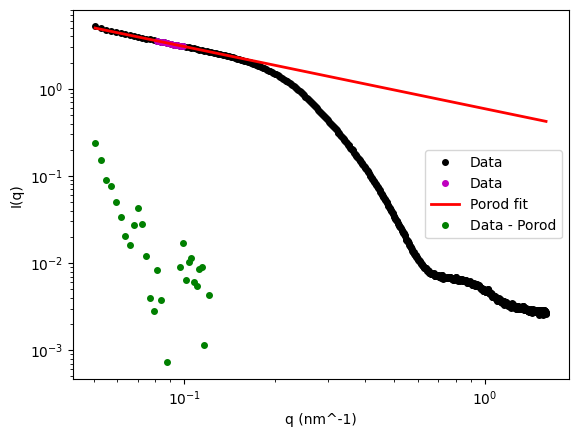

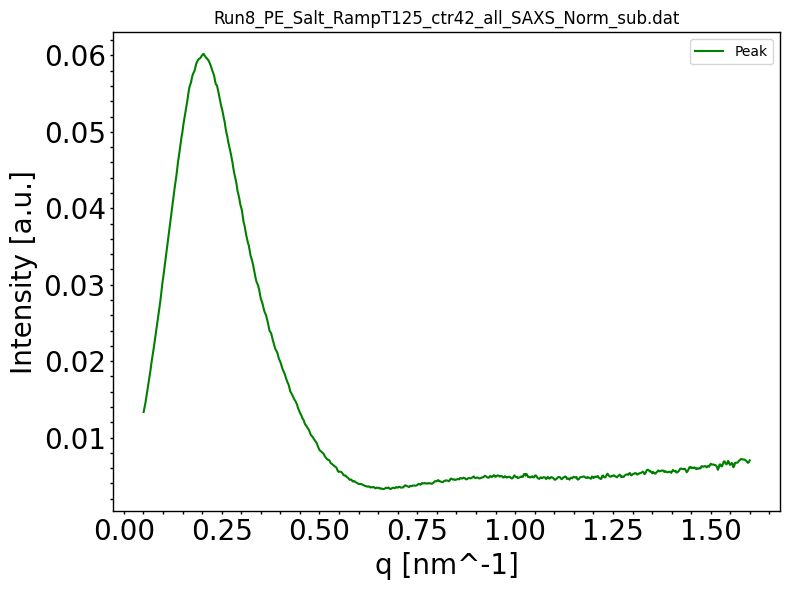


Processing keyword: _ctr43_
Found 1 files for keyword '_ctr43_'

Processing file: Run8_PE_Salt_RampT127_ctr43_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184182.62666666668, bstop=4.744236666666667, ctemp=127.7085, I0=20.576539999999998
Data size after truncation: 704 points
Peak area: 0.04375835280532113 ± 0.00019612526843931265


<Figure size 640x480 with 0 Axes>

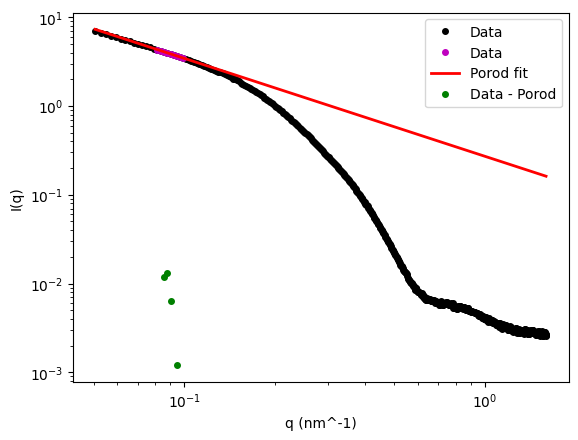

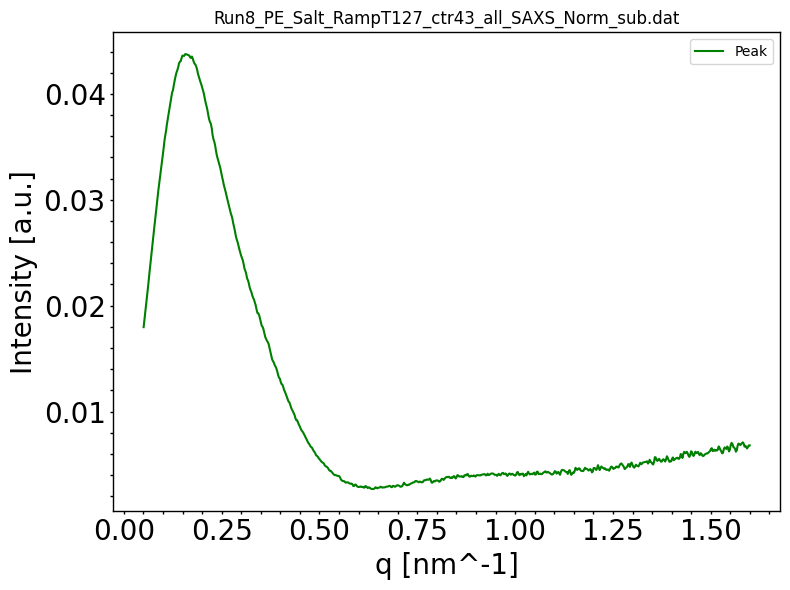


Processing keyword: _ctr44_
Found 1 files for keyword '_ctr44_'

Processing file: Run8_PE_Salt_RampT130_ctr44_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184278.6066666667, bstop=4.776023333333334, ctemp=130.11724, I0=20.645936666666667
Data size after truncation: 704 points
Peak area: 0.010508723287338324 ± 0.00011873399691809734


<Figure size 640x480 with 0 Axes>

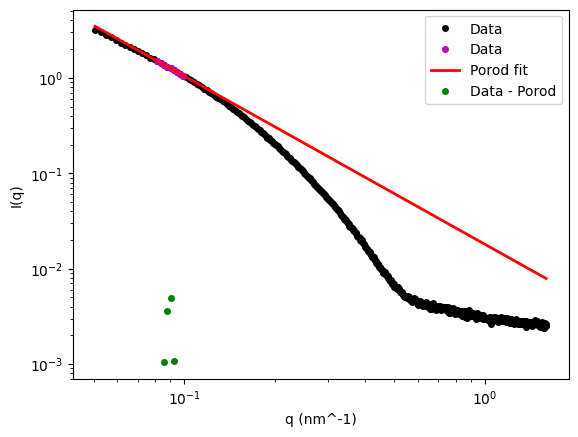

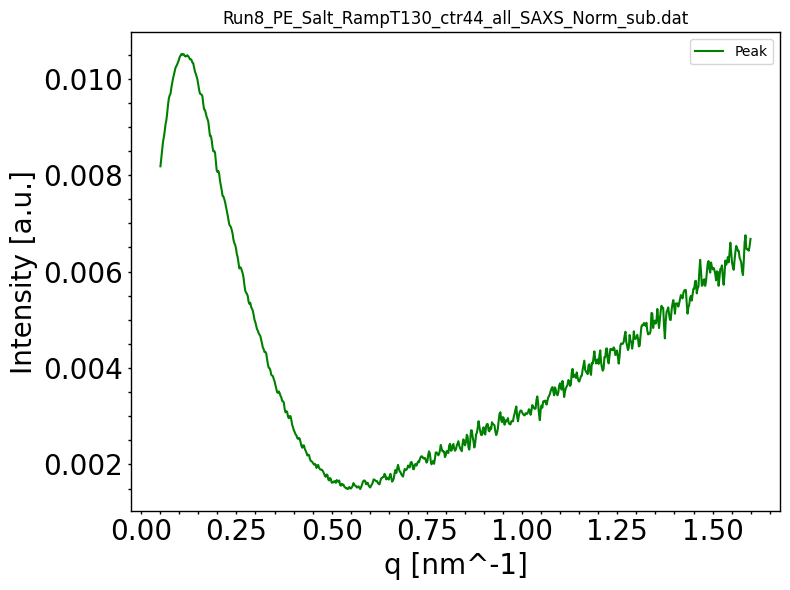


Processing keyword: _ctr45_
Found 1 files for keyword '_ctr45_'

Processing file: Run8_PE_Salt_RampT132_ctr45_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184374.99333333332, bstop=4.756293333333333, ctemp=132.59307, I0=20.55224
Data size after truncation: 704 points
Peak area: 0.007074572878086742 ± 5.656038836739676e-05


<Figure size 640x480 with 0 Axes>

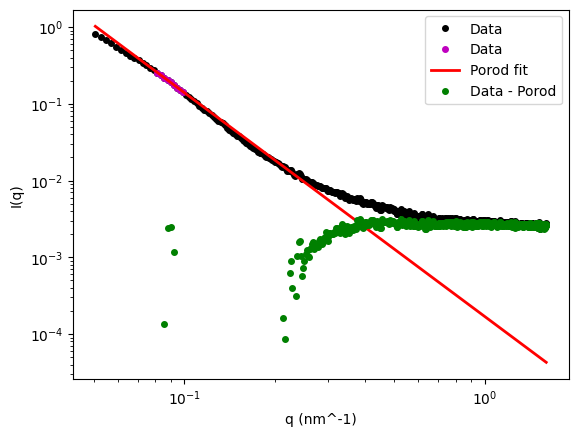

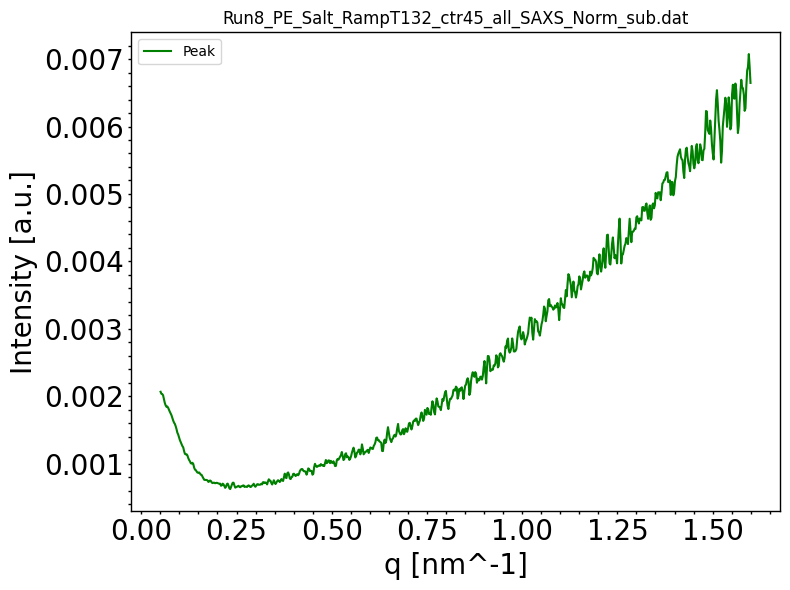


Processing keyword: _ctr46_
Found 1 files for keyword '_ctr46_'

Processing file: Run8_PE_Salt_RampT135_ctr46_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184474.33, bstop=4.743703333333333, ctemp=134.92373666666666, I0=20.508996666666665
Data size after truncation: 704 points
Peak area: 0.007247488050024834 ± 5.6003645291995266e-05


<Figure size 640x480 with 0 Axes>

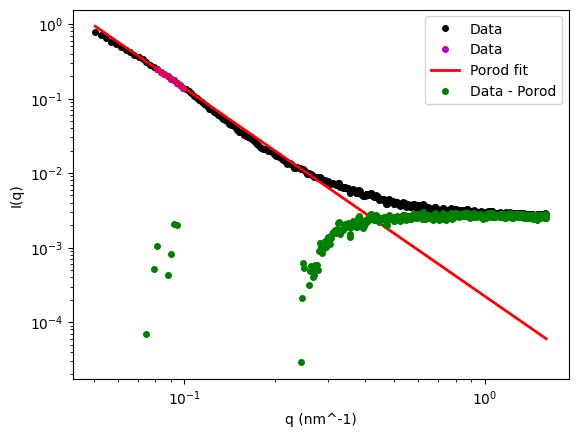

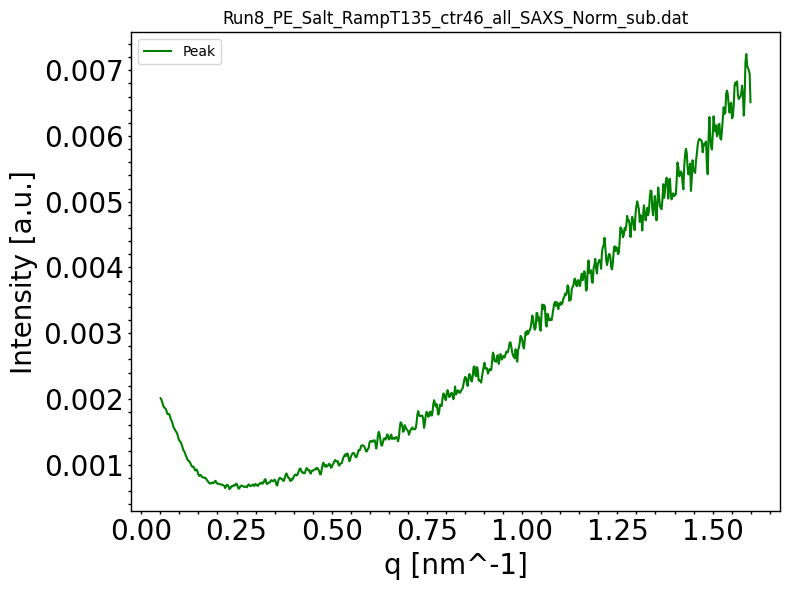


Processing keyword: _ctr47_
Found 1 files for keyword '_ctr47_'

Processing file: Run8_PE_Salt_RampT137_ctr47_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184572.02333333332, bstop=4.773219999999999, ctemp=137.50499666666667, I0=20.642413333333334
Data size after truncation: 704 points
Peak area: 0.006845930010499916 ± 5.4722181213670746e-05


<Figure size 640x480 with 0 Axes>

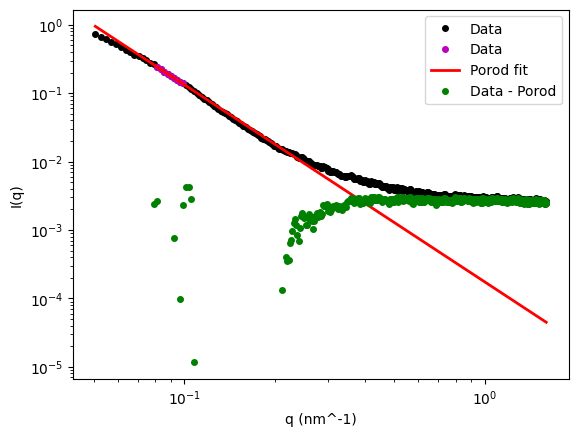

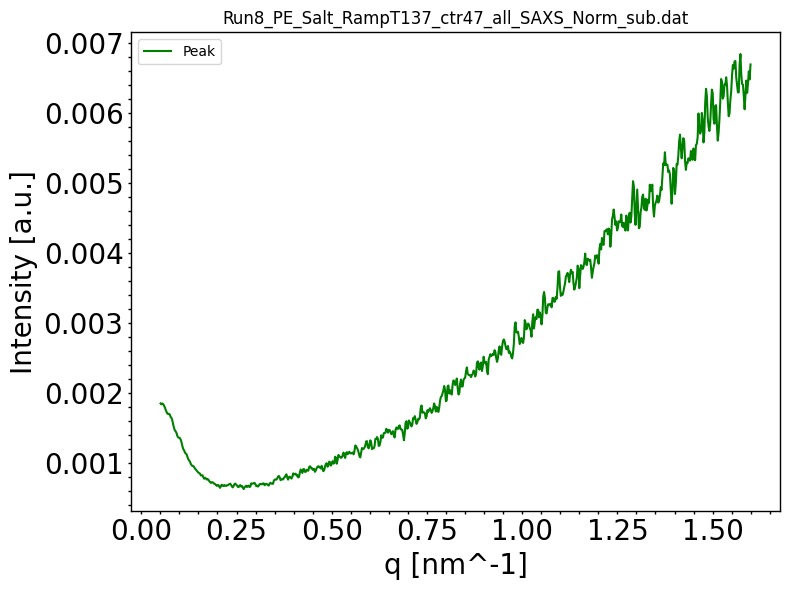


Processing keyword: _ctr48_
Found 1 files for keyword '_ctr48_'

Processing file: Run8_PE_Salt_RampT140_ctr48_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184676.07333333333, bstop=4.754576666666666, ctemp=139.69936666666666, I0=20.519343333333335
Data size after truncation: 704 points
Peak area: 0.0070938851141586455 ± 5.482166730333021e-05


<Figure size 640x480 with 0 Axes>

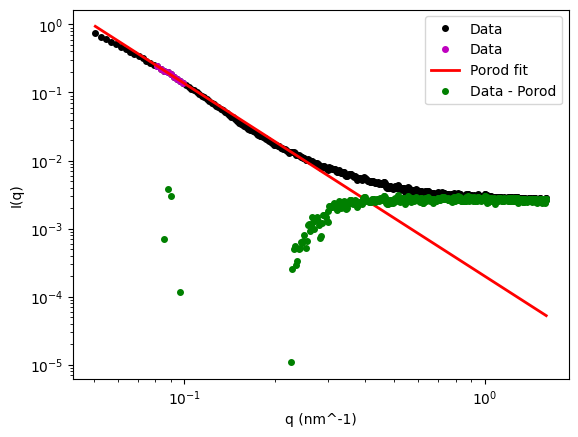

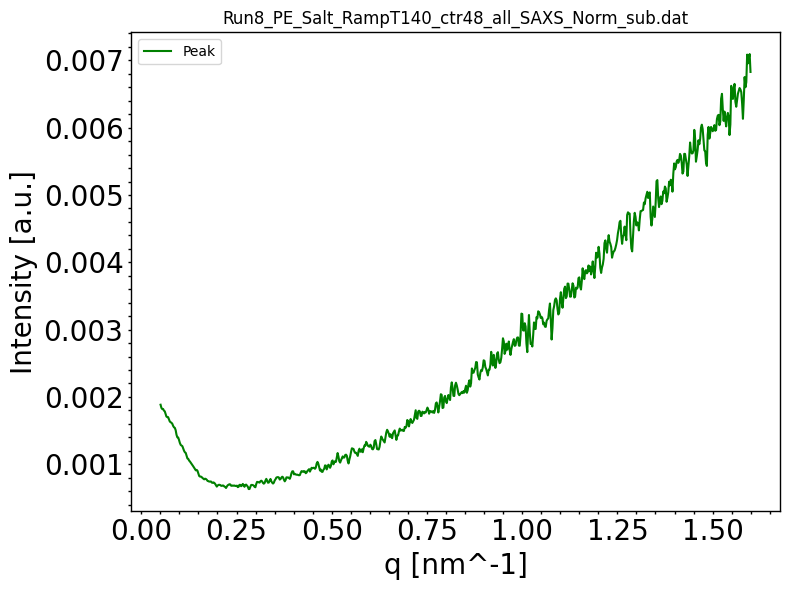


Processing keyword: _ctr49_
Found 1 files for keyword '_ctr49_'

Processing file: Run8_PE_Salt_RampT142_ctr49_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184777.05333333332, bstop=4.7593966666666665, ctemp=142.27057000000002, I0=20.496806666666668
Data size after truncation: 704 points
Peak area: 0.0070128185779138996 ± 5.44952574112111e-05


<Figure size 640x480 with 0 Axes>

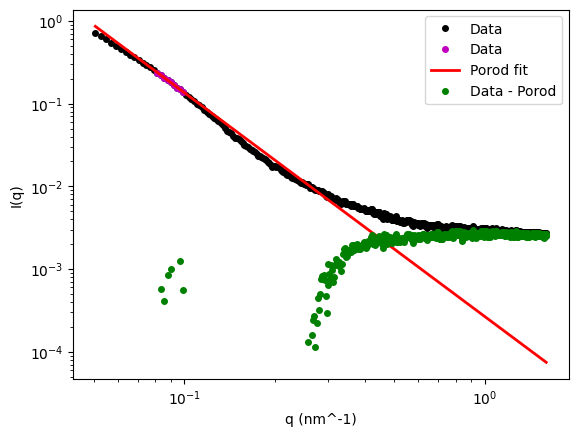

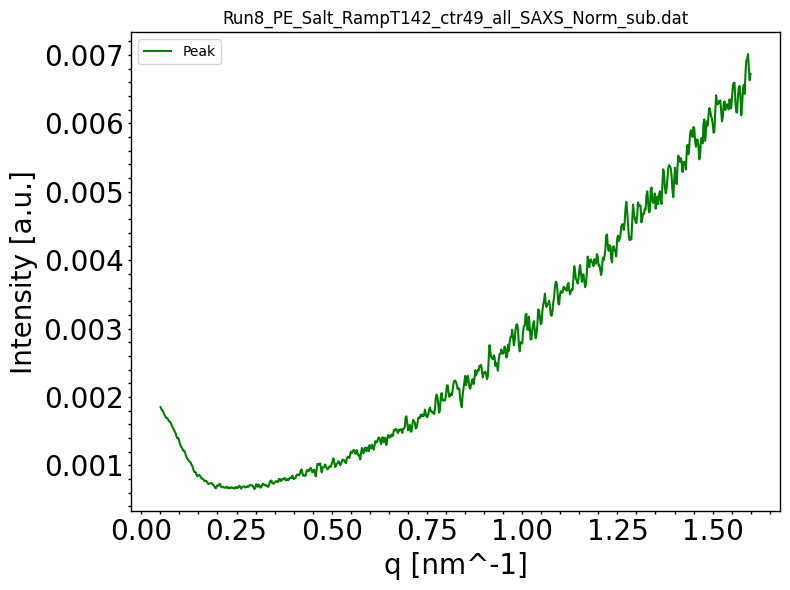


Processing keyword: _ctr50_
Found 1 files for keyword '_ctr50_'

Processing file: Run8_PE_Salt_RampT145_ctr50_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184884.08333333334, bstop=4.787109999999999, ctemp=144.52982999999998, I0=20.631236666666666
Data size after truncation: 704 points
Peak area: 0.007280486929251352 ± 5.368609479781641e-05


<Figure size 640x480 with 0 Axes>

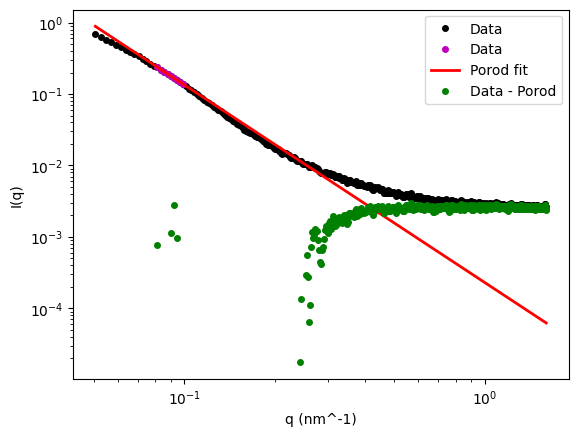

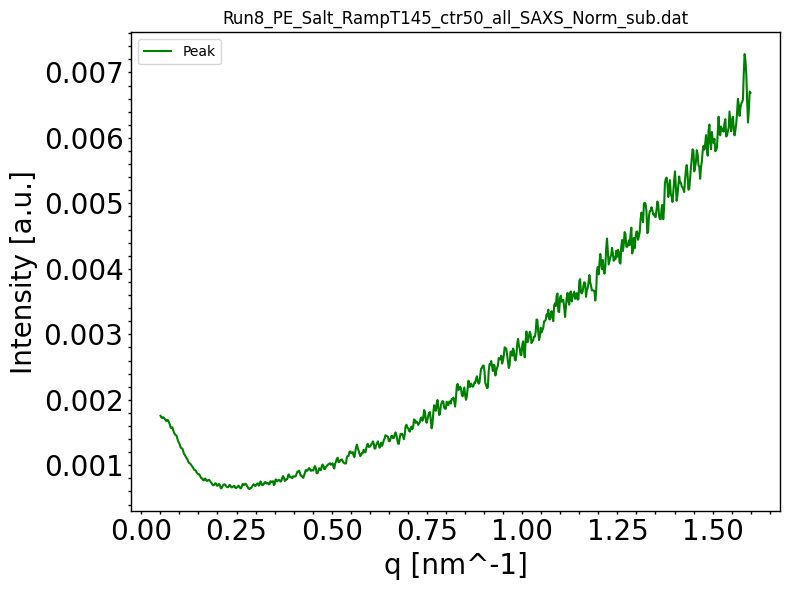


Processing keyword: _ctr51_
Found 1 files for keyword '_ctr51_'

Processing file: Run8_PE_Salt_RampT147_ctr51_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184987.80333333334, bstop=4.76737, ctemp=147.16616666666667, I0=20.506003333333336
Data size after truncation: 704 points
Peak area: 0.0071364531542601126 ± 5.379968667334933e-05


<Figure size 640x480 with 0 Axes>

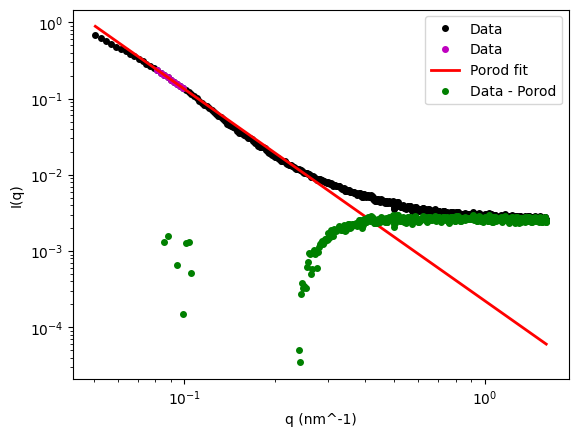

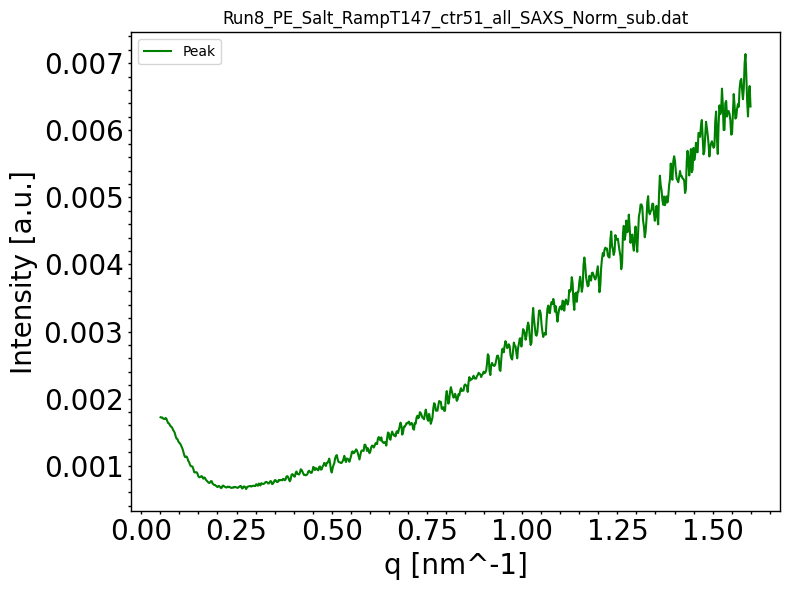


Processing keyword: _ctr52_
Found 1 files for keyword '_ctr52_'

Processing file: Run8_PE_Salt_RampT150_ctr52_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=185098.49, bstop=4.803986666666667, ctemp=149.5234966666667, I0=20.657776666666663
Data size after truncation: 704 points
Peak area: 0.006820503841722836 ± 5.315725875443128e-05


<Figure size 640x480 with 0 Axes>

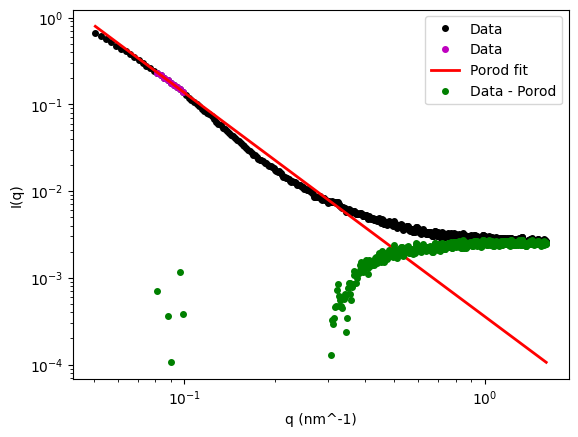

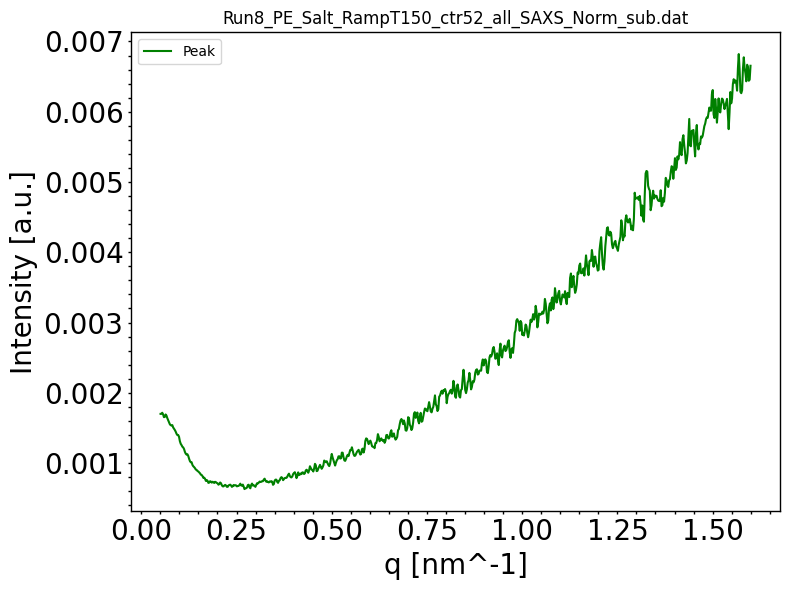


Processing keyword: _ctr53_
Found 1 files for keyword '_ctr53_'

Processing file: Run8_PE_Salt_RampT152_ctr53_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=185209.68000000002, bstop=4.79098, ctemp=152.02039666666667, I0=20.557466666666667
Data size after truncation: 704 points
Peak area: 0.0068796332612400925 ± 5.3304924658217375e-05


<Figure size 640x480 with 0 Axes>

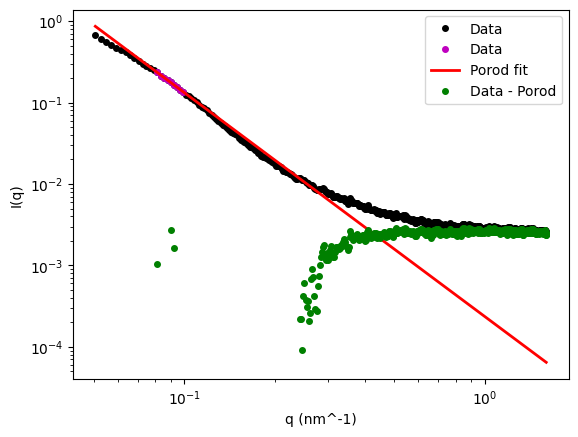

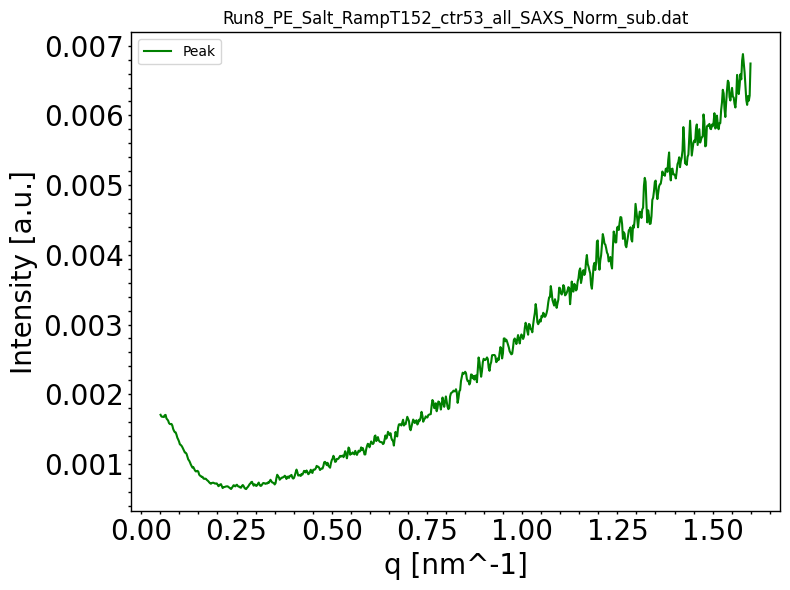


Processing keyword: _ctr54_
Found 1 files for keyword '_ctr54_'

Processing file: Run8_PE_Salt_RampT155_ctr54_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=185324.71666666667, bstop=4.7776266666666665, ctemp=154.50823000000003, I0=20.44184333333333
Data size after truncation: 704 points
Peak area: 0.006855140569628653 ± 5.3328319545723075e-05


<Figure size 640x480 with 0 Axes>

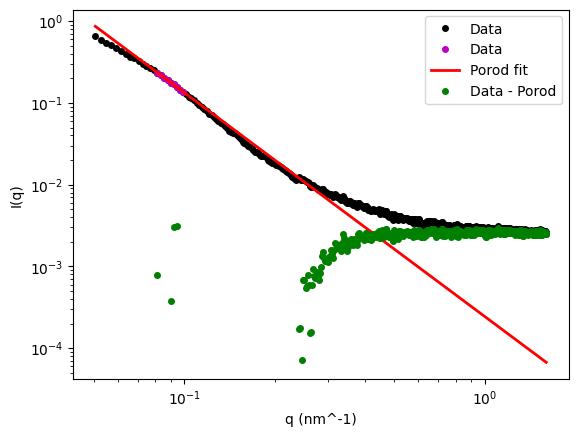

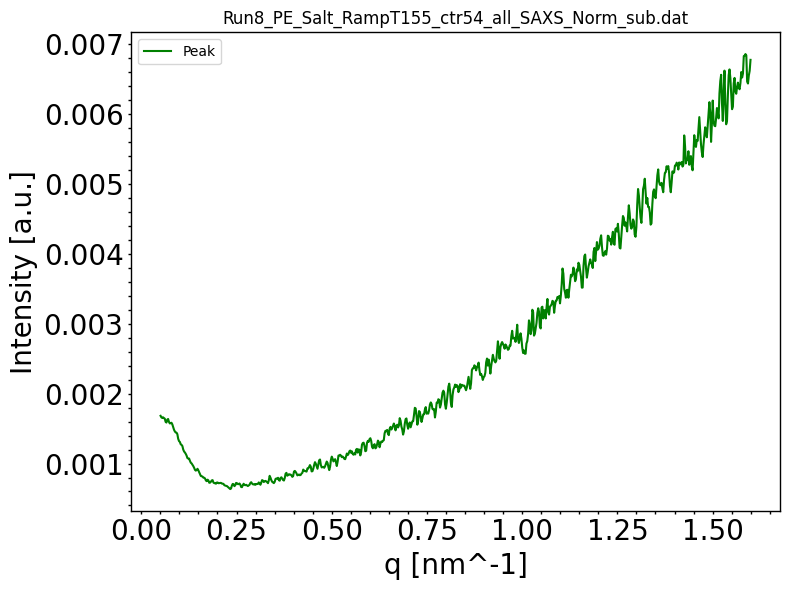


Processing keyword: _ctr55_
Found 1 files for keyword '_ctr55_'

Processing file: Run8_PE_Salt_RampT157_ctr55_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=185441.85333333336, bstop=4.817723333333333, ctemp=157.03063666666665, I0=20.627446666666668
Data size after truncation: 704 points
Peak area: 0.0069401623005307675 ± 5.264433770323797e-05


<Figure size 640x480 with 0 Axes>

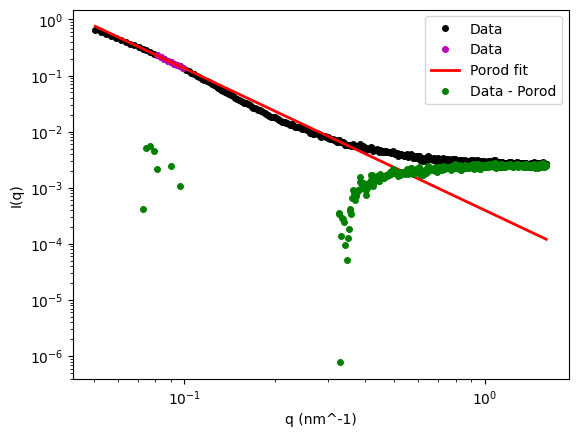

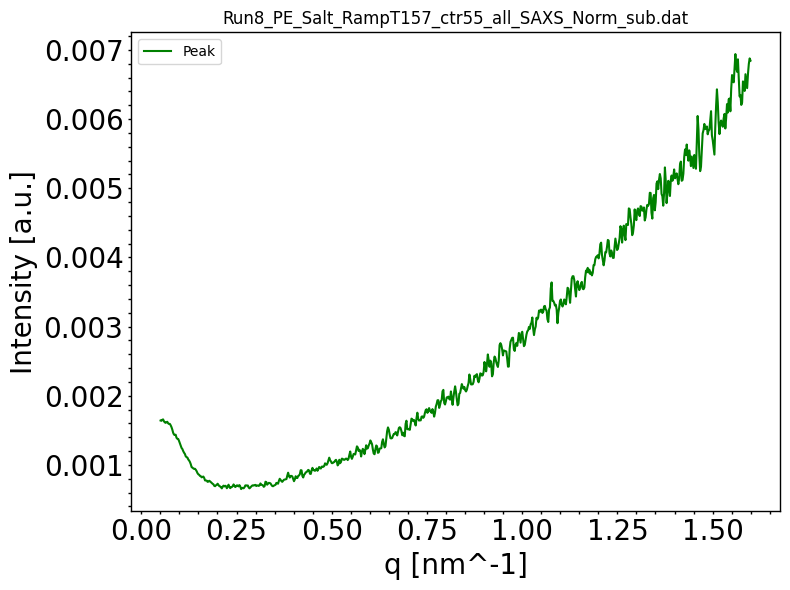


Processing keyword: _ctr56_
Found 1 files for keyword '_ctr56_'

Processing file: Run8_PE_Salt_RampT160_ctr56_all_SAXS_Norm_sub.dat
Metadata parsed successfully: Timer=185565.02000000002, bstop=4.797323333333333, ctemp=159.41039666666666, I0=20.501206666666665
Data size after truncation: 704 points
Peak area: 0.0070136130069088755 ± 5.319519510780802e-05


<Figure size 640x480 with 0 Axes>

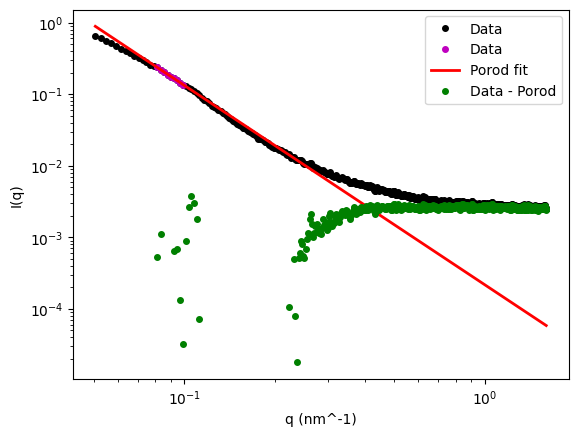

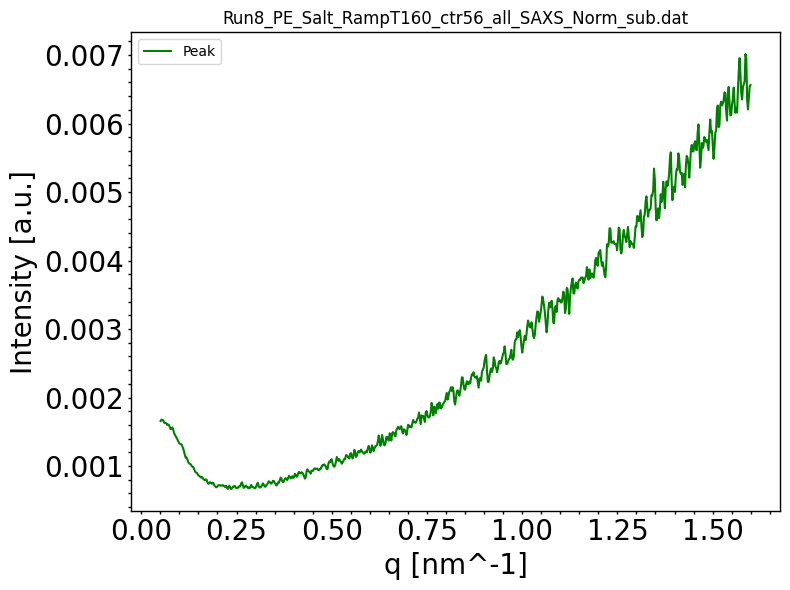

Lengths: filename=57, timer=57, CTEMP=57, I0=57, bstop=57, peak_pos=57, porod_exp=57, porod_scale=57, peak_area=57, peak_area_error=57


<Figure size 640x480 with 0 Axes>

In [116]:
# i want pair wise difference in fititng parameters from -1 to 1 for each keword give


for keyword in ['Run7_PE_RampT', 'Run6_PE_AcOH_RampT', 'Run8_PE_Salt_RampT']:#, 'Run6_PE100Water', 'Run8_PE100Water']:#, 'Run6_PE50Water', 'Run8_PE50Water', 'Run6_PE25Water', 'Run8_PE25Water']:
    #process_saxs_data(base_dir, keyword, [f'_ctr{str(i)}_' for i in range(0, 57)], model, display=True)
    process_saxs_data(base_dir, keyword, [f'_ctr{str(i)}_' for i in range(0, 57)],model, display=True)



#Run7_PE_RampT, 'Run6_PE_AcOH_RampT', 'Run8_PE_Salt_RampT'






# plot fitting parameters

# Merge Excel files

In [117]:
import pandas as pd
import os

# Path to the folder containing the .xlsx files
base_dir = '/Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/RT/RTSoak/OneD_integrated_SAXS_01'
save_SAXS_sub_files = os.path.join(base_dir, "Analysis/Fitting")
folder_path = save_SAXS_sub_files

# List all .xlsx files in the folder (sorted by filename)
xlsx_files = sorted([f for f in os.listdir(folder_path) if f.endswith(".xlsx")])

# List to store each file's DataFrame
merged_data_list = []

# Iterate through each Excel file and read the data
for file_name in xlsx_files:
    file_path = os.path.join(folder_path, file_name)
    try:
        df = pd.read_excel(file_path, engine='openpyxl')
        merged_data_list.append(df)
        print(f"Successfully loaded: {file_name}")
    except Exception as e:
        print(f"Error reading {file_name}: {e}")

# Merge all dataframes (preserving the same format) and save as a new Excel file
if merged_data_list:
    merged_df = pd.concat(merged_data_list, ignore_index=True)
    merged_file_path = os.path.join(folder_path, "merged_data.xlsx")
    #merged_df.to_excel(merged_file_path, index=False)
    print(f"Merged Excel file saved to: {merged_file_path}")
else:
    print("No Excel files were merged.")


Successfully loaded: Run5_PEAcOH3_poly_10s_03_T25_x14_dy1fitting_results.xlsx
Successfully loaded: Run5_PESalt3_poly_10s_03_T25_x0_dy1fitting_results.xlsx
Successfully loaded: Run7_PEAcOH3_poly_Solv_10s_03_T25_x14_dy1fitting_results.xlsx
Successfully loaded: Run7_PESalt3_poly_Solv_10s_03_T25_x0_dy1fitting_results.xlsx
Successfully loaded: Run9_34hr_PEAcOH3_poly_Solv_10s_03_T25_x14_dy1fitting_results.xlsx
Successfully loaded: Run9_34hr_PESalt3_poly_Solv_10s_03_T25_x0_dy1fitting_results.xlsx
Successfully loaded: merged_data.xlsx
Merged Excel file saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/RT/RTSoak/OneD_integrated_SAXS_01/Analysis/Fitting/merged_data.xlsx


# average

Processing file: Run7_PE_RampT160fitting_results.xlsx
Processing file: Run6_PE_AcOH_RampT160fitting_results.xlsx
Processing file: Run8_PE_Salt_RampT160fitting_results.xlsx


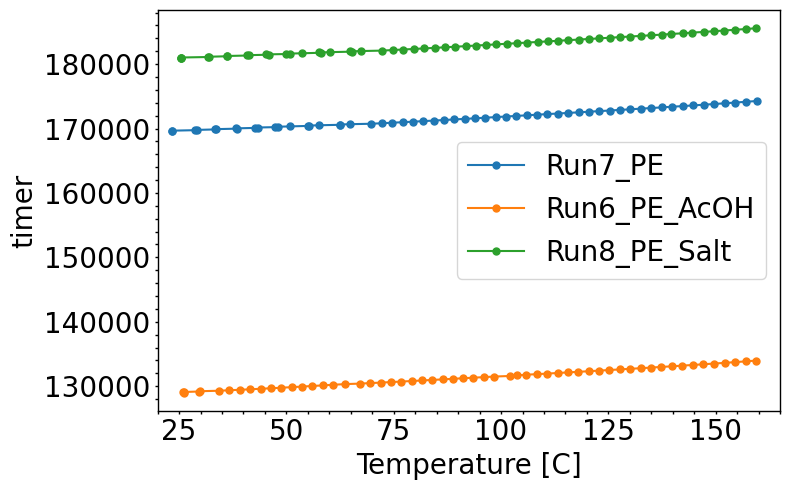

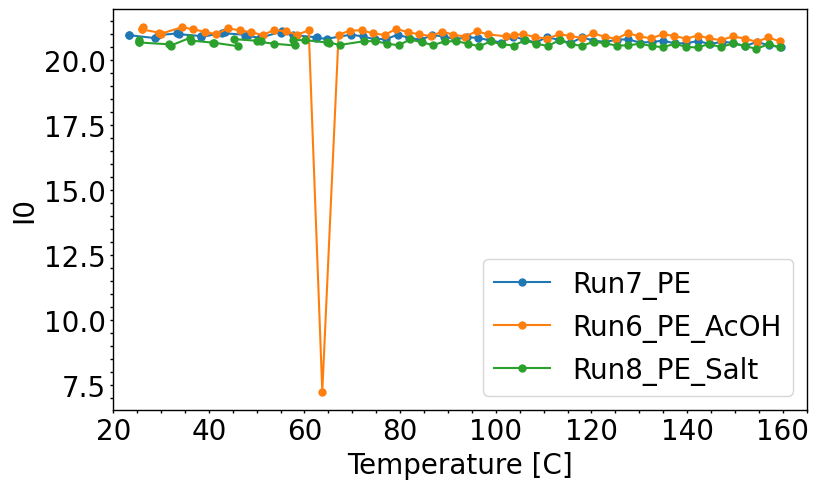

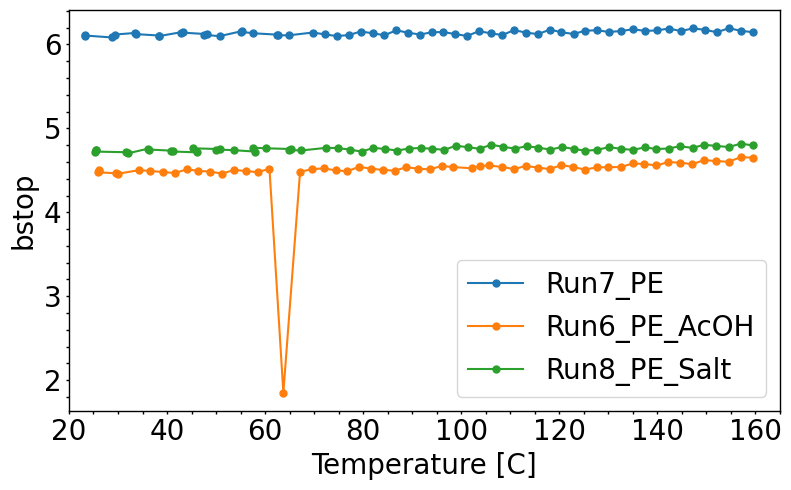

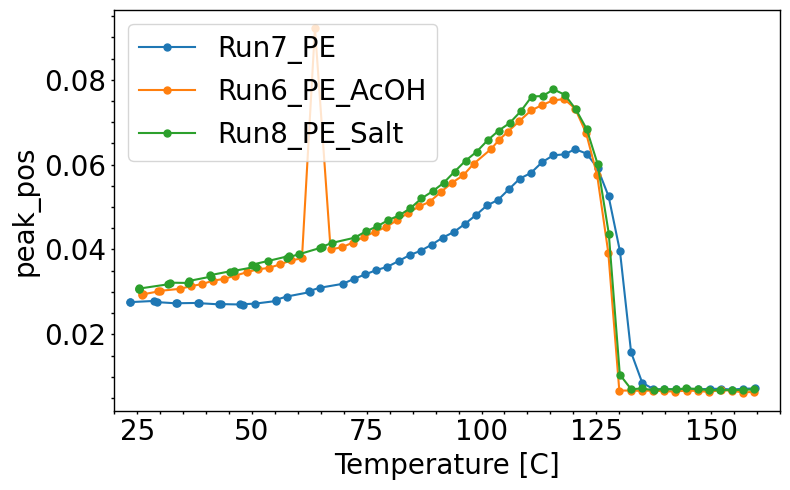

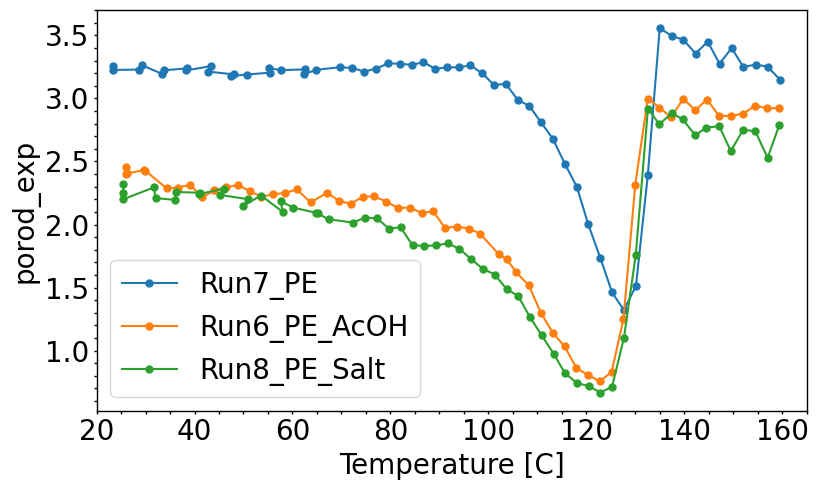

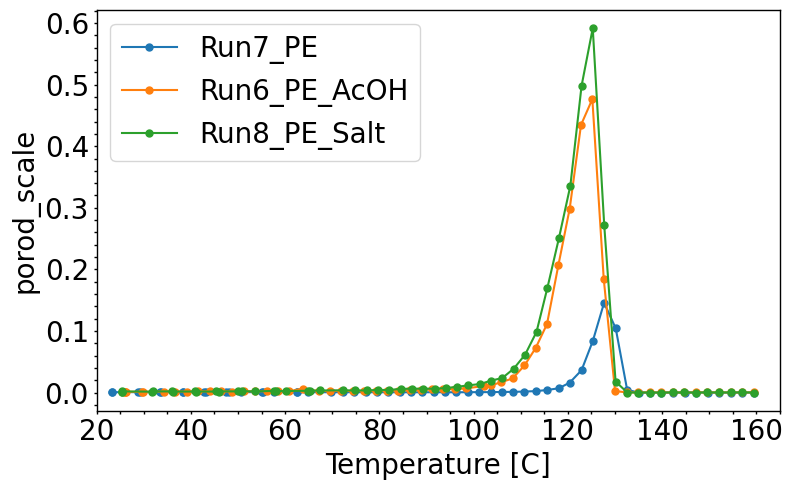

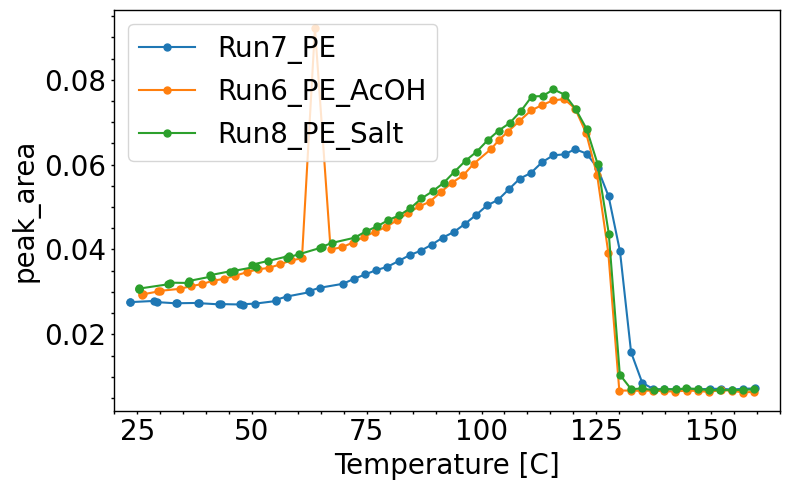

In [118]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import sys
import numpy as np

# Add custom Python libraries to sys.path (if necessary)
sys.path.append('/Users/akmaurya/Desktop/Python_library')
from SWAXS_functions.set_plot_style import set_plot_style

# Path to the folder containing the .xlsx files
base_dir = '/Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_SAXS_01'
folder_path = os.path.join(base_dir, "Analysis/Fitting")

# Column to use as x-axis
x_col = "CTEMP"

# List all .xlsx files in the folder
xlsx_files = sorted([f for f in os.listdir(folder_path) if f.endswith(".xlsx")])

# sort files Run7, Run6, Run8 keywords in the xlsx fileame
def custom_sort(file_name):
    keywords = ['Run7', 'Run6', 'Run8']
    keyword_found = next((kw for kw in keywords if kw in file_name), '')
    return keywords.index(keyword_found)

xlsx_files.sort(key=lambda x: custom_sort(x))

# more apealing colors
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
#colors = 

data_summary = {}

# Iterate through .xlsx files
for file_name in xlsx_files:
    file_path = os.path.join(folder_path, file_name)
    try:
        data = pd.read_excel(file_path, engine='openpyxl')
        print(f"Processing file: {file_name}")
    except Exception as e:
        print(f"Error reading {file_name}: {e}")
        continue
    
    if x_col not in data.columns:
        print(f"Warning: {x_col} not found in {file_name}. Skipping this file.")
        continue
    
    for col in data.columns:
        if col != x_col and 'error' not in col.lower():
            error_col = f"{col}_error"
            if data[col].dtype == 'O' or data[col].apply(lambda x: isinstance(x, str)).any():
                continue
            
            if col not in data_summary:
                data_summary[col] = []
            
            x_values = data[x_col].dropna()
            y_values = data[col].dropna()
            
            error_values = data[error_col].dropna() if error_col in data.columns else np.zeros_like(y_values)
            
            data_summary[col].append((x_values, y_values, error_values, file_name))

# Plot each parameter vs CTEMP with filenames as legend
for col, datasets in data_summary.items():
    fig, ax = plt.subplots(figsize=(8, 5))
    i =0 


    for x_values, y_values, error_values, filename in datasets:

        #normalize the y_values to first value
        #y_values = y_values/y_values.iloc[0]
        #error_values = error_values/y_values.iloc[0]


        
        label = filename.split('_RampT')[0]  # Use filename without extension as label
        ax.plot(x_values, y_values, 'o-', color = colors[i], label=label, markersize=5)

        #ax.errorbar(x_values, y_values, yerr=error_values, fmt='o-', color = colors[i], label=label, capsize=3)
        i+=1
    #ax.set_title(f"{col} vs {x_col}")
    ax.set_xlabel(x_col)
    ax.set_ylabel(col)
    ax.legend(fontsize=20, loc='best')#bbox_to_anchor=(1.05, 1))
    #ax.grid(True, linestyle='--', alpha=0.6)

    #ax.set_ylim(-1,100)
    ax.set_xlim(20, 165)
    
    set_plot_style(ax, 20, xlabel='Temperature [C]', ylabel=col)
    
    plt.tight_layout()
    #plt.savefig(os.path.join(folder_path, f"{col}_vs_{x_col}.png"), dpi=300, bbox_inches='tight')
    plt.show()


In [119]:
data_summary['peak_area']

[(0      23.338907
  1      23.338920
  2      28.724680
  3      29.292980
  4      33.402396
  5      33.710714
  6      38.407483
  7      38.284178
  8      43.308929
  9      42.773029
  10     48.113457
  11     47.458374
  12     50.734487
  13     55.344990
  14     55.148865
  15     57.565327
  16     62.552296
  17     62.430594
  18     64.807416
  19     69.753224
  20     72.222667
  21     74.645917
  22     77.098773
  23     79.500712
  24     81.918274
  25     84.335126
  26     86.746602
  27     89.124326
  28     91.568769
  29     94.011525
  30     96.336914
  31     98.754753
  32    101.174467
  33    103.587200
  34    106.001067
  35    108.354000
  36    110.746633
  37    113.213033
  38    115.622700
  39    118.100900
  40    120.388967
  41    122.896833
  42    125.280333
  43    127.678567
  44    130.148737
  45    132.571000
  46    135.003833
  47    137.442473
  48    139.825067
  49    142.329667
  50    144.796700
  51    147.222033
  52    149.

## next

## plot for the paper

# test code

# last